<div class="alert alert-block alert-info">
<center> <h1>  Case 2 - Siemens Smart Infrastructure </h1> </center> <br>
<center>  Montly Sales Forecast </center>

Developed by: Sophia , Mizinski

In [1]:
#!pip install pandas-profiling
#!pip install catboost
#pip install xgboost

In [1]:
# Packages
import os
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib import cm
import plotly.express as px
import seaborn as sns
from datetime import datetime
import math
import warnings
warnings.filterwarnings("ignore")
from pandas.api.types import CategoricalDtype
# from pandas_profiling import ProfileReport
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectFromModel
import pickle

In [2]:
# Global definitions
baseFolder = os.getcwd()
exportsFolder = baseFolder + os.sep +'Exports' + os.sep

# Source: professor's notebook

In [3]:
subPlots_Title_fontSize = 12
subPlots_xAxis_fontSize = 10
subPlots_yAxis_fontSize = 10
subPlots_label_fontSize = 10
heatmaps_text_fontSize = 8

plots_Title_fontSize = 14
plots_Title_textColour = 'black'

plots_Legend_fontSize = 12
plots_Legend_textColour = 'black'

plots_barTexts_fontSize = 8

# Source: professor's notebook

In [4]:
'''
# Generating a profile report to better explore the data
ProfileReport(  
    sales_data,    
    title='Sales Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
       "kendall": {"calculate": True},
        "phi_k": {"calculate": True},
        "cramers": {"calculate": True},
    },                 
)
'''

'\n# Generating a profile report to better explore the data\nProfileReport(  \n    sales_data,    \n    title=\'Sales Data\',\n    correlations={\n        "pearson": {"calculate": True},\n        "spearman": {"calculate": True},\n       "kendall": {"calculate": True},\n        "phi_k": {"calculate": True},\n        "cramers": {"calculate": True},\n    },                 \n)\n'

# Preparing Sales Data

## Daily Sales

Let's begin the analysis by loading the CSV sales file properly, ensuring that the decimal punctuation sign is a comma instead of a dot. 

In [6]:
# Load data 
df = pd.read_csv("Case2_Sales data.csv", sep=";", decimal=',')
df.head(10)

# Source: previous project notebook

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,#1,0.0
1,02.10.2018,#1,0.0
2,03.10.2018,#1,0.0
3,04.10.2018,#1,0.0
4,05.10.2018,#1,0.0
5,06.10.2018,#1,0.0
6,08.10.2018,#1,0.0
7,09.10.2018,#1,0.0
8,10.10.2018,#1,0.0
9,11.10.2018,#1,0.0


As usual, we'll conduct preliminary dataset inspection, aiming to identify inconsistencies in names and data types, pinpoint missing values, and generate descriptive statistics.

In [7]:
df.info()

# Source: previous project notebook

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   DATE        9802 non-null   object 
 1   Mapped_GCK  9802 non-null   object 
 2   Sales_EUR   9802 non-null   float64
dtypes: float64(1), object(2)
memory usage: 229.9+ KB


We notice that in this dataset there are negative sales. We believe this could be due to:
- returns and refunds;
- accounting errors in recording transactions;
- data anomalities or irregularities in the data collection process.

Either way, we will consider them as adjustments rather than true sales. Therefore, we will erase this values.

It's important to note that simply dropping rows where negative sales occur isn't sufficient. Even in cases where no product was sold, it should still be recorded in the table to maintain a continuous sales record.

Moreover, certain groups of products either sell more frequently or command higher unit prices, contributing significantly to overall revenue.

In [8]:
df.describe()

,Sales_EUR
count,9.802000e+03
mean,2.727857e+05
std,2.230789e+06
min,-5.063812e+05
25%,0.000000e+00
50%,0.000000e+00
75%,0.000000e+00
max,4.112799e+07


We will remove the "#" symbol from the product category names and then rename them to enhance their clarity and self-explanatory nature.

In [9]:
# Mappig Mapped_GCK values to GCK_number
df['Mapped_GCK'] = "GCK_"+ df['Mapped_GCK'].str.replace('#', '')

# Source: ChatGPT

In [10]:
# Setting all negative sales to zero
df.loc[df['Sales_EUR'] < 0, 'Sales_EUR'] = 0

# Source: ChatGPT

In [11]:
df.head(10)

,DATE,Mapped_GCK,Sales_EUR
0,01.10.2018,GCK_1,0.0
1,02.10.2018,GCK_1,0.0
2,03.10.2018,GCK_1,0.0
3,04.10.2018,GCK_1,0.0
4,05.10.2018,GCK_1,0.0
5,06.10.2018,GCK_1,0.0
6,08.10.2018,GCK_1,0.0
7,09.10.2018,GCK_1,0.0
8,10.10.2018,GCK_1,0.0
9,11.10.2018,GCK_1,0.0


By organizing sales data per product, it becomes easier to compare the performance of different products over time and even on the same day. Moreover, analyzing sales data by product will alow us to make more precise sales forecasting.

In [12]:
df.rename(columns={'DATE': 'Date'}, inplace=True)

# Pivoting to the desired format, columns as GCKs and values as Sales
df = df.pivot(index="Date",columns="Mapped_GCK",values="Sales_EUR")

# Reset index
df = df.reset_index()

In [13]:
df.head(10)

Mapped_GCK,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9
0,01.01.2019,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,NaN
1,01.01.2020,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01.01.2021,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01.01.2022,33522465.59,NaN,2798.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01.02.2019,31348710.18,NaN,34214.74,0.0,0.00,199.43,NaN,0.00,NaN,0.00,0.00,0.0,0.00,NaN
5,01.02.2020,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,01.02.2021,31128894.47,796013.22,109503.00,1408.8,2966.82,7472.00,80.0,6465279.36,7345.17,326287.25,8510594.25,410533.7,562077.57,1602.4
7,01.02.2022,32492828.27,0.00,11995.22,0.0,NaN,0.00,NaN,76095.60,NaN,0.00,0.00,NaN,23323.20,0.0
8,01.03.2019,29719518.22,0.00,10118.00,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.00,0.0,0.00,0.0
9,01.03.2020,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN


In [14]:
df.info()

# Source: previous project notebook

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1216 entries, 0 to 1215
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1216 non-null   object 
 1   GCK_1   1179 non-null   float64
 2   GCK_11  732 non-null    float64
 3   GCK_12  803 non-null    float64
 4   GCK_13  441 non-null    float64
 5   GCK_14  231 non-null    float64
 6   GCK_16  765 non-null    float64
 7   GCK_20  293 non-null    float64
 8   GCK_3   1017 non-null   float64
 9   GCK_36  434 non-null    float64
 10  GCK_4   877 non-null    float64
 11  GCK_5   959 non-null    float64
 12  GCK_6   794 non-null    float64
 13  GCK_8   944 non-null    float64
 14  GCK_9   333 non-null    float64
dtypes: float64(14), object(1)
memory usage: 142.6+ KB


We've noticed that sales are recorded for 14 groups of products on certain days, but it's crucial that sales data exists for all products every day, even if no sales were made to keep a continuous sales record. In such cases, a value of 0 must be imputed.


We can also see that there are dates missing because if we have data from October 2018 to April 2022, we should have a total of 1308 days not 1216 days.

In [15]:
# Check if there are any strange values and count the values in each column for all non-metric features
for col in df:
    print(df[col].value_counts())
    print()

# Source: previous project notebook

01.01.2019    1
21.03.2020    1
21.05.2021    1
21.05.2020    1
21.05.2019    1
             ..
11.02.2021    1
11.02.2020    1
11.02.2019    1
11.01.2022    1
31.12.2021    1
Name: Date, Length: 1216, dtype: int64

0.00          925
653182.22       1
672011.94       1
947327.33       1
1003245.47      1
             ... 
455.00          1
1620963.78      1
1085723.21      1
641951.40       1
1240578.53      1
Name: GCK_1, Length: 255, dtype: int64

0.00         587
131058.06      1
227910.00      1
487085.78      1
417601.10      1
            ... 
412037.00      1
3978.00        1
901891.80      1
394527.87      1
42199.00       1
Name: GCK_11, Length: 146, dtype: int64

0.00         638
5400.00        2
2798.00        1
77781.38       1
45945.00       1
            ... 
40705.00       1
133185.89      1
64430.00       1
112060.64      1
21184.34       1
Name: GCK_12, Length: 165, dtype: int64

0.00        303
1800.00       2
690.00        1
45547.20      1
601.80        1
          

In [16]:
df['Date'] = pd.to_datetime(df['Date'], format='%d.%m.%Y')

# Create a date range from October 2018 to April 2022
date_range = pd.date_range(start='2018-10-01', end='2022-04-30')

# Convert to DataFrame
full_date_range_df = pd.DataFrame(date_range, columns=['Date'])

# Set 'Date' column as index for both DataFrames
df.set_index('Date', inplace=True)
full_date_range_df.set_index('Date', inplace=True)

# Merge the original DataFrame with the full date range DataFrame
merged_df = full_date_range_df.merge(df, left_index=True, right_index=True, how='left')

# Fill NaN values with 0
merged_df.fillna(0, inplace=True)

# Reset index
merged_df.reset_index(inplace=True)

# Check if there are any strange values and count the values in each column for all non-metric features
for col in merged_df:
    print(merged_df[col].value_counts())
    print()

# Source: previous project notebook

2018-10-01    1
2021-02-06    1
2021-02-24    1
2021-02-23    1
2021-02-22    1
             ..
2019-12-09    1
2019-12-08    1
2019-12-07    1
2019-12-06    1
2022-04-30    1
Name: Date, Length: 1308, dtype: int64

0.00           1054
655018.49         1
455.00            1
1372096.95        1
31128894.47       1
               ... 
5622.96           1
89959.63          1
913700.76         1
30568295.80       1
692282.42         1
Name: GCK_1, Length: 255, dtype: int64

0.00          1163
1336069.00       1
246480.00        1
42542.35         1
765306.48        1
              ... 
218533.98        1
133460.77        1
747063.00        1
531482.62        1
752625.00        1
Name: GCK_11, Length: 146, dtype: int64

0.00        1143
5400.00        2
90726.13       1
4196.00        1
59184.00       1
            ... 
12501.00       1
52348.00       1
20400.00       1
11406.00       1
31010.00       1
Name: GCK_12, Length: 165, dtype: int64

0.00        1170
1800.00        2
13664.60    

In [17]:
#Check for missing values
merged_df.isnull().sum()

Date      0
GCK_1     0
GCK_11    0
GCK_12    0
GCK_13    0
GCK_14    0
GCK_16    0
GCK_20    0
GCK_3     0
GCK_36    0
GCK_4     0
GCK_5     0
GCK_6     0
GCK_8     0
GCK_9     0
dtype: int64

Now, everything was corrected and the missing values taken care of (since they were, in fact, representing no sales).

In [18]:
# Summary statistics for all variables
merged_df.describe(include='all').T

# Source: previous project notebook

,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
Date,1308,1308,2018-10-01,1,2018-10-01,2022-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GCK_1,1308.0,NaN,NaT,NaN,NaT,NaT,1182539.07146,5782684.64721,0.0,0.0,0.0,0.0,41127988.02
GCK_11,1308.0,NaN,NaT,NaN,NaT,NaT,50779.853234,228656.87747,0.0,0.0,0.0,0.0,3376944.52
GCK_12,1308.0,NaN,NaT,NaN,NaT,NaT,6341.723303,24778.842903,0.0,0.0,0.0,0.0,267025.9
GCK_13,1308.0,NaN,NaT,NaN,NaT,NaT,771.67432,3666.624599,0.0,0.0,0.0,0.0,49418.15
GCK_14,1308.0,NaN,NaT,NaN,NaT,NaT,387.588387,3374.08855,0.0,0.0,0.0,0.0,76161.44
GCK_16,1308.0,NaN,NaT,NaN,NaT,NaT,14281.05117,136801.427925,0.0,0.0,0.0,0.0,4310721.63
GCK_20,1308.0,NaN,NaT,NaN,NaT,NaT,59.913219,437.815378,0.0,0.0,0.0,0.0,7355.75
GCK_3,1308.0,NaN,NaT,NaN,NaT,NaT,408751.31552,1136084.561074,0.0,0.0,0.0,0.0,13793799.97
GCK_36,1308.0,NaN,NaT,NaN,NaT,NaT,773.700061,7321.924277,0.0,0.0,0.0,0.0,204800.55


A copy of the already adjusted dataset is created before moving forward to feature engineering.

In [19]:
agg_df = merged_df.copy()

In [20]:
agg_df.tail(10)

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9
1298,2022-04-21,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
1299,2022-04-22,1047080.59,0.00,63625.0,0.0,0.0,43088.08,0.0,1386629.4,0.00,61395.82,713387.61,9414.08,293819.05,1632.0
1300,2022-04-23,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
1301,2022-04-24,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
1302,2022-04-25,0.00,0.00,0.0,0.0,0.0,624.51,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
1303,2022-04-26,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
1304,2022-04-27,954169.29,39226.25,46742.0,2000.0,0.0,506.50,2188.0,3888224.0,232.47,85584.36,6780279.74,360.00,430877.77,0.0
1305,2022-04-28,0.00,0.00,0.0,0.0,0.0,5050.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0
1306,2022-04-29,692282.42,752625.00,31010.0,738.0,0.0,0.00,0.0,1786755.0,885.00,27925.71,744879.61,299306.35,355389.32,1653.0
1307,2022-04-30,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0


Following, we will break down dates into separate components to allow us to examine trends, seasonality, trends and cyclical patterns in sales at different levels of time granularity (e.g., monthly, weekly, daily).

In [21]:
# Create new columns for day, month, and year
agg_df['Day'] = agg_df['Date'].dt.day
agg_df['Month'] = agg_df['Date'].dt.month
agg_df['Year'] = agg_df['Date'].dt.year

# Create a new column for weekday
agg_df['Weekday'] = agg_df['Date'].dt.day_name()

# Display the updated DataFrame
print(agg_df)

#Source: chatgpt

           Date      GCK_1     GCK_11   GCK_12  GCK_13  GCK_14  GCK_16  \
0    2018-10-01       0.00       0.00      0.0     0.0     0.0     0.0   
1    2018-10-02       0.00       0.00      0.0     0.0     0.0     0.0   
2    2018-10-03       0.00       0.00      0.0     0.0     0.0     0.0   
3    2018-10-04       0.00       0.00      0.0     0.0     0.0     0.0   
4    2018-10-05       0.00       0.00      0.0     0.0     0.0     0.0   
...         ...        ...        ...      ...     ...     ...     ...   
1303 2022-04-26       0.00       0.00      0.0     0.0     0.0     0.0   
1304 2022-04-27  954169.29   39226.25  46742.0  2000.0     0.0   506.5   
1305 2022-04-28       0.00       0.00      0.0     0.0     0.0  5050.0   
1306 2022-04-29  692282.42  752625.00  31010.0   738.0     0.0     0.0   
1307 2022-04-30       0.00       0.00      0.0     0.0     0.0     0.0   

      GCK_20      GCK_3  GCK_36     GCK_4       GCK_5      GCK_6      GCK_8  \
0        0.0        0.0    0.00 

Let's check if Siemens sell items on weekends (if not there's no point in keeping those rows).

It seems there are sales at weekends. Weekends are typically when many people have more free time, as they are off work, and since Siemens can also sell equipments to individual consumers from third parties, and those stores might be open at weekends since many consumers prefer to do their shopping on weekends.

In [22]:
saturday_sales_unique = agg_df[agg_df['Weekday'] == 'Saturday']['GCK_1'].unique()
print(saturday_sales_unique)

# Source: ChatGPT

[0.00000000e+00 1.40801500e+04 3.44873894e+07 3.35224656e+07]


In [23]:
sunday_sales_unique = agg_df[agg_df['Weekday'] == 'Sunday']['GCK_1'].unique()
print(sunday_sales_unique)

# Source: ChatGPT

[0.00000000e+00 5.62296000e+03 3.17894226e+07]


We will establish a variable to indicate the status of National Holidays, as it's a recurring pattern to refrain from selling products on certain or all holidays.

In [24]:
# Define the list of national holidays in Germany with year information
national_holidays = [
    (2018, 12, 25),  # 25th December
    (2018, 12, 26),  # 26th December
    (2018, 10, 3),   # 3rd October
    (2019, 12, 25),  # 25th December
    (2019, 12, 26),  # 26th December
    (2019, 1, 1),    # 1st January
    (2019, 4, 19),   # Good Friday in 2019
    (2019, 4, 22),   # Easter Monday in 2019
    (2019, 5, 1),    # 1st May
    (2019, 10, 3),   # 3rd October
    (2020, 12, 25),  # 25th December
    (2020, 12, 26),  # 26th December
    (2020, 1, 1),    # 1st January
    (2020, 4, 10),   # Good Friday in 2020
    (2020, 4, 13),   # Easter Monday in 2020
    (2020, 5, 1),    # 1st May
    (2020, 10, 3),   # 3rd October
    (2021, 12, 25),  # 25th December
    (2021, 12, 26),  # 26th December
    (2021, 1, 1),    # 1st January
    (2021, 4, 2),    # Good Friday in 2021
    (2021, 4, 5),    # Easter Monday in 2021
    (2021, 5, 1),    # 1st May
    (2021, 10, 3),   # 3rd October
    (2022, 1, 1),    # 1st January
    (2022, 4, 15),   # Good Friday in 2022
    (2022, 4, 18),    # Easter Monday in 2022
]

# Create a new column for holiday status
agg_df['Holiday_Status'] = 'Regular Day'  # Initialize with Regular Day

# Update the holiday status column for national holidays
for year, month, day in national_holidays:
    agg_df.loc[(agg_df['Year'] == year) & (agg_df['Month'] == month) & (agg_df['Day'] == day), 'Holiday_Status'] = 'National Holiday'

print(agg_df)


# Source: ChatGPT

           Date      GCK_1     GCK_11   GCK_12  GCK_13  GCK_14  GCK_16  \
0    2018-10-01       0.00       0.00      0.0     0.0     0.0     0.0   
1    2018-10-02       0.00       0.00      0.0     0.0     0.0     0.0   
2    2018-10-03       0.00       0.00      0.0     0.0     0.0     0.0   
3    2018-10-04       0.00       0.00      0.0     0.0     0.0     0.0   
4    2018-10-05       0.00       0.00      0.0     0.0     0.0     0.0   
...         ...        ...        ...      ...     ...     ...     ...   
1303 2022-04-26       0.00       0.00      0.0     0.0     0.0     0.0   
1304 2022-04-27  954169.29   39226.25  46742.0  2000.0     0.0   506.5   
1305 2022-04-28       0.00       0.00      0.0     0.0     0.0  5050.0   
1306 2022-04-29  692282.42  752625.00  31010.0   738.0     0.0     0.0   
1307 2022-04-30       0.00       0.00      0.0     0.0     0.0     0.0   

      GCK_20      GCK_3  GCK_36     GCK_4       GCK_5      GCK_6      GCK_8  \
0        0.0        0.0    0.00 

We've observed sales occurring on some national holidays; however, we've identified that no sales will take place on December 25th, December 26th, October 3rd, and Easter Monday.

In [25]:
# Filter rows where holiday_status is "National Holiday"
national_holidays_df = agg_df[agg_df['Holiday_Status'] == 'National Holiday']

# Group by date and sum the sales contained in columns that start with 'GCK'
sales_sum = national_holidays_df.groupby('Date').apply(lambda x: x.filter(like='GCK').sum(axis=1))

print("Total sales on National Holidays in GCK columns:", sales_sum)

# Source: ChatGPT

Total sales on National Holidays in GCK columns: Date            
2018-10-03  2              0.00
2018-12-25  85             0.00
2018-12-26  86             0.00
2019-01-01  92             0.00
2019-04-19  200            0.00
2019-04-22  203            0.00
2019-05-01  212            0.00
2019-10-03  367            0.00
2019-12-25  450            0.00
2019-12-26  451            0.00
2020-01-01  457            0.00
2020-04-10  557      3399437.08
2020-04-13  560            0.00
2020-05-01  578            0.00
2020-10-03  733            0.00
2020-12-25  816            0.00
2020-12-26  817            0.00
2021-01-01  823            0.00
2021-04-02  914            0.00
2021-04-05  917            0.00
2021-05-01  943     34508130.60
2021-10-03  1098           0.00
2021-12-25  1181           0.00
2021-12-26  1182           0.00
2022-01-01  1188    33525263.59
2022-04-15  1292     3608702.75
2022-04-18  1295           0.00
dtype: float64


Let's remove these dates from the dataset since we can confidently say that no sales will occur on these days.

In [26]:
# Filter out records for the 3rd of October, 25th of December, 26th of December, and additional days
agg_df = agg_df[
    ~((agg_df['Month'] == 10) & (agg_df['Day'] == 3)) &
    ~((agg_df['Month'] == 12) & ((agg_df['Day'] == 25) | (agg_df['Day'] == 26))) &
    ~((agg_df['Year'] == 2019) & (agg_df['Month'] == 4) & (agg_df['Day'] == 22)) &  # Easter Monday 2019
    ~((agg_df['Year'] == 2020) & (agg_df['Month'] == 4) & (agg_df['Day'] == 13)) &  # Easter Monday 2020
    ~((agg_df['Year'] == 2021) & (agg_df['Month'] == 4) & (agg_df['Day'] == 5)) &   # Easter Monday 2021
    ~((agg_df['Year'] == 2022) & (agg_df['Month'] == 4) & (agg_df['Day'] == 18))    # Easter Monday 2022
]

# Reset index if needed
agg_df.reset_index(drop=True, inplace=True)

# Source: ChatGPT

We will create a new variable to aggregate the total amount of sales per day, regarless of the product. By aggregating sales across all products on a daily basis, we can identify overall sales trends and patterns. For example, we may observe spikes in sales during certain months or days of the week. Also, total daily sales data can help identify outliers or unusual events that impact overall sales performance. 

In [27]:
agg_df['Total Sales'] = agg_df.filter(regex='^GCK').sum(axis=1)

agg_df.tail(10)

# Source: ChatGPT

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,...,GCK_5,GCK_6,GCK_8,GCK_9,Day,Month,Year,Weekday,Holiday_Status,Total Sales
1282,2022-04-21,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,21,4,2022,Thursday,Regular Day,0.00
1283,2022-04-22,1047080.59,0.00,63625.0,0.0,0.0,43088.08,0.0,1386629.4,0.00,...,713387.61,9414.08,293819.05,1632.0,22,4,2022,Friday,Regular Day,3620071.63
1284,2022-04-23,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,23,4,2022,Saturday,Regular Day,0.00
1285,2022-04-24,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,24,4,2022,Sunday,Regular Day,0.00
1286,2022-04-25,0.00,0.00,0.0,0.0,0.0,624.51,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,25,4,2022,Monday,Regular Day,624.51
1287,2022-04-26,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,26,4,2022,Tuesday,Regular Day,0.00
1288,2022-04-27,954169.29,39226.25,46742.0,2000.0,0.0,506.50,2188.0,3888224.0,232.47,...,6780279.74,360.00,430877.77,0.0,27,4,2022,Wednesday,Regular Day,12230390.38
1289,2022-04-28,0.00,0.00,0.0,0.0,0.0,5050.00,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,28,4,2022,Thursday,Regular Day,5050.00
1290,2022-04-29,692282.42,752625.00,31010.0,738.0,0.0,0.00,0.0,1786755.0,885.00,...,744879.61,299306.35,355389.32,1653.0,29,4,2022,Friday,Regular Day,4693449.41
1291,2022-04-30,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,...,0.00,0.00,0.00,0.0,30,4,2022,Saturday,Regular Day,0.00


In [28]:
agg_df.shape

(1292, 21)

In [29]:
# Check if there are any strange values and count the values in each column for all non-metric features
for col in agg_df:
    print(agg_df[col].value_counts())
    print()

# Source: previous project notebook

2018-10-01    1
2021-03-18    1
2021-02-24    1
2021-02-23    1
2021-02-22    1
             ..
2019-12-09    1
2019-12-08    1
2019-12-07    1
2019-12-06    1
2022-04-30    1
Name: Date, Length: 1292, dtype: int64

0.00           1038
655018.49         1
455.00            1
1372096.95        1
31128894.47       1
               ... 
5622.96           1
89959.63          1
913700.76         1
30568295.80       1
692282.42         1
Name: GCK_1, Length: 255, dtype: int64

0.00          1147
1336069.00       1
246480.00        1
42542.35         1
765306.48        1
              ... 
218533.98        1
133460.77        1
747063.00        1
531482.62        1
752625.00        1
Name: GCK_11, Length: 146, dtype: int64

0.00        1127
5400.00        2
90726.13       1
4196.00        1
59184.00       1
            ... 
12501.00       1
52348.00       1
20400.00       1
11406.00       1
31010.00       1
Name: GCK_12, Length: 165, dtype: int64

0.00        1154
1800.00        2
13664.60    

### Data Visualization

#### Daily Sales

We will start by inspecting the data adjusted regarding sales.

First, we will see how sales are distributed across different years. We expect to visualy assess seasonality, sales peaks at the same time in different years, and long-term trends in sales performance, but also to reflect broader market trends and economic conditions, such as COVID-19 effect.

Sales show pretty similar trends. We can identify more or less the same spikes in sales and generated approximately the same revenue (considering that in 2018 and 2022, we only have data from the last three and first four months of the respective years).

It is curious that we find a sales peak around the end of the previous month and/or the first day of the following month. We can find some possible explanations for this:
- Siemens may offer clearance sales or discounts at the end of the month to clear out excess inventory and make room for new merchandise;
- Siemens may schedule promotions, discounts, or special offers to coincide with the end or beginning of the month to stimulate sales;
- Clients may budget their expenses on a monthly basis and allocate funds for discretionary purchases towards the end or beginning of the month.  

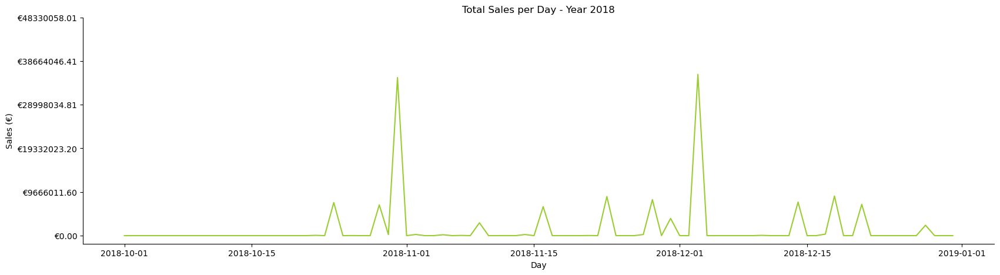

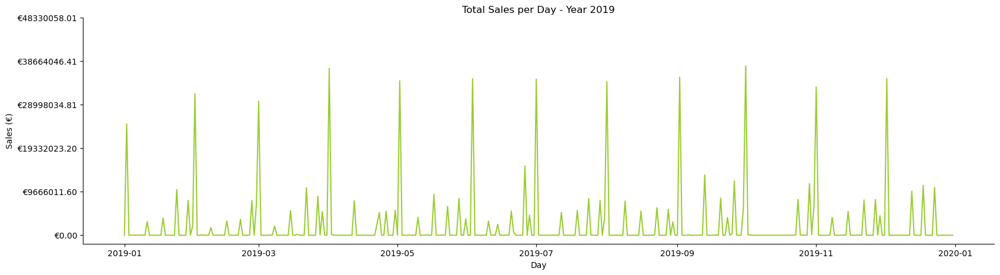

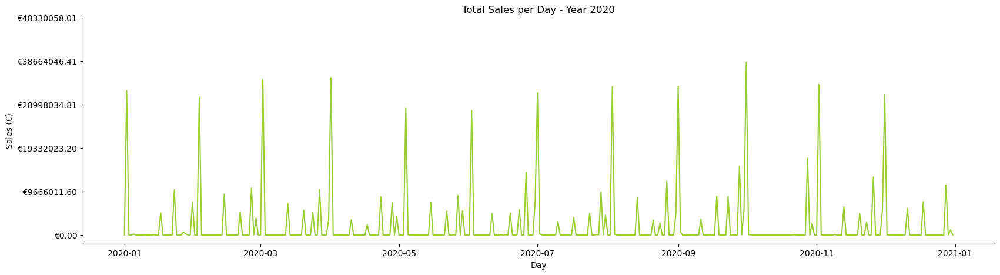

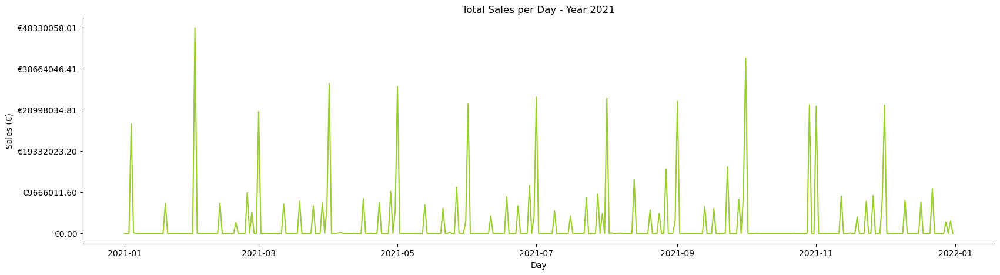

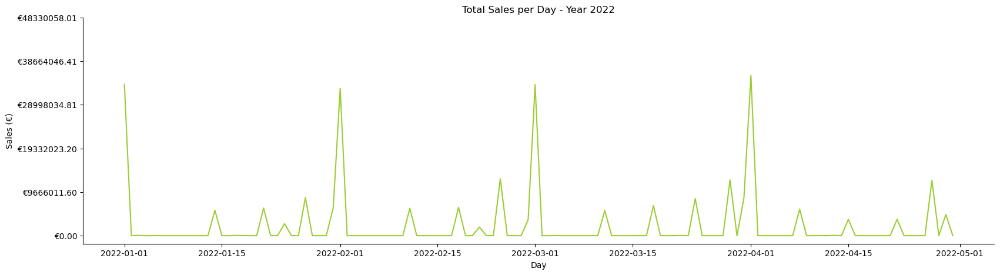

In [30]:
# Compute the minimum and maximum values of the 'Sales (€)' column
sales_min = agg_df['Total Sales'].min()
sales_max = agg_df['Total Sales'].max()

# Generate 5 equally spaced levels between the minimum and maximum values
y_ticks = np.linspace(sales_min, sales_max, num=6)
# Format the tick labels as desired
y_tick_labels = ['€{:.2f}'.format(val) for val in y_ticks]

# Group data by year
grouped = agg_df.groupby('Year')

# Plotting one graph per year
for year, group in grouped:
    fig, ax = plt.subplots(figsize=(20,5))
    ax.plot(group['Date'], group['Total Sales'], color='yellowgreen')
    ax.grid(False)

    # Set the x-axis tick formatter to show only years
    # ax.xaxis.set_major_formatter(years_fmt)
    ax.set_xlabel('Day')
    ax.set_ylabel('Sales (€)')
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_tick_labels)
    ax.set_title('Total Sales per Day - Year {}'.format(year))

    sns.despine()
    plt.show()

Siemens tends to sell the most products on Mondays and Fridays, with noticeably fewer sales on weekends.

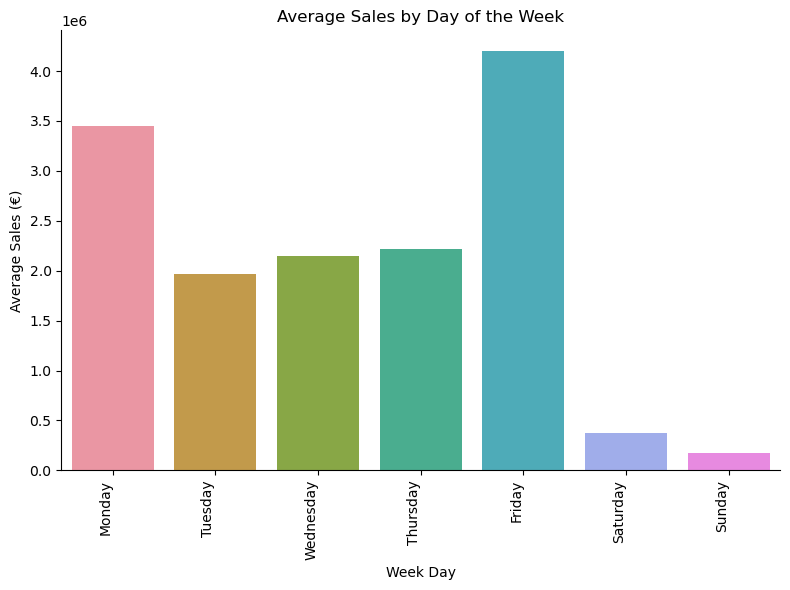

In [31]:
# Aggregating the sales by day of the week
sales_dayweek_agg=agg_df.groupby(('Weekday'))['Total Sales'].mean(numeric_only=True)

# Define the desired order of the days of the week
desired_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reindex the DayWeek variable with the desired order of the days of the week
sales_dayweek_agg = sales_dayweek_agg.reindex(desired_order)

# Define a custom color palette with only "yellowgreen"
custom_palette = sns.color_palette(["yellowgreen"])

# Set the custom color palette
sns.set_palette(custom_palette)

# Create bar chart
plt.figure(figsize=(8,6))
sns.barplot(x=sales_dayweek_agg.index, y=sales_dayweek_agg.values)
plt.xlabel('Week Day')
plt.ylabel('Average Sales (€)')
plt.title('Average Sales by Day of the Week')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()

sns.despine()
plt.show()

- 2022 had higher sales compared to recent years. This may be justifiable by the end of a huge projects, like the instalation of fluorine gas-free, medium-voltage switchgear NXPLUS C 24 blue GIS at Iberdrola, Spain;
- 2020 seems to be the higher with overall lower sales probably due to COVID-19 lockdowns and stopped production and shipment of products;
- 2018 register the lower revenue that can be possibly explained by currency translation effects (Siemens was receiving less new orders/bookings for what it was currently billing for, compared to previous years).

*Source: Siemens press releasers and Quarter Results FY from 2018 to 2022*

In [32]:
# Total Sales Per Month and its difference by Year
# Create a 'Year' and 'Month' column from 'Date'
agg_df['Year'] = agg_df['Date'].dt.year
agg_df['Month'] = agg_df['Date'].dt.month_name()

# Define the desired order of the months
month_order = CategoricalDtype([
    'January', 'February', 'March', 'April', 'May', 'June', 
    'July', 'August', 'September', 'October', 'November', 'December'
], ordered=True)

# Assign the categorical order for 'Month'
agg_df['Month'] = agg_df['Month'].astype(month_order)

# Group by 'Year' and 'Month' and sum the 'Total_Sales'
sales_monthly_agg = agg_df.groupby(["Year", "Month"])['Total Sales'].sum().reset_index()

# Create the line plot using Plotly
fig = px.line(sales_monthly_agg, x="Month", y="Total Sales", color="Year",
              title="Total Sales Per Month and its difference by Year")

# Set white background
fig.update_layout({
    'plot_bgcolor': 'white',
    'paper_bgcolor': 'white'
})

# Show the plot
fig.show()

From the graph of Total Sales per Month we can notice a different patten in 2020 around April and June most likely due to Covid-19. Moreover, there is an increase in sales during September which is likely to be due to the end of the Siemens corporate year when employees rush to sell the remaing products and garantee the sales objectives.

Now, we will inspect daily sales per product to see if some anomality stand out and to analyse trends in data.

Product group 1 sales are the highest by far on the first day of each month. Maybe it is some sort of product that is sold on a subscription-based or they are typically adjusted in the beggining of a new fiscal year.

Sales of products in groups 3, 4, 5, 6 and 8 typically peak during the final days of each month. These products are either high-ticket items or frequently sought-after. Customers tend to make purchases towards the end of the month, possibly coinciding with receipt of their wages or planned investments by companies.

Sales for certain product groups either exhibit consistently low figures or maintain a steady revenue stream throughout the days.

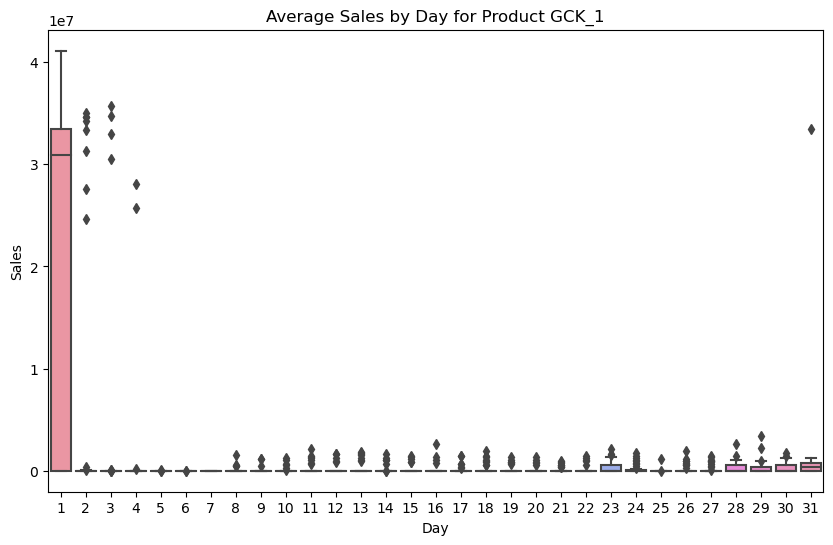

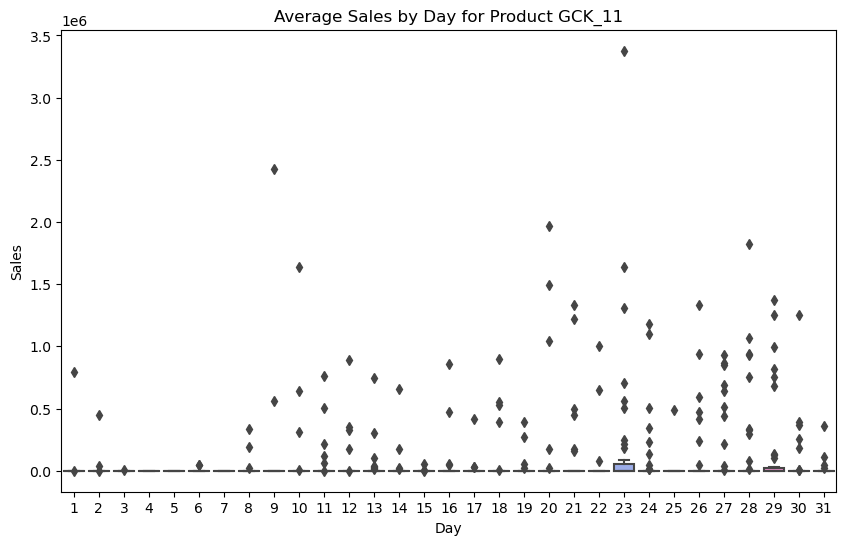

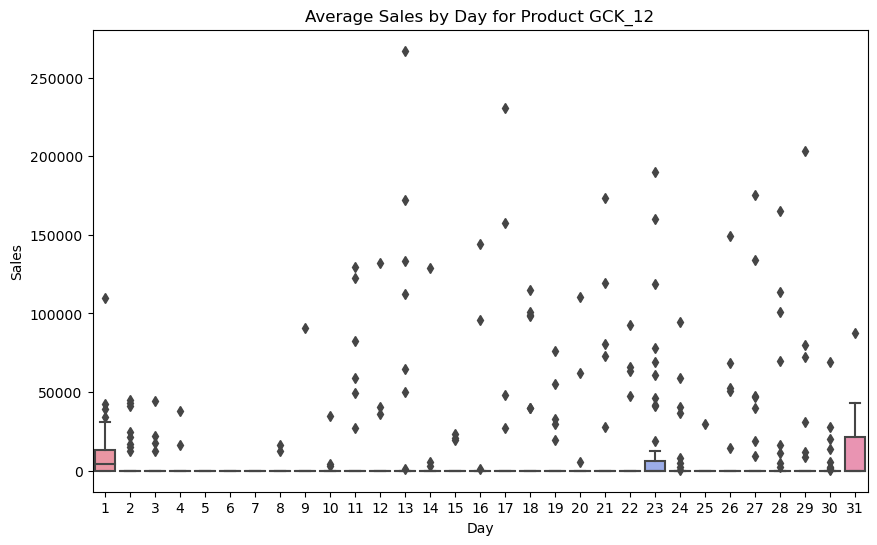

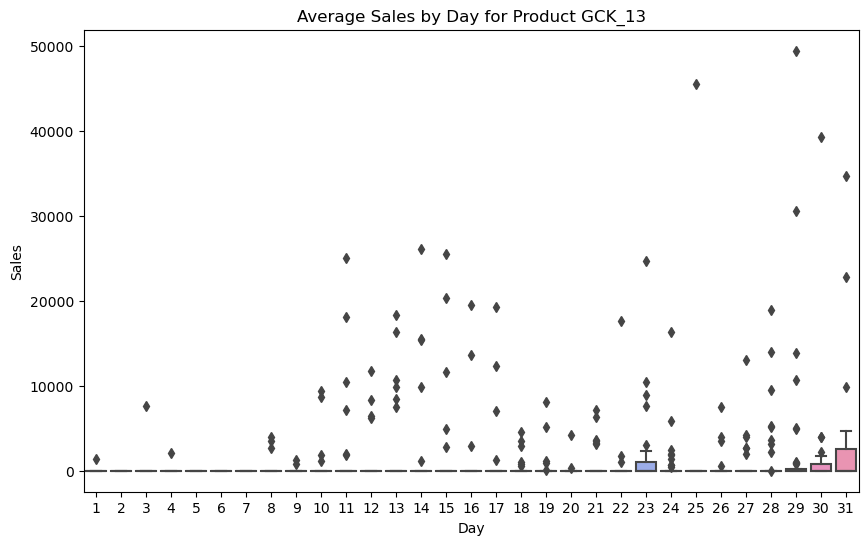

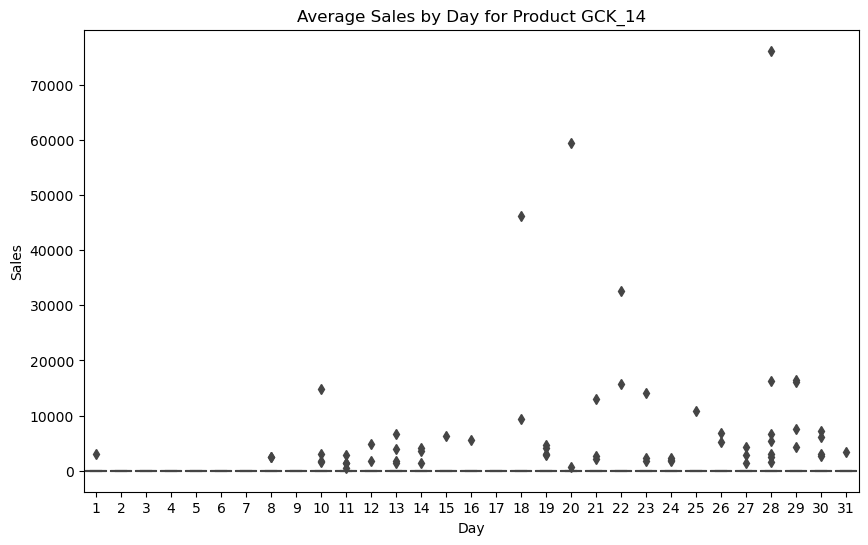

...

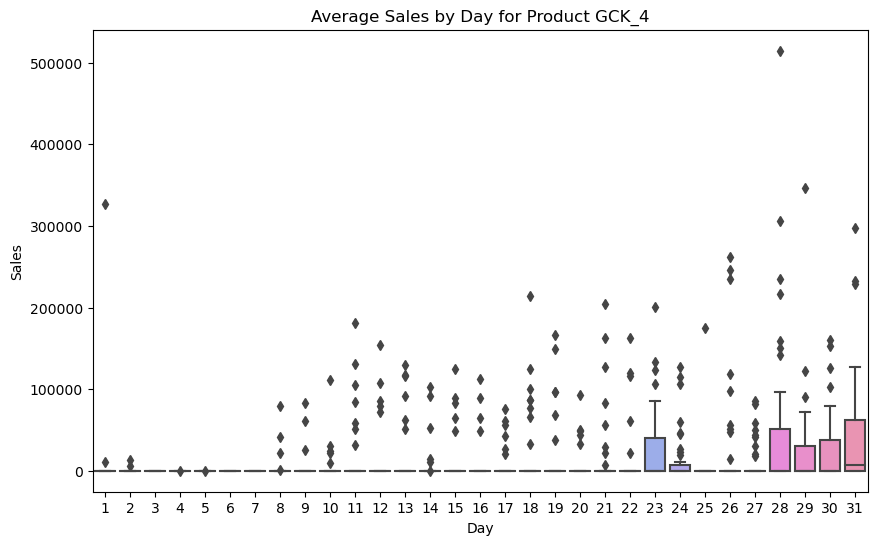

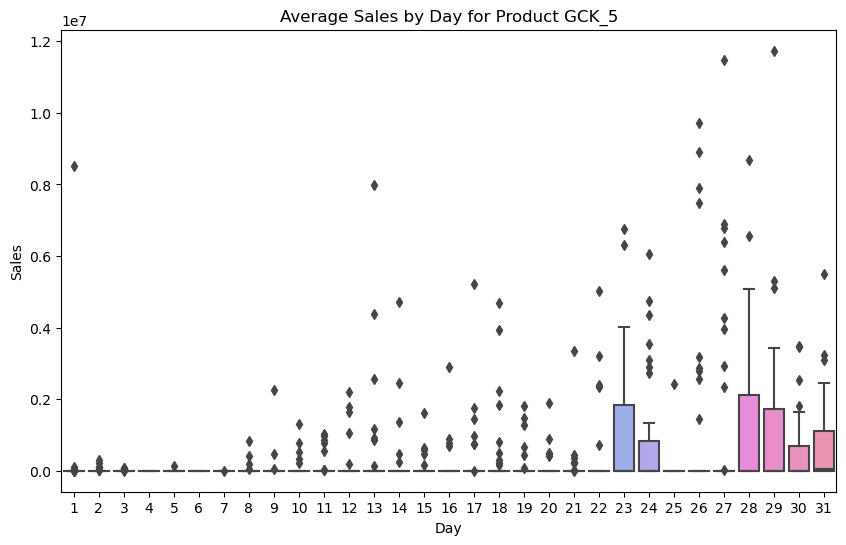

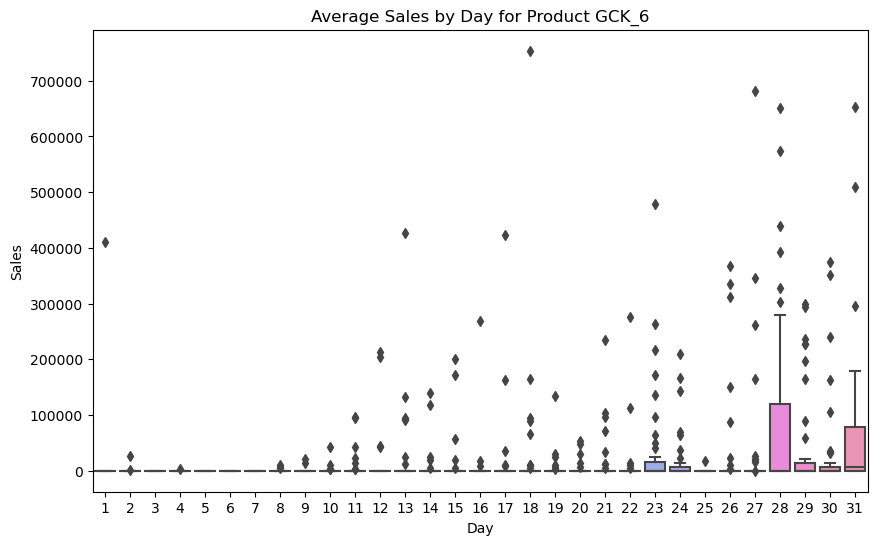

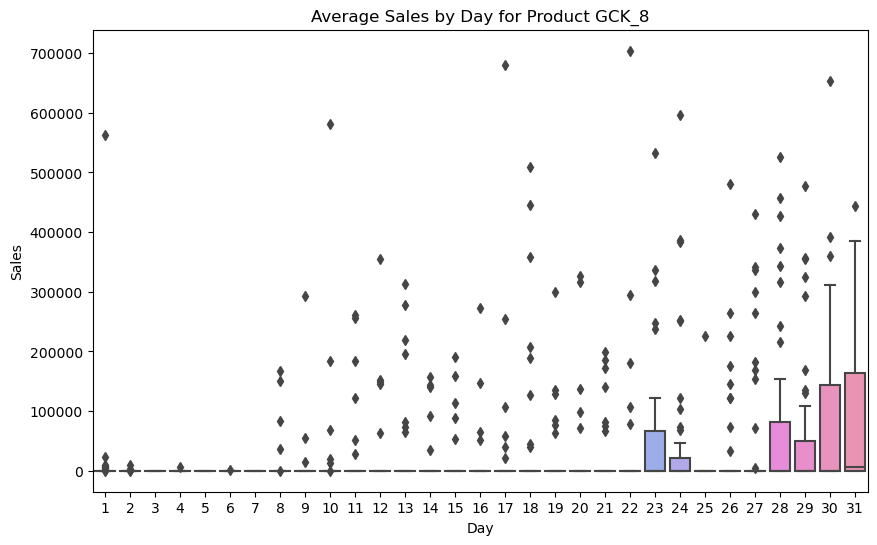

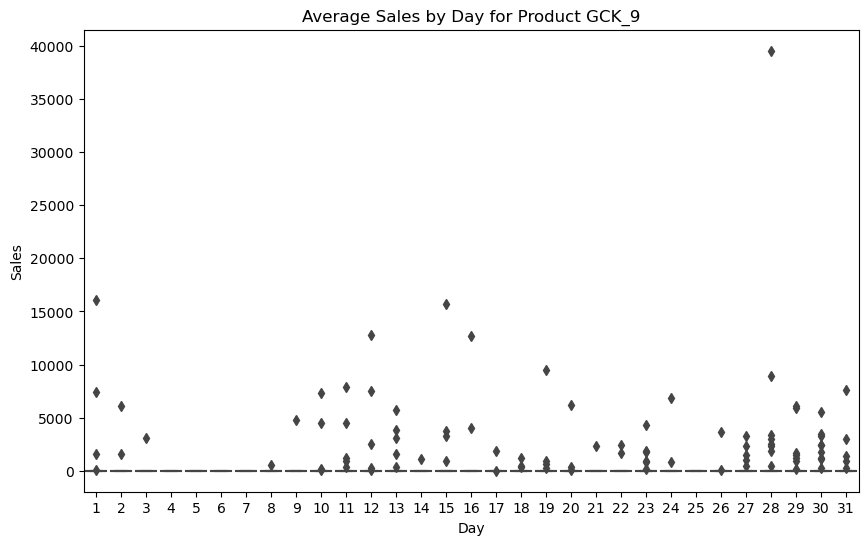

In [33]:
#Average sales per product per day
# Filter columns starting with 'GCK' or 'National Holidays'
filtered_columns = agg_df.columns[agg_df.columns.str.startswith('GCK') | (agg_df.columns == 'National Holidays')]

# Iterate over each product column, create boxplot for average sales by month
for col in filtered_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=agg_df['Day'], y=agg_df[col])
    plt.title(f'Average Sales by Day for Product {col}')
    plt.xlabel('Day')
    plt.ylabel('Sales')
    plt.show()

## Monthly Sales

We know that our test set has monthly sales to forecast, therefore it is also important to visualy inspect data monthly.

In [34]:
# Make a copy of the dataset
month_df = merged_df.copy()
month_df.head(10)

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9
0,2018-10-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2018-10-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2018-10-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2018-10-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2018-10-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,2018-10-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,2018-10-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2018-10-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,2018-10-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,2018-10-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Agregating daily sales into monthly sales

In [35]:
# Set the date column as the index
month_df.set_index('Date', inplace=True)

# Group by month and sum up the sales values
monthly_sales = month_df.resample('M').sum()

# Reset index to have the date as a column again
monthly_sales.reset_index(inplace=True)

# Display the resulting dataframe
print(monthly_sales)

#Source: ChatGPT

         Date        GCK_1      GCK_11     GCK_12    GCK_13    GCK_14  \
0  2018-10-31  36098918.79  1021303.50   28686.33  27666.10   5770.00   
1  2018-11-30   5140760.00  1898844.80    1070.00  68338.20  17130.00   
2  2018-12-31  38116343.62  1226122.00   17880.60  15655.18      0.00   
3  2019-01-31  27807651.78  2216391.74   21484.00  27198.29   1686.40   
4  2019-02-28  34854931.10   610456.60   34214.74  32638.63  19196.30   
5  2019-03-31  33892328.89   957023.11   10118.00  11890.00   7535.25   
6  2019-04-30  39728589.55  1484281.60   21813.27   7514.85      0.00   
7  2019-05-31  38963877.43  1066063.90   24468.00   2558.90  17820.00   
8  2019-06-30  39196785.54   492133.20   44255.68  34849.21  63017.71   
9  2019-07-31  38012231.56   585648.14   21318.48  43008.35  20719.30   
10 2019-08-31  38176979.29  2921554.87   19217.00  22497.60   1602.00   
11 2019-09-30  40759693.04  3749980.46  292490.40  19601.05  12851.20   
12 2019-10-31  39281415.51   228130.00  140819.69  

In [36]:
monthly_sales.head(10)

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9
0,2018-10-31,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32
1,2018-11-30,5140760.00,1898844.80,1070.00,68338.20,17130.00,1377694.32,5798.14,11870270.20,21986.89,373352.33,8993944.04,473046.96,526792.77,1875.90
2,2018-12-31,38116343.62,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8739307.86,13924.52,436873.36,6981080.57,999472.69,271490.71,0.00
3,2019-01-31,27807651.78,2216391.74,21484.00,27198.29,1686.40,942957.19,2399.18,10708075.28,15444.39,484435.48,8301428.77,598874.10,381400.15,1487.00
4,2019-02-28,34854931.10,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10172826.74,8051.15,620031.80,6892520.62,542037.52,368475.57,3234.28
5,2019-03-31,33892328.89,957023.11,10118.00,11890.00,7535.25,2258352.22,3369.55,11057255.22,7373.42,498766.86,11933851.57,735604.23,592288.36,13050.61
6,2019-04-30,39728589.55,1484281.60,21813.27,7514.85,0.00,225864.00,3635.26,12319225.05,4526.60,428258.52,5937614.80,277575.12,418899.90,9150.70
7,2019-05-31,38963877.43,1066063.90,24468.00,2558.90,17820.00,353451.54,944.00,12809906.50,16905.32,375671.57,11413781.15,315978.77,298806.84,4614.08
8,2019-06-30,39196785.54,492133.20,44255.68,34849.21,63017.71,371512.38,772.94,11546452.19,17296.03,190721.15,13738550.54,282963.19,420707.73,4488.09
9,2019-07-31,38012231.56,585648.14,21318.48,43008.35,20719.30,266225.86,577.60,13421550.83,33334.41,381343.41,11189764.23,725411.99,366980.26,1766.40


In [37]:
# Extract month from 'Date' and store it in a new column 'Month'
monthly_sales['Month'] = monthly_sales['Date'].dt.month
monthly_sales.head(10)

#Source: ChatGPT

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,Month
0,2018-10-31,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,10
1,2018-11-30,5140760.00,1898844.80,1070.00,68338.20,17130.00,1377694.32,5798.14,11870270.20,21986.89,373352.33,8993944.04,473046.96,526792.77,1875.90,11
2,2018-12-31,38116343.62,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8739307.86,13924.52,436873.36,6981080.57,999472.69,271490.71,0.00,12
3,2019-01-31,27807651.78,2216391.74,21484.00,27198.29,1686.40,942957.19,2399.18,10708075.28,15444.39,484435.48,8301428.77,598874.10,381400.15,1487.00,1
4,2019-02-28,34854931.10,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10172826.74,8051.15,620031.80,6892520.62,542037.52,368475.57,3234.28,2
5,2019-03-31,33892328.89,957023.11,10118.00,11890.00,7535.25,2258352.22,3369.55,11057255.22,7373.42,498766.86,11933851.57,735604.23,592288.36,13050.61,3
6,2019-04-30,39728589.55,1484281.60,21813.27,7514.85,0.00,225864.00,3635.26,12319225.05,4526.60,428258.52,5937614.80,277575.12,418899.90,9150.70,4
7,2019-05-31,38963877.43,1066063.90,24468.00,2558.90,17820.00,353451.54,944.00,12809906.50,16905.32,375671.57,11413781.15,315978.77,298806.84,4614.08,5
8,2019-06-30,39196785.54,492133.20,44255.68,34849.21,63017.71,371512.38,772.94,11546452.19,17296.03,190721.15,13738550.54,282963.19,420707.73,4488.09,6
9,2019-07-31,38012231.56,585648.14,21318.48,43008.35,20719.30,266225.86,577.60,13421550.83,33334.41,381343.41,11189764.23,725411.99,366980.26,1766.40,7


Create a new variable to store the total sales per month.

In [38]:
# Sum the sales from each column
monthly_sales['Total Sales'] = monthly_sales.iloc[:, 1:].sum(axis=1)
monthly_sales.head(10)

#Source: ChatGPT

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,Month,Total Sales
0,2018-10-31,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,10,49471380.83
1,2018-11-30,5140760.00,1898844.80,1070.00,68338.20,17130.00,1377694.32,5798.14,11870270.20,21986.89,373352.33,8993944.04,473046.96,526792.77,1875.90,11,30770915.55
2,2018-12-31,38116343.62,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8739307.86,13924.52,436873.36,6981080.57,999472.69,271490.71,0.00,12,61581606.42
3,2019-01-31,27807651.78,2216391.74,21484.00,27198.29,1686.40,942957.19,2399.18,10708075.28,15444.39,484435.48,8301428.77,598874.10,381400.15,1487.00,1,51510914.75
4,2019-02-28,34854931.10,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10172826.74,8051.15,620031.80,6892520.62,542037.52,368475.57,3234.28,2,54417002.75
5,2019-03-31,33892328.89,957023.11,10118.00,11890.00,7535.25,2258352.22,3369.55,11057255.22,7373.42,498766.86,11933851.57,735604.23,592288.36,13050.61,3,61978810.29
6,2019-04-30,39728589.55,1484281.60,21813.27,7514.85,0.00,225864.00,3635.26,12319225.05,4526.60,428258.52,5937614.80,277575.12,418899.90,9150.70,4,60866953.22
7,2019-05-31,38963877.43,1066063.90,24468.00,2558.90,17820.00,353451.54,944.00,12809906.50,16905.32,375671.57,11413781.15,315978.77,298806.84,4614.08,5,65664853.00
8,2019-06-30,39196785.54,492133.20,44255.68,34849.21,63017.71,371512.38,772.94,11546452.19,17296.03,190721.15,13738550.54,282963.19,420707.73,4488.09,6,66404511.58
9,2019-07-31,38012231.56,585648.14,21318.48,43008.35,20719.30,266225.86,577.60,13421550.83,33334.41,381343.41,11189764.23,725411.99,366980.26,1766.40,7,65069887.82


We need to format the date to display the first day of each month rather than the last one, and ensure it's in the correct format, one that matches with the date format of the same column in the market dataset.

In [39]:
# Convert 'Date' column to datetime
monthly_sales['Date'] = pd.to_datetime(monthly_sales['Date'])

# Set the day component to 1
monthly_sales['Date'] = monthly_sales['Date'].dt.to_period('M').dt.to_timestamp()
monthly_sales.head(10)

#Source: ChatGPT

,Date,GCK_1,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_3,GCK_36,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,Month,Total Sales
0,2018-10-01,36098918.79,1021303.50,28686.33,27666.10,5770.00,333196.87,4563.14,8089465.96,6474.60,397760.69,2499061.19,369231.60,586052.74,3219.32,10,49471380.83
1,2018-11-01,5140760.00,1898844.80,1070.00,68338.20,17130.00,1377694.32,5798.14,11870270.20,21986.89,373352.33,8993944.04,473046.96,526792.77,1875.90,11,30770915.55
2,2018-12-01,38116343.62,1226122.00,17880.60,15655.18,0.00,4762524.66,918.65,8739307.86,13924.52,436873.36,6981080.57,999472.69,271490.71,0.00,12,61581606.42
3,2019-01-01,27807651.78,2216391.74,21484.00,27198.29,1686.40,942957.19,2399.18,10708075.28,15444.39,484435.48,8301428.77,598874.10,381400.15,1487.00,1,51510914.75
4,2019-02-01,34854931.10,610456.60,34214.74,32638.63,19196.30,257765.04,620.66,10172826.74,8051.15,620031.80,6892520.62,542037.52,368475.57,3234.28,2,54417002.75
5,2019-03-01,33892328.89,957023.11,10118.00,11890.00,7535.25,2258352.22,3369.55,11057255.22,7373.42,498766.86,11933851.57,735604.23,592288.36,13050.61,3,61978810.29
6,2019-04-01,39728589.55,1484281.60,21813.27,7514.85,0.00,225864.00,3635.26,12319225.05,4526.60,428258.52,5937614.80,277575.12,418899.90,9150.70,4,60866953.22
7,2019-05-01,38963877.43,1066063.90,24468.00,2558.90,17820.00,353451.54,944.00,12809906.50,16905.32,375671.57,11413781.15,315978.77,298806.84,4614.08,5,65664853.00
8,2019-06-01,39196785.54,492133.20,44255.68,34849.21,63017.71,371512.38,772.94,11546452.19,17296.03,190721.15,13738550.54,282963.19,420707.73,4488.09,6,66404511.58
9,2019-07-01,38012231.56,585648.14,21318.48,43008.35,20719.30,266225.86,577.60,13421550.83,33334.41,381343.41,11189764.23,725411.99,366980.26,1766.40,7,65069887.82


Visualizing the distribution of average sales for each month across different products can help you understand whether certain products exhibit consistent patterns of higher or lower sales during particular months of the year, check for the presence of outliers and compare different products in the same period.

- Product group 1 sales are higher in november and lower in february and august.
- Product group 11 sales are higher in january, march, june, july and october, and lower in september.
- Product group 12 sales are higher in november and lower in august.
- Product group 13 sales are higher in november and lower in may.
- Product group 14 sales are higher in july and lower in january.
- Product group 16 sales are higher in december and lower in april.
- Product group 20 sales are higher in april and october, and lower in july.
- Product group 3 sales are higher in february and lower in july and september.
- Product group 36 sales are higher in april and lower in may.
- Product group 4 sales are higher in february and do not get significantly lower in any month, as we saw for the previous products but it can be said that the sales get lower in july and august.
- Product group 5 sales are higher in october and lower in september.
- Product group 6 sales are higher in december (almost duplicates the regular revenue for this product in the remaining months) and lower in february and november.
- Product group 8 sales are higher in decmber and do not get significantly lower in any month, as we saw for the previous products but it can be said that the sales get lower in january, may and october.
- Product group 9 sales are higher in november and lower in june.

We can see that most products sales exhibit outliers (the extreme ones will be taken care of later on).

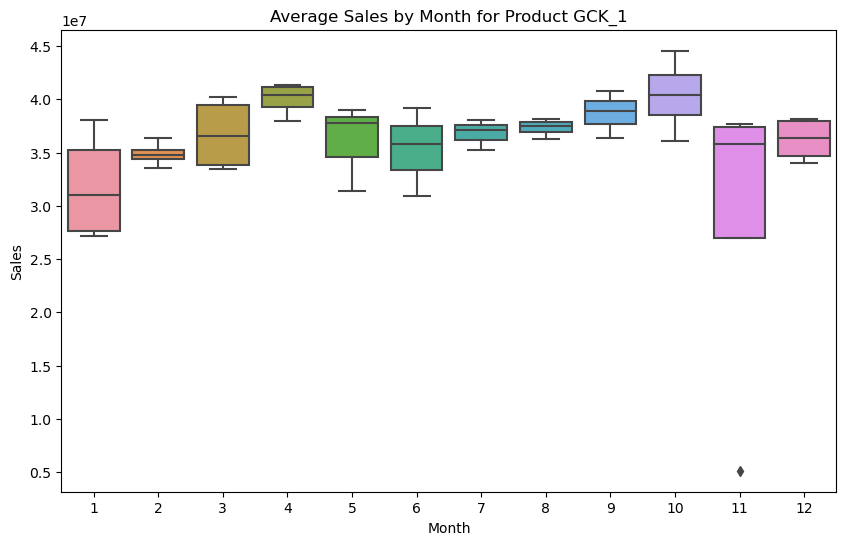

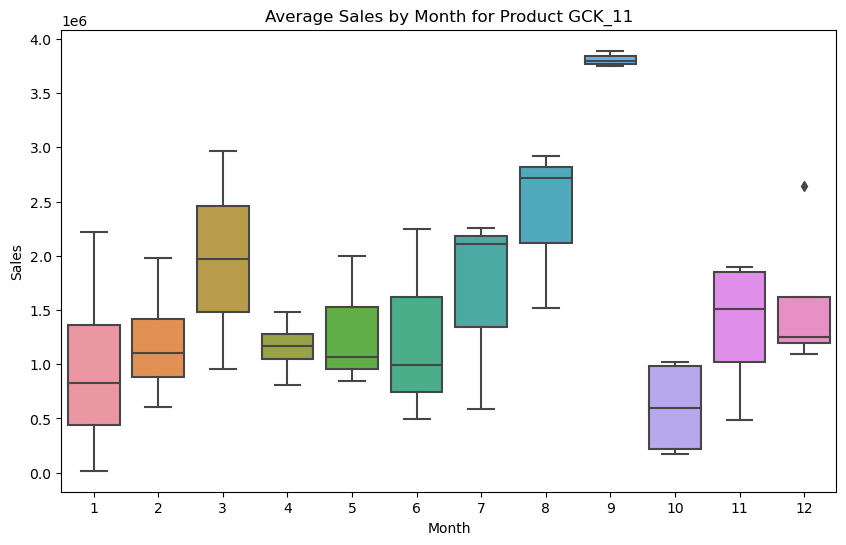

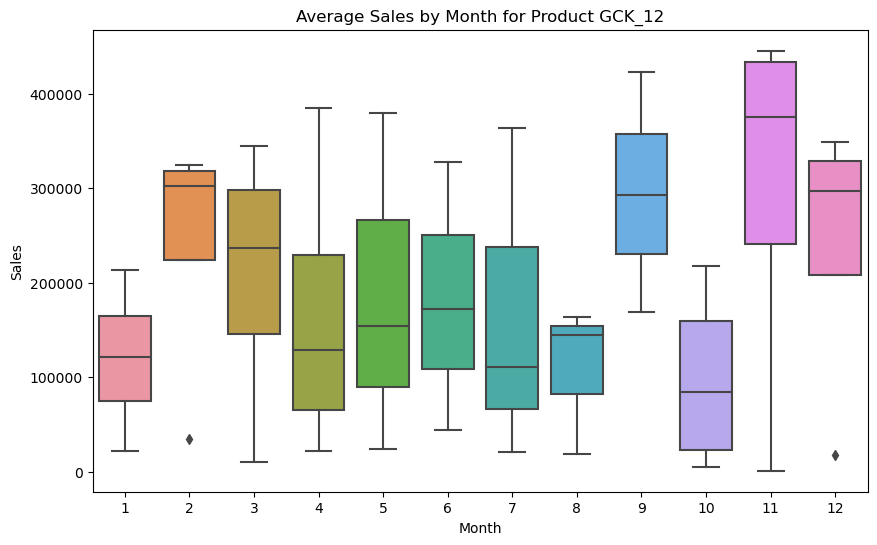

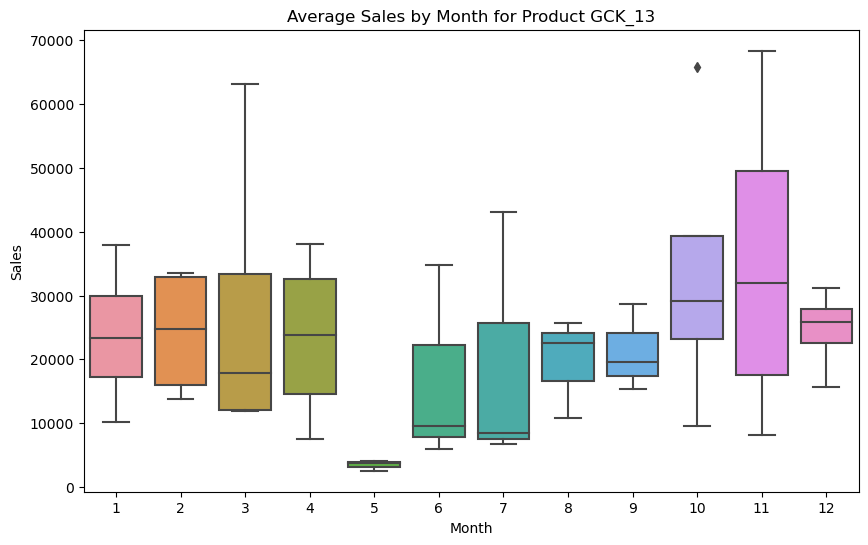

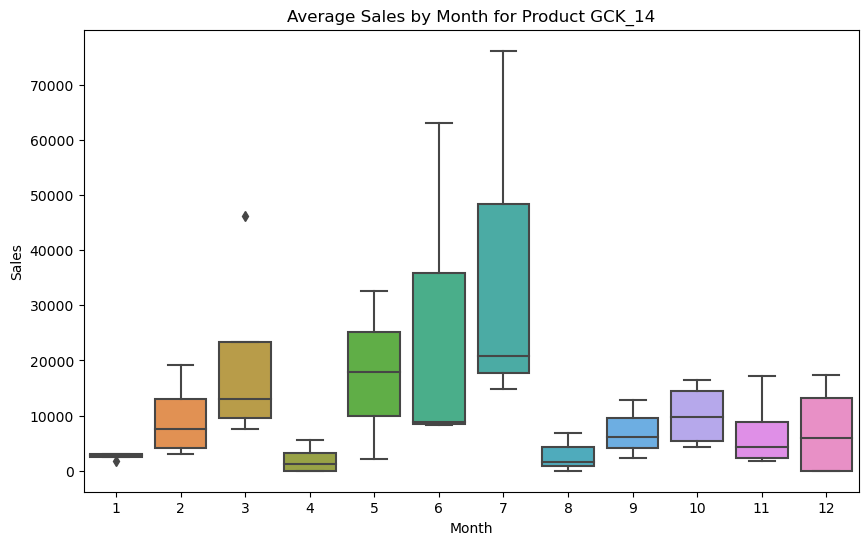

...

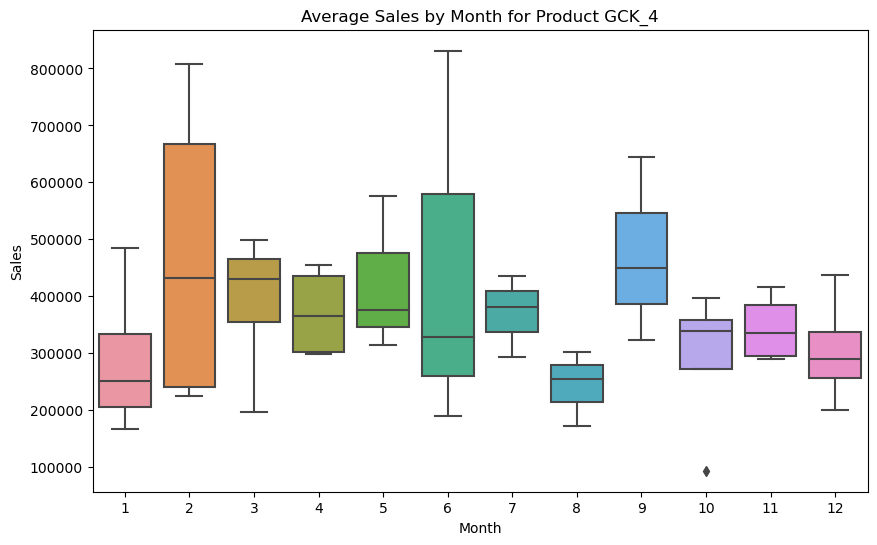

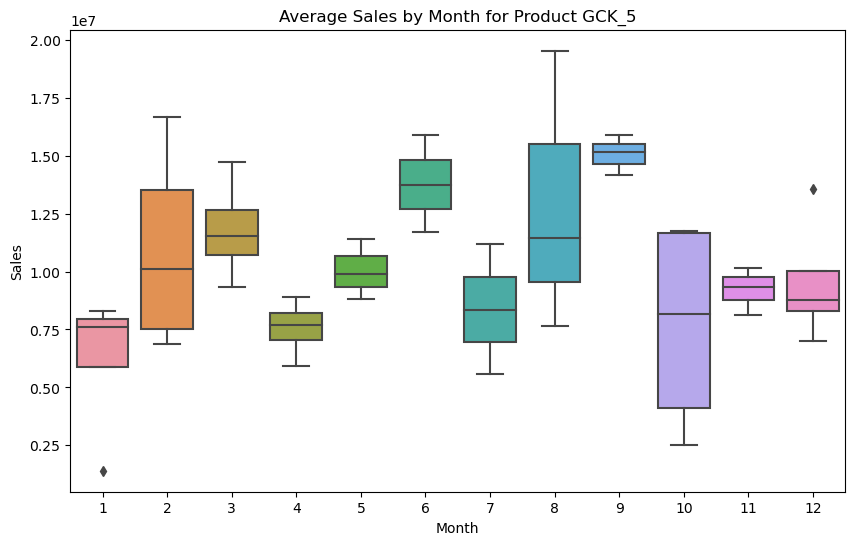

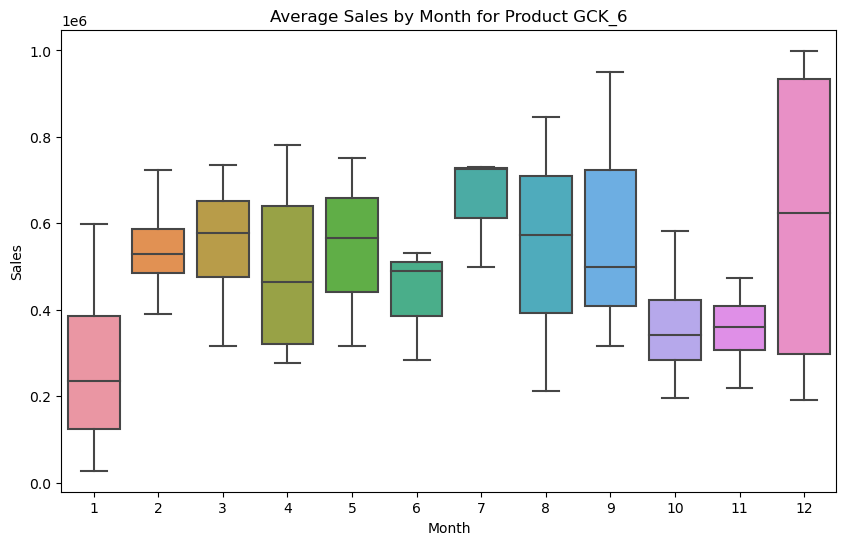

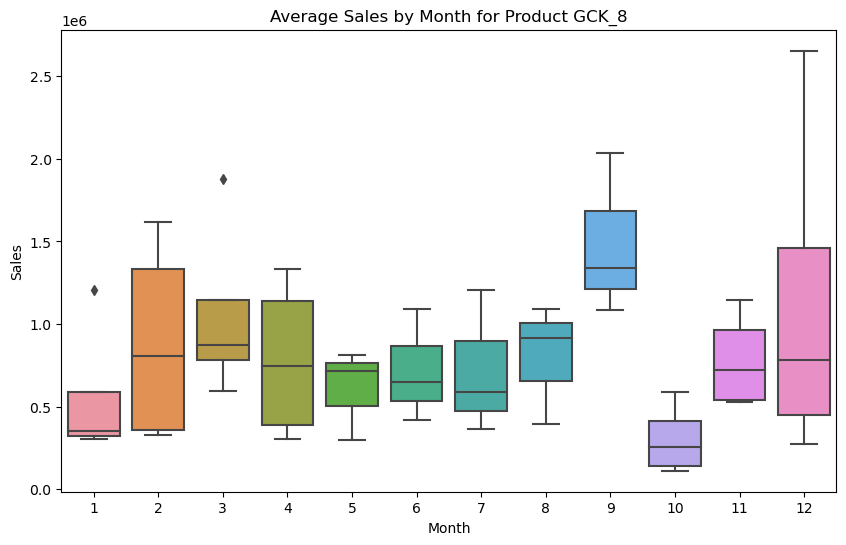

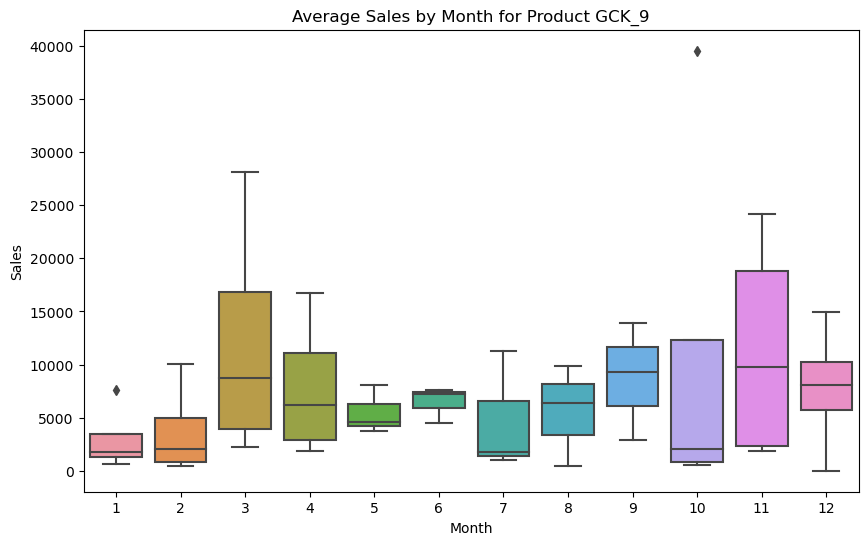

In [40]:
#Average sales per product per month
# Filter columns starting with 'GCK'
filtered_columns = monthly_sales.columns[monthly_sales.columns.str.startswith('GCK')]

# Iterate over each product column, create boxplot for average sales by month
for col in filtered_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=monthly_sales['Month'], y=monthly_sales[col])
    plt.title(f'Average Sales by Month for Product {col}')
    plt.xlabel('Month')
    plt.ylabel('Sales')
    plt.show()

Now, we will inspect average sales per product per quarter.

- Product group 1 contributes the least to the third quarter revenues, and more or less equally to the remaining quarters.
- Product group 11 contributes the most to the third quarter revenues.
- Product group 12 contributes the most to the last quarter revenues.
- Product group 13 contributes more or less equally to all quarters revenues.
- Product group 14 contributes the least to the first quarter revenues.
- Product group 16 contributes more or less equally to all quarters revenues.
- Product group 20 contributes the most to the last quarter revenues and the least to the third quarter.
- Product group 3 contributes the least to the first quarter revenues.
- Product group 36 contributes more or less equally to all quarters revenues.
- Product group 4 contributes the most to the first quarter revenues.
- Product group 5 contributes the most to the third quarter revenues.
- Product group 6 contributes more or less equally to all quarters revenues.
- Product group 8 contributes the most to the first quarter revenues.
- Product group 9 contributes the most to the last quarter revenues.

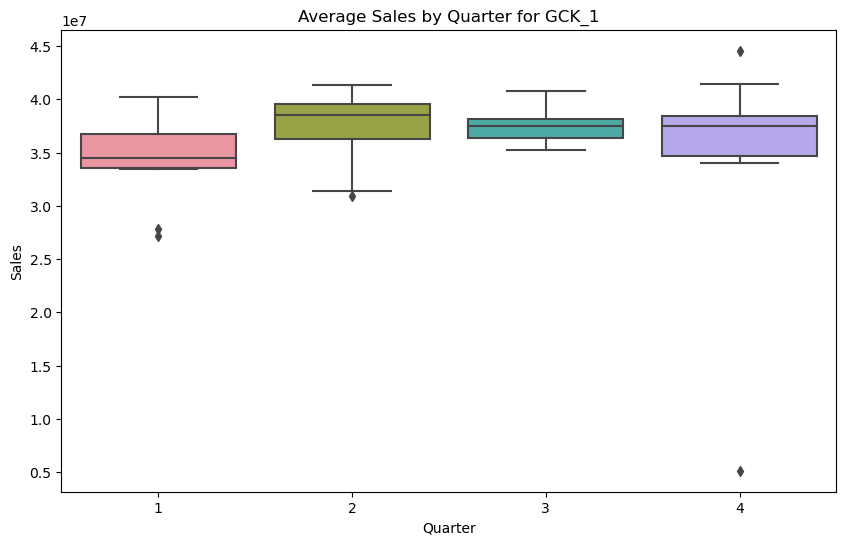

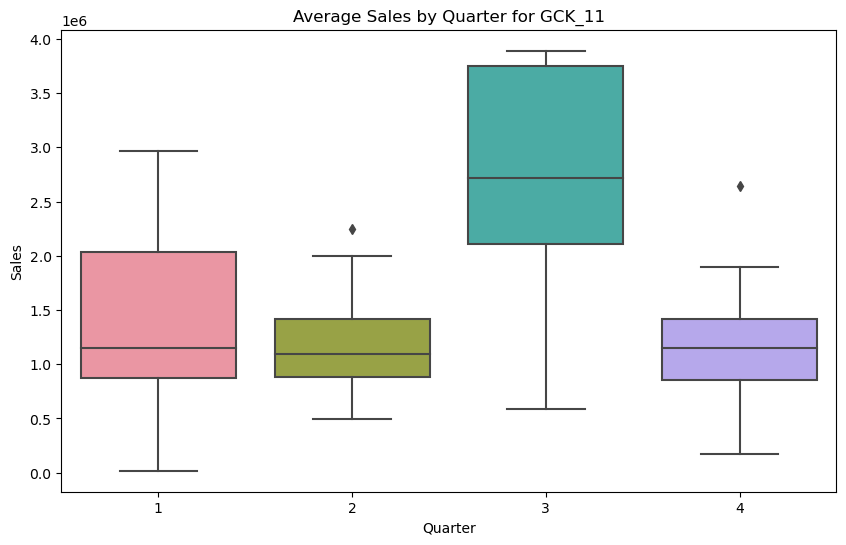

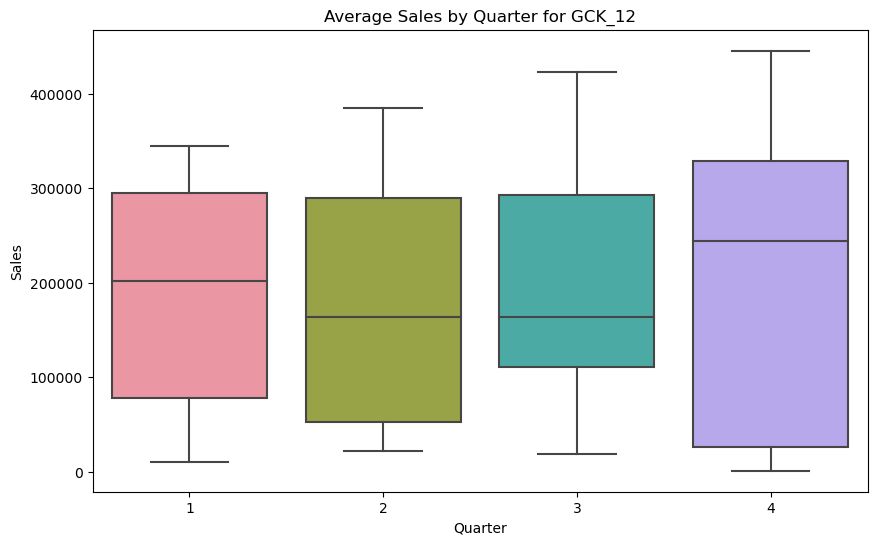

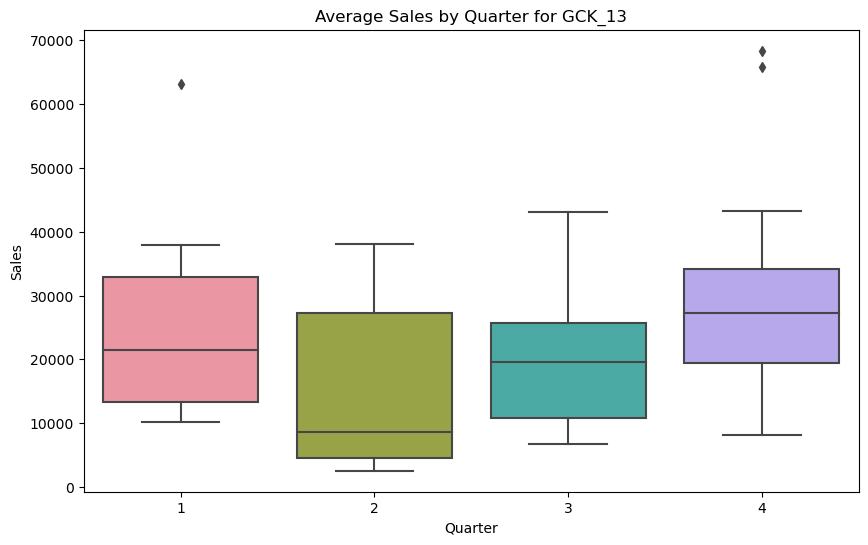

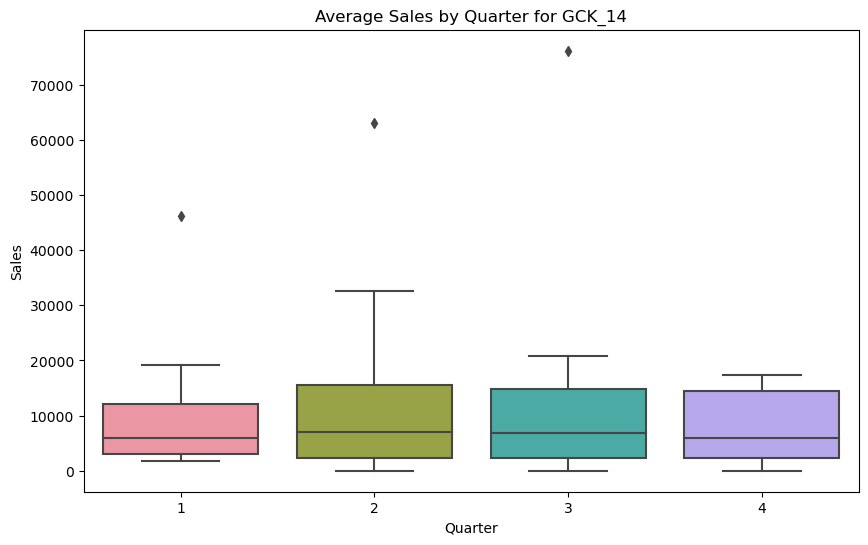

...

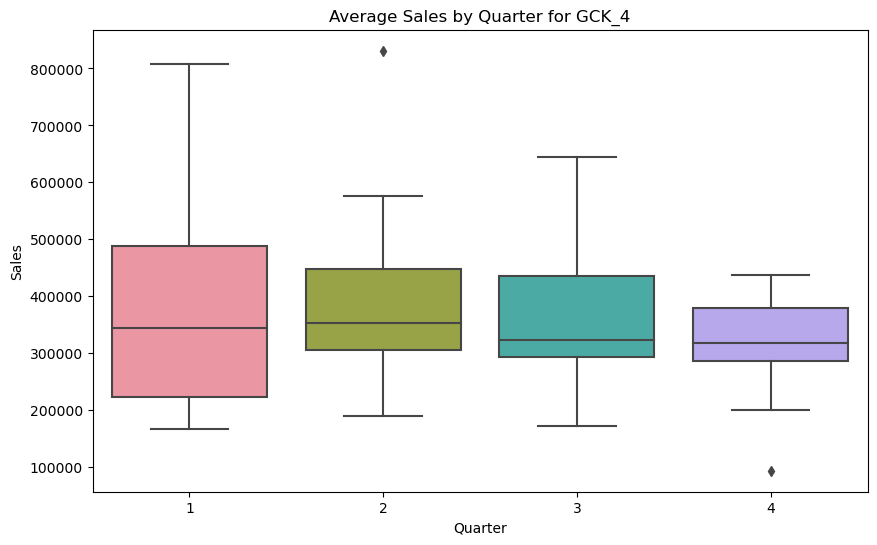

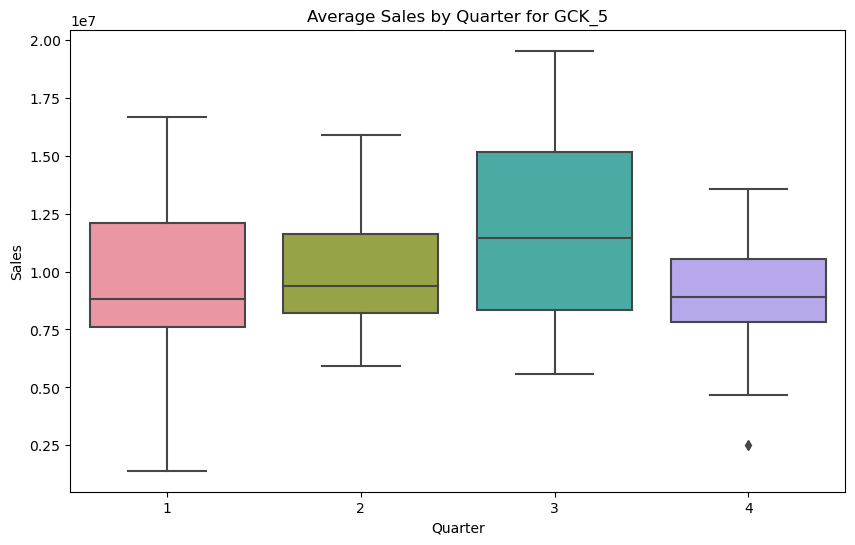

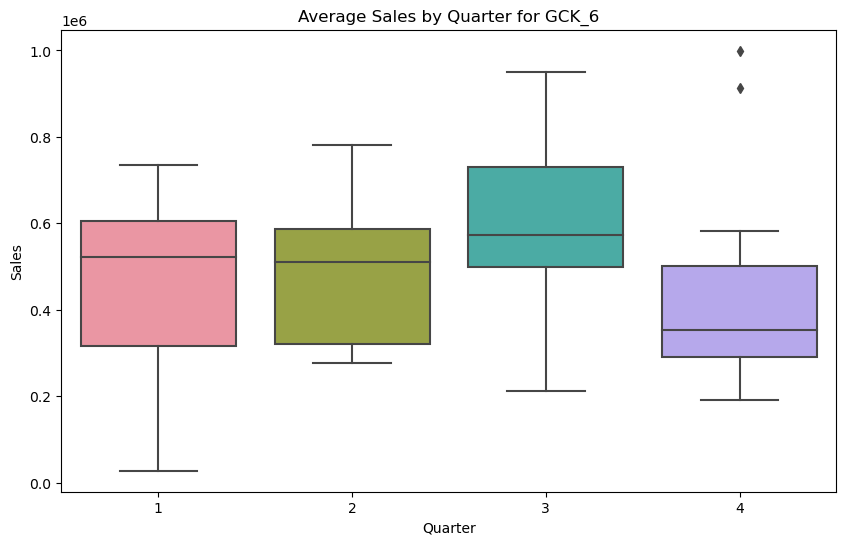

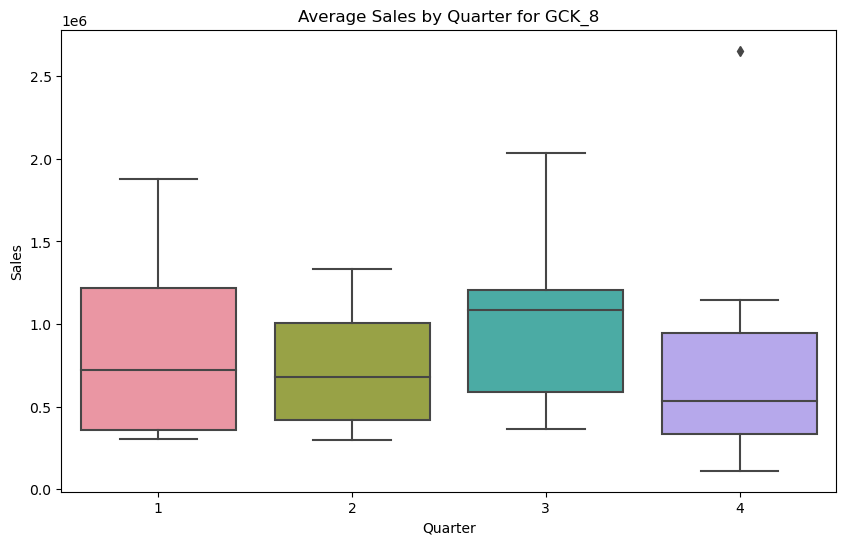

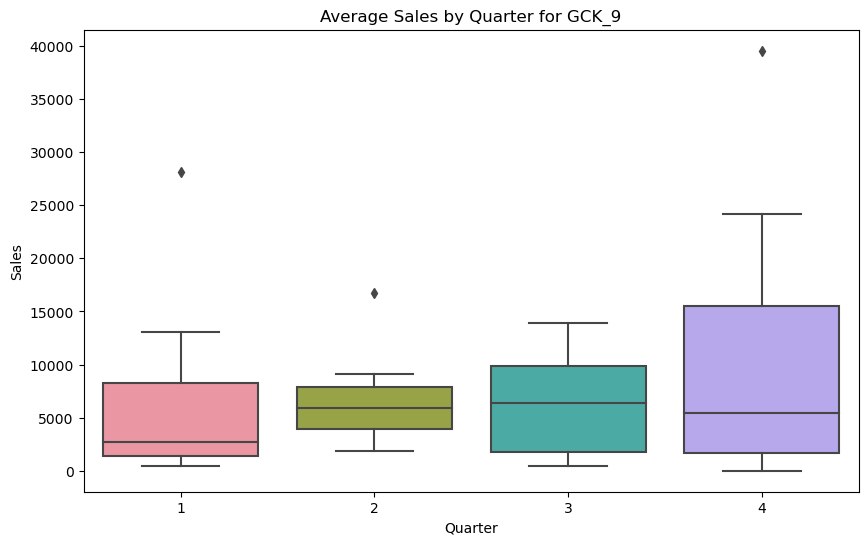

In [41]:
# Average sales per product per quarter
# Extract year from 'Date'
monthly_sales['Quarter'] = monthly_sales['Date'].dt.quarter

# Filter columns starting with 'GCK' or 'National Holidays'
filtered_columns = monthly_sales.columns[monthly_sales.columns.str.startswith('GCK')]

# Iterate over each filtered column, create boxplot for average sales by year
for col in filtered_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=monthly_sales['Quarter'], y=monthly_sales[col])
    plt.title(f'Average Sales by Quarter for {col}')
    plt.xlabel('Quarter')
    plt.ylabel('Sales')
    plt.show()

It is hard to comapare 2018 and 2022 with the remaining years in the sense that we don't have data for the whole year. Therefore, we will not inspect average sales per product per year as it was our practice till the month just because we will not be able to see any reliable trend or anormality.

In [42]:
# Define the function to perform grouping
def grouped(df, key, freq, col):
    return df.groupby(pd.Grouper(key=key, freq=freq))[col].mean()

#Source: Kaggle    

In [43]:
# Define the function to plot moving average
def plot_moving_average(df, key, freq, col, window, min_periods, ax, title):
    df_grouped = grouped(df, key, freq, col)  # Call the grouped function
    moving_average = df_grouped.rolling(window=window, center=True, min_periods=min_periods).mean()   
    df_grouped.plot(color='0.75', linestyle='dashdot', ax=ax)
    moving_average.plot(ax=ax, color='r', label='Moving Average')
    ax.set_title(title)
    ax.legend()

#Source: Kaggle

We intend to visualize the moving average of monthly sales data. By plotting the moving average alongside the original sales data, we can easily compare the smoothed trend with the actual sales values. This can help in identifying overall trends, seasonality, or any irregular patterns in the sales data.

Despite short-term variations, we can see that the sales revenue is pretty regular in time.

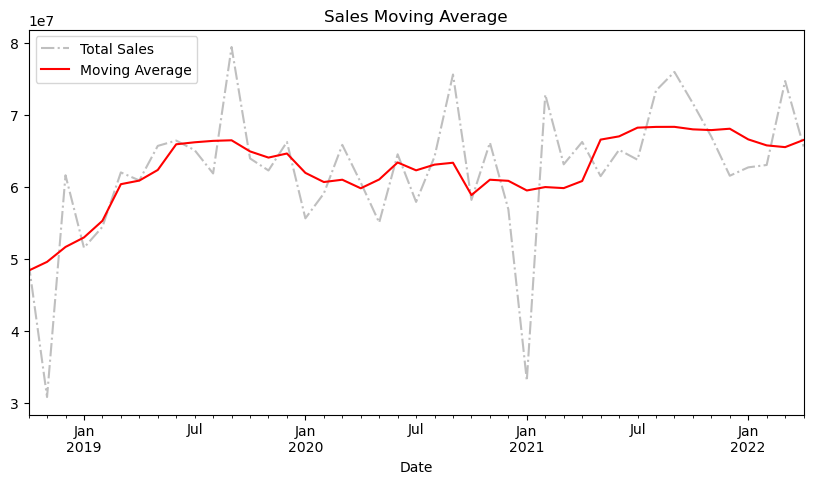

In [44]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
plot_moving_average(monthly_sales, 'Date', 'M', 'Total Sales', 7, 4, axes, 'Sales Moving Average') 
plt.show()

#Source: Kaggle

Now, we will plot the distribution of the logarithm of the sales per product to check for variability and spread of sales across different products. 

- Product groups 1, 3, 5 and 11 have narrower spread, which suggests more consistency, but is negatively skewed which indicates there are few products with very low sales, while most products have higher sales, whitin the category.
- Product groups 6, 12 and 13 have a wider spread, which indicates more variability in sales among products, but is negatively skewed which indicates there are few products with very low sales, while most products have higher sales, whitin the category.
- Product groups 9, 14 and 20 have a wider spread, which indicates more variability in sales among products, but has more extreme sales values. Extreme sales events, whether positive or negative, could impact revenue forecasts. 
- Product group 16 have narrower spread, which suggests more consistency, but is positively skewed which indicates there are few products with very high sales, while most products have lower sales, whitin the category.
- Product groups 4 and 36 seem to be normaly distributed (even though the mean is not 0 the standard deviation seem to be 1), which indicates that the product's sales performance has more stable and predictable sales pattern compared to products with higher variability.
- Product groups 8 have a wider spread, which indicates more variability in sales among products, which almost resembles a soft bimodal distribution. This might indicate that there are two distinct subsets of products contributing more to sales.
- The total amount of sales have narrower spread, which suggests more consistency, but is negatively skewed which indicates there are few products with very low sales, while most products have higher sales.

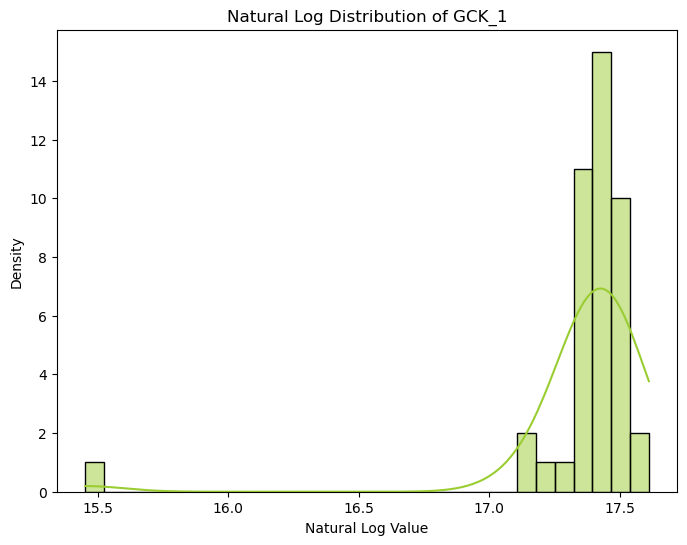

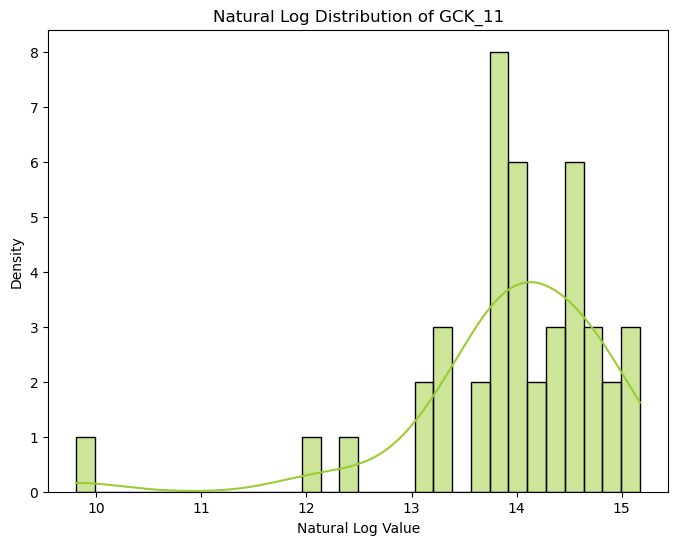

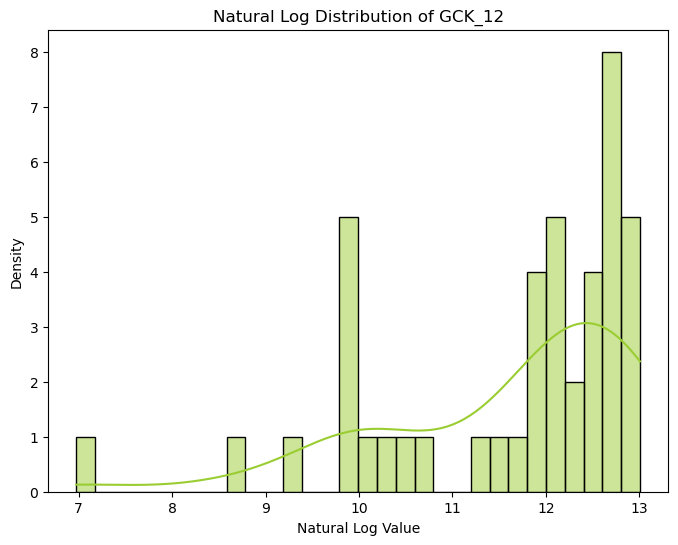

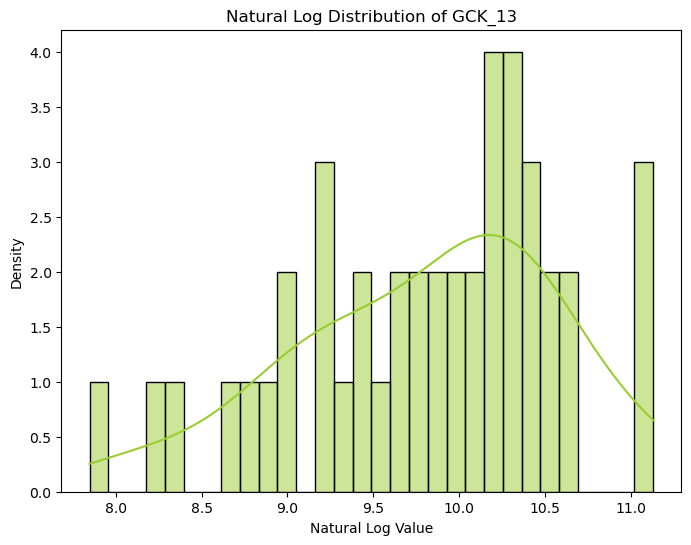

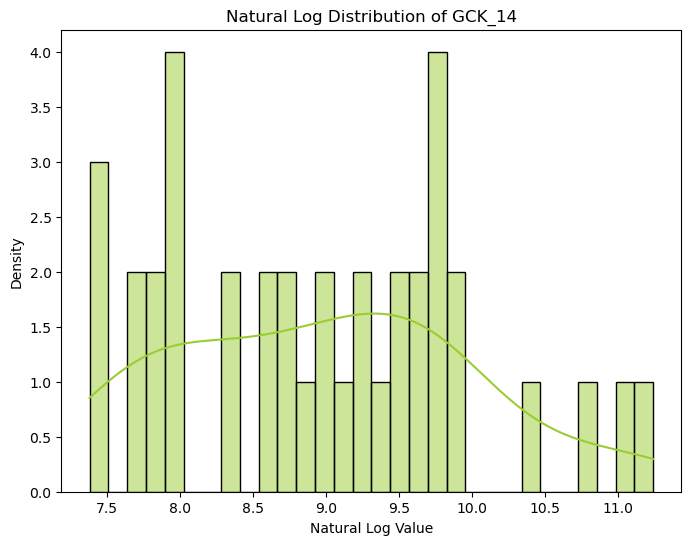

...

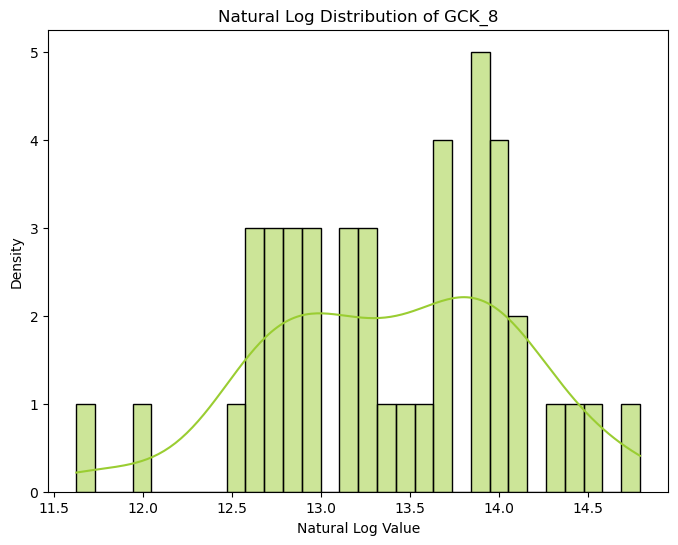

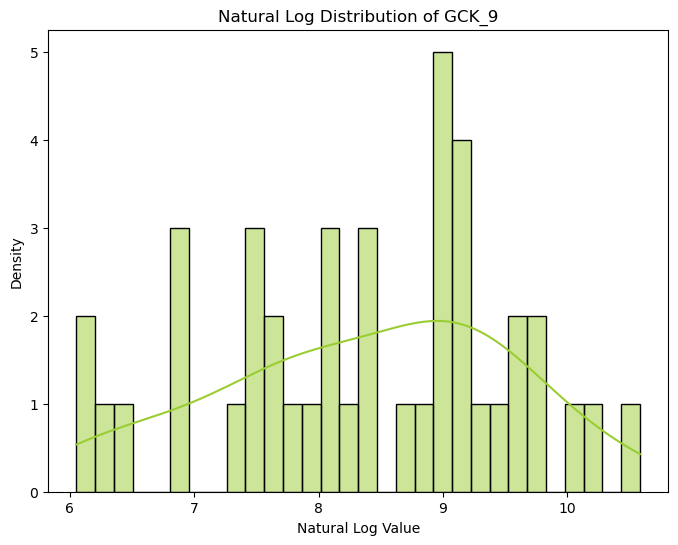

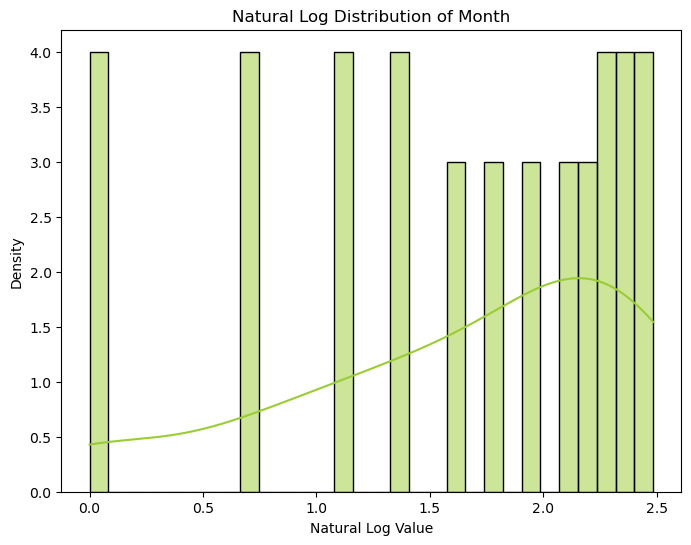

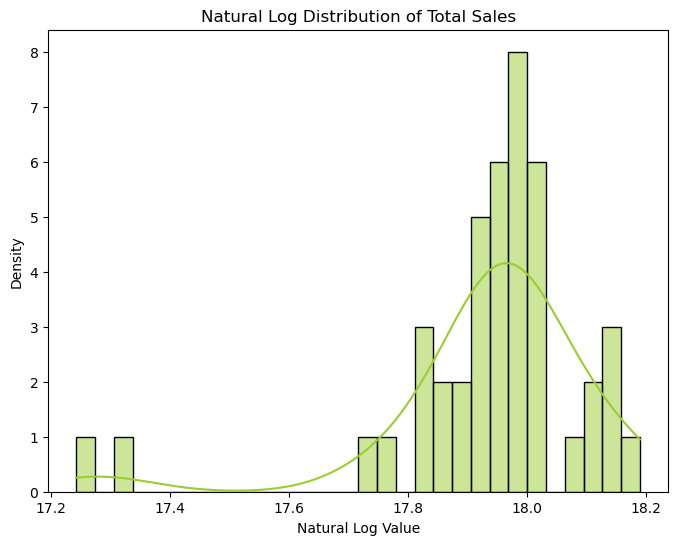

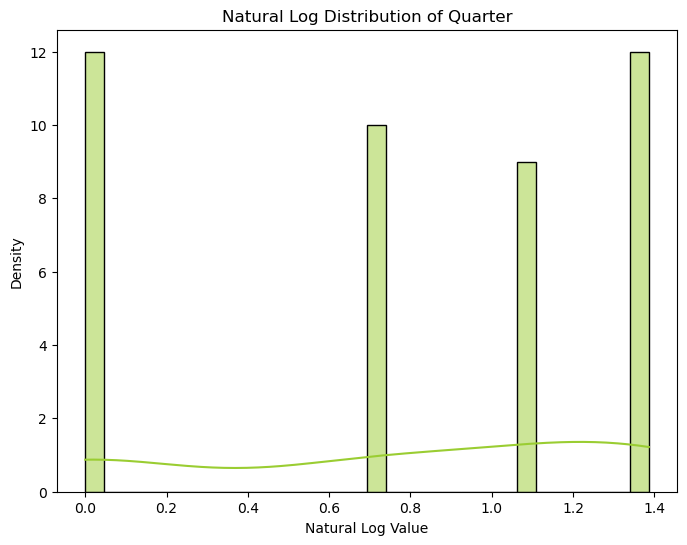

In [45]:
# Plotting the distribution of the logarithm of the sales per product
# Iterate over each column
for column in monthly_sales.columns:
    # Check if the column contains numeric data
    if np.issubdtype(monthly_sales[column].dtype, np.number):
        # Create a new figure and axis for each column
        fig, ax = plt.subplots(figsize=(8, 6))
        
        # Plot the natural logarithm distribution of the column
        sns.histplot(np.log(monthly_sales[column].values), kde=True, color="yellowgreen", bins=30)
        
        # Set title and labels
        ax.set_title(f"Natural Log Distribution of {column}")
        ax.set_xlabel("Natural Log Value")
        ax.set_ylabel("Density")
        
        # Show plot
        plt.show()

#Source: Kaggle

# Preparing Market Data

We consider that we have the necessary insights from sales data, now we will proceed with getting to know the market data in hand.

In [46]:
# Load data 
df2 = pd.read_excel('Case2_Market data.xlsx', header = 1)
df2.head(10)

# Source: previous project notebook

,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals.1,Shipments Index Machinery & Electricals.1,Production Index Machinery & Electricals.2,Shipments Index Machinery & Electricals.2,Production Index Machinery & Electricals.3,Shipments Index Machinery & Electricals.3,Production Index Machinery & Electricals.4,...,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment.1,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment.1,Italy: Electrical equipment.1,Japan: Electrical equipment,France: Electrical equipment.1,Germany: Electrical equipment.1
0,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,...,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
1,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,...,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,...,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
3,2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,...,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
4,2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,...,116.64975,88.082901,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552
5,2004m6,27.009138,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,110.889719,120.33292,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802
6,2004m7,23.590959,23.590959,117.405904,89.302781,94.200318,89.646239,140.351467,106.133436,118.140547,...,122.030464,95.682213,115.277336,NaN,63.546099,119.269534,151.288528,116.631115,109.915596,91.48259
7,2004m8,24.280597,24.280597,79.137033,71.798962,82.804844,80.197268,54.397252,49.046004,106.243773,...,79.492393,83.246979,119.799347,NaN,65.815603,112.922862,56.467911,98.873136,78.561462,81.993988
8,2004m9,25.989192,25.989192,130.487955,98.896817,102.039931,101.18697,130.661571,104.558892,124.929188,...,136.446701,103.972374,121.154922,NaN,68.085106,130.525896,153.78978,114.669943,120.836693,98.495918
9,2004m10,24.895962,24.895962,119.707613,99.60374,93.519358,89.045549,133.231484,95.903054,104.922286,...,120.913712,93.955093,123.396988,NaN,64.334121,125.975452,148.48407,97.557126,117.75412,92.720238


We will remove the first row since doesn't contribute to explain the variables names, aside from data, therefore we will replace Index 2010=100 by date. 

In [47]:
# Remove the first row
df2 = df2.drop(0)
df2.head(10)

,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals.1,Shipments Index Machinery & Electricals.1,Production Index Machinery & Electricals.2,Shipments Index Machinery & Electricals.2,Production Index Machinery & Electricals.3,Shipments Index Machinery & Electricals.3,Production Index Machinery & Electricals.4,...,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment.1,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment.1,Italy: Electrical equipment.1,Japan: Electrical equipment,France: Electrical equipment.1,Germany: Electrical equipment.1
1,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,...,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,...,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
3,2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,...,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
4,2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,...,116.64975,88.082901,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552
5,2004m6,27.009138,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,110.889719,120.33292,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802
6,2004m7,23.590959,23.590959,117.405904,89.302781,94.200318,89.646239,140.351467,106.133436,118.140547,...,122.030464,95.682213,115.277336,NaN,63.546099,119.269534,151.288528,116.631115,109.915596,91.48259
7,2004m8,24.280597,24.280597,79.137033,71.798962,82.804844,80.197268,54.397252,49.046004,106.243773,...,79.492393,83.246979,119.799347,NaN,65.815603,112.922862,56.467911,98.873136,78.561462,81.993988
8,2004m9,25.989192,25.989192,130.487955,98.896817,102.039931,101.18697,130.661571,104.558892,124.929188,...,136.446701,103.972374,121.154922,NaN,68.085106,130.525896,153.78978,114.669943,120.836693,98.495918
9,2004m10,24.895962,24.895962,119.707613,99.60374,93.519358,89.045549,133.231484,95.903054,104.922286,...,120.913712,93.955093,123.396988,NaN,64.334121,125.975452,148.48407,97.557126,117.75412,92.720238
10,2004m11,26.774785,26.774785,114.509588,86.511165,97.130763,93.852657,130.111098,105.53936,112.828512,...,117.563454,96.948761,124.746834,NaN,60.583136,132.561621,143.708954,103.852026,109.563301,97.464546


In [48]:
# Rename Index 2010=100 (if not otherwise noted) to Date
df2.rename(columns={'Index 2010=100 (if not otherwise noted)': 'date'}, inplace=True)
df2.head(10)

,date,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals.1,Shipments Index Machinery & Electricals.1,Production Index Machinery & Electricals.2,Shipments Index Machinery & Electricals.2,Production Index Machinery & Electricals.3,Shipments Index Machinery & Electricals.3,Production Index Machinery & Electricals.4,...,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment.1,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment.1,Italy: Electrical equipment.1,Japan: Electrical equipment,France: Electrical equipment.1,Germany: Electrical equipment.1
1,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,...,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,...,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
3,2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,...,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
4,2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,...,116.64975,88.082901,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552
5,2004m6,27.009138,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,110.889719,120.33292,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802
6,2004m7,23.590959,23.590959,117.405904,89.302781,94.200318,89.646239,140.351467,106.133436,118.140547,...,122.030464,95.682213,115.277336,NaN,63.546099,119.269534,151.288528,116.631115,109.915596,91.48259
7,2004m8,24.280597,24.280597,79.137033,71.798962,82.804844,80.197268,54.397252,49.046004,106.243773,...,79.492393,83.246979,119.799347,NaN,65.815603,112.922862,56.467911,98.873136,78.561462,81.993988
8,2004m9,25.989192,25.989192,130.487955,98.896817,102.039931,101.18697,130.661571,104.558892,124.929188,...,136.446701,103.972374,121.154922,NaN,68.085106,130.525896,153.78978,114.669943,120.836693,98.495918
9,2004m10,24.895962,24.895962,119.707613,99.60374,93.519358,89.045549,133.231484,95.903054,104.922286,...,120.913712,93.955093,123.396988,NaN,64.334121,125.975452,148.48407,97.557126,117.75412,92.720238
10,2004m11,26.774785,26.774785,114.509588,86.511165,97.130763,93.852657,130.111098,105.53936,112.828512,...,117.563454,96.948761,124.746834,NaN,60.583136,132.561621,143.708954,103.852026,109.563301,97.464546


We will proceed with the necessary changes to put "date" in a date format, equal to the column date of the sales dataset, previously treated.

In [49]:
# Extract year and month from the "date" column
df2['Year'] = df2['date'].apply(lambda x: int(x[:5].rstrip('m')))  # Extract the first 4 characters as year

# Extract month - handle cases where month is single or double digit
df2['Month'] = df2['date'].apply(lambda x: int(x[x.find('m')+1:]))  # Extract characters after 'm' as month


df2.head()

#Source: ChatGPT

,date,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals.1,Shipments Index Machinery & Electricals.1,Production Index Machinery & Electricals.2,Shipments Index Machinery & Electricals.2,Production Index Machinery & Electricals.3,Shipments Index Machinery & Electricals.3,Production Index Machinery & Electricals.4,...,United States: Electrical equipment.1,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment.1,Italy: Electrical equipment.1,Japan: Electrical equipment,France: Electrical equipment.1,Germany: Electrical equipment.1,Year,Month
1,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,...,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132,2004,2
2,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,...,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815,2004,3
3,2004m4,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,...,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983,2004,4
4,2004m5,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,...,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552,2004,5
5,2004m6,27.009138,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,110.889719,120.33292,...,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802,2004,6


We will now have in the beggining of the dataset every column related to date, including the extracted columns from date, that might be useful later on. 

In [50]:
# Merge 'year' and 'month' columns into a new 'date' column
df2['Date'] = pd.to_datetime(df2[['Year', 'Month']].assign(day=1))

# Extract the columns "Date", "Month", and "Year"
date_columns = df2[["Date", "Month", "Year"]]

# Drop the extracted columns from the DataFrame
df2.drop(columns=["Date", "Month", "Year"], inplace=True)

# Concatenate the extracted columns at the beginning of the DataFrame
df2 = pd.concat([date_columns, df2], axis=1)

# Drop 'date' column
df2.drop(columns=['date'], inplace=True)

df2.head(10)

,Date,Month,Year,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals.1,Shipments Index Machinery & Electricals.1,Production Index Machinery & Electricals.2,Shipments Index Machinery & Electricals.2,Production Index Machinery & Electricals.3,...,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment.1,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment.1,Italy: Electrical equipment.1,Japan: Electrical equipment,France: Electrical equipment.1,Germany: Electrical equipment.1
1,2004-02-01,2,2004,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,...,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2,2004-03-01,3,2004,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,...,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
3,2004-04-01,4,2004,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,...,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
4,2004-05-01,5,2004,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,...,116.64975,88.082901,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552
5,2004-06-01,6,2004,27.009138,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802
6,2004-07-01,7,2004,23.590959,23.590959,117.405904,89.302781,94.200318,89.646239,140.351467,...,122.030464,95.682213,115.277336,NaN,63.546099,119.269534,151.288528,116.631115,109.915596,91.48259
7,2004-08-01,8,2004,24.280597,24.280597,79.137033,71.798962,82.804844,80.197268,54.397252,...,79.492393,83.246979,119.799347,NaN,65.815603,112.922862,56.467911,98.873136,78.561462,81.993988
8,2004-09-01,9,2004,25.989192,25.989192,130.487955,98.896817,102.039931,101.18697,130.661571,...,136.446701,103.972374,121.154922,NaN,68.085106,130.525896,153.78978,114.669943,120.836693,98.495918
9,2004-10-01,10,2004,24.895962,24.895962,119.707613,99.60374,93.519358,89.045549,133.231484,...,120.913712,93.955093,123.396988,NaN,64.334121,125.975452,148.48407,97.557126,117.75412,92.720238
10,2004-11-01,11,2004,26.774785,26.774785,114.509588,86.511165,97.130763,93.852657,130.111098,...,117.563454,96.948761,124.746834,NaN,60.583136,132.561621,143.708954,103.852026,109.563301,97.464546


In [51]:
df2.columns

Index(['Date', 'Month', 'Year', 'Production Index Machinery & Electricals',
       'Shipments Index Machinery & Electricals',
       'Production Index Machinery & Electricals.1',
       'Shipments Index Machinery & Electricals.1',
       'Production Index Machinery & Electricals.2',
       'Shipments Index Machinery & Electricals.2',
       'Production Index Machinery & Electricals.3',
       'Shipments Index Machinery & Electricals.3',
       'Production Index Machinery & Electricals.4',
       'Shipments Index Machinery & Electricals.4',
       'Production Index Machinery & Electricals.5',
       'Shipments Index Machinery & Electricals.5',
       'Production Index Machinery & Electricals.6',
       'Shipments Index Machinery & Electricals.6',
       'Production Index Machinery & Electricals.7',
       'Shipments Index Machinery & Electricals.7',
       'Production Index Machinery & Electricals.8',
       'Shipments Index Machinery & Electricals.8',
       'World: Price of Base Metal

Now, we will change the columns names into more self-explanatory ones.

In [52]:
# Dictionary to map old column names to new column names
column_mapping = {
    'Production Index Machinery & Electricals': 'China Production Index ME',
    'Shipments Index Machinery & Electricals': 'China Shipments Index ME',
    'Production Index Machinery & Electricals.1': 'France Production Index ME',
    'Shipments Index Machinery & Electricals.1': 'France Shipments Index ME',
    'Production Index Machinery & Electricals.2': 'Germany Production Index ME',
    'Shipments Index Machinery & Electricals.2': 'Germany Shipments Index ME',
    'Production Index Machinery & Electricals.3': 'Italy Production Index ME',
    'Shipments Index Machinery & Electricals.3': 'Italy Shipments Index ME',
    'Production Index Machinery & Electricals.4': 'Japan Production Index ME',
    'Shipments Index Machinery & Electricals.4': 'Japan Shipments Index ME',
    'Production Index Machinery & Electricals.5': 'Switzerland Production Index ME',
    'Shipments Index Machinery & Electricals.5': 'Switzerland Shipments Index ME',
    'Production Index Machinery & Electricals.6': 'UK Production Index ME',
    'Shipments Index Machinery & Electricals.6': 'UK Shipments Index ME',
    'Production Index Machinery & Electricals.7': 'US Production Index ME',
    'Shipments Index Machinery & Electricals.7': 'US Shipments Index ME',
    'Production Index Machinery & Electricals.8': 'Europe Production Index ME',
    'Shipments Index Machinery & Electricals.8': 'Europe Shipments Index ME',
    'World: Price of Base Metals': 'World Base Metals Price',
    'World: Price of Energy': 'World Energy Price',
    'World: Price of Metals & Minerals': 'World Metals & Minerals Price',
    'World: Price of Natural gas index': 'World Natural Gas Price Index',
    'World: Price of Crude oil, average': 'World Crude Oil Average Price',
    'World: Price of Copper': 'World Copper Price',
    'United States: EUR in LCU': 'US EUR in LCU',
    'United States: Electrical equipment': 'US Producer Prices EE',
    'United Kingdom: Electrical equipment': 'UK Producer Prices EE',
    'Italy: Electrical equipment': 'Italy Producer Prices EE',
    'France: Electrical equipment': 'France Producer Prices EE',
    'Germany: Electrical equipment': 'Germany Producer Prices EE',
    'China: Electrical equipment': 'China Producer Prices EE',
    'United States: Machinery and equipment n.e.c.': 'US Machinery and Equipment NEC',
    'World: Machinery and equipment n.e.c.': 'World Machinery and Equipment NEC',
    'Switzerland: Machinery and equipment n.e.c.': 'Switzerland Machinery and Equipment NEC',
    'United Kingdom: Machinery and equipment n.e.c.': 'UK Machinery and Equipment NEC',
    'Italy: Machinery and equipment n.e.c.': 'Italy Machinery and Equipment NEC',
    'Japan: Machinery and equipment n.e.c.': 'Japan Machinery and Equipment NEC',
    'France: Machinery and equipment n.e.c.': 'France Machinery and Equipment NEC',
    'Germany: Machinery and equipment n.e.c.': 'Germany Machinery and Equipment NEC',
    'United States: Electrical equipment.1': 'US Production Index EE',
    'World: Electrical equipment': 'World Production Index EE',
    'Switzerland: Electrical equipment': 'Switzerland Production Index EE',
    'United Kingdom: Electrical equipment.1': 'UK Production Index EE',
    'Italy: Electrical equipment.1': 'Italy Production Index EE',
    'Japan: Electrical equipment': 'Japan Production Index EE',
    'France: Electrical equipment.1': 'France Production Index EE',
    'Germany: Electrical equipment.1': 'Germany Production Index EE'
}

# Rename columns using the mapping dictionary
df2.rename(columns=column_mapping, inplace=True)


With this change the data type changed to object but we'll convert them back to float.  

In [53]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 50 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     219 non-null    datetime64[ns]
 1   Month                                    219 non-null    int64         
 2   Year                                     219 non-null    int64         
 3   China Production Index ME                219 non-null    object        
 4   China Shipments Index ME                 219 non-null    object        
 5   France Production Index ME               219 non-null    object        
 6   France Shipments Index ME                219 non-null    object        
 7   Germany Production Index ME              219 non-null    object        
 8   Germany Shipments Index ME               219 non-null    object        
 9   Italy Production Index ME                21

We've identified missing values in the dataset, but instead of imputing them, we've chosen to leave them as is. This decision is to avoid potentially altering the descriptive statistics inaccurately. Consequently, during the modeling phase, we'll utilize algorithms that inherently manage missing values without requiring imputation. For example, CatBoost has built-in support for missing values in both categorical and numerical features. It uses an algorithm called Ordered Boosting that allows it to effectively deal with missing values during training without requiring imputation. Therefore, we will not treat them even though we acknowledge there existence.

In [54]:
df2.isnull().sum()

Date                                        0
Month                                       0
Year                                        0
China Production Index ME                   0
China Shipments Index ME                    0
France Production Index ME                  0
France Shipments Index ME                   0
Germany Production Index ME                 0
Germany Shipments Index ME                  0
Italy Production Index ME                   0
Italy Shipments Index ME                    0
Japan Production Index ME                   0
Japan Shipments Index ME                    0
Switzerland Production Index ME             1
Switzerland Shipments Index ME              1
UK Production Index ME                      0
UK Shipments Index ME                      18
US Production Index ME                      0
US Shipments Index ME                       1
Europe Production Index ME                  0
Europe Shipments Index ME                   0
World Base Metals Price           

Now, we will try to identify if there are duplicated columns or rows in the dataset.We've discovered that China Production Index of Machines and Electrics and China Shipment Index of Machines and Electrics are duplicated, therefore we will remove shipments because China is the greatest economie in the world and certainly it will impact what happens in Germany. 

There are no duplicated rows.

In [55]:
# Initialize a list to store pairs of columns with matching values for all rows
matching_columns_pairs = []

# Iterate through each pair of columns
for i, col1 in enumerate(df2.columns):
    for col2 in df2.columns[i + 1:]:  # Start from i+1 to avoid comparing same pairs again
        # Check if all values in col1 match the corresponding values in col2 for all rows
        if df2[col1].equals(df2[col2]):
            matching_columns_pairs.append((col1, col2))

# Print pairs of columns with matching values for all rows
if matching_columns_pairs:
    print("Pairs of columns with matching values for all rows:")
    for pair in matching_columns_pairs:
        print(pair)
else:
    print("No pairs of columns with matching values for all rows found.")

# Source: ChatGPT    

Pairs of columns with matching values for all rows:
('China Production Index ME', 'China Shipments Index ME')


In [56]:
df2.drop(columns=['China Shipments Index ME'], inplace=True)

# Source: ChatGPT  

In [57]:
# By disregarding the first two columns we check if there duplicated rows
df2[df2.iloc[:, 3:].duplicated()]

# Source: ChatGPT  

,Date,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,...,France Machinery and Equipment NEC,Germany Machinery and Equipment NEC,US Production Index EE,World Production Index EE,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE


In [58]:
df2 = df2.copy()

## Data Visualization

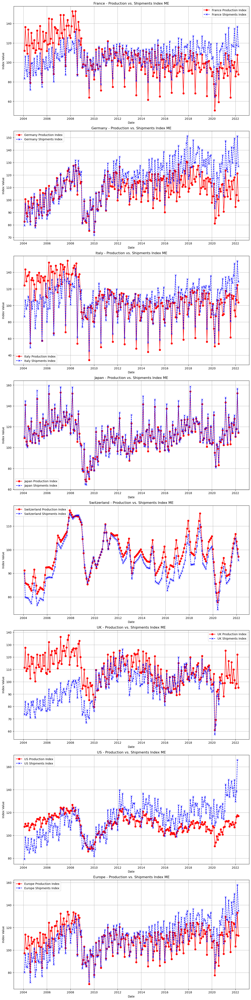

In [59]:
# List of countries
countries = [ 'France', 'Germany', 'Italy', 'Japan', 'Switzerland', 'UK', 'US', 'Europe']

# Setting up the plotting environment
fig, axs = plt.subplots(len(countries), 1, figsize=(12, 6 * len(countries)), constrained_layout=True)

# Plot for each country
for i, country in enumerate(countries):
    # Creating a boolean mask for the rows corresponding to the current country
    country_data_mask = (
        df2[f'{country} Production Index ME'].notnull() | 
        df2[f'{country} Shipments Index ME'].notnull()
    )
    
    # Filter the DataFrame for the current country
    country_df2 = df2[country_data_mask]
    
    # Plotting
    axs[i].plot(country_df2['Date'], country_df2[f'{country} Production Index ME'], label=f'{country} Production Index', marker='o', linestyle='-', color='red')
    axs[i].plot(country_df2['Date'], country_df2[f'{country} Shipments Index ME'], label=f'{country} Shipments Index', marker='x', linestyle='--', color='blue')
    
    # Title and labels
    axs[i].set_title(f'{country} - Production vs. Shipments Index ME')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Index Value')
    axs[i].legend()
    axs[i].grid(True)

plt.show()

In [60]:
df2.columns

Index(['Date', 'Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME', 'Japan Shipments Index ME',
       'Switzerland Production Index ME', 'Switzerland Shipments Index ME',
       'UK Production Index ME', 'UK Shipments Index ME',
       'US Production Index ME', 'US Shipments Index ME',
       'Europe Production Index ME', 'Europe Shipments Index ME',
       'World Base Metals Price', 'World Energy Price',
       'World: Price of Metals  & Minerals', 'World Natural Gas Price Index',
       'World Crude Oil Average Price', 'World Copper Price', 'US EUR in LCU',
       'US Producer Prices EE', 'UK Producer Prices EE',
       'Italy Producer Prices EE', 'France Producer Prices EE',
       'Germany Producer Prices EE', 'China Producer Prices EE',
       'US Machinery

In [61]:
#list with the Machinery & Electricals Index
machinery_electricals = [col for col in df2.columns if 'Index ME' in col] 

#list with Producer Prices Index
producer_prices = [col for col in df2.columns if 'Producer Prices EE' in col]

#list with World Prices
world_prices = [col for col in df2.columns if 'World' in col] 
#add also the column " EUR in LCU" from df2
world_prices.append("US EUR in LCU") 


#list with Production Index
electrical_equipment = [col for col in df2.columns if 'Production Index EE' in col]


#list with Production Index
index_electrical_equipment = [col for col in df2.columns if 'NEC' in col]

In [62]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 1 to 219
Data columns (total 49 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     219 non-null    datetime64[ns]
 1   Month                                    219 non-null    int64         
 2   Year                                     219 non-null    int64         
 3   China Production Index ME                219 non-null    object        
 4   France Production Index ME               219 non-null    object        
 5   France Shipments Index ME                219 non-null    object        
 6   Germany Production Index ME              219 non-null    object        
 7   Germany Shipments Index ME               219 non-null    object        
 8   Italy Production Index ME                219 non-null    object        
 9   Italy Shipments Index ME                 21

In [63]:
machinery_electricals

['China Production Index ME',
 'France Production Index ME',
 'France Shipments Index ME',
 'Germany Production Index ME',
 'Germany Shipments Index ME',
 'Italy Production Index ME',
 'Italy Shipments Index ME',
 'Japan Production Index ME',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME',
 'UK Shipments Index ME',
 'US Production Index ME',
 'US Shipments Index ME',
 'Europe Production Index ME',
 'Europe Shipments Index ME']

In [64]:
world_prices

['World Base Metals Price',
 'World Energy Price',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price',
 'World Machinery and Equipment NEC',
 'World Production Index EE',
 'US EUR in LCU']

In [65]:
df_copy = df2.copy()

In [66]:
df_copy['Year'] = pd.to_datetime(df_copy['Year'], format='%Y')

# Convert the 'Date' column to datetime format if it's not already
df_copy['Date'] = pd.to_datetime(df_copy['Date'])

# Now set the 'Date' column as the index of the DataFrame
df_copy.set_index('Date', inplace=True)

In [67]:
france=df_copy[df_copy.columns[df_copy.columns.str.contains('France')]]
germany=df_copy[df_copy.columns[df_copy.columns.str.contains('Germany')]]
switzerland= df_copy[df_copy.columns[df_copy.columns.str.contains('Switzerland')]]
china=df_copy[df_copy.columns[df_copy.columns.str.contains('China')]]
italy=df_copy[df_copy.columns[df_copy.columns.str.contains('Italy')]]
japan=df_copy[df_copy.columns[df_copy.columns.str.contains('Japan')]]
united_kingdom=df_copy[df_copy.columns[df_copy.columns.str.contains('UK ')]]
united_states=df_copy[df_copy.columns[df_copy.columns.str.contains('US ')]]
europe= df_copy[df_copy.columns[df_copy.columns.str.contains('Europe')]]
world = df_copy[
    (df_copy['World Production Index EE'] > 0) &
    (df_copy['World Machinery and Equipment NEC'] > 0)
]


prices = df_copy[world_prices]
prices.drop(columns="US EUR in LCU", inplace=True)

In [68]:
len(machinery_electricals) + len(producer_prices) + len(world_prices) + len(electrical_equipment) + len(index_electrical_equipment)

48

In [69]:
df_copy = df2.copy()

In [70]:
df_copy.shape

(219, 49)

In [71]:
df_copy.head()

,Date,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,...,France Machinery and Equipment NEC,Germany Machinery and Equipment NEC,US Production Index EE,World Production Index EE,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE
1,2004-02-01,2,2004,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,...,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2,2004-03-01,3,2004,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,...,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
3,2004-04-01,4,2004,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,...,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
4,2004-05-01,5,2004,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,...,116.64975,88.082901,117.899216,NaN,66.4145,119.269534,143.860535,101.60871,96.616508,84.675552
5,2004-06-01,6,2004,27.009138,133.785737,106.641482,99.010814,95.10874,136.424935,110.889719,...,143.248734,100.978699,119.499107,NaN,61.276596,128.849416,144.315308,116.655248,118.45871,95.401802


In [72]:
df_copy['Year'] = pd.to_datetime(df_copy['Year'], format='%Y')
df_copy['Date'] = pd.to_datetime(df_copy['Date'])
df_copy.set_index('Date', inplace=True)

### China

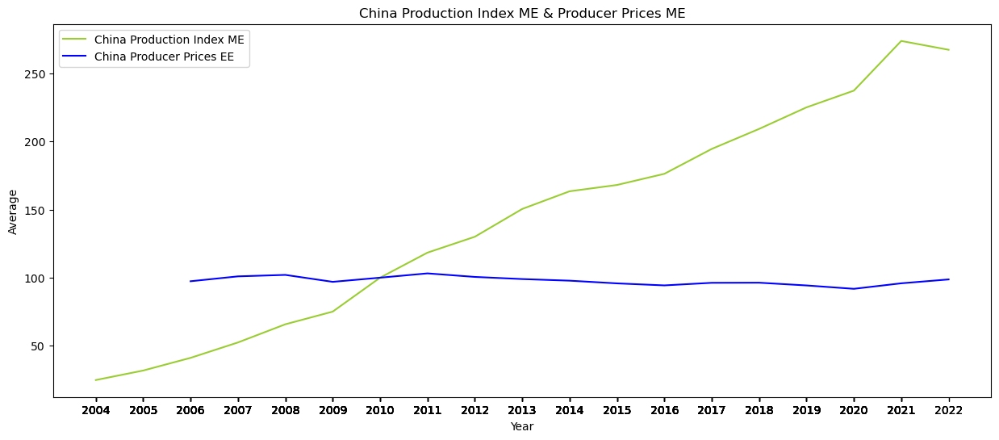

In [73]:
china.groupby(china.index.year).mean().plot(figsize=(15, 6), color = ["yellowgreen","blue","red","grey","orange"])
plt.title("China Production Index ME & Producer Prices ME")
plt.xlabel("Year")
plt.ylabel("Average")
plt.xticks(china.index.year)
plt.show()

China's producer prices are approximately constant over time, while the production index compared to standardized value (2010) has been rising linearly from 2004 to 2022.

### France

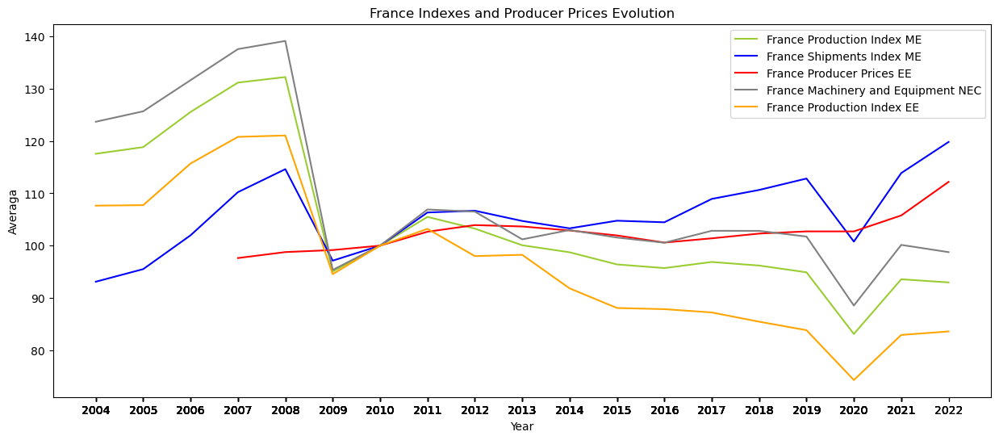

In [74]:
#group by year and plot the evolution of the mean of the columns 
france.groupby(france.index.year).mean().plot(figsize=(15, 6), color = ["yellowgreen","blue","red","grey","orange"])
plt.title("France Indexes and Producer Prices Evolution")
plt.xlabel("Year")
plt.xticks(france.index.year)
plt.ylabel("Averaga")
plt.show()

The indexes in France are displaying a consistent trend. This consistency is evident not only in the overall indexes but also in the individual categories such as machinery and electrical equipment production. Despite potential variations in specific product definitions in each broader category (machinery or electricals) between EU classifications and those used in global index calculations, the underlying pattern remains unmistakable. We anticipate similar trends to emerge in other countries.

Producer prices remained stable until 2020 but experienced a sharp exponential rise thereafter, likely attributable to the impact of the COVID-19 pandemic.

### Germany

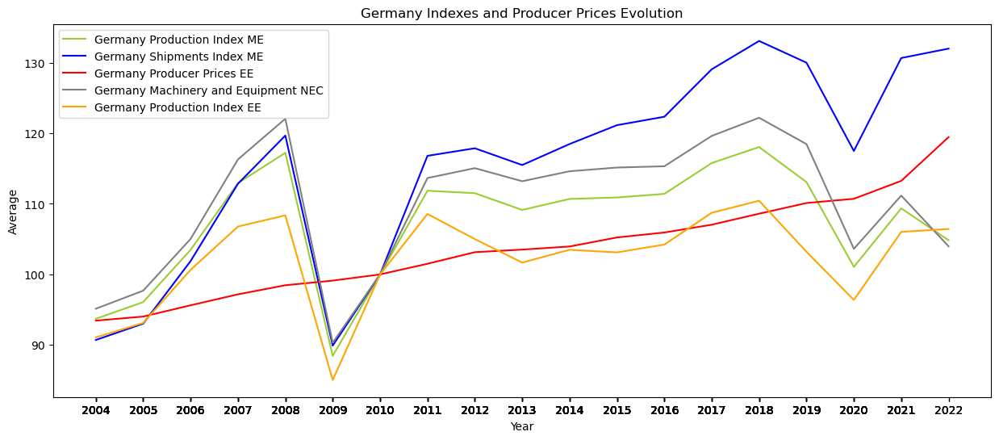

In [75]:
#group by year and plot the evolution of the mean of the columns 
germany.groupby(germany.index.year).mean().plot(figsize=(15, 6), color = ["yellowgreen","blue","red","grey","orange"])
plt.title("Germany Indexes and Producer Prices Evolution")
plt.xlabel("Year")
plt.xticks(germany.index.year)
plt.ylabel("Average")
plt.show()

As expected, Germany's indexes follow the same trend, as well as the producer price.

### Italy

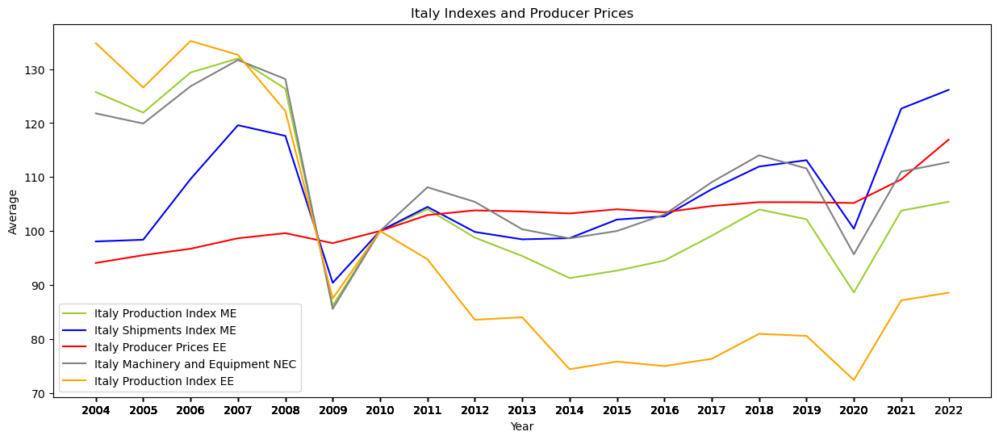

In [76]:
#group by year and plot the evolution of the mean of the columns 
italy.groupby(italy.index.year).mean().plot(figsize=(15, 6),  color = ["yellowgreen","blue","red","grey","orange"])
plt.title("Italy Indexes and Producer Prices")
plt.xlabel("Year")
plt.xticks(italy.index.year)
plt.ylabel("Average")
plt.show()


As expected, Italy's indexes follow the same trend, as well as the producer price.

### Japan

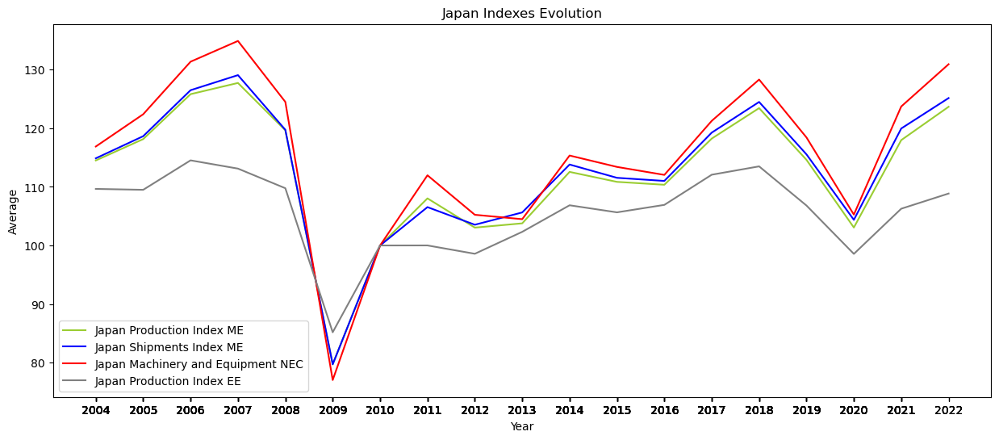

In [77]:
#group by year and plot the evolution of the mean of the columns 
japan.groupby(japan.index.year).mean().plot(figsize=(15, 6),  color = ["yellowgreen","blue","red","grey","orange"])
plt.title("Japan Indexes Evolution")
plt.xlabel("Year")
plt.xticks(japan.index.year)
plt.ylabel("Average")
plt.show()

As expected, Japan's indexes follow the same trend.

### Switzerland

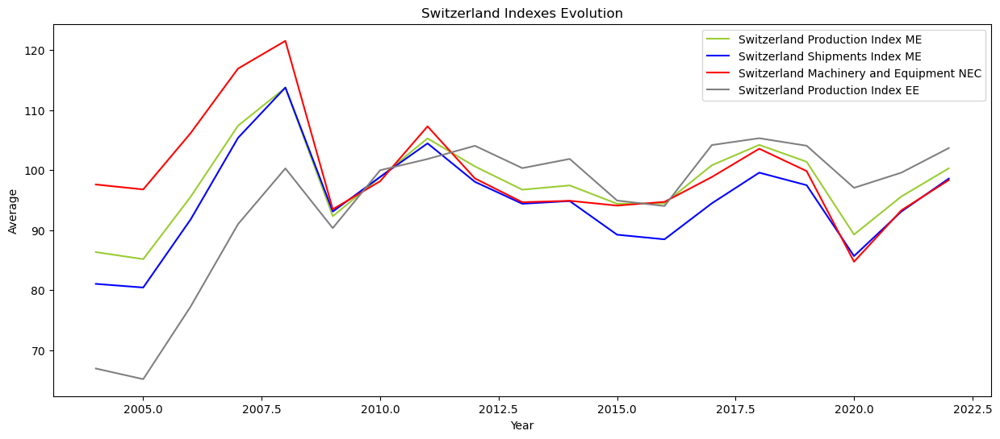

In [78]:
#group by year and plot the evolution of the mean of the columns 
switzerland.groupby(switzerland.index.year).mean().plot(figsize=(15, 6),  color = ["yellowgreen","blue","red","grey","orange"])
plt.title("Switzerland Indexes Evolution")
plt.xlabel("Year")
plt.ylabel("Average")
plt.show()

As expected, Switzerland's indexes follow the same trend, as well as the producer price.

### UK

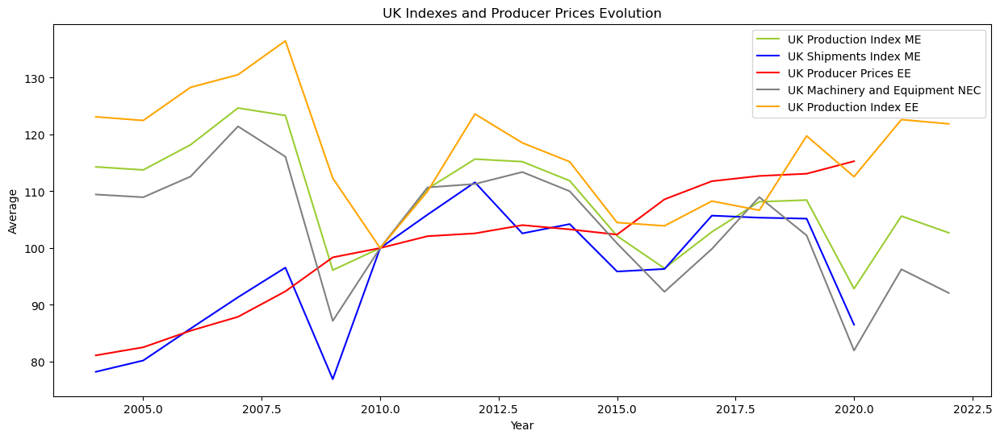

In [79]:
#group by year and plot the evolution of the mean of the columns 
united_kingdom.groupby(united_kingdom.index.year).mean().plot(figsize=(15, 6),  color = ["yellowgreen","blue","red","grey","orange"])
plt.title("UK Indexes and Producer Prices Evolution")
plt.xlabel("Year")
plt.ylabel("Average")
plt.show()

As expected, UK's indexes follow the same trend, aside from the shipments index from 2004 till 2009 that were much lower. Also, the producer prices increased over time, but also rose faster from 2020 onwards.

### US

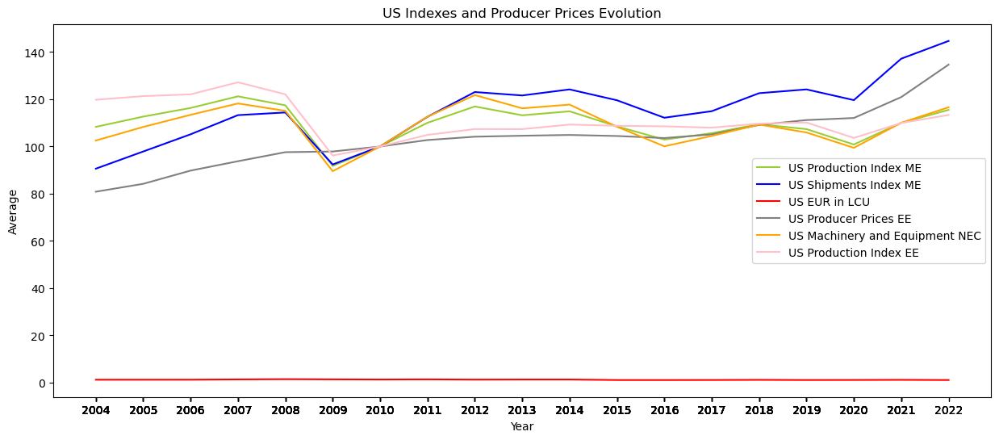

In [80]:
#group by year and plot the evolution of the mean of the columns 
united_states.groupby(united_states.index.year).mean().plot(figsize=(15, 6),  color = ["yellowgreen","blue","red","grey","orange", "pink"])
plt.title("US Indexes and Producer Prices Evolution")
plt.xlabel("Year")
plt.xticks(united_states.index.year)
plt.ylabel("Average")
plt.show()


As expected, US' indexes follow the same trend, as well as the producer price.

### Europe

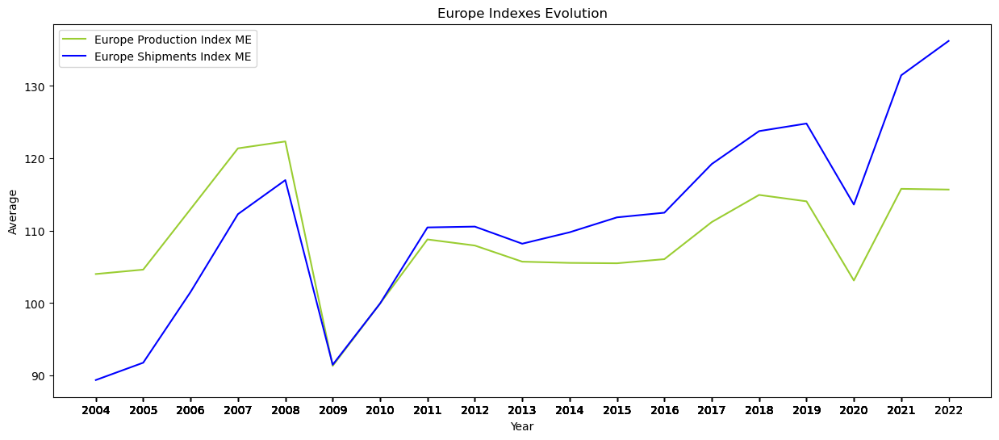

In [81]:
#group by year and plot the evolution of the mean of the columns 
europe.groupby(europe.index.year).mean().plot(figsize=(15, 6),   color = ["yellowgreen","blue","red","grey","orange", "pink"])
plt.title("Europe Indexes Evolution")
plt.xlabel("Year")
plt.xticks(europe.index.year)
plt.ylabel("Average")
plt.show()

As expected, Europe's indexes follow the same trend.

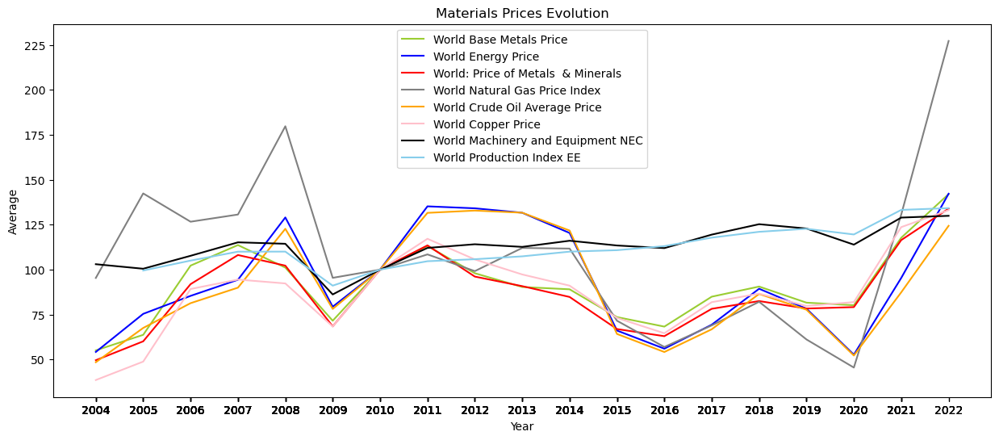

In [82]:
#group by year and plot the evolution of the mean of the columns 
prices.groupby(prices.index.year).mean().plot(figsize=(15, 6), color = ["yellowgreen","blue","red","grey","orange", "pink","black","skyblue" ],  legend=True)
plt.title("Materials Prices Evolution")
plt.xlabel("Year")
plt.xticks(prices.index.year)
plt.ylabel("Average")
plt.legend(prices.columns)
plt.show()

The price trends of base metals, metals and minerals, and copper exhibit remarkable similarity from 2004 to 2022. This correlation likely arises because copper falls within the category of base metals, and metals encompass base metals, indicating an inherent connection among these variables.

Similarly, the price evolution of energy and crude oil demonstrates a consistent pattern. This correlation can be attributed to crude oil serving as a primary source of energy, thereby influencing the trends in energy prices.

During the global economic crisis of 2008-2009, the natural gas index experienced a significant decline, highlighting its sensitivity to external economic events. Subsequently, from 2020 onwards, the natural gas index witnessed an exponential rise, possibly due to the impacts of the COVID-19 pandemic. This index emerges as the most volatile, particularly susceptible to external shocks and fluctuations.

# Merge Sales and Market Data

Now, let's merge the sales column by month from the sales dataset into the market dataset (both prepared). This will naturaly erase market data prior to october 2018.

In [83]:
merged_data = pd.merge(df2, monthly_sales[['Date', 'Total Sales']], on='Date', how='left')

# Filter out rows earlier than October 2018
merged_data = merged_data[merged_data['Date'] >= '2018-10-01']
merged_data = merged_data.set_index('Date')
merged_data.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Germany Machinery and Equipment NEC,US Production Index EE,World Production Index EE,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE,Total Sales
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,127.461136,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,49471380.83
2018-11-01,11,2018,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,...,132.987915,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727,30770915.55
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,137.363281,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,61581606.42
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,104.43293,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097,51510914.75
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,112.838226,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771,54417002.75
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,128.612549,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054,61978810.29
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,115.025909,109.490013,119.415619,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265,60866953.22
2019-05-01,5,2019,234.169196,94.77955,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,120.20726,111.786377,122.786171,93.018125,117.593055,91.637192,101.892947,84.022011,107.468842,65664853.00
2019-06-01,6,2019,261.12635,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,116.06218,112.188866,125.1688,90.496454,123.101487,83.527031,112.251279,87.456879,95.814354,66404511.58


Let's create a new variable to differentiate covid years from no covid years. COVID was declared to be a global pandemic in january 2020 and "ended" in march 2023, therefore we will create a boolean variable wher 1 indicates covid times and 0 no covid.

In [84]:
# Create the 'Covid_boolean' column
merged_data['Covid_boolean'] = ((merged_data['Year'] >= 2020) & (merged_data['Year'] <= 2022)).astype(int)

merged_data.head(10)

#Source: ChatGPT

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,US Production Index EE,World Production Index EE,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE,Total Sales,Covid_boolean
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,112.853256,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,49471380.83,0
2018-11-01,11,2018,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,...,113.145294,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727,30770915.55,0
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,111.823624,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,61581606.42,0
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,109.499725,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097,51510914.75,0
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,110.835655,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771,54417002.75,0
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,111.092499,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054,61978810.29,0
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,109.490013,119.415619,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265,60866953.22,0
2019-05-01,5,2019,234.169196,94.77955,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,111.786377,122.786171,93.018125,117.593055,91.637192,101.892947,84.022011,107.468842,65664853.00,0
2019-06-01,6,2019,261.12635,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,112.188866,125.1688,90.496454,123.101487,83.527031,112.251279,87.456879,95.814354,66404511.58,0


Let's introduce a new variable to distinguish increased sales figures resulting from end-of-year pressures. In the case of Siemens, where the fiscal year concludes in September, it's observed from the total monthly sales visualizations that sales tend to surge in the preceding four months. Hence, we'll designate 1 to signify the proximity to the year-end closure and 0 otherwise.

In [85]:
# Create a new variable to place 1 if between June and September of each year, and 0 otherwise
merged_data['Year_closure_boolean'] = ((merged_data['Month'] >= 6) & (merged_data['Month'] <= 9)).astype(int)

merged_data.head(10)

#Source: ChatGPT

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,World Production Index EE,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE,Total Sales,Covid_boolean,Year_closure_boolean
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,129.325775,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,49471380.83,0,0
2018-11-01,11,2018,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,...,128.236176,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727,30770915.55,0,0
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,117.043549,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,61581606.42,0,0
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,111.522202,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097,51510914.75,0,0
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,112.666725,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771,54417002.75,0,0
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,131.456177,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054,61978810.29,0,0
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,119.415619,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265,60866953.22,0,0
2019-05-01,5,2019,234.169196,94.77955,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,122.786171,93.018125,117.593055,91.637192,101.892947,84.022011,107.468842,65664853.00,0,0
2019-06-01,6,2019,261.12635,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,125.1688,90.496454,123.101487,83.527031,112.251279,87.456879,95.814354,66404511.58,0,1


From March 23, 2021 to March 29, 2021, there was a temporary blockage in the Suez canal, where a ship blocked other container ships from departing and arriving in the one of the world's busiest trade routes.
So let's create a new variable to differentiate this disruption to global trade as hundreds of ships were stranded, waiting for the canal to reopen. Therefore, we will create a boolean variable where 1 indicates blockage and 0 usual free pass.

In [86]:
# Create a new variable to place 1 if between 2021-03-23 and 2021-03-29, and 0 otherwise
merged_data['Suez_block_boolean'] = 0
merged_data.loc[(merged_data.index >= '2021-03-23') & (merged_data.index <= '2021-03-29'), 'Suez_block_boolean'] = 1

merged_data.head(10)

#Source: ChatGPT

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE,Total Sales,Covid_boolean,Year_closure_boolean,Suez_block_boolean
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,49471380.83,0,0,0
2018-11-01,11,2018,220.519655,99.636911,115.95821,127.404132,142.732193,107.71926,120.132032,122.624695,...,114.736013,120.467019,84.1334,111.907535,91.15596,117.163727,30770915.55,0,0,0
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,61581606.42,0,0,0
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,110.35461,107.174933,81.556343,95.957352,81.908257,105.406097,51510914.75,0,0,0
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,104.208038,110.64764,83.451233,107.309956,80.322929,103.652771,54417002.75,0,0,0
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054,61978810.29,0,0,0
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265,60866953.22,0,0,0
2019-05-01,5,2019,234.169196,94.77955,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,93.018125,117.593055,91.637192,101.892947,84.022011,107.468842,65664853.00,0,0,0
2019-06-01,6,2019,261.12635,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,90.496454,123.101487,83.527031,112.251279,87.456879,95.814354,66404511.58,0,1,0


In [87]:
merged_data.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME', 'Japan Shipments Index ME',
       'Switzerland Production Index ME', 'Switzerland Shipments Index ME',
       'UK Production Index ME', 'UK Shipments Index ME',
       'US Production Index ME', 'US Shipments Index ME',
       'Europe Production Index ME', 'Europe Shipments Index ME',
       'World Base Metals Price', 'World Energy Price',
       'World: Price of Metals  & Minerals', 'World Natural Gas Price Index',
       'World Crude Oil Average Price', 'World Copper Price', 'US EUR in LCU',
       'US Producer Prices EE', 'UK Producer Prices EE',
       'Italy Producer Prices EE', 'France Producer Prices EE',
       'Germany Producer Prices EE', 'China Producer Prices EE',
       'US Machinery and Equ

In [88]:
merged_data.dtypes

Month                                        int64
Year                                         int64
China Production Index ME                   object
France Production Index ME                  object
France Shipments Index ME                   object
Germany Production Index ME                 object
Germany Shipments Index ME                  object
Italy Production Index ME                   object
Italy Shipments Index ME                    object
Japan Production Index ME                   object
Japan Shipments Index ME                    object
Switzerland Production Index ME             object
Switzerland Shipments Index ME              object
UK Production Index ME                      object
UK Shipments Index ME                       object
US Production Index ME                      object
US Shipments Index ME                       object
Europe Production Index ME                  object
Europe Shipments Index ME                   object
World Base Metals Price        

Change data type from object to float, since the values of the columns represent decimal numbers.

In [89]:
# Convert object columns to float
object_columns = merged_data.select_dtypes(include=['object']).columns
merged_data[object_columns] = merged_data[object_columns].astype(float, errors='ignore')

In [90]:
merged_data.dtypes

Month                                        int64
Year                                         int64
China Production Index ME                  float64
France Production Index ME                 float64
France Shipments Index ME                  float64
Germany Production Index ME                float64
Germany Shipments Index ME                 float64
Italy Production Index ME                  float64
Italy Shipments Index ME                   float64
Japan Production Index ME                  float64
Japan Shipments Index ME                   float64
Switzerland Production Index ME            float64
Switzerland Shipments Index ME             float64
UK Production Index ME                     float64
UK Shipments Index ME                      float64
US Production Index ME                     float64
US Shipments Index ME                      float64
Europe Production Index ME                 float64
Europe Shipments Index ME                  float64
World Base Metals Price        

It appears that the column labeled "United States: EUR in LCU" represents the exchange rate from the local currency unit (LCU) of various countries to the euro. Given that some countries in our dataset employ currencies other than the euro, and our target variable (sales) is denominated in euros, it is necessary to convert all units to euros. This conversion entails multiplying the sales variable by the exchange rates for currencies other than the euro. We are essencialy talking about producer prices columns and average shifts in price worldwide.

In [91]:
us_eur_in_lcu_column = 'US EUR in LCU'

# List of columns that need to be converted
columns_to_convert = [
    'World Base Metals Price', 
    'World Energy Price', 
    'World: Price of Metals  & Minerals', 
    'World Crude Oil Average Price', 
    'World Copper Price', 
    'US Producer Prices EE', 
    'UK Producer Prices EE', 
    'China Producer Prices EE'
]

# Iterate over each column to perform the conversion
for column in columns_to_convert:
    merged_data[column] = merged_data[column] * merged_data[us_eur_in_lcu_column]

In [92]:
merged_data.drop(columns=['US EUR in LCU'], inplace=True)

In [93]:
merged_data.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Switzerland Production Index EE,UK Production Index EE,Italy Production Index EE,Japan Production Index EE,France Production Index EE,Germany Production Index EE,Total Sales,Covid_boolean,Year_closure_boolean,Suez_block_boolean
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,112.970843,118.670791,93.001511,112.376774,97.849541,118.298233,49471380.83,0,0,0
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,114.736013,120.467019,84.133400,111.907535,91.155960,117.163727,30770915.55,0,0,0
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,116.501182,105.378705,64.881248,112.524242,78.033028,89.626122,61581606.42,0,0,0
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,110.354610,107.174933,81.556343,95.957352,81.908257,105.406097,51510914.75,0,0,0
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,104.208038,110.647640,83.451233,107.309956,80.322929,103.652771,54417002.75,0,0,0
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,98.061466,126.214949,88.832741,131.450762,92.477066,111.388054,61978810.29,0,0,0
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,95.539795,113.521605,75.947449,101.308407,85.519257,102.518265,60866953.22,0,0,0
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,93.018125,117.593055,91.637192,101.892947,84.022011,107.468842,65664853.00,0,0,0
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,90.496454,123.101487,83.527031,112.251279,87.456879,95.814354,66404511.58,0,1,0


## Relevancy Check

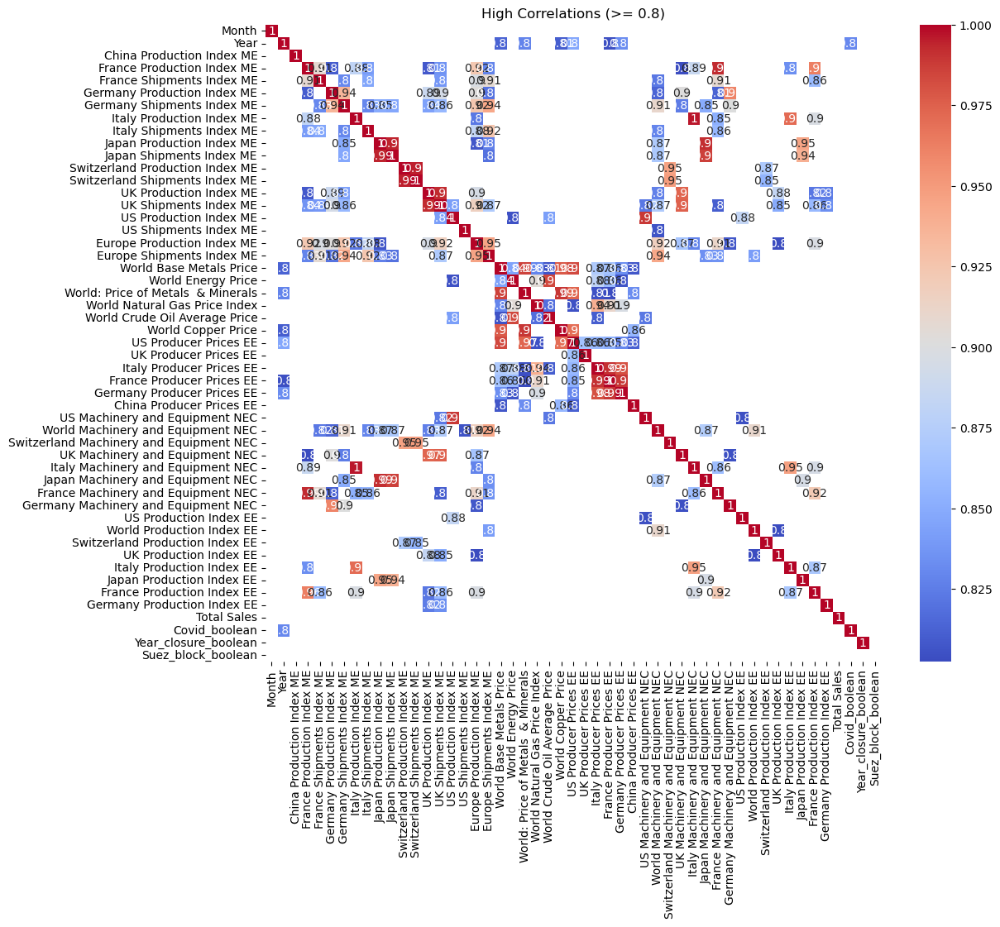

In [94]:
# correlation matrix between market variables and sales
correlation_matrix = merged_data.corr()

# Filter correlations higher than 0.8
high_correlations = correlation_matrix[correlation_matrix > 0.8]

# Visualize high correlations using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(high_correlations, annot=True, cmap='coolwarm')
plt.title('High Correlations (>= 0.8)')
plt.show()

#Source: ChatGPT

Overall, we can say that production and shipment index are highly correlated, meaning that when the production index rises the shipment index will rise too. Since we already drop shipment index of China, it was already an indication that something else was happening besides a random mistake. Right now, we will not drop these features based solely on this information but we will keep this in mind when analysing the results resulting from feature selection.

Also, due to exportations, is normal to see that the production index are correlated between countries.

Moreover, is interesting to not that the France, Germany and US producer prices are highly correlated with the month (probably, their prices vary more on a monthy basis, than other countries that need more time to adjust them). Also, US plays a huge role on setting other countries producer prices.

We deem the datasets ready for further analysis, confident in our thorough understanding of the data.

# Data Exploration

## Defining some useful functions

Function to extract sales for a specific product to be part of new dataframe figuring sales for only one product to be treated independently of the other products.

In [98]:
# Function to extract sales for a specific product
def extract_product_sales(monthly_sales, product_name):
    # Selecting only the 'Date' column and the column corresponding to the product
    product_sales = monthly_sales[['Date', product_name]]
    return product_sales

#Source: ChatGPT

Function to create 12 lag features (monthly basis) per feature in the dataset.

In [99]:
def create_lag_features(df, lag_months=12, exclude_vars=None):
    # If no variables are specified to exclude, initialize to an empty list
    if exclude_vars is None:
        exclude_vars = []

    # Make a copy of the original DataFrame
    df_with_lags = df.copy()

    # Loop through each column in the DataFrame
    for col in df.columns:
        # Check if the column is in the list of variables to exclude or if it's not suitable for lagging
        if col not in exclude_vars and col != 'Year' and col != 'Month' and col != 'Total Sales':
            # Create lagged features for the current column
            for i in range(1, lag_months + 1):
                df_with_lags[f"{col}_lag_{i}"] = df_with_lags[col].shift(i)

    return df_with_lags

#Source: ChatGPT

Function to create a new dataframe with all original features and the lag features.

In [100]:
def create_lagged_data(df, lag_months):
    # Copy the original DataFrame
    lagged_df = df.copy()
    # Shift the index by the specified number of months
    lagged_df.index = lagged_df.index - pd.DateOffset(months=lag_months)
    return lagged_df

# Source: ChatGPT

Function to apply CatBoost model for each training and test data according to the specifications of each product.

In [101]:
def catboost_model(train_features, train_target, test_features, test_target, params):
    # Initialize CatBoost regressor
    catboost_reg = CatBoostRegressor(**params)

    # Fit the model on the training data
    catboost_reg.fit(train_features, train_target, verbose=0)

    # Predict on the test data
    predictions = catboost_reg.predict(test_features)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(test_target, predictions))
    
    return rmse, predictions

# Source: ChatGPT    

In [102]:
original_names= ['China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME', 'Japan Shipments Index ME',
       'Switzerland Production Index ME', 'Switzerland Shipments Index ME',
       'UK Production Index ME', 'UK Shipments Index ME',
       'US Production Index ME', 'US Shipments Index ME',
       'Europe Production Index ME', 'Europe Shipments Index ME',
       'World Base Metals Price', 'World Energy Price',
       'World: Price of Metals  & Minerals', 'World Natural Gas Price Index',
       'World Crude Oil Average Price', 'World Copper Price', 'US EUR in LCU',
       'US Producer Prices EE', 'UK Producer Prices EE',
       'Italy Producer Prices EE', 'France Producer Prices EE',
       'Germany Producer Prices EE', 'China Producer Prices EE',
       'US Machinery and Equipment NEC', 'World Machinery and Equipment NEC',
       'Switzerland Machinery and Equipment NEC',
       'UK Machinery and Equipment NEC', 'Italy Machinery and Equipment NEC',
       'Japan Machinery and Equipment NEC',
       'France Machinery and Equipment NEC',
       'Germany Machinery and Equipment NEC', 'US Production Index EE',
       'World Production Index EE', 'Switzerland Production Index EE',
       'UK Production Index EE', 'Italy Production Index EE',
       'Japan Production Index EE', 'France Production Index EE',
       'Germany Production Index EE', 'Year_closure_boolean','Covid_boolean', 'Suez_block_boolean']

From now on, we will treat each product group's sales individually for forecasting, since each product group as its own unique demand pattern and outliers. We noticed on data understanding part that some exhibit seasonal trends, while others have more erratic sales behavior. Each product group may respond differently to various features such as the ones we have regarding macroeconomic events, thus potencialy changing the training and test sizes to split. Moreover, different forecasting models perform better for different products depending on their characteristics. Know if the time series is stationary or not, and if there are autocorrelation or partial autocorrelation between the time series and its lags, will result in different modelling stages. To count for all this differences between product group's data, we will treat them separately to improve our forecasts.

## Product Group 1

In [103]:
df_1 = extract_product_sales(monthly_sales, "GCK_1")

In [104]:
df_1.head(10)

,Date,GCK_1
0,2018-10-01,36098918.79
1,2018-11-01,5140760.00
2,2018-12-01,38116343.62
3,2019-01-01,27807651.78
4,2019-02-01,34854931.10
5,2019-03-01,33892328.89
6,2019-04-01,39728589.55
7,2019-05-01,38963877.43
8,2019-06-01,39196785.54
9,2019-07-01,38012231.56


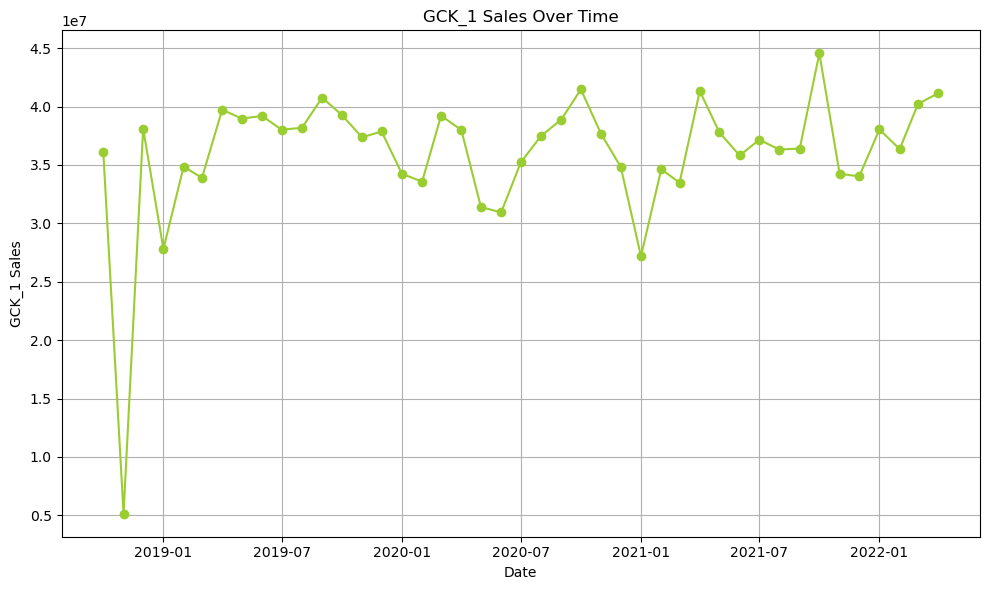

In [105]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_1['Date'], df_1['GCK_1'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_1 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_1 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

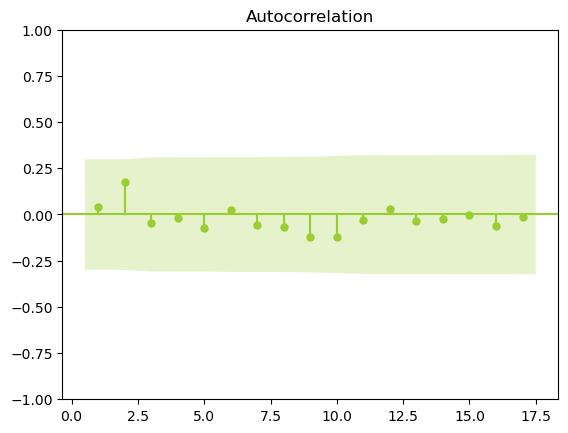

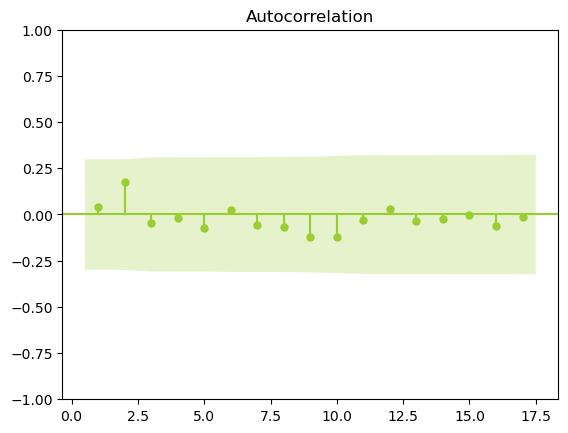

In [106]:
sm.graphics.tsa.plot_acf(df_1['GCK_1'],zero=False)

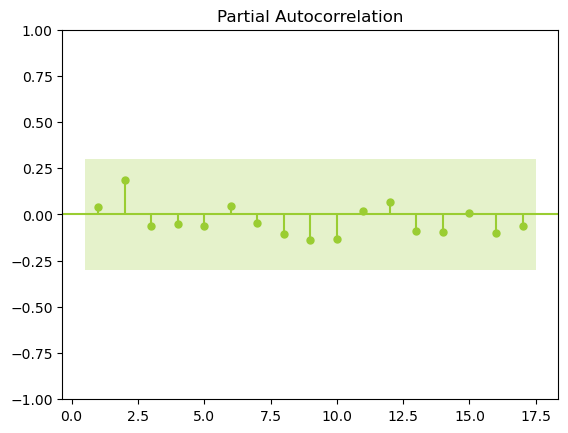

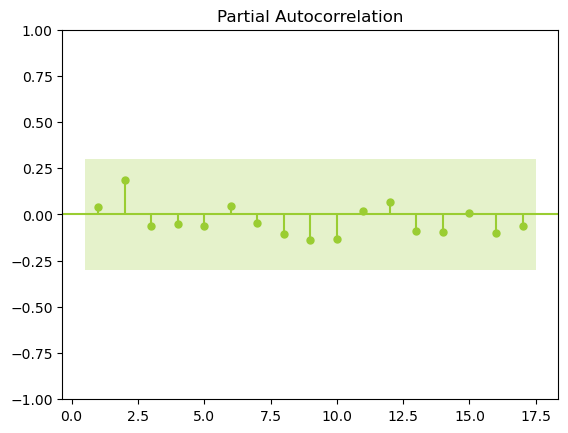

In [107]:
sm.graphics.tsa.plot_pacf(df_1['GCK_1'],zero=False)

In [108]:
# ADF test
result = adfuller(df_1['GCK_1'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.012353367578754
p-value: 1.5625596854925066e-07
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


In [109]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_1_lag{i}"] = create_lagged_data(merged_data, i)

In [110]:
lagged_data_1 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_1.drop(columns="Total Sales")
lagged_data_1 = lagged_data_1.join(df_1.set_index('Date')[['GCK_1']], how='left')
lagged_data_1.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_1
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36098918.79
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5140760.00
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38116343.62
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27807651.78
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34854931.10
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33892328.89
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,39728589.55
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,38963877.43
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,39196785.54


In [111]:
lagged_data_1.columns.tolist()

['Month',
 'Year',
 'China Production Index ME',
 'France Production Index ME',
 'France Shipments Index ME',
 'Germany Production Index ME',
 'Germany Shipments Index ME',
 'Italy Production Index ME',
 'Italy Shipments Index ME',
 'Japan Production Index ME',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME',
 'UK Shipments Index ME',
 'US Production Index ME',
 'US Shipments Index ME',
 'Europe Production Index ME',
 'Europe Shipments Index ME',
 'World Base Metals Price',
 'World Energy Price',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price',
 'US Producer Prices EE',
 'UK Producer Prices EE',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE',
 'China Producer Prices EE',
 'US Machinery and Equipment NEC',
 'World Machinery and Equipment NEC',
 'Switzerland Machinery and Equipment NEC',
 '

In [112]:
correlation = lagged_data_1.corr()["GCK_1"]
print(correlation)

Month                         0.024958
Year                          0.245268
China Production Index ME     0.201227
France Production Index ME   -0.021624
France Shipments Index ME     0.019891
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_1                         1.000000
Name: GCK_1, Length: 628, dtype: float64


In [113]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)


Columns with highest correlation: ['China Production Index ME_lag_4', 'France Production Index ME_lag_10', 'France Shipments Index ME_lag_10', 'Germany Production Index ME_lag_10', 'Germany Shipments Index ME_lag_10', 'Italy Production Index ME_lag_10', 'Italy Shipments Index ME_lag_10', 'Japan Production Index ME_lag_7', 'Japan Shipments Index ME_lag_7', 'Switzerland Production Index ME_lag_8', 'Switzerland Shipments Index ME_lag_8', 'UK Production Index ME_lag_7', 'UK Shipments Index ME_lag_9', 'US Production Index ME_lag_7', 'US Shipments Index ME', 'Europe Production Index ME_lag_10', 'Europe Shipments Index ME_lag_10', 'World Base Metals Price_lag_10', 'World Energy Price_lag_9', 'World: Price of Metals  & Minerals_lag_9', 'World Natural Gas Price Index_lag_8', 'World Crude Oil Average Price_lag_9', 'World Copper Price_lag_10', 'US Producer Prices EE_lag_9', 'UK Producer Prices EE_lag_5', 'Italy Producer Prices EE_lag_8', 'France Producer Prices EE_lag_8', 'Germany Producer Prices

In [114]:
highest_corr_columns

['China Production Index ME_lag_4',
 'France Production Index ME_lag_10',
 'France Shipments Index ME_lag_10',
 'Germany Production Index ME_lag_10',
 'Germany Shipments Index ME_lag_10',
 'Italy Production Index ME_lag_10',
 'Italy Shipments Index ME_lag_10',
 'Japan Production Index ME_lag_7',
 'Japan Shipments Index ME_lag_7',
 'Switzerland Production Index ME_lag_8',
 'Switzerland Shipments Index ME_lag_8',
 'UK Production Index ME_lag_7',
 'UK Shipments Index ME_lag_9',
 'US Production Index ME_lag_7',
 'US Shipments Index ME',
 'Europe Production Index ME_lag_10',
 'Europe Shipments Index ME_lag_10',
 'World Base Metals Price_lag_10',
 'World Energy Price_lag_9',
 'World: Price of Metals  & Minerals_lag_9',
 'World Natural Gas Price Index_lag_8',
 'World Crude Oil Average Price_lag_9',
 'World Copper Price_lag_10',
 'US Producer Prices EE_lag_9',
 'UK Producer Prices EE_lag_5',
 'Italy Producer Prices EE_lag_8',
 'France Producer Prices EE_lag_8',
 'Germany Producer Prices EE_lag

In [115]:
#keep only the best lags for each feactures
best_lags_1= lagged_data_1[ highest_corr_columns + ["GCK_1"]]

In [116]:
best_lags_1.head(10)

,China Production Index ME_lag_4,France Production Index ME_lag_10,France Shipments Index ME_lag_10,Germany Production Index ME_lag_10,Germany Shipments Index ME_lag_10,Italy Production Index ME_lag_10,Italy Shipments Index ME_lag_10,Japan Production Index ME_lag_7,Japan Shipments Index ME_lag_7,Switzerland Production Index ME_lag_8,...,Switzerland Production Index EE_lag_3,UK Production Index EE_lag_1,Italy Production Index EE_lag_9,Japan Production Index EE_lag_7,France Production Index EE_lag_9,Germany Production Index EE_lag_7,Year_closure_boolean_lag_5,Covid_boolean_lag_4,Suez_block_boolean,GCK_1
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,36098918.79
2018-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,118.670791,NaN,NaN,NaN,NaN,NaN,NaN,0,5140760.00
2018-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,120.467019,NaN,NaN,NaN,NaN,NaN,NaN,0,38116343.62
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,112.970843,105.378705,NaN,NaN,NaN,NaN,NaN,NaN,0,27807651.78
2019-02-01,211.955755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,114.736013,107.174933,NaN,NaN,NaN,NaN,NaN,0.0,0,34854931.10
2019-03-01,220.519655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,116.501182,110.647640,NaN,NaN,NaN,NaN,0.0,0.0,0,33892328.89
2019-04-01,241.846854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,110.354610,126.214949,NaN,NaN,NaN,NaN,0.0,0.0,0,39728589.55
2019-05-01,175.668147,NaN,NaN,NaN,NaN,NaN,NaN,125.209957,124.793250,NaN,...,104.208038,113.521605,NaN,112.376774,NaN,118.298233,0.0,0.0,0,38963877.43
2019-06-01,175.668147,NaN,NaN,NaN,NaN,NaN,NaN,122.624695,123.289888,109.077781,...,98.061466,117.593055,NaN,111.907535,NaN,117.163727,0.0,0.0,0,39196785.54


In [117]:
len(highest_corr_columns)

48

### Deal with Outliers

In [118]:
# Cap values in column Total Sales for month 11
limit= 1e7 * 1.0
best_lags_1.loc[best_lags_1.index.month == 11, 'GCK_1'] = best_lags_1.loc[best_lags_1.index.month == 11, 'GCK_1'].clip(lower= limit)
                                                                          
                                                                          

### Train Test Split

In [119]:
X = best_lags_1.drop(columns=['GCK_1'])
y = best_lags_1['GCK_1']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state=42)
    
    # Train the model
    model.fit(X_train_1, y_train_1)
    
    # Make predictions
    y_pred = model.predict(X_test_1)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_1, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 2441693.238560465


In [120]:
train_size = len(X_train_1) - len(X_test_1)
print("Size of the sales train set:", train_size)

test_size = len(X_test_1)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


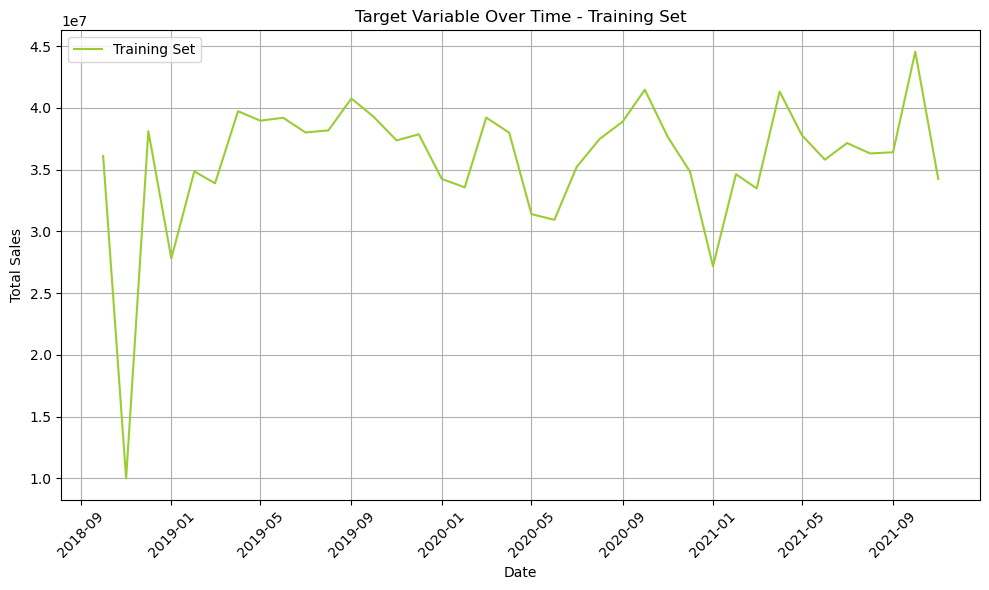

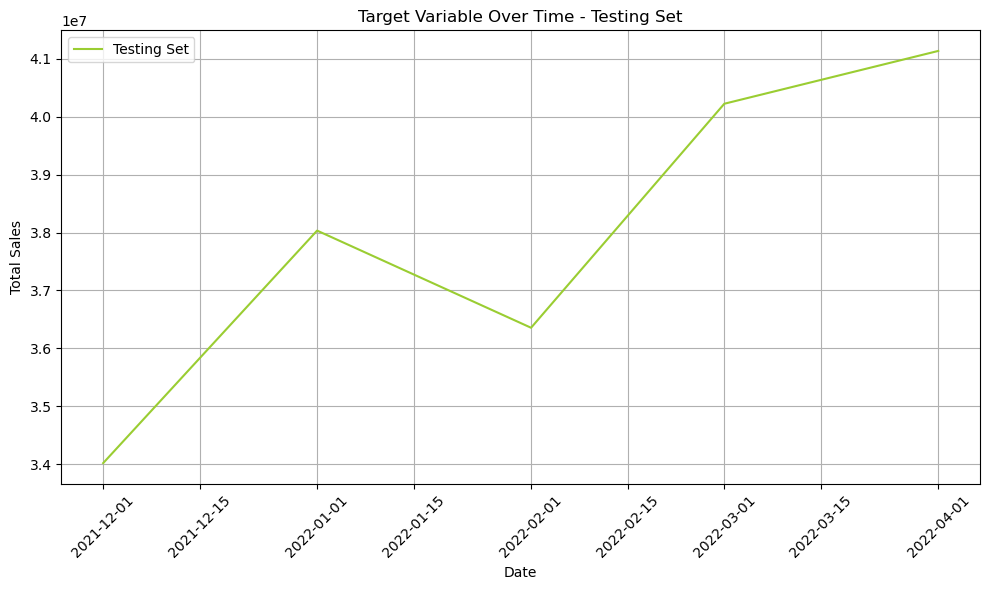

In [121]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_1.index, y_train_1, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_1.index, y_test_1, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Feature Selection

('Germany Producer Prices EE_lag_1', 0.37127321627403315)
('UK Production Index EE_lag_1', 0.21938017980558056)
('US Shipments Index ME', 0.07330109183456698)
('Italy Shipments Index ME_lag_10', 0.028410129866950712)
('China Production Index ME_lag_4', 0.026341127567548677)
('UK Producer Prices EE_lag_5', 0.023388479741537595)
('France Shipments Index ME_lag_10', 0.01809640847152744)
('Switzerland Production Index ME_lag_8', 0.013360478641084979)
('France Machinery and Equipment NEC_lag_10', 0.011522757985238693)
('US Producer Prices EE_lag_9', 0.010305659940271293)
('Germany Shipments Index ME_lag_10', 0.010095925302133133)
('World Copper Price_lag_10', 0.009758893778022717)
('World Crude Oil Average Price_lag_9', 0.009269217474646907)
('Switzerland Production Index EE_lag_3', 0.009211562433906799)
('UK Shipments Index ME_lag_9', 0.009138255495603174)
('France Production Index ME_lag_10', 0.008447315553230004)
('US Production Index ME_lag_7', 0.008319707865696854)
('Japan Shipments In

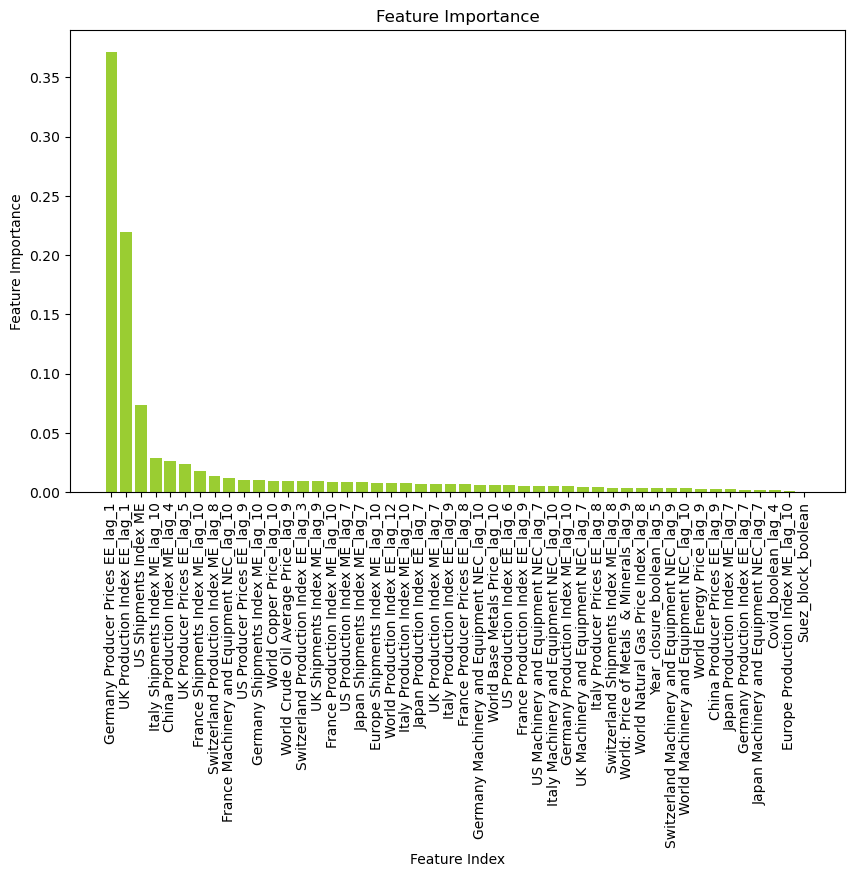

In [122]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_1, y_train_1)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_1, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [123]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_1,y_train_1)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [124]:
selected_feat_1= sel.get_feature_names_out()
selected_feat_1= list(selected_feat_1)

In [125]:
print(selected_feat_1)

['China Production Index ME_lag_4', 'Italy Shipments Index ME_lag_10', 'US Shipments Index ME', 'UK Producer Prices EE_lag_5', 'Germany Producer Prices EE_lag_1', 'UK Production Index EE_lag_1']


In [126]:
correlation_matrix = X_train_1[selected_feat_1].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

In [127]:
df_1_selected = lagged_data_1[selected_feat_1 + ["GCK_1"]]

In [128]:
# Open the file in binary write mode
with open('df_1_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_1_selected, f)

print(f"Dataset stored in {'df_1_selected.pickle'}")

Dataset stored in df_1_selected.pickle


## Product Group 3 

In [129]:
# Create a new dataframe displaying only the sales for GCK 3
df_3 = extract_product_sales(monthly_sales, 'GCK_3')
df_3.head(10)

,Date,GCK_3
0,2018-10-01,8089465.96
1,2018-11-01,11870270.20
2,2018-12-01,8739307.86
3,2019-01-01,10708075.28
4,2019-02-01,10172826.74
5,2019-03-01,11057255.22
6,2019-04-01,12319225.05
7,2019-05-01,12809906.50
8,2019-06-01,11546452.19
9,2019-07-01,13421550.83


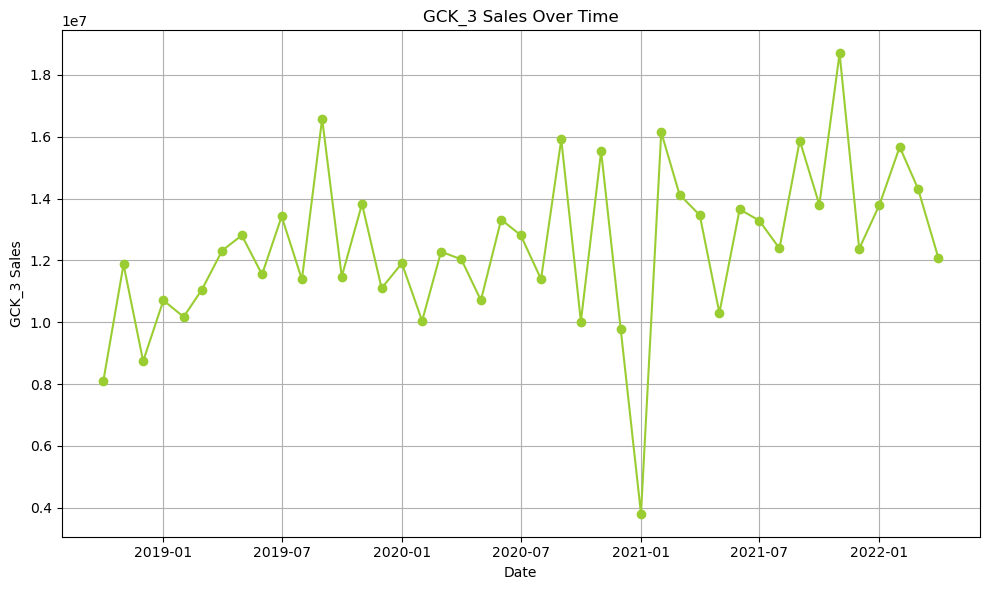

In [130]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_3['Date'], df_3['GCK_3'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_3 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_3 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

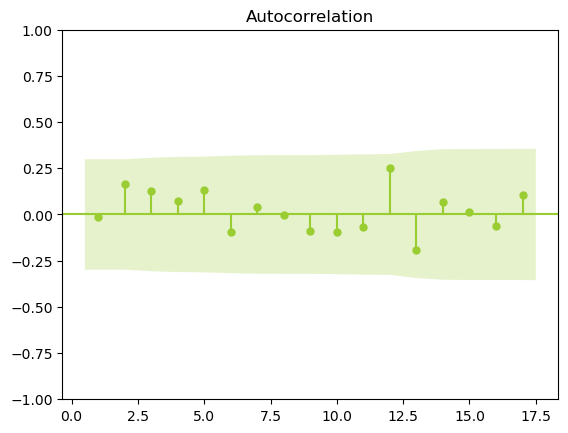

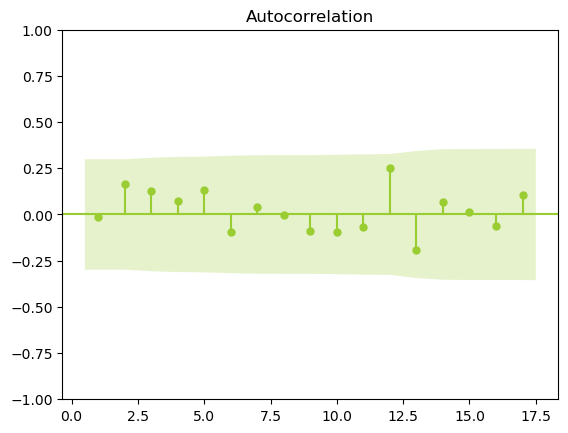

In [131]:
sm.graphics.tsa.plot_acf(df_3['GCK_3'],zero=False)

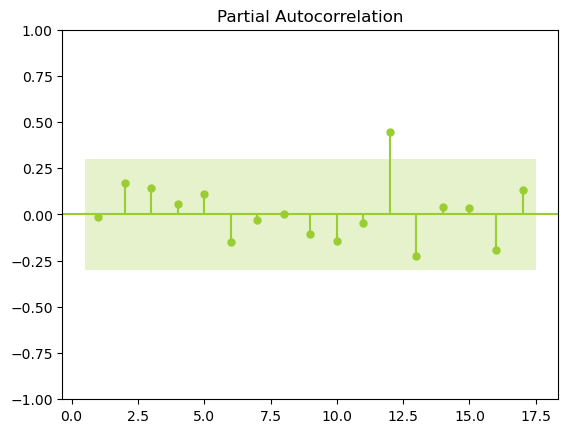

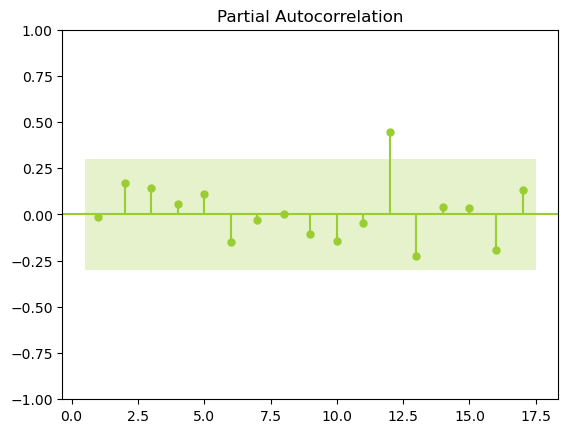

In [132]:
sm.graphics.tsa.plot_pacf(df_3['GCK_3'],zero=False)

In [133]:
# ADF test
result = adfuller(df_3['GCK_3'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.6518921466000815
p-value: 5.096284750051583e-09
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


In [134]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_3_lag{i}"] = create_lagged_data(merged_data, i)

In [135]:
lagged_data_3 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_3.drop(columns="Total Sales")
lagged_data_3 = lagged_data_3.join(df_3.set_index('Date')[['GCK_3']], how='left')
lagged_data_3.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_3
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8089465.96
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11870270.20
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8739307.86
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10708075.28
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10172826.74
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11057255.22
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,12319225.05
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,12809906.50
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,11546452.19


In [136]:
lagged_data_3.columns.tolist()

['Month',
 'Year',
 'China Production Index ME',
 'France Production Index ME',
 'France Shipments Index ME',
 'Germany Production Index ME',
 'Germany Shipments Index ME',
 'Italy Production Index ME',
 'Italy Shipments Index ME',
 'Japan Production Index ME',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME',
 'UK Shipments Index ME',
 'US Production Index ME',
 'US Shipments Index ME',
 'Europe Production Index ME',
 'Europe Shipments Index ME',
 'World Base Metals Price',
 'World Energy Price',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price',
 'US Producer Prices EE',
 'UK Producer Prices EE',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE',
 'China Producer Prices EE',
 'US Machinery and Equipment NEC',
 'World Machinery and Equipment NEC',
 'Switzerland Machinery and Equipment NEC',
 '

In [137]:
correlation = lagged_data_3.corr()["GCK_3"]
print(correlation)

Month                         0.114778
Year                          0.339419
China Production Index ME     0.286872
France Production Index ME    0.173002
France Shipments Index ME     0.216738
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_3                         1.000000
Name: GCK_3, Length: 628, dtype: float64


In [138]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_11', 'France Production Index ME_lag_9', 'France Shipments Index ME_lag_9', 'Germany Production Index ME_lag_1', 'Germany Shipments Index ME', 'Italy Production Index ME_lag_9', 'Italy Shipments Index ME_lag_9', 'Japan Production Index ME_lag_8', 'Japan Shipments Index ME_lag_8', 'Switzerland Production Index ME_lag_12', 'Switzerland Shipments Index ME_lag_12', 'UK Production Index ME_lag_8', 'UK Shipments Index ME_lag_8', 'US Production Index ME_lag_6', 'US Shipments Index ME_lag_6', 'Europe Production Index ME', 'Europe Shipments Index ME_lag_9', 'World Base Metals Price_lag_8', 'World Energy Price_lag_1', 'World: Price of Metals  & Minerals_lag_8', 'World Natural Gas Price Index', 'World Crude Oil Average Price_lag_8', 'World Copper Price_lag_8', 'US Producer Prices EE_lag_8', 'UK Producer Prices EE_lag_1', 'Italy Producer Prices EE', 'France Producer Prices EE', 'Germany Producer Prices EE', 'China Producer Prices EE

In [139]:
highest_corr_columns

['China Production Index ME_lag_11',
 'France Production Index ME_lag_9',
 'France Shipments Index ME_lag_9',
 'Germany Production Index ME_lag_1',
 'Germany Shipments Index ME',
 'Italy Production Index ME_lag_9',
 'Italy Shipments Index ME_lag_9',
 'Japan Production Index ME_lag_8',
 'Japan Shipments Index ME_lag_8',
 'Switzerland Production Index ME_lag_12',
 'Switzerland Shipments Index ME_lag_12',
 'UK Production Index ME_lag_8',
 'UK Shipments Index ME_lag_8',
 'US Production Index ME_lag_6',
 'US Shipments Index ME_lag_6',
 'Europe Production Index ME',
 'Europe Shipments Index ME_lag_9',
 'World Base Metals Price_lag_8',
 'World Energy Price_lag_1',
 'World: Price of Metals  & Minerals_lag_8',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price_lag_8',
 'World Copper Price_lag_8',
 'US Producer Prices EE_lag_8',
 'UK Producer Prices EE_lag_1',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE',
 'China Producer Prices EE_lag_8

In [140]:
#keep only the best lags for each feactures
best_lags_3= lagged_data_3[ highest_corr_columns + ["GCK_3"]]

In [141]:
best_lags_3.head(10)

,China Production Index ME_lag_11,France Production Index ME_lag_9,France Shipments Index ME_lag_9,Germany Production Index ME_lag_1,Germany Shipments Index ME,Italy Production Index ME_lag_9,Italy Shipments Index ME_lag_9,Japan Production Index ME_lag_8,Japan Shipments Index ME_lag_8,Switzerland Production Index ME_lag_12,...,Switzerland Production Index EE_lag_3,UK Production Index EE_lag_8,Italy Production Index EE_lag_9,Japan Production Index EE_lag_10,France Production Index EE_lag_8,Germany Production Index EE_lag_8,Year_closure_boolean_lag_2,Covid_boolean_lag_12,Suez_block_boolean,GCK_3
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,137.741953,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,8089465.96
2018-11-01,NaN,NaN,NaN,124.227879,142.732193,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,11870270.20
2018-12-01,NaN,NaN,NaN,127.404132,141.407661,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,8739307.86
2019-01-01,NaN,NaN,NaN,120.518565,118.703828,NaN,NaN,NaN,NaN,NaN,...,112.970843,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,10708075.28
2019-02-01,NaN,NaN,NaN,104.776326,122.686997,NaN,NaN,NaN,NaN,NaN,...,114.736013,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,10172826.74
2019-03-01,NaN,NaN,NaN,109.597012,140.116214,NaN,NaN,NaN,NaN,NaN,...,116.501182,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,11057255.22
2019-04-01,NaN,NaN,NaN,122.534648,127.512006,NaN,NaN,NaN,NaN,NaN,...,110.354610,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,12319225.05
2019-05-01,NaN,NaN,NaN,110.612414,131.993634,NaN,NaN,NaN,NaN,NaN,...,104.208038,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,12809906.50
2019-06-01,NaN,NaN,NaN,115.712333,126.769557,NaN,NaN,125.209957,124.793250,NaN,...,98.061466,118.670791,NaN,NaN,97.849541,118.298233,0.0,NaN,0,11546452.19


In [142]:
len(highest_corr_columns)

48

### Deal with outliers

In [143]:
 # Cap values in column Total Sales for month 4
limit= 1e7 * 1.3
best_lags_3.loc[best_lags_3.index.month == 4, 'GCK_3'] = best_lags_3.loc[best_lags_3.index.month == 4, 'GCK_3'].clip(upper= limit)

### Train Test Split 

In [144]:
X = best_lags_3.drop(columns=['GCK_3'])
y = best_lags_3['GCK_3']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_3, y_train_3)
    
    # Make predictions
    y_pred = model.predict(X_test_3)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_3, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 1563980.5282663966


In [145]:
train_size = len(X_train_3) - len(X_test_3)
print("Size of the sales train set:", train_size)

test_size = len(X_test_3)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


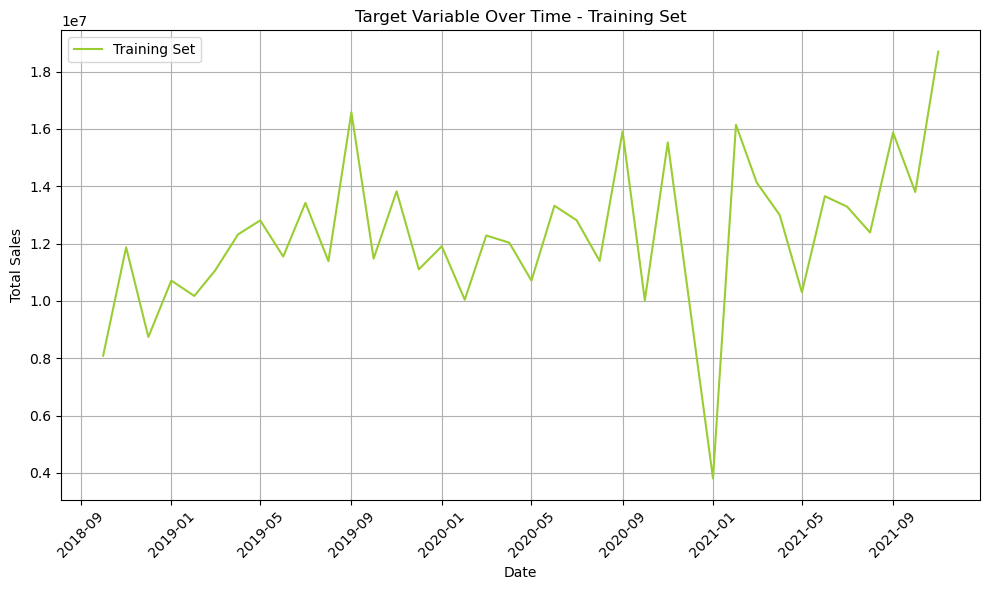

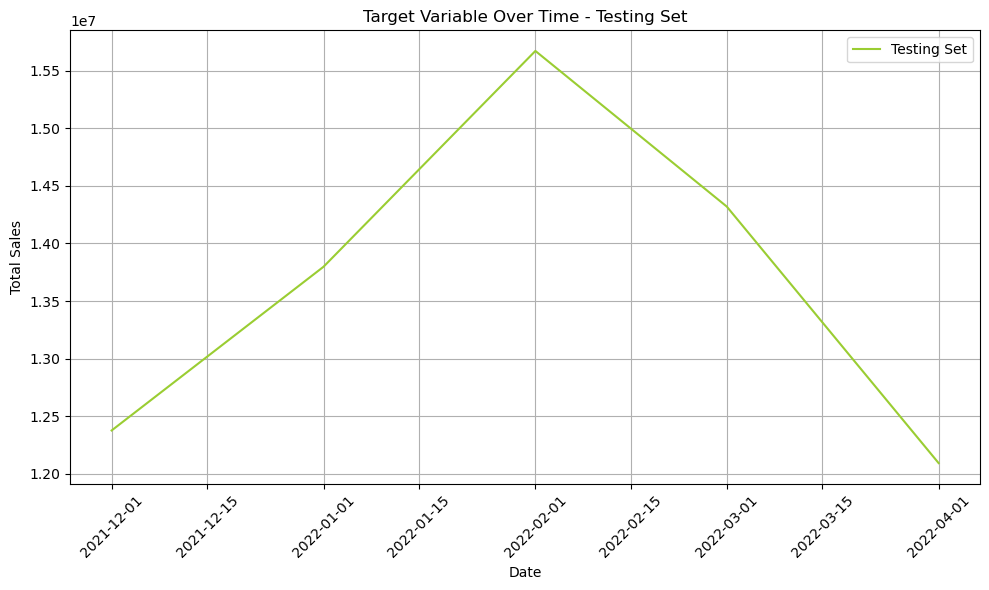

In [146]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_3.index, y_train_3, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_3.index, y_test_3, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Feature Selection

('Italy Shipments Index ME_lag_9', 0.1340435241800407)
('World Production Index EE', 0.10440150575065027)
('Italy Production Index ME_lag_9', 0.05751364619682967)
('Japan Production Index EE_lag_10', 0.052555333289046685)
('World Natural Gas Price Index', 0.049837465995134084)
('Italy Production Index EE_lag_9', 0.03857874323265457)
('Japan Production Index ME_lag_8', 0.03773034026911535)
('Germany Producer Prices EE', 0.03359338721697315)
('Europe Production Index ME', 0.0315739167966251)
('Germany Machinery and Equipment NEC_lag_1', 0.029298320695594682)
('France Production Index ME_lag_9', 0.028221467462083087)
('US Shipments Index ME_lag_6', 0.025962556050397868)
('Japan Shipments Index ME_lag_8', 0.02252914059241501)
('Germany Production Index ME_lag_1', 0.02150444216466762)
('Europe Shipments Index ME_lag_9', 0.020375143656298833)
('France Machinery and Equipment NEC_lag_9', 0.020155476183213828)
('France Shipments Index ME_lag_9', 0.01824553235051427)
('China Production Index ME

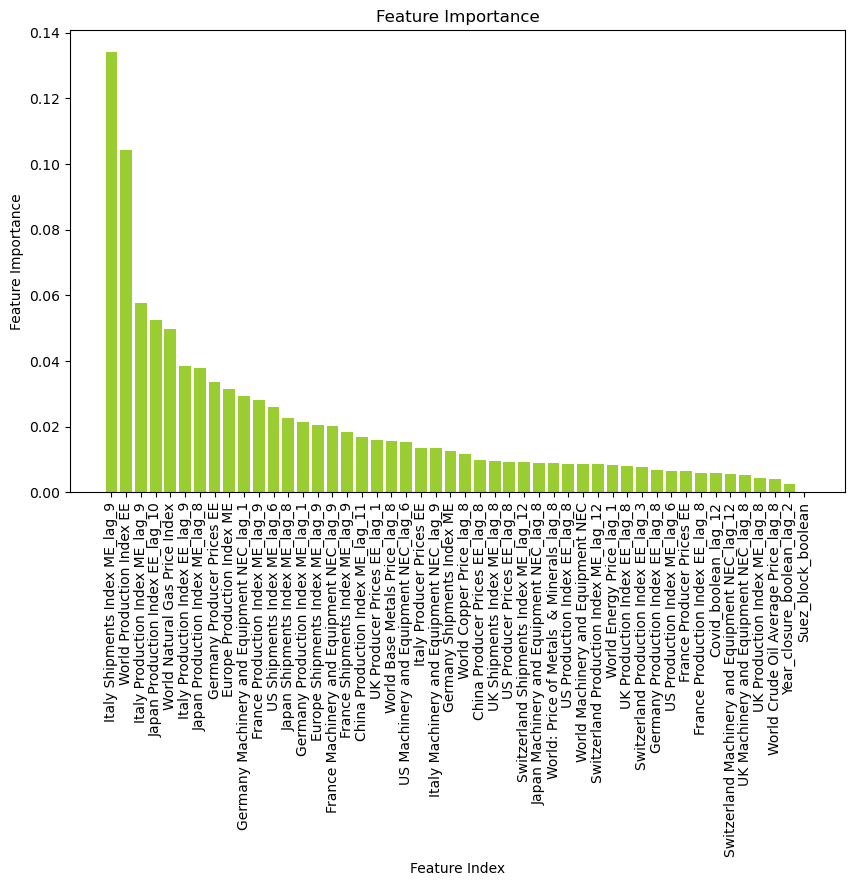

In [147]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_3, y_train_3)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_3, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [148]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_3,y_train_3)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [149]:
selected_feat_3= sel.get_feature_names_out()
selected_feat_3= list(selected_feat_3)

In [150]:
print(selected_feat_3)

['France Production Index ME_lag_9', 'Germany Production Index ME_lag_1', 'Italy Production Index ME_lag_9', 'Italy Shipments Index ME_lag_9', 'Japan Production Index ME_lag_8', 'Japan Shipments Index ME_lag_8', 'US Shipments Index ME_lag_6', 'Europe Production Index ME', 'World Natural Gas Price Index', 'Germany Producer Prices EE', 'Germany Machinery and Equipment NEC_lag_1', 'World Production Index EE', 'Italy Production Index EE_lag_9', 'Japan Production Index EE_lag_10']


In [151]:
correlation_matrix = X_train_3[selected_feat_3].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Germany Production Index ME_lag_1, Germany Machinery and Equipment NEC_lag_1
Correlation: 0.9602656311809573
Pair: Italy Production Index ME_lag_9, Italy Production Index EE_lag_9
Correlation: 0.9685016120973747
Pair: Japan Production Index ME_lag_8, Japan Shipments Index ME_lag_8
Correlation: 0.9937045579677795


In [152]:
# erase one of the pairs
selected_feat_3.remove("Germany Machinery and Equipment NEC_lag_1")
selected_feat_3.remove("Italy Production Index EE_lag_9")
selected_feat_3.remove("Japan Shipments Index ME_lag_8")

In [153]:
df_3_selected = lagged_data_3[selected_feat_3 + ["GCK_3"]]

In [154]:
# Open the file in binary write mode
with open('df_3_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_3_selected, f)

print(f"Dataset stored in {'df_3_selected.pickle'}")

Dataset stored in df_3_selected.pickle


## Product Group 4

In [155]:
# Create a new dataframe displaying only the sales for GCK 4
df_4 = extract_product_sales(monthly_sales, 'GCK_4')
df_4.head(10)

,Date,GCK_4
0,2018-10-01,397760.69
1,2018-11-01,373352.33
2,2018-12-01,436873.36
3,2019-01-01,484435.48
4,2019-02-01,620031.80
5,2019-03-01,498766.86
6,2019-04-01,428258.52
7,2019-05-01,375671.57
8,2019-06-01,190721.15
9,2019-07-01,381343.41


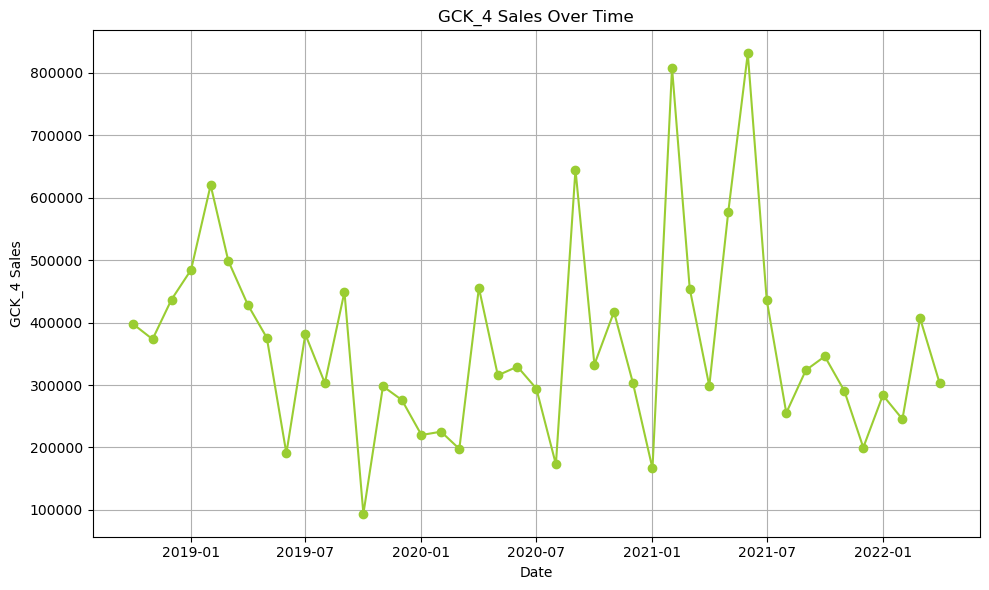

In [156]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_1['Date'], df_4['GCK_4'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_4 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_4 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

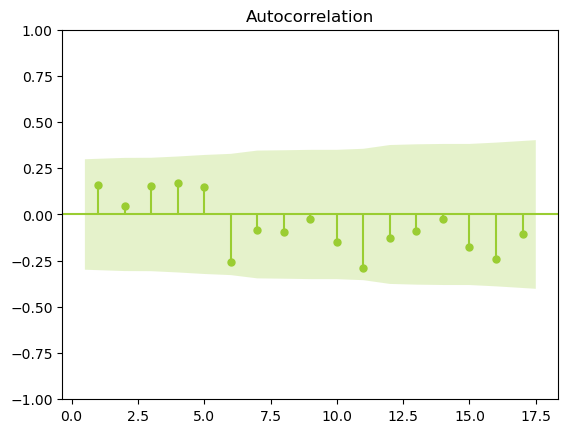

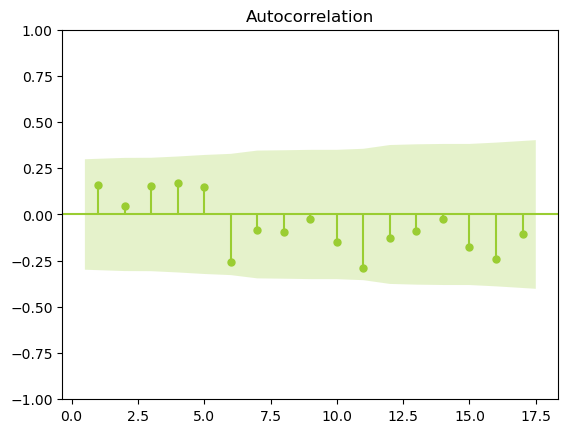

In [157]:
sm.graphics.tsa.plot_acf(df_4['GCK_4'],zero=False)

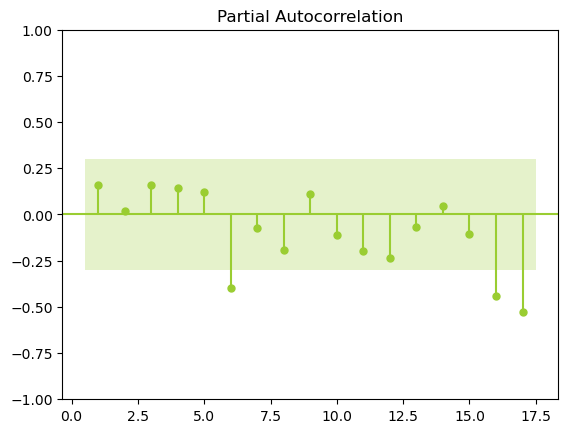

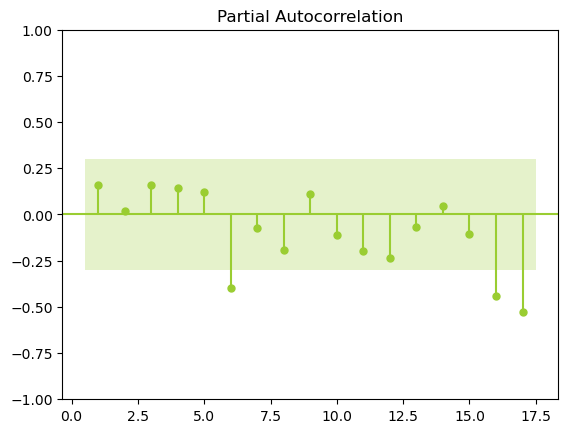

In [158]:
sm.graphics.tsa.plot_pacf(df_4['GCK_4'],zero=False)

In [159]:
# ADF test
result = adfuller(df_4['GCK_4'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -5.381421035142516
p-value: 3.705220964299735e-06
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


In [160]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_4_lag{i}"] = create_lagged_data(merged_data, i)

In [161]:
lagged_data_4 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_4.drop(columns="Total Sales")
lagged_data_4 = lagged_data_4.join(df_4.set_index('Date')[['GCK_4']], how='left')
lagged_data_4.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_4
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,397760.69
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,373352.33
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,436873.36
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,484435.48
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,620031.80
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,498766.86
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,428258.52
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,375671.57
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,190721.15


In [162]:
lagged_data_4.columns.tolist()

['Month',
 'Year',
 'China Production Index ME',
 'France Production Index ME',
 'France Shipments Index ME',
 'Germany Production Index ME',
 'Germany Shipments Index ME',
 'Italy Production Index ME',
 'Italy Shipments Index ME',
 'Japan Production Index ME',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME',
 'UK Shipments Index ME',
 'US Production Index ME',
 'US Shipments Index ME',
 'Europe Production Index ME',
 'Europe Shipments Index ME',
 'World Base Metals Price',
 'World Energy Price',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price',
 'US Producer Prices EE',
 'UK Producer Prices EE',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE',
 'China Producer Prices EE',
 'US Machinery and Equipment NEC',
 'World Machinery and Equipment NEC',
 'Switzerland Machinery and Equipment NEC',
 '

In [163]:
correlation = lagged_data_4.corr()["GCK_4"]
print(correlation)

Month                        -0.146890
Year                         -0.011402
China Production Index ME     0.113624
France Production Index ME    0.230578
France Shipments Index ME     0.161484
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_4                         1.000000
Name: GCK_4, Length: 628, dtype: float64


In [164]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_11', 'France Production Index ME_lag_10', 'France Shipments Index ME_lag_10', 'Germany Production Index ME_lag_10', 'Germany Shipments Index ME_lag_10', 'Italy Production Index ME_lag_10', 'Italy Shipments Index ME_lag_10', 'Japan Production Index ME_lag_10', 'Japan Shipments Index ME_lag_10', 'Switzerland Production Index ME_lag_12', 'Switzerland Shipments Index ME_lag_12', 'UK Production Index ME_lag_10', 'UK Shipments Index ME_lag_10', 'US Production Index ME_lag_10', 'US Shipments Index ME_lag_10', 'Europe Production Index ME_lag_10', 'Europe Shipments Index ME_lag_10', 'World Base Metals Price_lag_12', 'World Energy Price_lag_11', 'World: Price of Metals  & Minerals_lag_12', 'World Natural Gas Price Index_lag_12', 'World Crude Oil Average Price_lag_10', 'World Copper Price_lag_12', 'US Producer Prices EE_lag_12', 'UK Producer Prices EE_lag_8', 'Italy Producer Prices EE_lag_11', 'France Producer Prices EE_lag_10', 'G

In [165]:
highest_corr_columns

['China Production Index ME_lag_11',
 'France Production Index ME_lag_10',
 'France Shipments Index ME_lag_10',
 'Germany Production Index ME_lag_10',
 'Germany Shipments Index ME_lag_10',
 'Italy Production Index ME_lag_10',
 'Italy Shipments Index ME_lag_10',
 'Japan Production Index ME_lag_10',
 'Japan Shipments Index ME_lag_10',
 'Switzerland Production Index ME_lag_12',
 'Switzerland Shipments Index ME_lag_12',
 'UK Production Index ME_lag_10',
 'UK Shipments Index ME_lag_10',
 'US Production Index ME_lag_10',
 'US Shipments Index ME_lag_10',
 'Europe Production Index ME_lag_10',
 'Europe Shipments Index ME_lag_10',
 'World Base Metals Price_lag_12',
 'World Energy Price_lag_11',
 'World: Price of Metals  & Minerals_lag_12',
 'World Natural Gas Price Index_lag_12',
 'World Crude Oil Average Price_lag_10',
 'World Copper Price_lag_12',
 'US Producer Prices EE_lag_12',
 'UK Producer Prices EE_lag_8',
 'Italy Producer Prices EE_lag_11',
 'France Producer Prices EE_lag_10',
 'Germany 

In [166]:
#keep only the best lags for each feactures
best_lags_4= lagged_data_4[ highest_corr_columns + ["GCK_4"]]

In [167]:
best_lags_4.head(10)

,China Production Index ME_lag_11,France Production Index ME_lag_10,France Shipments Index ME_lag_10,Germany Production Index ME_lag_10,Germany Shipments Index ME_lag_10,Italy Production Index ME_lag_10,Italy Shipments Index ME_lag_10,Japan Production Index ME_lag_10,Japan Shipments Index ME_lag_10,Switzerland Production Index ME_lag_12,...,Switzerland Production Index EE_lag_12,UK Production Index EE_lag_10,Italy Production Index EE_lag_10,Japan Production Index EE_lag_10,France Production Index EE_lag_10,Germany Production Index EE_lag_10,Year_closure_boolean_lag_4,Covid_boolean_lag_8,Suez_block_boolean,GCK_4
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,397760.69
2018-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,373352.33
2018-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,436873.36
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,484435.48
2019-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,620031.80
2019-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,498766.86
2019-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,428258.52
2019-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,375671.57
2019-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,190721.15


In [168]:
len(highest_corr_columns)

48

### Deal with outliers 

In [169]:
# Cap values in column Total Sales for month 10
best_lags_4.loc[best_lags_4.index.month == 10, "GCK_4"] = best_lags_4.loc[best_lags_4.index.month == 10, "GCK_4"].clip(lower= 100000)

### Train Test Split

In [170]:
X = best_lags_4.drop(columns=['GCK_4'])
y = best_lags_4['GCK_4']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_4, y_train_4)
    
    # Make predictions
    y_pred = model.predict(X_test_4)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_4, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 76896.91713971263


In [171]:
train_size = len(X_train_4) - len(X_test_4)
print("Size of the sales train set:", train_size)

test_size = len(X_test_4)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


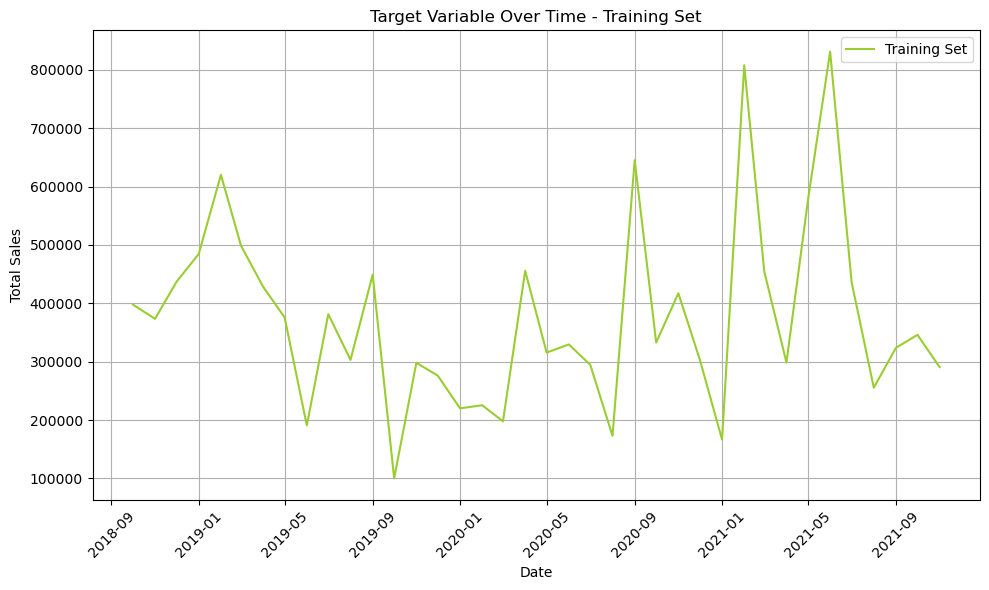

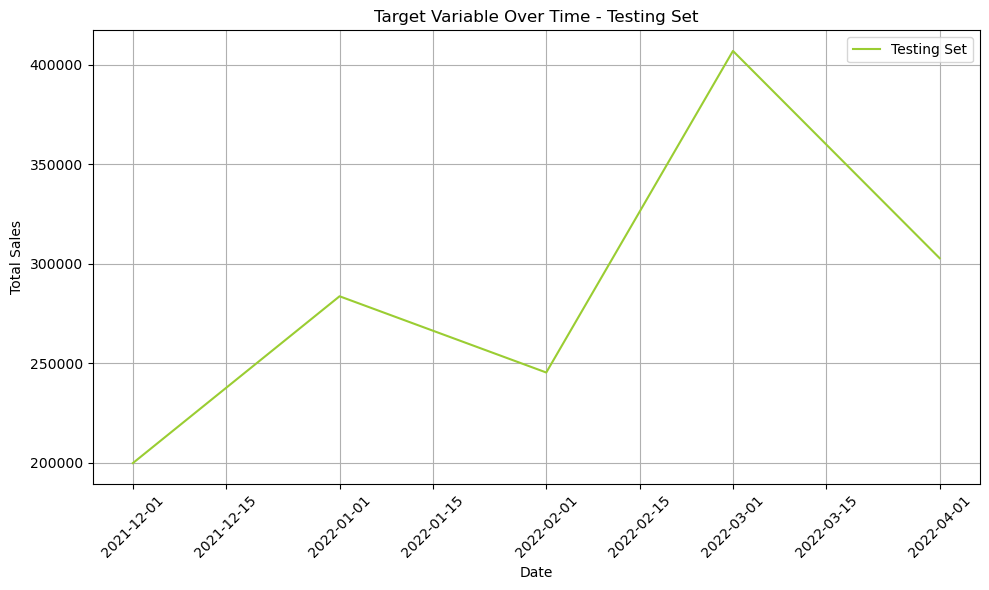

In [172]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_4.index, y_train_4, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_4.index, y_test_4, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Feature Selection

('UK Producer Prices EE_lag_8', 0.09044319445617287)
('Japan Shipments Index ME_lag_10', 0.07520545586744584)
('World Base Metals Price_lag_12', 0.05137188916578677)
('Switzerland Shipments Index ME_lag_12', 0.04783595675840049)
('Switzerland Production Index ME_lag_12', 0.042872910048989576)
('Italy Producer Prices EE_lag_11', 0.03859462396908106)
('China Production Index ME_lag_11', 0.03789880576073165)
('France Production Index ME_lag_10', 0.036256723713081467)
('Europe Shipments Index ME_lag_10', 0.034232733462177485)
('US Producer Prices EE_lag_12', 0.032039137550338895)
('Japan Production Index ME_lag_10', 0.030326878908929832)
('Japan Machinery and Equipment NEC_lag_10', 0.025334588321857945)
('Italy Production Index ME_lag_10', 0.02454595823565177)
('Italy Shipments Index ME_lag_10', 0.02443088795723998)
('World Copper Price_lag_12', 0.023036574729838156)
('Italy Machinery and Equipment NEC_lag_10', 0.022957763688156635)
('Europe Production Index ME_lag_10', 0.02020506384324633

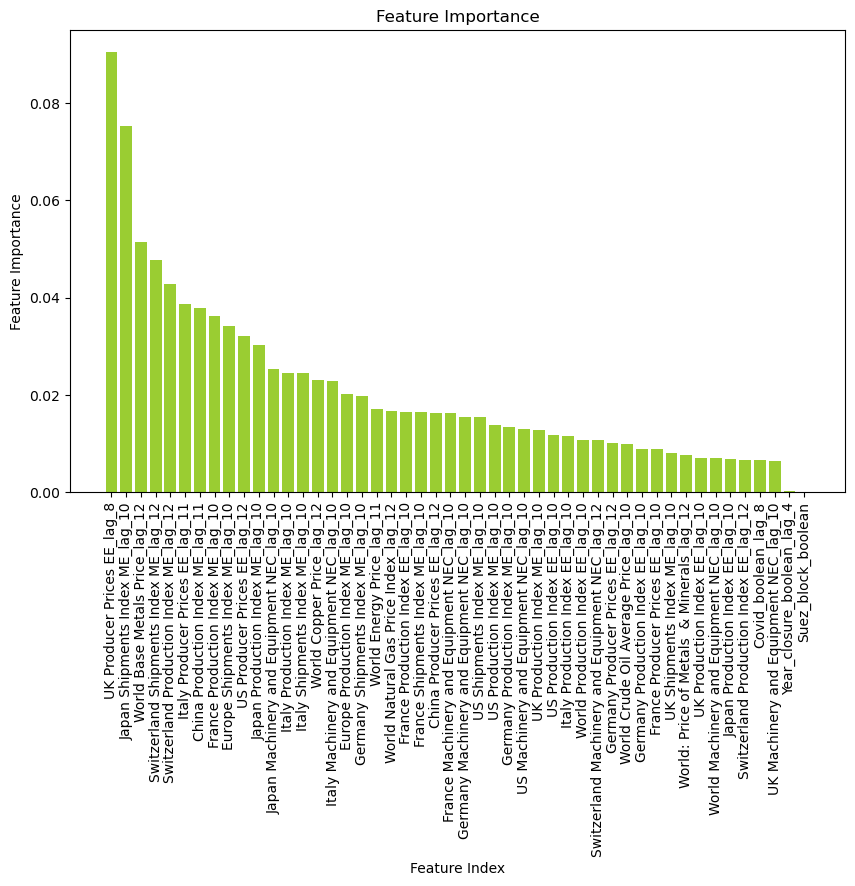

In [173]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_4, y_train_4)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_4, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [174]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_4, y_train_4)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [175]:
selected_feat_4= sel.get_feature_names_out()
selected_feat_4= list(selected_feat_4)

In [176]:
correlation_matrix = X_train_4[selected_feat_4].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Italy Production Index ME_lag_10, Italy Machinery and Equipment NEC_lag_10
Correlation: 0.9968780891116646
Pair: Japan Production Index ME_lag_10, Japan Shipments Index ME_lag_10
Correlation: 0.9924548823149749
Pair: Japan Production Index ME_lag_10, Japan Machinery and Equipment NEC_lag_10
Correlation: 0.9954273928645974
Pair: Japan Shipments Index ME_lag_10, Japan Machinery and Equipment NEC_lag_10
Correlation: 0.9859977804845734
Pair: Switzerland Production Index ME_lag_12, Switzerland Shipments Index ME_lag_12
Correlation: 0.999838008141899
Pair: World Base Metals Price_lag_12, World Copper Price_lag_12
Correlation: 0.9598631841667242


In [177]:
# erase one
selected_feat_4.remove("Italy Machinery and Equipment NEC_lag_10")
selected_feat_4.remove("Japan Shipments Index ME_lag_10")
selected_feat_4.remove("Japan Machinery and Equipment NEC_lag_10")
selected_feat_4.remove("Switzerland Shipments Index ME_lag_12")
selected_feat_4.remove("World Copper Price_lag_12")

In [178]:
lagged_data_4.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_4
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,397760.69
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,373352.33
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,436873.36
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,484435.48
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,620031.80


In [179]:
df_4_selected = lagged_data_4[selected_feat_4 + ["GCK_4"]]

In [180]:
# Open the file in binary write mode
with open('df_4_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_4_selected, f)

print(f"Dataset stored in {'df_4_selected.pickle'}")

Dataset stored in df_4_selected.pickle


## Product Group 5

In [181]:
# Create a new dataframe displaying only the monthly sales for product GCK_5
df_5 = extract_product_sales(monthly_sales, 'GCK_5')
df_5.head(10)

,Date,GCK_5
0,2018-10-01,2499061.19
1,2018-11-01,8993944.04
2,2018-12-01,6981080.57
3,2019-01-01,8301428.77
4,2019-02-01,6892520.62
5,2019-03-01,11933851.57
6,2019-04-01,5937614.80
7,2019-05-01,11413781.15
8,2019-06-01,13738550.54
9,2019-07-01,11189764.23


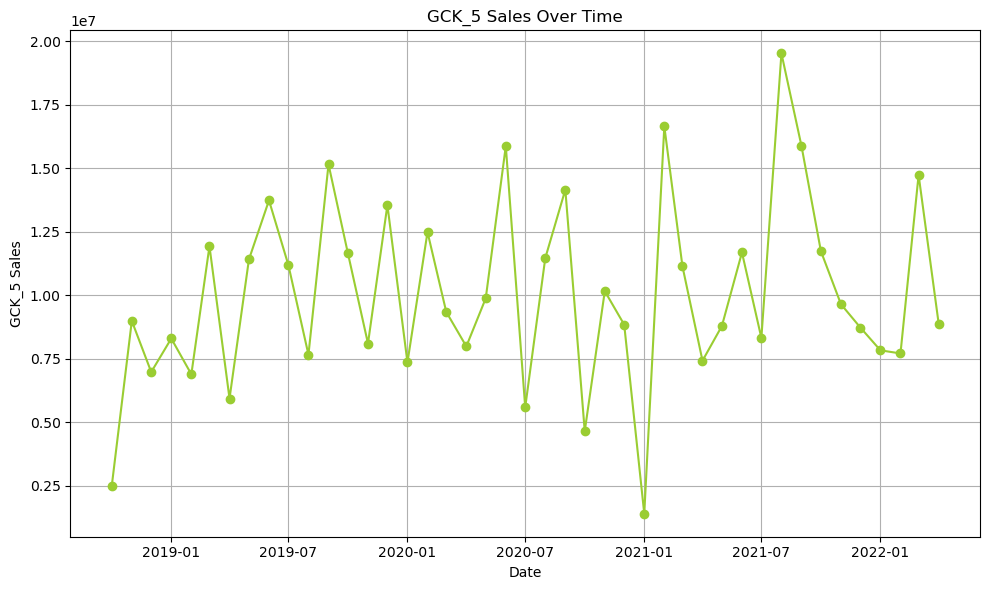

In [182]:
# Plotting GCK_5 Sales Over Time
plt.figure(figsize=(10, 6))
plt.plot(df_5['Date'], df_5['GCK_5'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_5 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_5 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

We observe a decrease in sales during January 2021 and a increase in sales during August 2021. Overall, the sales trend remains relatively constant.

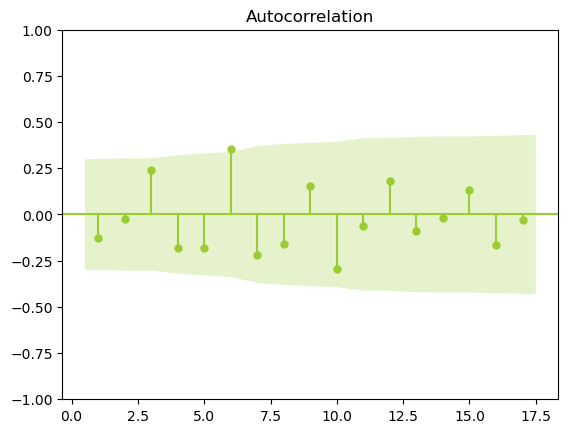

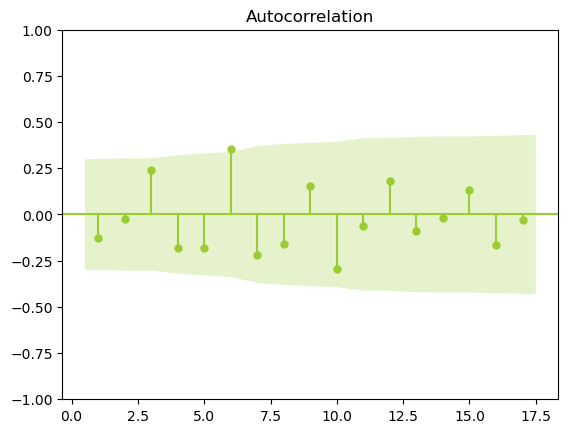

In [183]:
sm.graphics.tsa.plot_acf(df_5['GCK_5'],zero=False)

The ACF plot shows the correlation between a time series and its lagged values, which helps in understanding the pattern and potential seasonality in the data. The autocorrelation function (ACF) plot reveals that the points consistently fall within the shaded region, indicating no significant autocorrelation in the sales data. This suggests each observation is independent of the others.

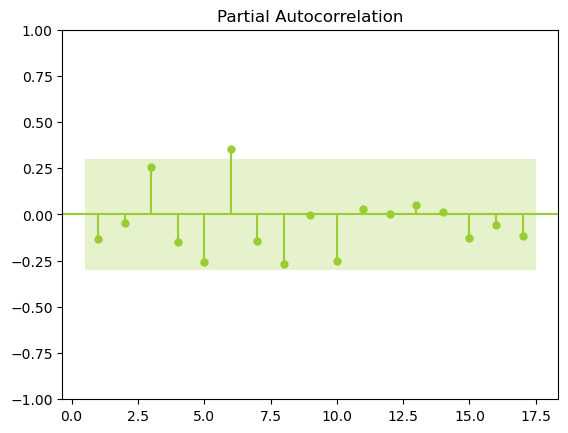

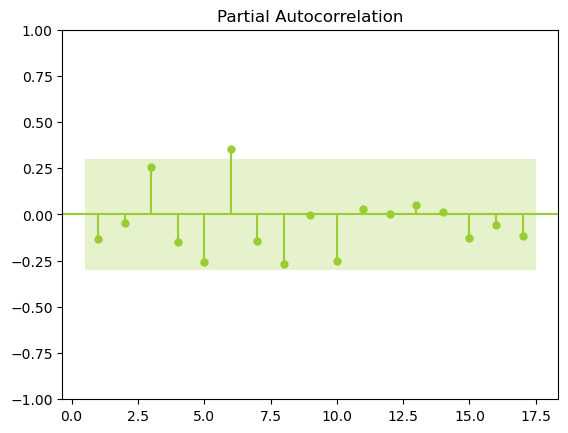

In [184]:
sm.graphics.tsa.plot_pacf(df_5['GCK_5'],zero=False)

The PACF helps in understanding the direct influence of past observations on the current one. 
Since all points on the PACF plot fall within the confidence interval marks, we can infer that there are no statistically significant direct relationships between observations at different lags.

In [185]:
# ADF test
result = adfuller(df_5['GCK_5'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -7.578854568051844
p-value: 2.715568863493618e-11
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


We can conclude that we reject the null hypothesis of non-stationarity, concluding that the sales data for the product 'GCK_5' is stationary.

In [186]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_5_lag{i}"] = create_lagged_data(merged_data, i)

# Source: ChatGPT

In [187]:
lagged_data_5 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_5.drop(columns="Total Sales")
lagged_data_5 = lagged_data_5.join(df_5.set_index('Date')[['GCK_5']], how='left')
lagged_data_5.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_5
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2499061.19
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8993944.04
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6981080.57
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8301428.77
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6892520.62
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11933851.57
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,5937614.80
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,11413781.15
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,13738550.54


In [188]:
lagged_data_5.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_5'],
      dtype='object', length=628)

In [189]:
lagged_data_5.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_5
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2499061.19
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8993944.04
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6981080.57
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8301428.77
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6892520.62


In [190]:
correlation = lagged_data_5.corr()["GCK_5"]
print(correlation)

Month                         0.088984
Year                          0.153425
China Production Index ME     0.211863
France Production Index ME    0.022344
France Shipments Index ME     0.148537
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_5                         1.000000
Name: GCK_5, Length: 628, dtype: float64


In [191]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)


Columns with highest correlation: ['China Production Index ME_lag_3', 'France Production Index ME_lag_1', 'France Shipments Index ME_lag_1', 'Germany Production Index ME_lag_1', 'Germany Shipments Index ME_lag_1', 'Italy Production Index ME_lag_5', 'Italy Shipments Index ME_lag_9', 'Japan Production Index ME_lag_10', 'Japan Shipments Index ME_lag_10', 'Switzerland Production Index ME_lag_7', 'Switzerland Shipments Index ME_lag_7', 'UK Production Index ME_lag_1', 'UK Shipments Index ME_lag_8', 'US Production Index ME_lag_6', 'US Shipments Index ME_lag_12', 'Europe Production Index ME_lag_1', 'Europe Shipments Index ME_lag_1', 'World Base Metals Price_lag_3', 'World Energy Price_lag_7', 'World: Price of Metals  & Minerals_lag_3', 'World Natural Gas Price Index_lag_7', 'World Crude Oil Average Price_lag_7', 'World Copper Price_lag_3', 'US Producer Prices EE_lag_8', 'UK Producer Prices EE_lag_12', 'Italy Producer Prices EE', 'France Producer Prices EE', 'Germany Producer Prices EE_lag_11',

In [192]:
highest_corr_columns

['China Production Index ME_lag_3',
 'France Production Index ME_lag_1',
 'France Shipments Index ME_lag_1',
 'Germany Production Index ME_lag_1',
 'Germany Shipments Index ME_lag_1',
 'Italy Production Index ME_lag_5',
 'Italy Shipments Index ME_lag_9',
 'Japan Production Index ME_lag_10',
 'Japan Shipments Index ME_lag_10',
 'Switzerland Production Index ME_lag_7',
 'Switzerland Shipments Index ME_lag_7',
 'UK Production Index ME_lag_1',
 'UK Shipments Index ME_lag_8',
 'US Production Index ME_lag_6',
 'US Shipments Index ME_lag_12',
 'Europe Production Index ME_lag_1',
 'Europe Shipments Index ME_lag_1',
 'World Base Metals Price_lag_3',
 'World Energy Price_lag_7',
 'World: Price of Metals  & Minerals_lag_3',
 'World Natural Gas Price Index_lag_7',
 'World Crude Oil Average Price_lag_7',
 'World Copper Price_lag_3',
 'US Producer Prices EE_lag_8',
 'UK Producer Prices EE_lag_12',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE_lag_11',
 'Chin

In [193]:
# keep only the best lags for each feature
best_lags_5= lagged_data_5[ highest_corr_columns + ["GCK_5"]]

In [194]:
best_lags_5.head()

,China Production Index ME_lag_3,France Production Index ME_lag_1,France Shipments Index ME_lag_1,Germany Production Index ME_lag_1,Germany Shipments Index ME_lag_1,Italy Production Index ME_lag_5,Italy Shipments Index ME_lag_9,Japan Production Index ME_lag_10,Japan Shipments Index ME_lag_10,Switzerland Production Index ME_lag_7,...,Switzerland Production Index EE_lag_2,UK Production Index EE,Italy Production Index EE_lag_5,Japan Production Index EE_lag_10,France Production Index EE_lag_1,Germany Production Index EE_lag_11,Year_closure_boolean,Covid_boolean,Suez_block_boolean,GCK_5
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,118.670791,NaN,NaN,NaN,NaN,0,0,0,2499061.19
2018-11-01,NaN,108.280608,122.451734,124.227879,137.741953,NaN,NaN,NaN,NaN,NaN,...,NaN,120.467019,NaN,NaN,97.849541,NaN,0,0,0,8993944.04
2018-12-01,NaN,99.636911,115.958210,127.404132,142.732193,NaN,NaN,NaN,NaN,NaN,...,112.970843,105.378705,NaN,NaN,91.155960,NaN,0,0,0,6981080.57
2019-01-01,211.955755,94.690312,115.128469,120.518565,141.407661,NaN,NaN,NaN,NaN,NaN,...,114.736013,107.174933,NaN,NaN,78.033028,NaN,0,0,0,8301428.77
2019-02-01,220.519655,90.143775,108.325154,104.776326,118.703828,NaN,NaN,NaN,NaN,NaN,...,116.501182,110.647640,NaN,NaN,81.908257,NaN,0,0,0,6892520.62


In [195]:
len(highest_corr_columns)

48

### Deal With Outliers

In [196]:
best_lags_5.loc[best_lags_5.index.month == 1, 'GCK_5'].describe()

count    4.000000e+00
mean     6.225237e+06
std      3.236289e+06
min      1.405295e+06
25%      5.869931e+06
50%      7.597112e+06
75%      7.952418e+06
max      8.301429e+06
Name: GCK_5, dtype: float64

In [197]:
best_lags_5.loc[best_lags_5.index.month == 12, 'GCK_5'].describe()

count    4.000000e+00
mean     9.528523e+06
std      2.816569e+06
min      6.981081e+06
25%      8.294705e+06
50%      8.789161e+06
75%      1.002298e+07
max      1.355469e+07
Name: GCK_5, dtype: float64

In [198]:
best_lags_5.loc[best_lags_5.index.month == 1, 'GCK_5'] = best_lags_5.loc[best_lags_5.index.month == 1, 'GCK_5'].clip(lower=5000000)
best_lags_5.loc[best_lags_5.index.month == 12, 'GCK_5'] = best_lags_5.loc[best_lags_5.index.month == 12, 'GCK_5'].clip(upper=12000000)

### Train/ Test Split

In [199]:
X = best_lags_5.drop(columns=['GCK_5'])
y = best_lags_5['GCK_5']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_5, X_test_5, y_train_5, y_test_5 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_5, y_train_5)
    
    # Make predictions
    y_pred = model.predict(X_test_5)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_5, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.7
Best Test Size: 0.30000000000000004
Best RMSE: 3426936.748063253


These values represent the combination of train size and test size that resulted in the lowest RMSE when training and evaluating the XGBoost model. Lower RMSE indicates better model performance, as it suggests that the model's predictions are closer to the actual values.

In [200]:
#number of samples in each set
train_size = len(X_train_5) - len(X_test_5)
print("Size of the sales train set:", train_size)

test_size = len(X_test_5)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


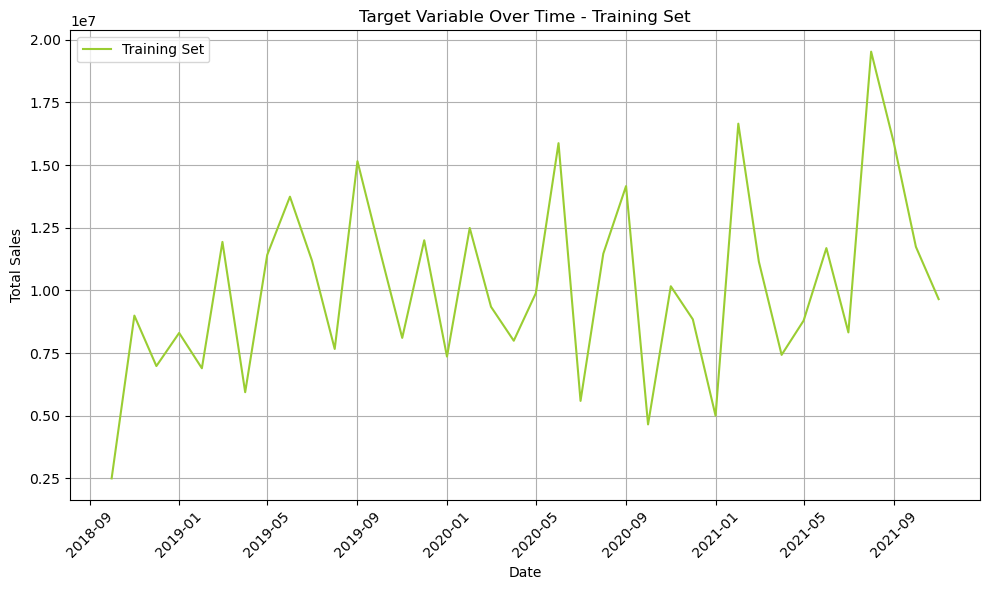

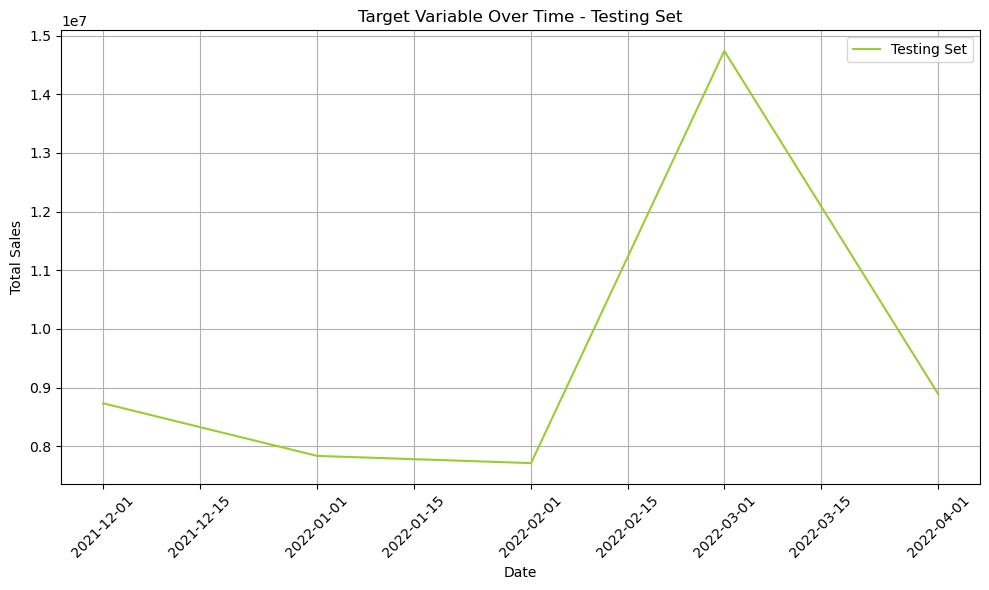

In [201]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_5.index, y_train_5, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_5.index, y_test_5, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

This visualization is helpful for understanding the distribution of the target variable and assessing whether the train-test split adequately represents the data. The target variable exhibits a consistent trend around the value of 1 in both the training and testing sets, indicating a similar distribution across the datasets.

### Feature Selection

('China Production Index ME_lag_3', 0.1520726584264905)
('France Shipments Index ME_lag_1', 0.14956345590696865)
('Italy Production Index ME_lag_5', 0.054555296694420496)
('Europe Production Index ME_lag_1', 0.0468347947121644)
('UK Production Index EE', 0.04010673412237343)
('Germany Production Index ME_lag_1', 0.03224563104465744)
('World Production Index EE_lag_11', 0.029576380030348043)
('US Shipments Index ME_lag_12', 0.027298870565937477)
('Europe Shipments Index ME_lag_1', 0.025920610753627265)
('World Machinery and Equipment NEC_lag_3', 0.025534123390137657)
('UK Producer Prices EE_lag_12', 0.024361038468508265)
('Japan Shipments Index ME_lag_10', 0.022145049942843192)
('Germany Machinery and Equipment NEC_lag_1', 0.02174365211533093)
('World: Price of Metals  & Minerals_lag_3', 0.01925149472999214)
('Japan Production Index ME_lag_10', 0.01674291690032837)
('World Natural Gas Price Index_lag_7', 0.01671778394626578)
('US Production Index EE_lag_4', 0.016522848018993355)
('Franc

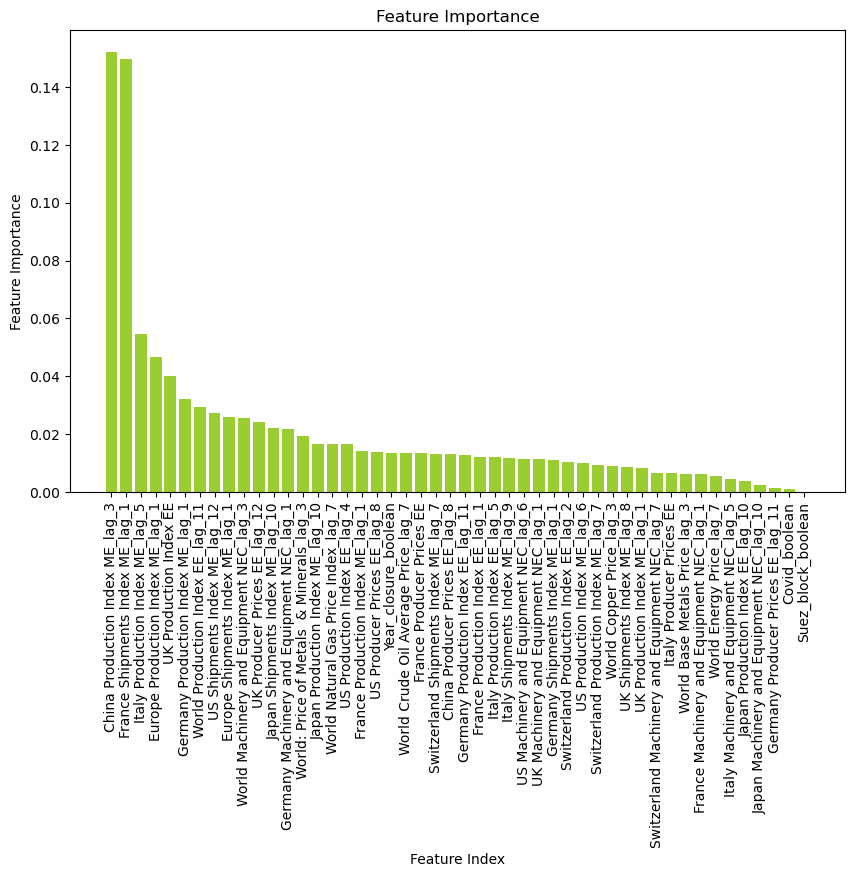

In [202]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_5, y_train_5)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_5, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [203]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_5, y_train_5)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [204]:
selected_feat_5= sel.get_feature_names_out()
selected_feat_5 = list(selected_feat_5)

In [205]:
print(selected_feat_5)

['China Production Index ME_lag_3', 'France Shipments Index ME_lag_1', 'Germany Production Index ME_lag_1', 'Italy Production Index ME_lag_5', 'Japan Shipments Index ME_lag_10', 'US Shipments Index ME_lag_12', 'Europe Production Index ME_lag_1', 'Europe Shipments Index ME_lag_1', 'UK Producer Prices EE_lag_12', 'World Machinery and Equipment NEC_lag_3', 'Germany Machinery and Equipment NEC_lag_1', 'World Production Index EE_lag_11', 'UK Production Index EE']


In [206]:
correlation_matrix = X_train_5[selected_feat_5].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Germany Production Index ME_lag_1, Germany Machinery and Equipment NEC_lag_1
Correlation: 0.9602656311809573
Pair: Europe Production Index ME_lag_1, Europe Shipments Index ME_lag_1
Correlation: 0.9577724653077759


In [207]:
# erase one
selected_feat_5.remove("Germany Machinery and Equipment NEC_lag_1")
selected_feat_5.remove("Europe Shipments Index ME_lag_1")

In [208]:
df_5_selected = lagged_data_5[selected_feat_5 + ["GCK_5"]]

In [209]:
# Open the file in binary write mode
with open('df_5_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_5_selected, f)

print(f"Dataset stored in {'df_5_selected.pickle'}")

Dataset stored in df_5_selected.pickle


## Product Group 6

In [210]:
# Create a new dataframe displaying only the monthly sales for product GCK_6
df_6 = extract_product_sales(monthly_sales, 'GCK_6')
df_6.head(10)

,Date,GCK_6
0,2018-10-01,369231.60
1,2018-11-01,473046.96
2,2018-12-01,999472.69
3,2019-01-01,598874.10
4,2019-02-01,542037.52
5,2019-03-01,735604.23
6,2019-04-01,277575.12
7,2019-05-01,315978.77
8,2019-06-01,282963.19
9,2019-07-01,725411.99


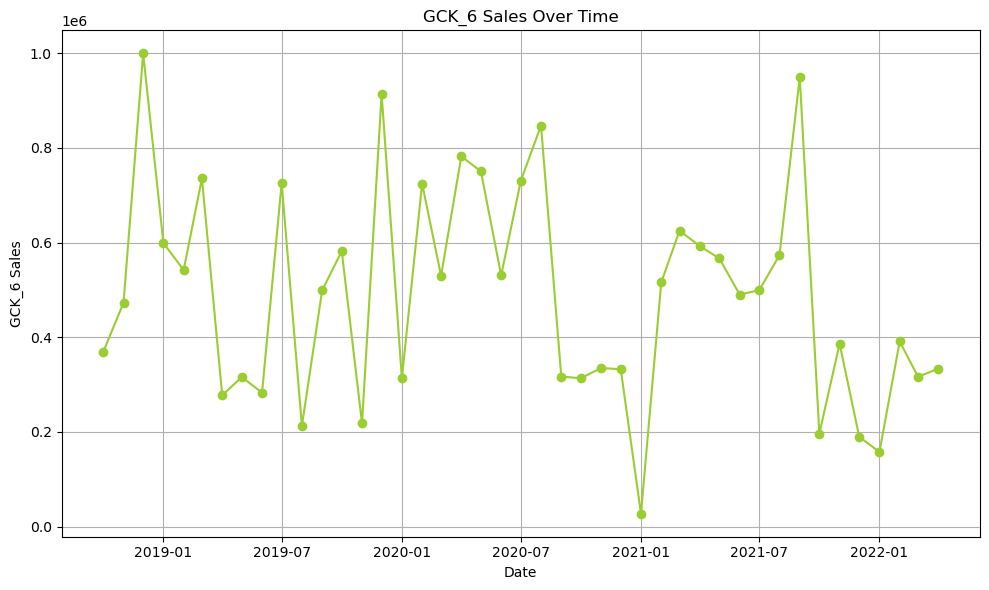

In [211]:
# Plotting GCK_6 Sales Over Time
plt.figure(figsize=(10, 6))
plt.plot(df_6['Date'], df_6['GCK_6'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_6 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_6 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

We observe a decrease in sales during January 2021. Overall, the sales trend remains relatively constant.

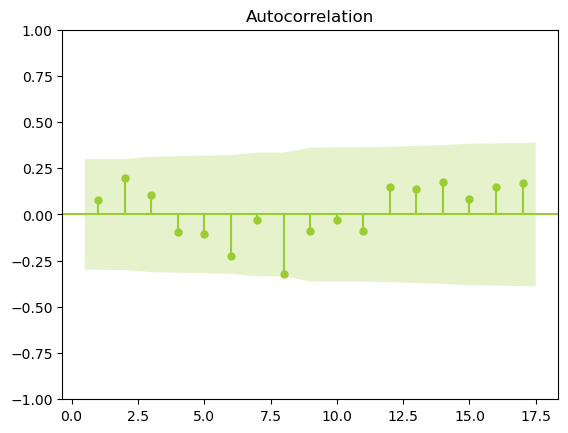

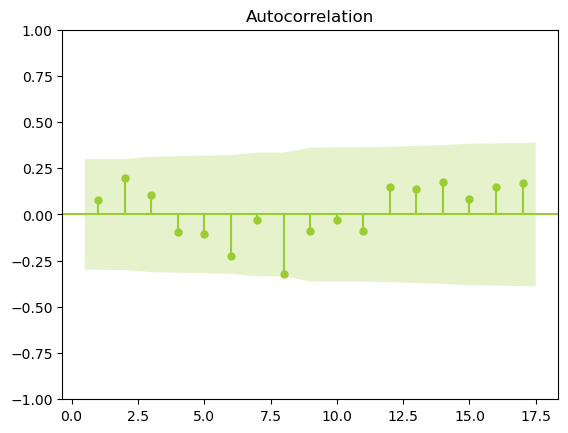

In [212]:
sm.graphics.tsa.plot_acf(df_6['GCK_6'],zero=False)

 The autocorrelation function (ACF) plot reveals that the points consistently fall within the shaded region, indicating no significant autocorrelation in the sales data.

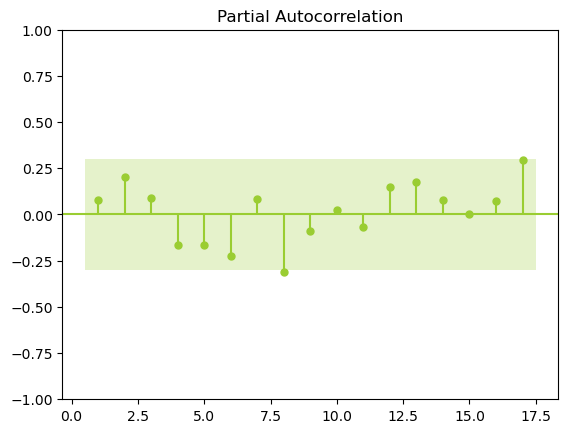

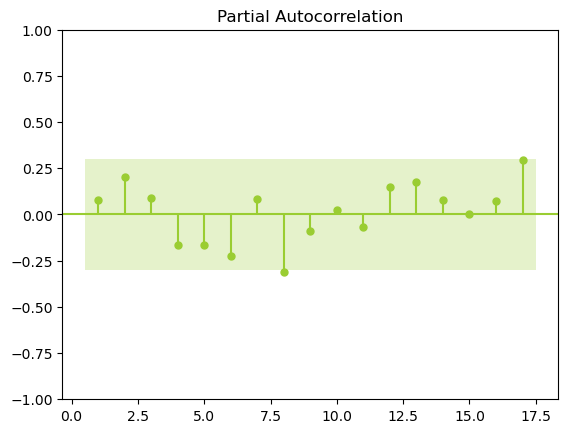

In [213]:
sm.graphics.tsa.plot_pacf(df_6['GCK_6'],zero=False)

Since all points on the PACF plot fall within the confidence interval marks, we can infer that there are no statistically significant direct relationships between observations at different lags.

In [214]:
# ADF test
result = adfuller(df_6['GCK_6'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.3648578907041977
p-value: 0.012216816143408159
Critical values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
The time series is stationary


We can conclude that we reject the null hypothesis of non-stationarity, concluding that the sales data for the product 'GCK_5' is stationary.

In [215]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_6_lag{i}"] = create_lagged_data(merged_data, i)

In [216]:
lagged_data_6 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_6.drop(columns="Total Sales")
lagged_data_6 = lagged_data_6.join(df_6.set_index('Date')[['GCK_6']], how='left')
lagged_data_6.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_6
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,369231.60
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,473046.96
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,999472.69
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,598874.10
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,542037.52
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,735604.23
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,277575.12
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,315978.77
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,282963.19


In [217]:
lagged_data_6.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_6'],
      dtype='object', length=628)

In [218]:
lagged_data_6.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_6
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,369231.60
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,473046.96
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,999472.69
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,598874.10
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,542037.52


In [219]:
correlation = lagged_data_6.corr()["GCK_6"]
print(correlation)

Month                         0.065731
Year                         -0.237721
China Production Index ME    -0.051597
France Production Index ME   -0.154600
France Shipments Index ME    -0.225692
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_6                         1.000000
Name: GCK_6, Length: 628, dtype: float64


In [220]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)


Columns with highest correlation: ['China Production Index ME_lag_7', 'France Production Index ME_lag_5', 'France Shipments Index ME_lag_1', 'Germany Production Index ME_lag_5', 'Germany Shipments Index ME_lag_1', 'Italy Production Index ME_lag_5', 'Italy Shipments Index ME_lag_1', 'Japan Production Index ME_lag_10', 'Japan Shipments Index ME_lag_10', 'Switzerland Production Index ME_lag_7', 'Switzerland Shipments Index ME_lag_7', 'UK Production Index ME_lag_5', 'UK Shipments Index ME_lag_9', 'US Production Index ME', 'US Shipments Index ME_lag_1', 'Europe Production Index ME_lag_1', 'Europe Shipments Index ME_lag_1', 'World Base Metals Price_lag_11', 'World Energy Price', 'World: Price of Metals  & Minerals_lag_11', 'World Natural Gas Price Index_lag_3', 'World Crude Oil Average Price', 'World Copper Price_lag_11', 'US Producer Prices EE_lag_1', 'UK Producer Prices EE_lag_3', 'Italy Producer Prices EE_lag_8', 'France Producer Prices EE_lag_10', 'Germany Producer Prices EE_lag_11', 'Ch

In [221]:
highest_corr_columns

['China Production Index ME_lag_7',
 'France Production Index ME_lag_5',
 'France Shipments Index ME_lag_1',
 'Germany Production Index ME_lag_5',
 'Germany Shipments Index ME_lag_1',
 'Italy Production Index ME_lag_5',
 'Italy Shipments Index ME_lag_1',
 'Japan Production Index ME_lag_10',
 'Japan Shipments Index ME_lag_10',
 'Switzerland Production Index ME_lag_7',
 'Switzerland Shipments Index ME_lag_7',
 'UK Production Index ME_lag_5',
 'UK Shipments Index ME_lag_9',
 'US Production Index ME',
 'US Shipments Index ME_lag_1',
 'Europe Production Index ME_lag_1',
 'Europe Shipments Index ME_lag_1',
 'World Base Metals Price_lag_11',
 'World Energy Price',
 'World: Price of Metals  & Minerals_lag_11',
 'World Natural Gas Price Index_lag_3',
 'World Crude Oil Average Price',
 'World Copper Price_lag_11',
 'US Producer Prices EE_lag_1',
 'UK Producer Prices EE_lag_3',
 'Italy Producer Prices EE_lag_8',
 'France Producer Prices EE_lag_10',
 'Germany Producer Prices EE_lag_11',
 'China Pr

In [222]:
# keep only the best lags for each feature
best_lags_6= lagged_data_6[ highest_corr_columns + ["GCK_6"]]

In [223]:
best_lags_6.head()

,China Production Index ME_lag_7,France Production Index ME_lag_5,France Shipments Index ME_lag_1,Germany Production Index ME_lag_5,Germany Shipments Index ME_lag_1,Italy Production Index ME_lag_5,Italy Shipments Index ME_lag_1,Japan Production Index ME_lag_10,Japan Shipments Index ME_lag_10,Switzerland Production Index ME_lag_7,...,Switzerland Production Index EE_lag_7,UK Production Index EE_lag_6,Italy Production Index EE_lag_12,Japan Production Index EE_lag_5,France Production Index EE_lag_5,Germany Production Index EE,Year_closure_boolean_lag_4,Covid_boolean_lag_8,Suez_block_boolean,GCK_6
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,118.298233,NaN,NaN,0,369231.60
2018-11-01,NaN,NaN,122.451734,NaN,137.741953,NaN,122.456894,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,117.163727,NaN,NaN,0,473046.96
2018-12-01,NaN,NaN,115.958210,NaN,142.732193,NaN,120.132032,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,89.626122,NaN,NaN,0,999472.69
2019-01-01,NaN,NaN,115.128469,NaN,141.407661,NaN,131.936099,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,105.406097,NaN,NaN,0,598874.10
2019-02-01,NaN,NaN,108.325154,NaN,118.703828,NaN,92.418842,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,103.652771,0.0,NaN,0,542037.52


In [224]:
len(highest_corr_columns)

48

### Deal With Outliers

We have observed that product GCK_6 does not display any outliers within its dataset.

### Train/ Test Split

In [225]:
X = best_lags_6.drop(columns=['GCK_6'])
y = best_lags_6['GCK_6']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_6, X_test_6, y_train_6, y_test_6 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_6, y_train_6)
    
    # Make predictions
    y_pred = model.predict(X_test_6)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_6, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.65
Best Test Size: 0.35
Best RMSE: 184953.87113933585


In [226]:
train_size = len(X_train_6) - len(X_train_6)
print("Size of the sales train set:", train_size)

test_size = len(X_test_6)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 0
Size of the market test set: 5


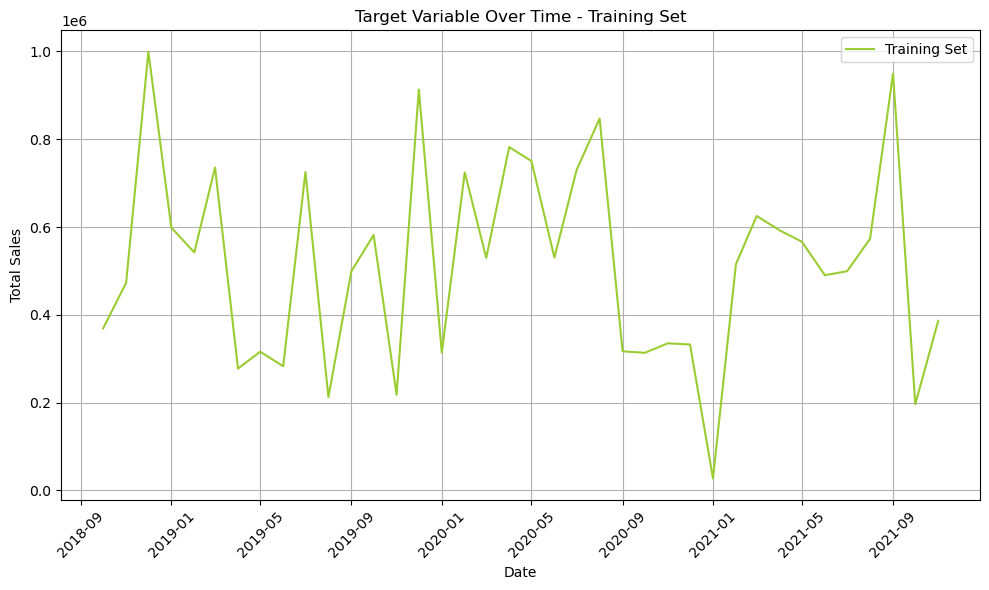

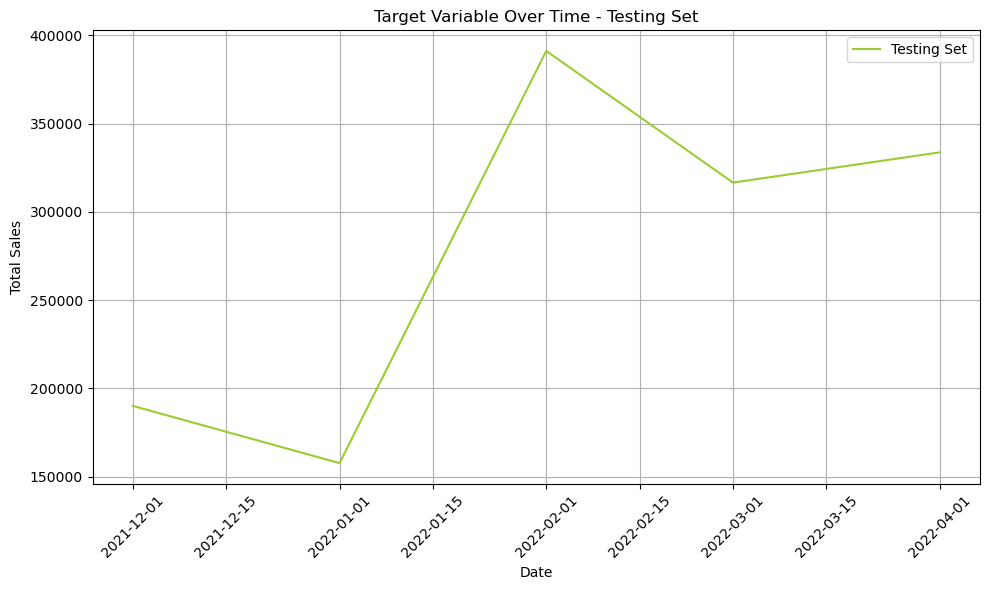

In [227]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_6.index, y_train_6, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_6.index, y_test_6, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The target variable has a similar distribution in both training and testing sets.

### Feature Selection

('Germany Production Index EE', 0.22705331084180475)
('UK Producer Prices EE_lag_3', 0.0651083908973392)
('Japan Production Index EE_lag_5', 0.0619667853540589)
('US Production Index EE', 0.048065479172287914)
('Italy Shipments Index ME_lag_1', 0.04628557269884027)
('Germany Production Index ME_lag_5', 0.04194005860846646)
('Germany Shipments Index ME_lag_1', 0.0408725699677567)
('China Producer Prices EE_lag_3', 0.034819944625358215)
('Italy Production Index ME_lag_5', 0.03147918982829796)
('France Shipments Index ME_lag_1', 0.0223230996193055)
('Japan Production Index ME_lag_10', 0.020155995466129756)
('UK Production Index EE_lag_6', 0.01990504659998713)
('Europe Shipments Index ME_lag_1', 0.019177607632648575)
('China Production Index ME_lag_7', 0.017548265909554574)
('Year_closure_boolean_lag_4', 0.016936217349484948)
('US Machinery and Equipment NEC', 0.01664454856169877)
('Europe Production Index ME_lag_1', 0.016406957009069325)
('Germany Machinery and Equipment NEC_lag_9', 0.015

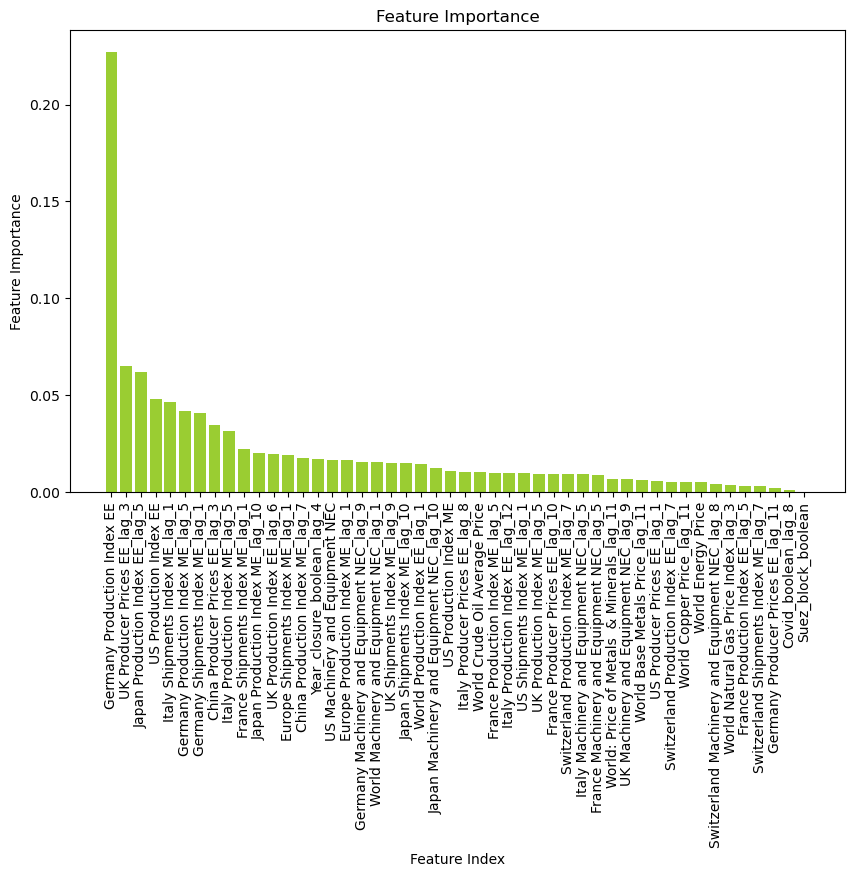

In [228]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_6, y_train_6)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_6, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [229]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_6, y_train_6)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [230]:
selected_feat_6= sel.get_feature_names_out()
selected_feat_6 = list(selected_feat_6)

In [231]:
print(selected_feat_6)

['France Shipments Index ME_lag_1', 'Germany Production Index ME_lag_5', 'Germany Shipments Index ME_lag_1', 'Italy Production Index ME_lag_5', 'Italy Shipments Index ME_lag_1', 'UK Producer Prices EE_lag_3', 'China Producer Prices EE_lag_3', 'US Production Index EE', 'Japan Production Index EE_lag_5', 'Germany Production Index EE']


In [232]:
correlation_matrix = X_train_6[selected_feat_6].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

In [233]:
df_6_selected = lagged_data_6[selected_feat_6 + ["GCK_6"]]

In [234]:
# Open the file in binary write mode
with open('df_6_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_6_selected, f)

print(f"Dataset stored in {'df_6_selected.pickle'}")

Dataset stored in df_6_selected.pickle


## Product Group 8

In [235]:
# Create a new dataframe displaying only the monthly sales for product GCK_8
df_8 = extract_product_sales(monthly_sales, 'GCK_8')
df_8.head(10)

,Date,GCK_8
0,2018-10-01,586052.74
1,2018-11-01,526792.77
2,2018-12-01,271490.71
3,2019-01-01,381400.15
4,2019-02-01,368475.57
5,2019-03-01,592288.36
6,2019-04-01,418899.90
7,2019-05-01,298806.84
8,2019-06-01,420707.73
9,2019-07-01,366980.26


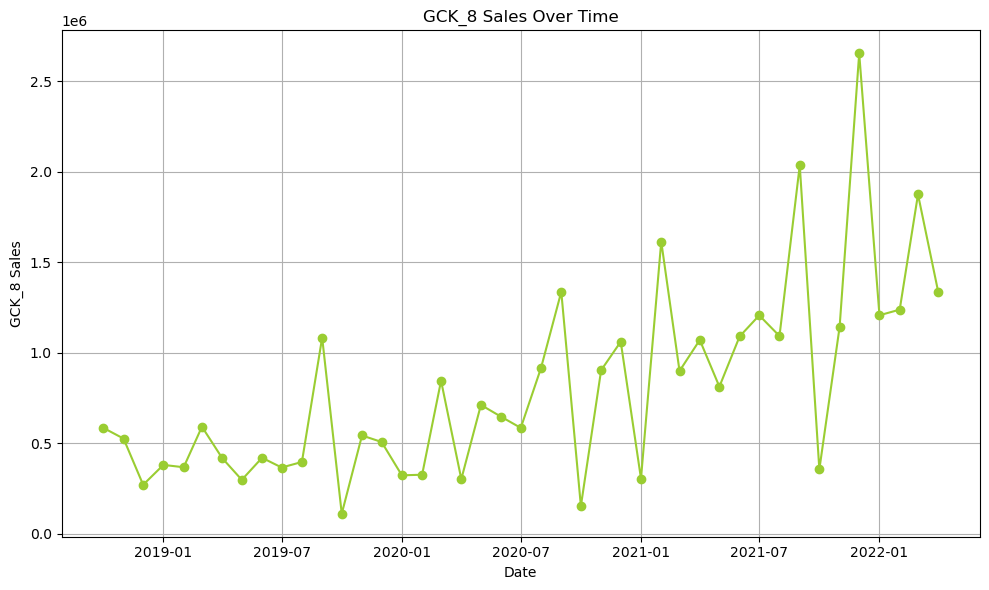

In [236]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_8['Date'], df_8['GCK_8'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_8 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_8 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

We observe a increase in sales during December 2021. Overall, the sales trend remains relatively constant.

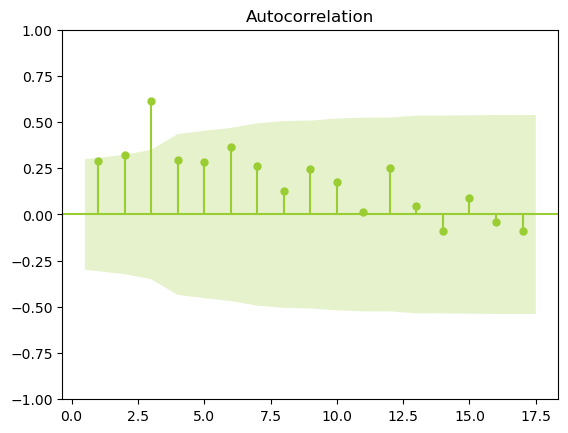

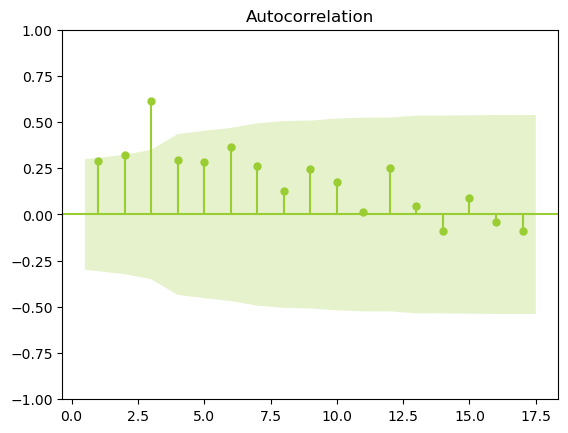

In [237]:
sm.graphics.tsa.plot_acf(df_8['GCK_8'],zero=False)

The presence of a point outside the shaded region in the ACF plot indicates a significant autocorrelation in the sales data at the corresponding lag. This suggests that there is a pattern or dependency between observations separated by that lag, implying that the data may not be entirely independent.

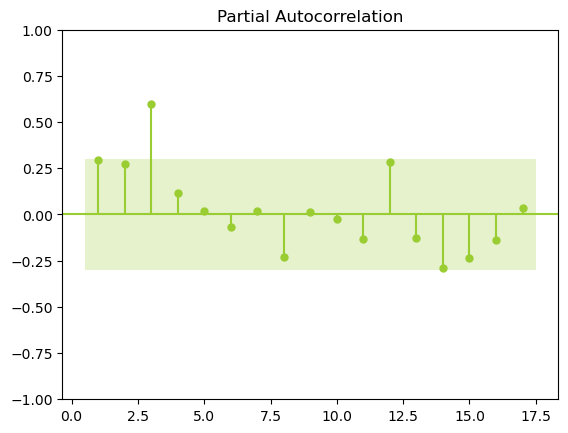

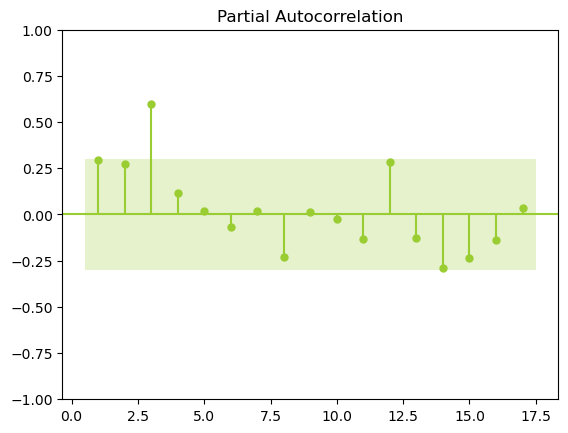

In [238]:
sm.graphics.tsa.plot_pacf(df_8['GCK_8'],zero=False)

The presence of a point outside the confidence interval marks in the PACF plot suggests a statistically significant direct relationship between observations at the corresponding lag. This implies that past observations at that lag have a notable influence on the current observation.

In [239]:
# ADF test
result = adfuller(df_8['GCK_8'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: 2.281110547027641
p-value: 0.9989428696976692
Critical values: {'1%': -3.626651907578875, '5%': -2.9459512825788754, '10%': -2.6116707716049383}
The time series is non-stationary


We conclude that the time series is non-stationary. The time series likely exhibits trends or seasonality.

In [240]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_8_lag{i}"] = create_lagged_data(merged_data, i)

# Source: ChatGPT    

In [241]:
lagged_data_8 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_8.drop(columns="Total Sales")
lagged_data_8 = lagged_data_8.join(df_8.set_index('Date')[['GCK_8']], how='left')
lagged_data_8.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_8
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,586052.74
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526792.77
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,271490.71
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,381400.15
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,368475.57
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,592288.36
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,418899.90
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,298806.84
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,420707.73


In [242]:
lagged_data_8.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_8'],
      dtype='object', length=628)

In [243]:
lagged_data_8.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_8
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,586052.74
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526792.77
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,271490.71
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,381400.15
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,368475.57


In [244]:
correlation = lagged_data_8.corr()["GCK_8"]
print(correlation)

Month                         0.075444
Year                          0.619948
China Production Index ME     0.502151
France Production Index ME    0.147203
France Shipments Index ME     0.325897
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_8                         1.000000
Name: GCK_8, Length: 628, dtype: float64


In [245]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_9', 'France Production Index ME_lag_4', 'France Shipments Index ME', 'Germany Production Index ME_lag_7', 'Germany Shipments Index ME', 'Italy Production Index ME_lag_2', 'Italy Shipments Index ME_lag_9', 'Japan Production Index ME_lag_7', 'Japan Shipments Index ME', 'Switzerland Production Index ME_lag_12', 'Switzerland Shipments Index ME_lag_12', 'UK Production Index ME_lag_7', 'UK Shipments Index ME_lag_7', 'US Production Index ME_lag_1', 'US Shipments Index ME_lag_6', 'Europe Production Index ME', 'Europe Shipments Index ME', 'World Base Metals Price_lag_2', 'World Energy Price', 'World: Price of Metals  & Minerals_lag_2', 'World Natural Gas Price Index', 'World Crude Oil Average Price', 'World Copper Price_lag_2', 'US Producer Prices EE_lag_2', 'UK Producer Prices EE_lag_11', 'Italy Producer Prices EE_lag_1', 'France Producer Prices EE_lag_1', 'Germany Producer Prices EE_lag_4', 'China Producer Prices EE_lag_2', 'US

In [246]:
highest_corr_columns

['China Production Index ME_lag_9',
 'France Production Index ME_lag_4',
 'France Shipments Index ME',
 'Germany Production Index ME_lag_7',
 'Germany Shipments Index ME',
 'Italy Production Index ME_lag_2',
 'Italy Shipments Index ME_lag_9',
 'Japan Production Index ME_lag_7',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME_lag_12',
 'Switzerland Shipments Index ME_lag_12',
 'UK Production Index ME_lag_7',
 'UK Shipments Index ME_lag_7',
 'US Production Index ME_lag_1',
 'US Shipments Index ME_lag_6',
 'Europe Production Index ME',
 'Europe Shipments Index ME',
 'World Base Metals Price_lag_2',
 'World Energy Price',
 'World: Price of Metals  & Minerals_lag_2',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price_lag_2',
 'US Producer Prices EE_lag_2',
 'UK Producer Prices EE_lag_11',
 'Italy Producer Prices EE_lag_1',
 'France Producer Prices EE_lag_1',
 'Germany Producer Prices EE_lag_4',
 'China Producer Prices EE_lag_2',
 'US Mach

In [247]:
# keep only the best lags for each feature
best_lags_8= lagged_data_8[ highest_corr_columns + ["GCK_8"]]

In [248]:
best_lags_8.head()

,China Production Index ME_lag_9,France Production Index ME_lag_4,France Shipments Index ME,Germany Production Index ME_lag_7,Germany Shipments Index ME,Italy Production Index ME_lag_2,Italy Shipments Index ME_lag_9,Japan Production Index ME_lag_7,Japan Shipments Index ME,Switzerland Production Index ME_lag_12,...,Switzerland Production Index EE_lag_6,UK Production Index EE_lag_6,Italy Production Index EE_lag_2,Japan Production Index EE_lag_7,France Production Index EE_lag_4,Germany Production Index EE_lag_6,Year_closure_boolean_lag_6,Covid_boolean_lag_7,Suez_block_boolean,GCK_8
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,122.451734,NaN,137.741953,NaN,NaN,NaN,124.793250,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,586052.74
2018-11-01,NaN,NaN,115.958210,NaN,142.732193,NaN,NaN,NaN,123.289888,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,526792.77
2018-12-01,NaN,NaN,115.128469,NaN,141.407661,118.350514,NaN,NaN,124.508413,NaN,...,NaN,NaN,93.001511,NaN,NaN,NaN,NaN,NaN,0,271490.71
2019-01-01,NaN,NaN,108.325154,NaN,118.703828,107.719260,NaN,NaN,106.303946,NaN,...,NaN,NaN,84.133400,NaN,NaN,NaN,NaN,NaN,0,381400.15
2019-02-01,NaN,108.280608,108.944656,NaN,122.686997,88.783181,NaN,NaN,114.996302,NaN,...,NaN,NaN,64.881248,NaN,97.849541,NaN,NaN,NaN,0,368475.57


In [249]:
len(highest_corr_columns)

48

### Deal With Outliers

In [250]:
best_lags_8.loc[best_lags_8.index.month == 1, 'GCK_8'].describe()

count    4.000000e+00
mean     5.547700e+05
std      4.367386e+05
min      3.058203e+05
25%      3.192820e+05
50%      3.525847e+05
75%      5.880727e+05
max      1.208090e+06
Name: GCK_8, dtype: float64

In [251]:
best_lags_8.loc[best_lags_8.index.month == 3, 'GCK_8'].describe()

count    4.000000e+00
mean     1.053623e+06
std      5.642529e+05
min      5.922884e+05
25%      7.827564e+05
50%      8.732579e+05
75%      1.144125e+06
max      1.875689e+06
Name: GCK_8, dtype: float64

In [252]:
best_lags_8.loc[best_lags_8.index.month == 1, 'GCK_8'] = best_lags_5.loc[best_lags_5.index.month == 1, 'GCK_5'].clip(lower=1000000)
best_lags_8.loc[best_lags_8.index.month == 3, 'GCK_8'] = best_lags_5.loc[best_lags_5.index.month == 3, 'GCK_5'].clip(upper=1500000)

### Train/ Test Split

In [253]:
X = best_lags_8.drop(columns=['GCK_8'])
y = best_lags_8['GCK_8']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_8, X_test_8, y_train_8, y_test_8 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_8, y_train_8)
    
    # Make predictions
    y_pred = model.predict(X_test_8)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_8, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.6
Best Test Size: 0.4
Best RMSE: 2037061.84456238


In [254]:
train_size = len(X_train_8) - len(X_test_8)
print("Size of the sales train set:", train_size)

test_size = len(X_test_8)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


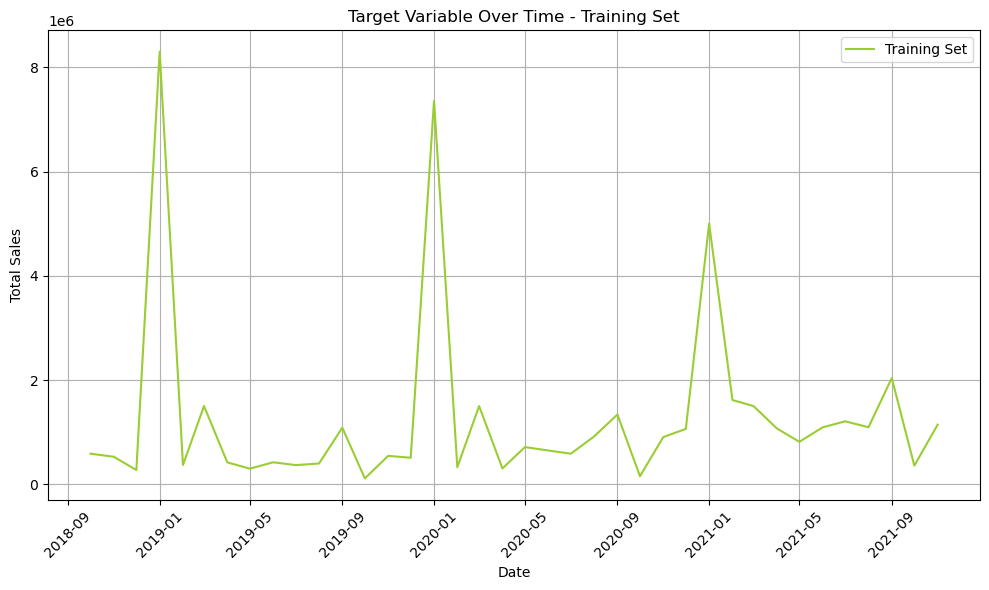

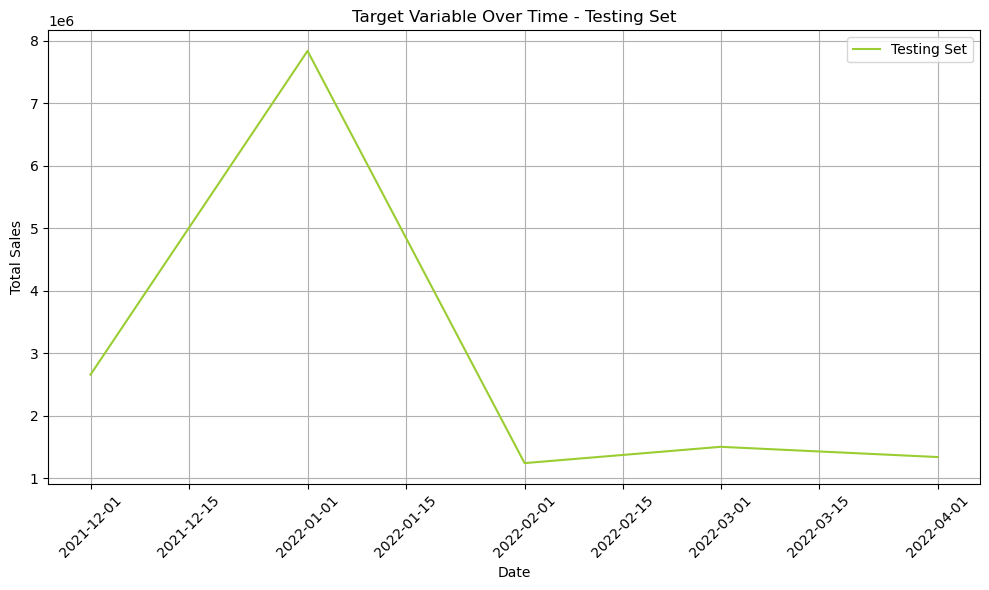

In [255]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_8.index, y_train_8, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_8.index, y_test_8, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The target variable has a similar distribution in both training and testing sets.

### Feature Selection

('World Production Index EE', 0.151082141419116)
('Italy Shipments Index ME_lag_9', 0.08327063445944778)
('World Machinery and Equipment NEC', 0.0810176873172373)
('UK Producer Prices EE_lag_11', 0.07261179337966055)
('Europe Shipments Index ME', 0.0617042725240009)
('Germany Production Index ME_lag_7', 0.043618979337804224)
('France Production Index ME_lag_4', 0.040637589533021455)
('Europe Production Index ME', 0.032900554672407246)
('Switzerland Shipments Index ME_lag_12', 0.03196640329023643)
('China Production Index ME_lag_9', 0.03021108906906094)
('Italy Producer Prices EE_lag_1', 0.025121011429121855)
('World Crude Oil Average Price', 0.021340124621554324)
('France Shipments Index ME', 0.02124420773926875)
('Germany Shipments Index ME', 0.019837004254210488)
('Switzerland Production Index ME_lag_12', 0.017501452089879445)
('Japan Machinery and Equipment NEC', 0.015711995956979082)
('UK Shipments Index ME_lag_7', 0.014531847022899306)
('UK Machinery and Equipment NEC_lag_7', 0.01

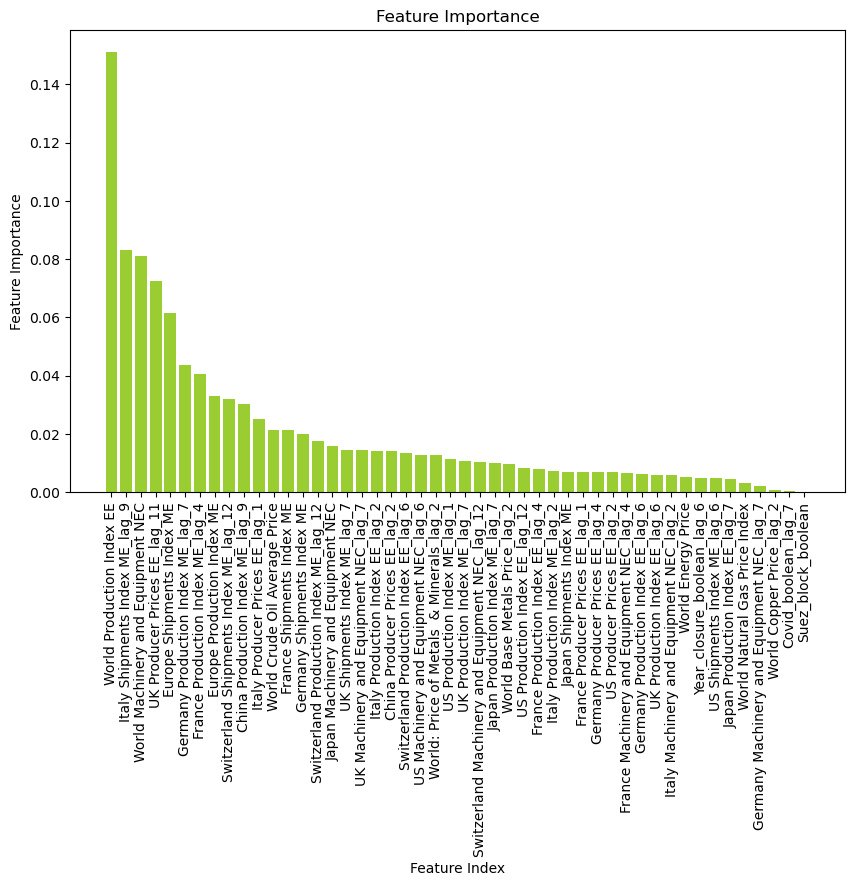

In [256]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_8, y_train_8)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_8, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [257]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_8, y_train_8)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [258]:
selected_feat_8= sel.get_feature_names_out()
selected_feat_8 = list(selected_feat_8)

In [259]:
print(selected_feat_8)

['China Production Index ME_lag_9', 'France Production Index ME_lag_4', 'France Shipments Index ME', 'Germany Production Index ME_lag_7', 'Italy Shipments Index ME_lag_9', 'Switzerland Shipments Index ME_lag_12', 'Europe Production Index ME', 'Europe Shipments Index ME', 'World Crude Oil Average Price', 'UK Producer Prices EE_lag_11', 'Italy Producer Prices EE_lag_1', 'World Machinery and Equipment NEC', 'World Production Index EE']


In [260]:
correlation_matrix = X_train_8[selected_feat_8].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Europe Production Index ME, Europe Shipments Index ME
Correlation: 0.9581472758273253


In [261]:
# erase one
selected_feat_8.remove("Europe Shipments Index ME")

In [262]:
df_8_selected = lagged_data_8[selected_feat_8 + ["GCK_8"]]

In [263]:
# Open the file in binary write mode
with open('df_8_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_8_selected, f)

print(f"Dataset stored in {'df_8_selected.pickle'}")

Dataset stored in df_8_selected.pickle


## Product Group 9

In [264]:
df_9 = extract_product_sales(monthly_sales, "GCK_9")
df_9.head()

,Date,GCK_9
0,2018-10-01,3219.32
1,2018-11-01,1875.90
2,2018-12-01,0.00
3,2019-01-01,1487.00
4,2019-02-01,3234.28


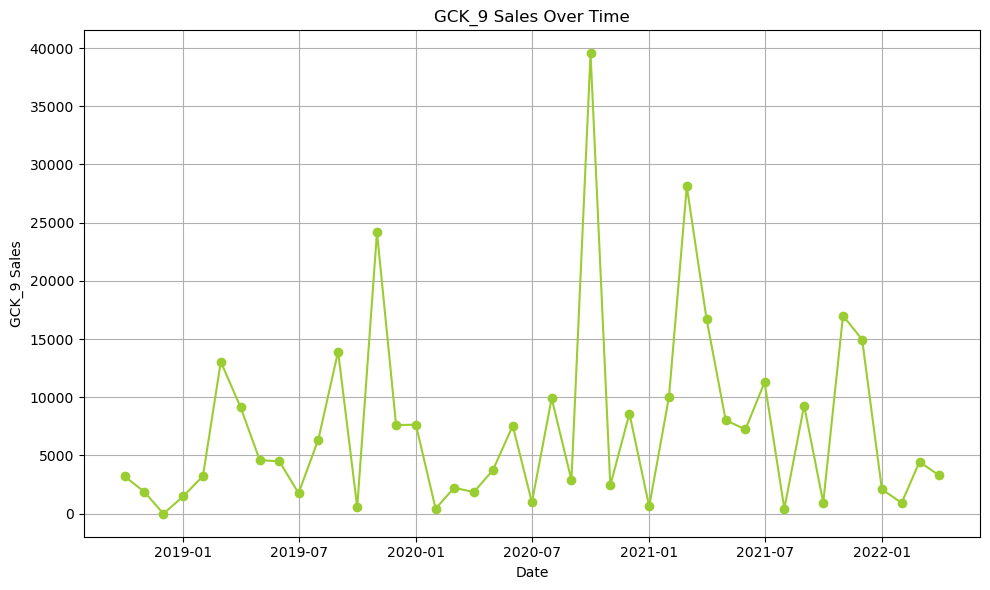

In [265]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_9['Date'], df_9['GCK_9'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_9 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_9 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

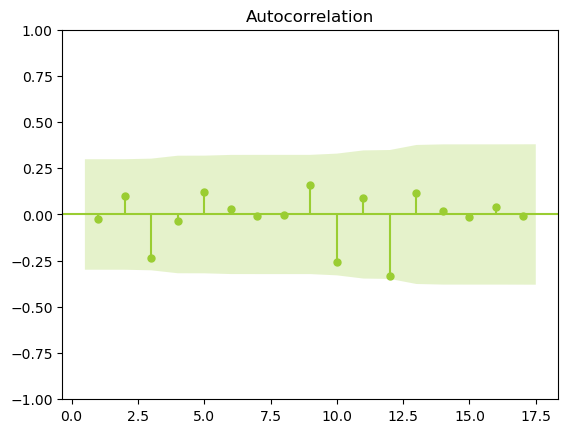

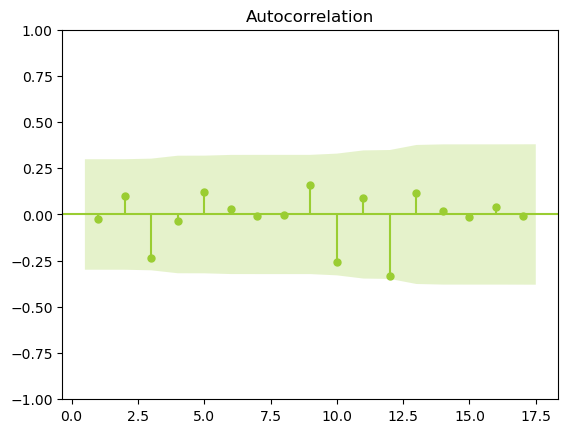

In [266]:
sm.graphics.tsa.plot_acf(df_9['GCK_9'],zero=False)

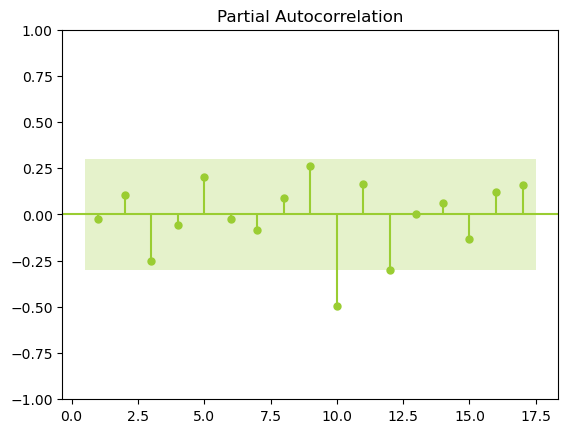

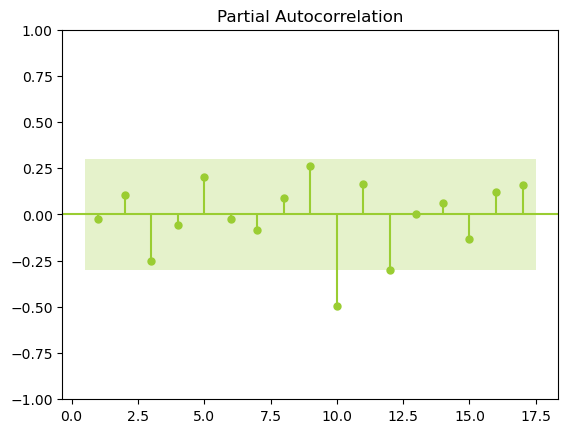

In [267]:
sm.graphics.tsa.plot_pacf(df_9['GCK_9'],zero=False)

In [268]:
# ADF test
result = adfuller(df_9['GCK_9'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

    # Source: ChatGPT

ADF test statistic: -6.477079751734612
p-value: 1.3229582442513221e-08
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


In [269]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_9_lag{i}"] = create_lagged_data(merged_data, i)

# Source: ChatGPT

In [270]:
lagged_data_9 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_9.drop(columns="Total Sales")
lagged_data_9 = lagged_data_9.join(df_9.set_index('Date')[['GCK_9']], how='left')
lagged_data_9.head(10)

# Source: ChatGPT

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_9
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3219.32
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1875.90
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1487.00
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3234.28
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13050.61
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,9150.70
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,4614.08
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4488.09


In [271]:
lagged_data_9.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_9'],
      dtype='object', length=628)

In [272]:
lagged_data_9.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_9
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3219.32
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1875.90
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1487.00
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3234.28


In [273]:
correlation = lagged_data_9.corr()["GCK_9"]
print(correlation)

Month                         0.189815
Year                          0.080939
China Production Index ME     0.306734
France Production Index ME    0.273738
France Shipments Index ME     0.240225
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_9                         1.000000
Name: GCK_9, Length: 628, dtype: float64


In [274]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)


Columns with highest correlation: ['China Production Index ME', 'France Production Index ME_lag_11', 'France Shipments Index ME_lag_11', 'Germany Production Index ME_lag_2', 'Germany Shipments Index ME_lag_2', 'Italy Production Index ME_lag_11', 'Italy Shipments Index ME_lag_7', 'Japan Production Index ME_lag_10', 'Japan Shipments Index ME_lag_10', 'Switzerland Production Index ME_lag_6', 'Switzerland Shipments Index ME_lag_6', 'UK Production Index ME_lag_11', 'UK Shipments Index ME_lag_11', 'US Production Index ME_lag_11', 'US Shipments Index ME_lag_11', 'Europe Production Index ME_lag_11', 'Europe Shipments Index ME_lag_11', 'World Base Metals Price_lag_12', 'World Energy Price_lag_12', 'World: Price of Metals  & Minerals_lag_12', 'World Natural Gas Price Index_lag_8', 'World Crude Oil Average Price_lag_12', 'World Copper Price_lag_12', 'US Producer Prices EE_lag_12', 'UK Producer Prices EE_lag_2', 'Italy Producer Prices EE_lag_12', 'France Producer Prices EE_lag_11', 'Germany Produc

In [275]:
highest_corr_columns

['China Production Index ME',
 'France Production Index ME_lag_11',
 'France Shipments Index ME_lag_11',
 'Germany Production Index ME_lag_2',
 'Germany Shipments Index ME_lag_2',
 'Italy Production Index ME_lag_11',
 'Italy Shipments Index ME_lag_7',
 'Japan Production Index ME_lag_10',
 'Japan Shipments Index ME_lag_10',
 'Switzerland Production Index ME_lag_6',
 'Switzerland Shipments Index ME_lag_6',
 'UK Production Index ME_lag_11',
 'UK Shipments Index ME_lag_11',
 'US Production Index ME_lag_11',
 'US Shipments Index ME_lag_11',
 'Europe Production Index ME_lag_11',
 'Europe Shipments Index ME_lag_11',
 'World Base Metals Price_lag_12',
 'World Energy Price_lag_12',
 'World: Price of Metals  & Minerals_lag_12',
 'World Natural Gas Price Index_lag_8',
 'World Crude Oil Average Price_lag_12',
 'World Copper Price_lag_12',
 'US Producer Prices EE_lag_12',
 'UK Producer Prices EE_lag_2',
 'Italy Producer Prices EE_lag_12',
 'France Producer Prices EE_lag_11',
 'Germany Producer Pric

In [276]:
# keep only the best lags for each feature
best_lags_9= lagged_data_9[ highest_corr_columns + ["GCK_9"]]

In [277]:
best_lags_9.head()

,China Production Index ME,France Production Index ME_lag_11,France Shipments Index ME_lag_11,Germany Production Index ME_lag_2,Germany Shipments Index ME_lag_2,Italy Production Index ME_lag_11,Italy Shipments Index ME_lag_7,Japan Production Index ME_lag_10,Japan Shipments Index ME_lag_10,Switzerland Production Index ME_lag_6,...,Switzerland Production Index EE_lag_5,UK Production Index EE_lag_11,Italy Production Index EE_lag_11,Japan Production Index EE_lag_10,France Production Index EE_lag_11,Germany Production Index EE_lag_10,Year_closure_boolean_lag_3,Covid_boolean_lag_9,Suez_block_boolean,GCK_9
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,211.955755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,3219.32
2018-11-01,220.519655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1875.90
2018-12-01,241.846854,NaN,NaN,124.227879,137.741953,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.00
2019-01-01,175.668147,NaN,NaN,127.404132,142.732193,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,1487.00
2019-02-01,175.668147,NaN,NaN,120.518565,141.407661,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,3234.28


In [278]:
len(highest_corr_columns)

48

### Deal With Outliers

In [279]:
best_lags_9.loc[best_lags_9.index.month == 1, 'GCK_9'].describe()

count       4.000000
mean     2963.300000
std      3180.334059
min       625.500000
25%      1271.625000
50%      1790.100000
75%      3481.775000
max      7647.500000
Name: GCK_9, dtype: float64

In [280]:
best_lags_9.loc[best_lags_9.index.month == 10, 'GCK_9'].describe()

count        4.000000
mean     11067.580000
std      19021.876476
min        555.000000
25%        851.250000
50%       2084.660000
75%      12300.990000
max      39546.000000
Name: GCK_9, dtype: float64

In [281]:
best_lags_9.loc[best_lags_9.index.month == 1, 'GCK_9'] = best_lags_9.loc[best_lags_9.index.month == 1, 'GCK_9'].clip(upper=4000)
best_lags_9.loc[best_lags_9.index.month == 10, 'GCK_9'] = best_lags_9.loc[best_lags_9.index.month == 10, 'GCK_9'].clip(upper=14000)

### Train Test Split 

In [282]:
X = best_lags_9.drop(columns=['GCK_9'])
y = best_lags_9['GCK_9']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_9, X_test_9, y_train_9, y_test_9 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_9, y_train_9)
    
    # Make predictions
    y_pred = model.predict(X_test_9)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_9, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 4142.810535413786


In [283]:
train_size = len(X_train_9) - len(X_test_9)
print("Size of the sales train set:", train_size)

test_size = len(X_test_9)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


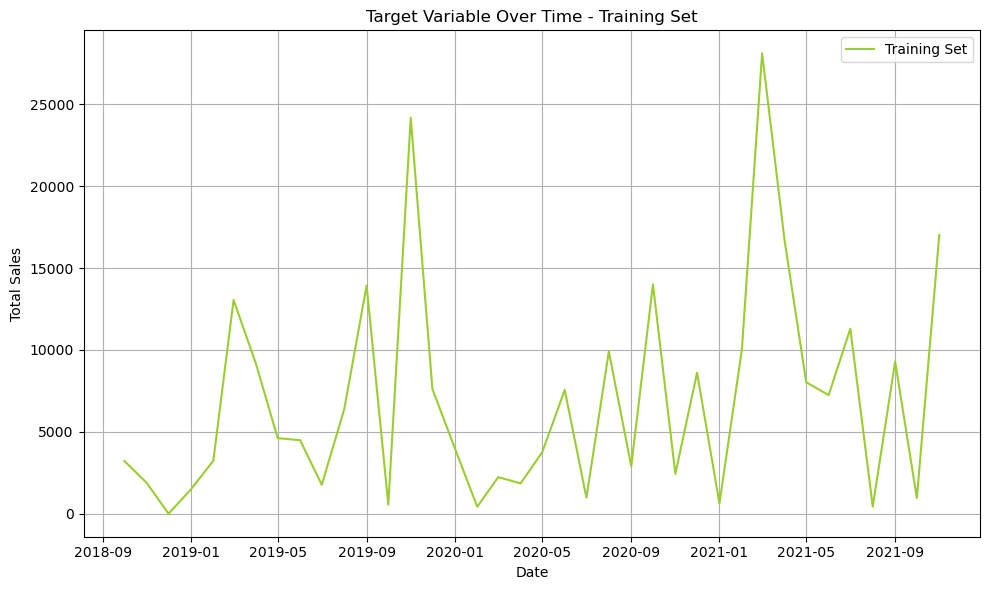

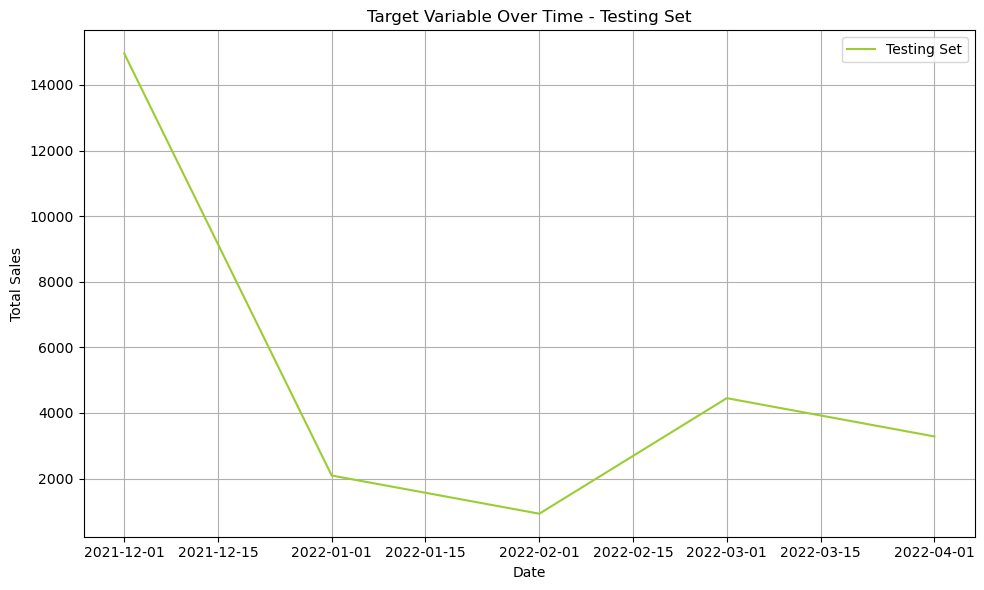

In [284]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_9.index, y_train_9, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_9.index, y_test_9, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Feature Selection

('UK Production Index EE_lag_11', 0.2271255362424625)
('France Machinery and Equipment NEC', 0.09976318451433208)
('China Production Index ME', 0.06088301073686029)
('Italy Production Index ME_lag_11', 0.052030035291539954)
('US Machinery and Equipment NEC_lag_11', 0.0376072206924994)
('Italy Shipments Index ME_lag_7', 0.03514260941907901)
('UK Production Index ME_lag_11', 0.03178497371845724)
('US Production Index ME_lag_11', 0.02657849204491525)
('Japan Production Index EE_lag_10', 0.025584871991933104)
('France Production Index EE_lag_11', 0.0253899671743614)
('France Producer Prices EE_lag_11', 0.023214460873304206)
('Switzerland Production Index EE_lag_5', 0.02240869909936857)
('Japan Production Index ME_lag_10', 0.021879947638297162)
('World Base Metals Price_lag_12', 0.021503814402454146)
('Italy Machinery and Equipment NEC_lag_11', 0.021271664814290773)
('UK Shipments Index ME_lag_11', 0.018568912002376436)
('UK Producer Prices EE_lag_2', 0.017920254465709547)
('World: Price of

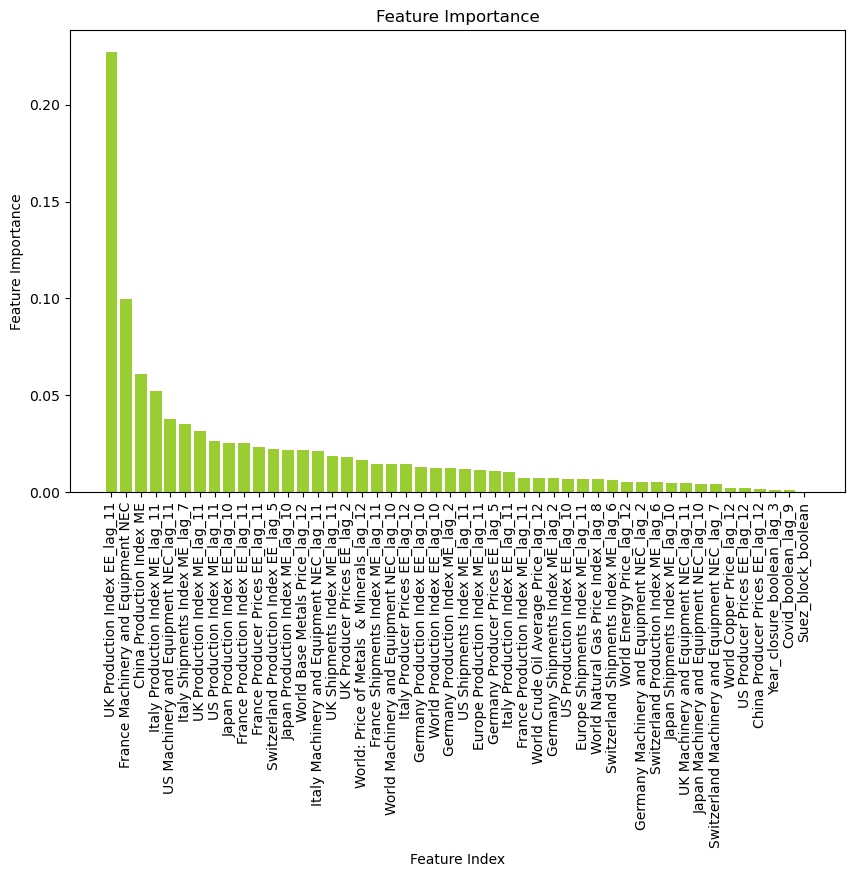

In [285]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_9, y_train_9)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_9, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

SelectFromModel will select those features which importance is greater than the mean importance of all the features by default, but we can alter this threshold if we want.

*Source:https://towardsdatascience.com/feature-selection-using-random-forest-26d7b747597f*

In [286]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_9, y_train_9)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [287]:
selected_feat_9= sel.get_feature_names_out()
selected_feat_9 = list(selected_feat_9)

In [288]:
print(selected_feat_9)

['China Production Index ME', 'Italy Production Index ME_lag_11', 'Italy Shipments Index ME_lag_7', 'Japan Production Index ME_lag_10', 'UK Production Index ME_lag_11', 'US Production Index ME_lag_11', 'World Base Metals Price_lag_12', 'France Producer Prices EE_lag_11', 'US Machinery and Equipment NEC_lag_11', 'Italy Machinery and Equipment NEC_lag_11', 'France Machinery and Equipment NEC', 'Switzerland Production Index EE_lag_5', 'UK Production Index EE_lag_11', 'Japan Production Index EE_lag_10', 'France Production Index EE_lag_11']


In [289]:
correlation_matrix = X_train_9[selected_feat_9].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Italy Production Index ME_lag_11, Italy Machinery and Equipment NEC_lag_11
Correlation: 0.9976181990358683
Pair: Japan Production Index ME_lag_10, Japan Production Index EE_lag_10
Correlation: 0.9718172541480208
Pair: US Production Index ME_lag_11, US Machinery and Equipment NEC_lag_11
Correlation: 0.9870358439258243


In [290]:
# Drop "Germany Machinery and Equipment NEC_lag_2" multiple columns from selected_feat_9 DataFrame
selected_feat_9.remove("Italy Machinery and Equipment NEC_lag_11")
selected_feat_9.remove("Japan Production Index EE_lag_10")
selected_feat_9.remove("US Machinery and Equipment NEC_lag_11")

In [291]:
selected_feat_9

['China Production Index ME',
 'Italy Production Index ME_lag_11',
 'Italy Shipments Index ME_lag_7',
 'Japan Production Index ME_lag_10',
 'UK Production Index ME_lag_11',
 'US Production Index ME_lag_11',
 'World Base Metals Price_lag_12',
 'France Producer Prices EE_lag_11',
 'France Machinery and Equipment NEC',
 'Switzerland Production Index EE_lag_5',
 'UK Production Index EE_lag_11',
 'France Production Index EE_lag_11']

In [292]:
lagged_data_9.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_9
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3219.32
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1875.90
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1487.00
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3234.28


In [293]:
df_9_selected = lagged_data_9[selected_feat_9 + ["GCK_9"]]

In [294]:
# Open the file in binary write mode
with open('df_9_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_9_selected, f)

print(f"Dataset stored in {'df_9_selected.pickle'}")

Dataset stored in df_9_selected.pickle


## Product Group 11

In [295]:
df_11 = extract_product_sales(monthly_sales, "GCK_11")

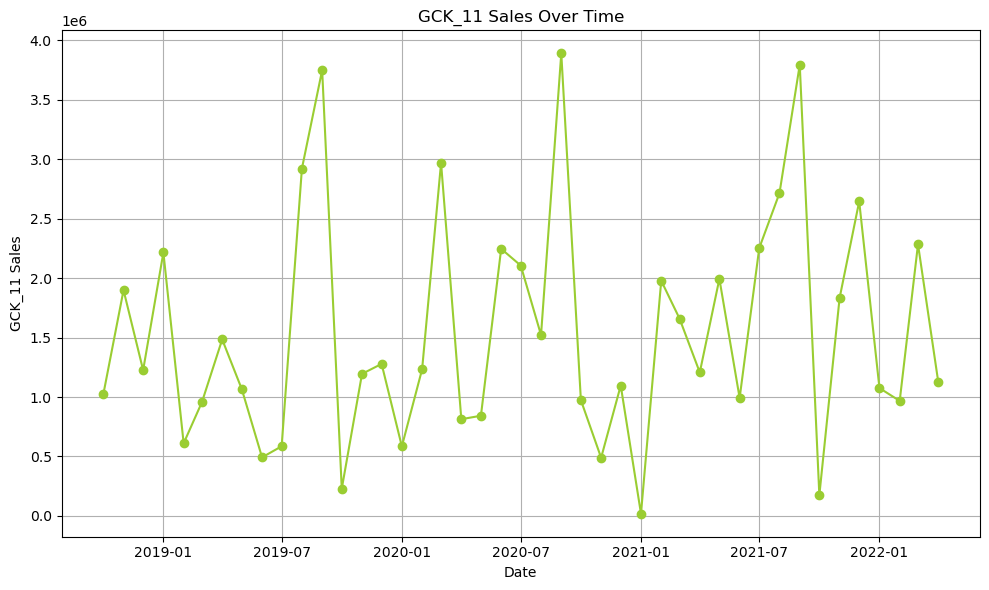

In [296]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_11['Date'], df_11['GCK_11'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_11 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_11 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

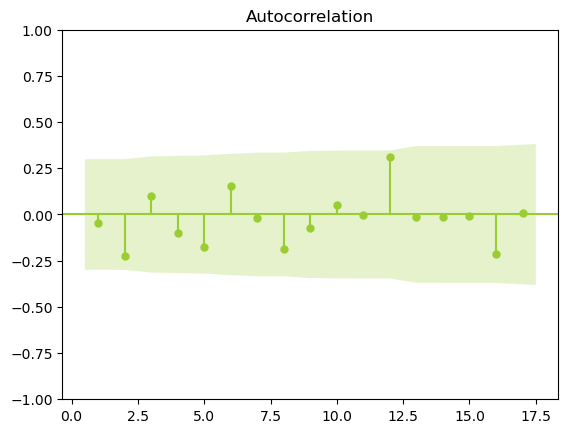

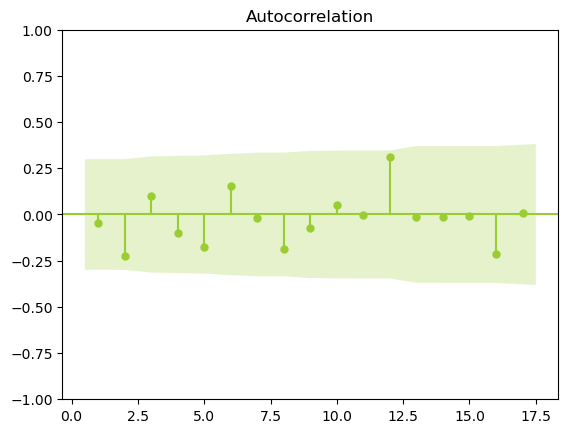

In [297]:
sm.graphics.tsa.plot_acf(df_11['GCK_11'],zero=False)

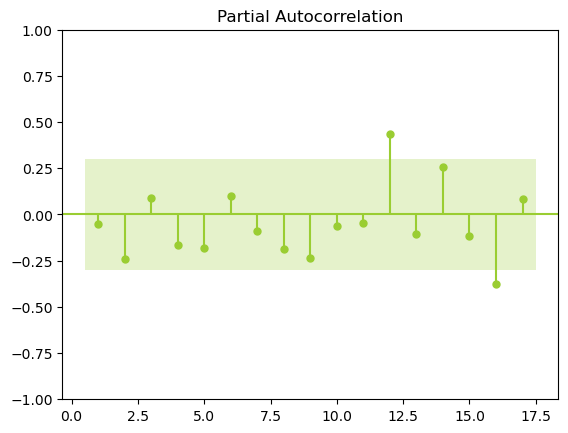

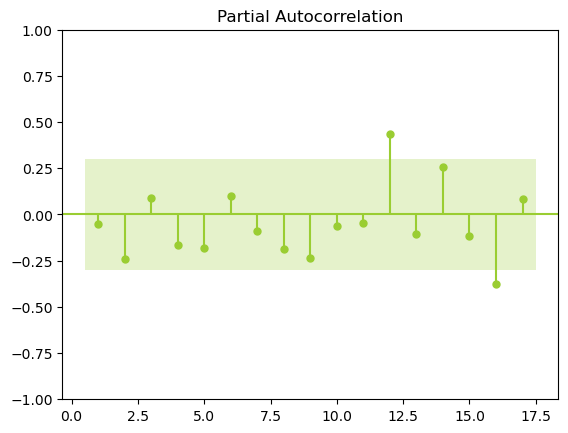

In [298]:
sm.graphics.tsa.plot_pacf(df_11['GCK_11'],zero=False)

In [299]:
# ADF test
result = adfuller(df_11['GCK_11'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -5.627272922346468
p-value: 1.1099942307797948e-06
Critical values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
The time series is stationary


In [300]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_11_lag{i}"] = create_lagged_data(merged_data, i)

In [301]:
lagged_data_11 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_11.drop(columns="Total Sales")
lagged_data_11 = lagged_data_11.join(df_11.set_index('Date')[['GCK_11']], how='left')
lagged_data_11.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_11
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1021303.50
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1898844.80
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1226122.00
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2216391.74
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,610456.60
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,957023.11
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1484281.60
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1066063.90
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,492133.20


In [302]:
correlation = lagged_data_11.corr()["GCK_11"]
print(correlation)

Month                         0.153898
Year                          0.088285
China Production Index ME     0.132160
France Production Index ME   -0.032159
France Shipments Index ME    -0.007043
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_11                        1.000000
Name: GCK_11, Length: 628, dtype: float64


In [303]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_7', 'France Production Index ME_lag_1', 'France Shipments Index ME_lag_9', 'Germany Production Index ME_lag_9', 'Germany Shipments Index ME_lag_9', 'Italy Production Index ME_lag_1', 'Italy Shipments Index ME_lag_9', 'Japan Production Index ME_lag_6', 'Japan Shipments Index ME_lag_6', 'Switzerland Production Index ME_lag_12', 'Switzerland Shipments Index ME_lag_12', 'UK Production Index ME_lag_6', 'UK Shipments Index ME_lag_4', 'US Production Index ME_lag_6', 'US Shipments Index ME_lag_3', 'Europe Production Index ME_lag_9', 'Europe Shipments Index ME_lag_9', 'World Base Metals Price_lag_7', 'World Energy Price_lag_12', 'World: Price of Metals  & Minerals_lag_2', 'World Natural Gas Price Index_lag_12', 'World Crude Oil Average Price_lag_12', 'World Copper Price_lag_7', 'US Producer Prices EE_lag_8', 'UK Producer Prices EE_lag_11', 'Italy Producer Prices EE_lag_1', 'France Producer Prices EE_lag_6', 'Germany Producer Pric

In [304]:
best_lags_11= lagged_data_11[ highest_corr_columns + ["GCK_11"]]

In [305]:
best_lags_11.head()

,China Production Index ME_lag_7,France Production Index ME_lag_1,France Shipments Index ME_lag_9,Germany Production Index ME_lag_9,Germany Shipments Index ME_lag_9,Italy Production Index ME_lag_1,Italy Shipments Index ME_lag_9,Japan Production Index ME_lag_6,Japan Shipments Index ME_lag_6,Switzerland Production Index ME_lag_12,...,Switzerland Production Index EE_lag_2,UK Production Index EE_lag_6,Italy Production Index EE_lag_1,Japan Production Index EE_lag_6,France Production Index EE_lag_1,Germany Production Index EE_lag_10,Year_closure_boolean_lag_12,Covid_boolean_lag_2,Suez_block_boolean,GCK_11
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1021303.50
2018-11-01,NaN,108.280608,NaN,NaN,NaN,118.350514,NaN,NaN,NaN,NaN,...,NaN,NaN,93.001511,NaN,97.849541,NaN,NaN,NaN,0,1898844.80
2018-12-01,NaN,99.636911,NaN,NaN,NaN,107.719260,NaN,NaN,NaN,NaN,...,112.970843,NaN,84.133400,NaN,91.155960,NaN,NaN,0.0,0,1226122.00
2019-01-01,NaN,94.690312,NaN,NaN,NaN,88.783181,NaN,NaN,NaN,NaN,...,114.736013,NaN,64.881248,NaN,78.033028,NaN,NaN,0.0,0,2216391.74
2019-02-01,NaN,90.143775,NaN,NaN,NaN,99.275113,NaN,NaN,NaN,NaN,...,116.501182,NaN,81.556343,NaN,81.908257,NaN,NaN,0.0,0,610456.60


### Deal With Outliers

In [306]:
best_lags_11.loc[best_lags_11.index.month == 12, 'GCK_11'].describe()

count    4.000000e+00
mean     1.561682e+06
std      7.267173e+05
min      1.096371e+06
25%      1.193684e+06
50%      1.252334e+06
75%      1.620332e+06
max      2.645690e+06
Name: GCK_11, dtype: float64

In [307]:
best_lags_11.loc[best_lags_11.index.month == 12, 'GCK_11'] = best_lags_11.loc[best_lags_11.index.month == 12, 'GCK_11'].clip(upper=1700000)

### Train Test Split

In [308]:
X = best_lags_11.drop(columns=['GCK_11'])
y = best_lags_11['GCK_11']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_11, X_test_11, y_train_11, y_test_11 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_11, y_train_11)
    
    # Make predictions
    y_pred = model.predict(X_test_11)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_11, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 566491.1561301921


In [309]:
train_size = len(X_train_11) - len(X_test_11)
print("Size of the sales train set:", train_size)

test_size = len(X_test_11)
print("Size of the market test set:", test_size)


Size of the sales train set: 33
Size of the market test set: 5


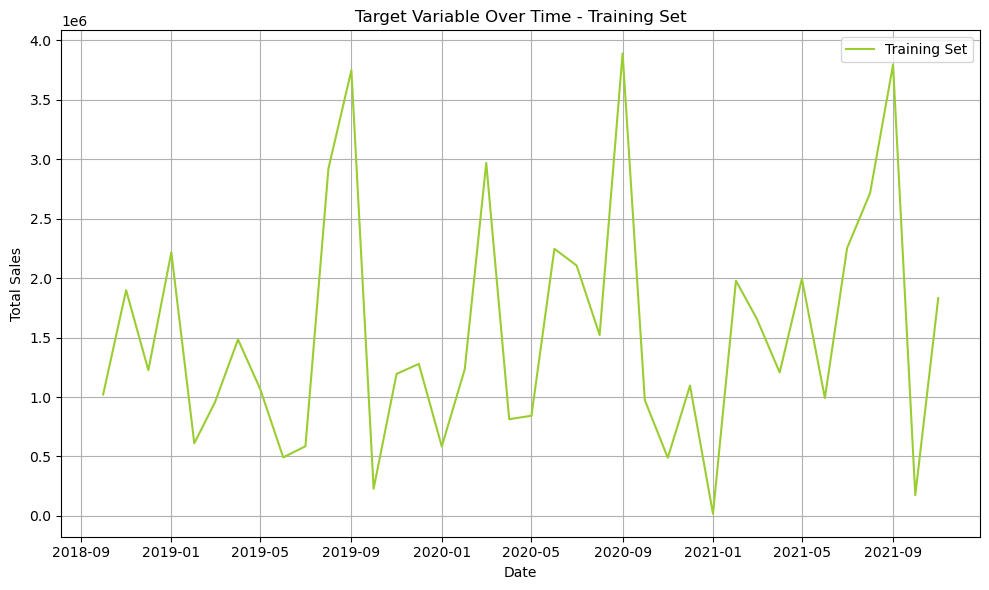

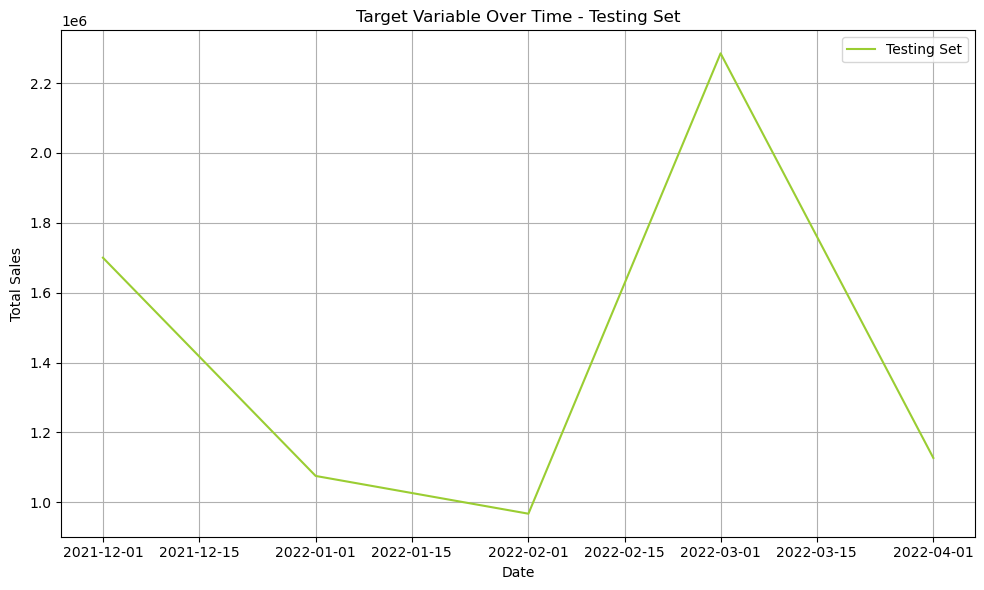

In [310]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_11.index, y_train_11, label='Training Set', color="yellowgreen")
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_11.index, y_test_11, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Feature Selection

('China Production Index ME_lag_7', 0.1425353575814737)
('France Shipments Index ME_lag_9', 0.11177896140969212)
('Italy Shipments Index ME_lag_9', 0.054937195195005166)
('Switzerland Production Index EE_lag_2', 0.05420967544426589)
('Japan Production Index ME_lag_6', 0.05367996015259268)
('Europe Shipments Index ME_lag_9', 0.04173330905855939)
('Japan Production Index EE_lag_6', 0.03068775330016008)
('UK Producer Prices EE_lag_11', 0.030549377016160683)
('Germany Shipments Index ME_lag_9', 0.030424969643493685)
('UK Shipments Index ME_lag_4', 0.029608300084067424)
('Japan Shipments Index ME_lag_6', 0.024645654707266686)
('Japan Machinery and Equipment NEC_lag_6', 0.02292124171157206)
('US Shipments Index ME_lag_3', 0.021353831138989667)
('France Machinery and Equipment NEC_lag_1', 0.020498702460149877)
('World Natural Gas Price Index_lag_12', 0.019849638531607806)
('Italy Production Index ME_lag_1', 0.01936350753412595)
('World Machinery and Equipment NEC_lag_7', 0.01845544106084202)


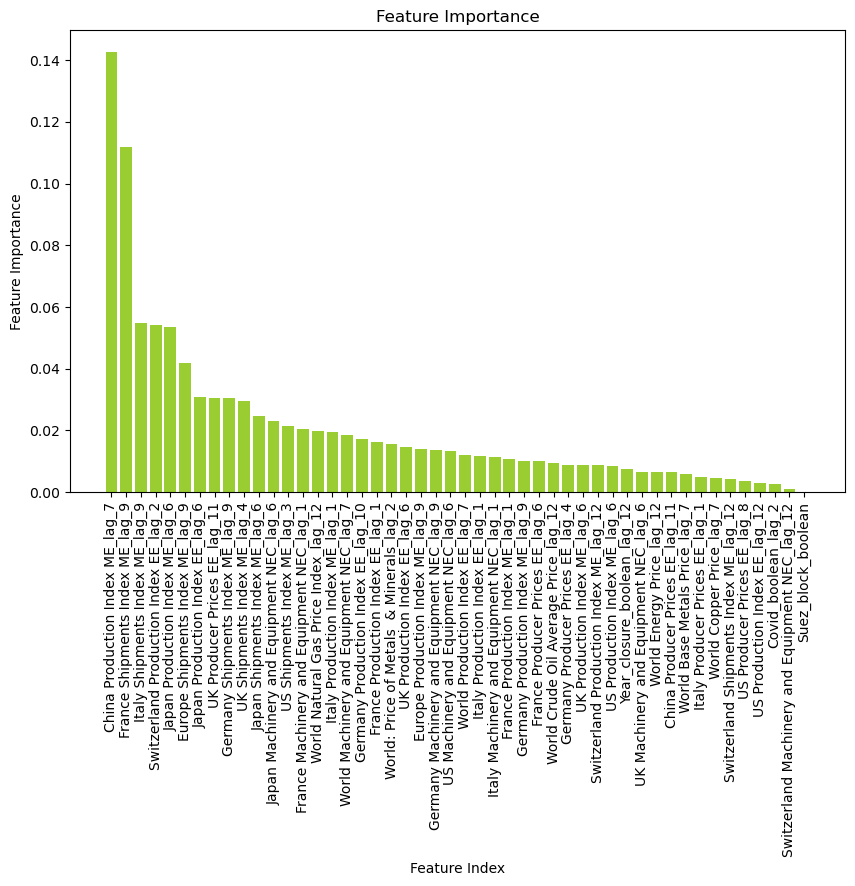

In [311]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_11, y_train_11)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_11, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [312]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_11, y_train_11)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [313]:
selected_feat_11= sel.get_feature_names_out()
selected_feat_11 = list(selected_feat_11)

In [314]:
correlation_matrix = X_train_11[selected_feat_11].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Germany Shipments Index ME_lag_9, Europe Shipments Index ME_lag_9
Correlation: 0.9501477790614796
Pair: Japan Production Index ME_lag_6, Japan Shipments Index ME_lag_6
Correlation: 0.9934112894132713
Pair: Japan Production Index ME_lag_6, Japan Machinery and Equipment NEC_lag_6
Correlation: 0.9961155728628781
Pair: Japan Production Index ME_lag_6, Japan Production Index EE_lag_6
Correlation: 0.9768990488843405
Pair: Japan Shipments Index ME_lag_6, Japan Machinery and Equipment NEC_lag_6
Correlation: 0.9876382498298112
Pair: Japan Shipments Index ME_lag_6, Japan Production Index EE_lag_6
Correlation: 0.9751081187826335
Pair: Japan Machinery and Equipment NEC_lag_6, Japan Production Index EE_lag_6
Correlation: 0.9542867871082342


In [315]:
selected_feat_11.remove("Germany Shipments Index ME_lag_9")
selected_feat_11.remove("Japan Shipments Index ME_lag_6")
selected_feat_11.remove("Japan Machinery and Equipment NEC_lag_6")
selected_feat_11.remove("Japan Production Index EE_lag_6")


In [316]:
df_11_selected = lagged_data_11[selected_feat_11 + ["GCK_11"]]

In [317]:
# Open the file in binary write mode
with open('df_11_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_11_selected, f)

print(f"Dataset stored in {'df_11_selected.pickle'}")

Dataset stored in df_11_selected.pickle


## Product Group 12

In [318]:
df_12 = extract_product_sales(monthly_sales, "GCK_12")

In [319]:
df_12.head()

,Date,GCK_12
0,2018-10-01,28686.33
1,2018-11-01,1070.00
2,2018-12-01,17880.60
3,2019-01-01,21484.00
4,2019-02-01,34214.74


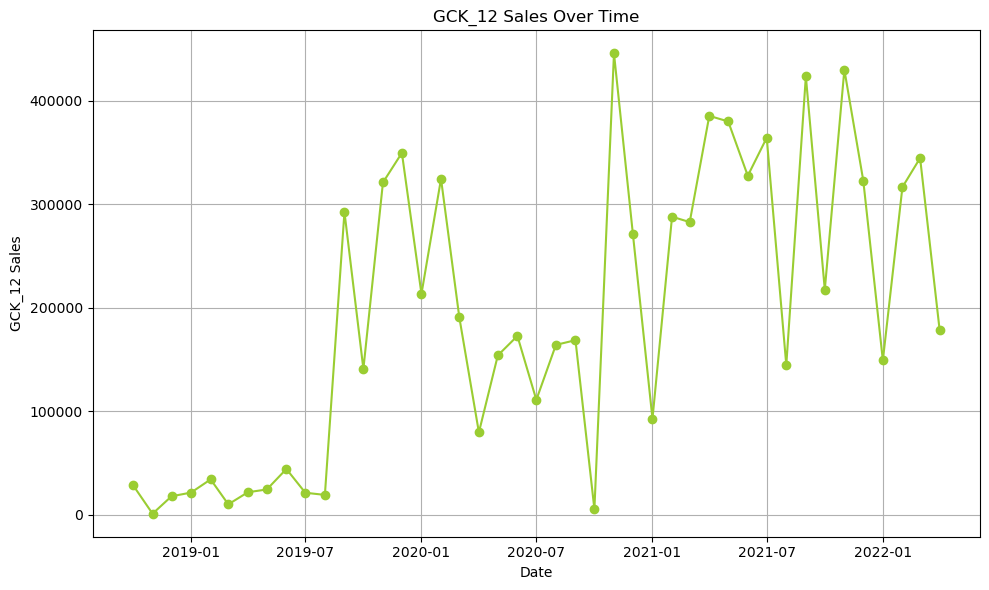

In [320]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_12['Date'], df_12['GCK_12'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_12 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_12 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

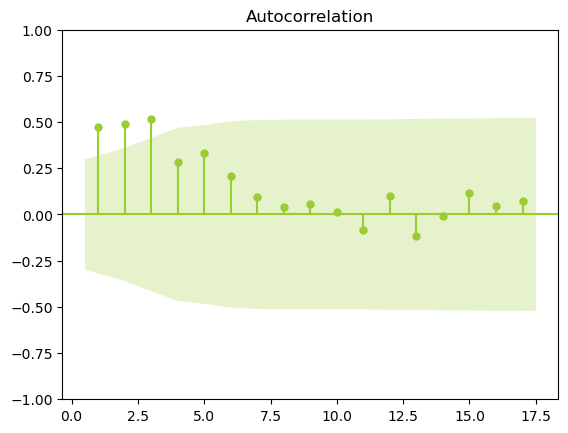

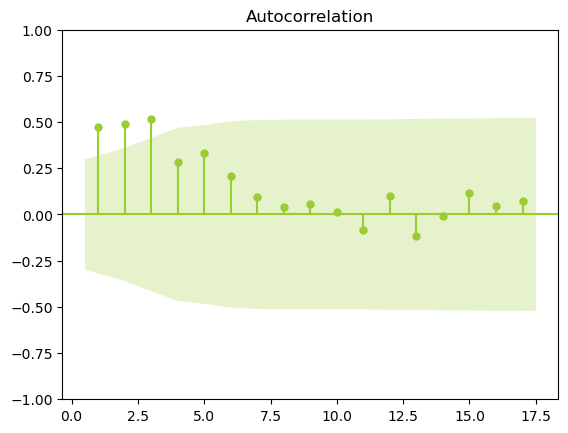

In [321]:
sm.graphics.tsa.plot_acf(df_12['GCK_12'],zero=False)

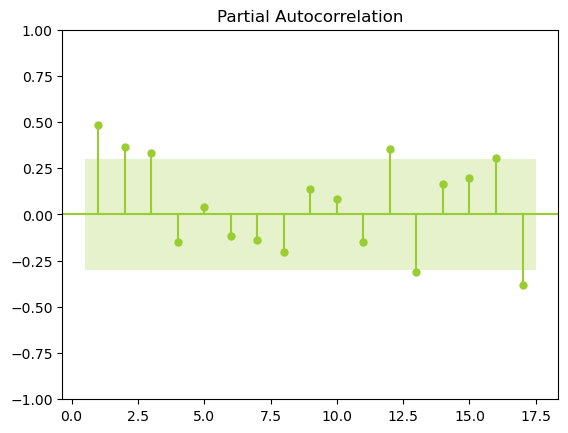

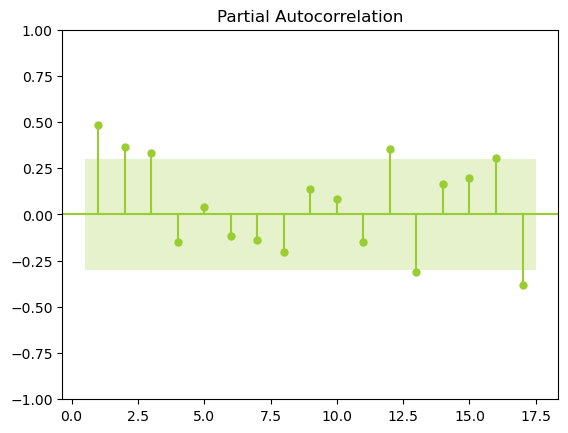

In [322]:
sm.graphics.tsa.plot_pacf(df_12['GCK_12'],zero=False)

In [323]:
# ADF test
result = adfuller(df_12['GCK_12'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.8639542204410118
p-value: 0.0023167347199180436
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


In [324]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_12_lag{i}"] = create_lagged_data(merged_data, i)

# Source: ChatGPT

In [325]:
lagged_data_12 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_12.drop(columns="Total Sales")
lagged_data_12 = lagged_data_12.join(df_12.set_index('Date')[['GCK_12']], how='left')
lagged_data_12.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_12
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28686.33
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1070.00
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17880.60
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21484.00
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34214.74
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10118.00
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,21813.27
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,24468.00
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,44255.68


In [326]:
lagged_data_12.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_12
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28686.33
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1070.00
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17880.60
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21484.00
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34214.74


In [327]:
correlation = lagged_data_12.corr()["GCK_12"]
print(correlation)

Month                         0.131858
Year                          0.584530
China Production Index ME     0.416989
France Production Index ME    0.147530
France Shipments Index ME     0.253248
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_12                        1.000000
Name: GCK_12, Length: 628, dtype: float64


In [328]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_6', 'France Production Index ME_lag_10', 'France Shipments Index ME_lag_10', 'Germany Production Index ME_lag_10', 'Germany Shipments Index ME_lag_10', 'Italy Production Index ME_lag_11', 'Italy Shipments Index ME', 'Japan Production Index ME_lag_10', 'Japan Shipments Index ME_lag_10', 'Switzerland Production Index ME_lag_8', 'Switzerland Shipments Index ME_lag_8', 'UK Production Index ME_lag_10', 'UK Shipments Index ME_lag_12', 'US Production Index ME_lag_12', 'US Shipments Index ME_lag_10', 'Europe Production Index ME_lag_10', 'Europe Shipments Index ME_lag_10', 'World Base Metals Price', 'World Energy Price_lag_12', 'World: Price of Metals  & Minerals', 'World Natural Gas Price Index', 'World Crude Oil Average Price_lag_12', 'World Copper Price', 'US Producer Prices EE', 'UK Producer Prices EE_lag_8', 'Italy Producer Prices EE', 'France Producer Prices EE_lag_1', 'Germany Producer Prices EE_lag_1', 'China Producer Pri

In [329]:
highest_corr_columns

['China Production Index ME_lag_6',
 'France Production Index ME_lag_10',
 'France Shipments Index ME_lag_10',
 'Germany Production Index ME_lag_10',
 'Germany Shipments Index ME_lag_10',
 'Italy Production Index ME_lag_11',
 'Italy Shipments Index ME',
 'Japan Production Index ME_lag_10',
 'Japan Shipments Index ME_lag_10',
 'Switzerland Production Index ME_lag_8',
 'Switzerland Shipments Index ME_lag_8',
 'UK Production Index ME_lag_10',
 'UK Shipments Index ME_lag_12',
 'US Production Index ME_lag_12',
 'US Shipments Index ME_lag_10',
 'Europe Production Index ME_lag_10',
 'Europe Shipments Index ME_lag_10',
 'World Base Metals Price',
 'World Energy Price_lag_12',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price_lag_12',
 'World Copper Price',
 'US Producer Prices EE',
 'UK Producer Prices EE_lag_8',
 'Italy Producer Prices EE',
 'France Producer Prices EE_lag_1',
 'Germany Producer Prices EE_lag_1',
 'China Producer Prices EE

In [330]:
# keep only the best lags for each feature
best_lags_12= lagged_data_12[ highest_corr_columns + ["GCK_12"]]

In [331]:
best_lags_12.head()

,China Production Index ME_lag_6,France Production Index ME_lag_10,France Shipments Index ME_lag_10,Germany Production Index ME_lag_10,Germany Shipments Index ME_lag_10,Italy Production Index ME_lag_11,Italy Shipments Index ME,Japan Production Index ME_lag_10,Japan Shipments Index ME_lag_10,Switzerland Production Index ME_lag_8,...,Switzerland Production Index EE_lag_8,UK Production Index EE,Italy Production Index EE,Japan Production Index EE_lag_10,France Production Index EE_lag_7,Germany Production Index EE_lag_11,Year_closure_boolean_lag_5,Covid_boolean,Suez_block_boolean,GCK_12
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,122.456894,NaN,NaN,NaN,...,NaN,118.670791,93.001511,NaN,NaN,NaN,NaN,0,0,28686.33
2018-11-01,NaN,NaN,NaN,NaN,NaN,NaN,120.132032,NaN,NaN,NaN,...,NaN,120.467019,84.133400,NaN,NaN,NaN,NaN,0,0,1070.00
2018-12-01,NaN,NaN,NaN,NaN,NaN,NaN,131.936099,NaN,NaN,NaN,...,NaN,105.378705,64.881248,NaN,NaN,NaN,NaN,0,0,17880.60
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,92.418842,NaN,NaN,NaN,...,NaN,107.174933,81.556343,NaN,NaN,NaN,NaN,0,0,21484.00
2019-02-01,NaN,NaN,NaN,NaN,NaN,NaN,103.214212,NaN,NaN,NaN,...,NaN,110.647640,83.451233,NaN,NaN,NaN,NaN,0,0,34214.74


### Deal With Outliers

In [332]:
best_lags_12.loc[best_lags_12.index.month == 12, 'GCK_12'].describe()


count         4.000000
mean     240266.975000
std      151793.175092
min       17880.600000
25%      207738.292500
50%      296836.005000
75%      329364.687500
max      349515.290000
Name: GCK_12, dtype: float64

In [333]:
best_lags_12.loc[best_lags_12.index.month == 12, 'GCK_12'] = best_lags_12.loc[best_lags_12.index.month == 12, 'GCK_12'].clip(lower=220000)

### Train Test Split

In [334]:
X = best_lags_12.drop(columns=['GCK_12'])
y = best_lags_12['GCK_12']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_12, X_test_12, y_train_12, y_test_12 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_12, y_train_12)
    
    # Make predictions
    y_pred = model.predict(X_test_12)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_12, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 47954.02632411995


In [335]:
train_size = len(X_train_12) - len(X_test_12)
print("Size of the sales train set:", train_size)

test_size = len(X_test_12)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


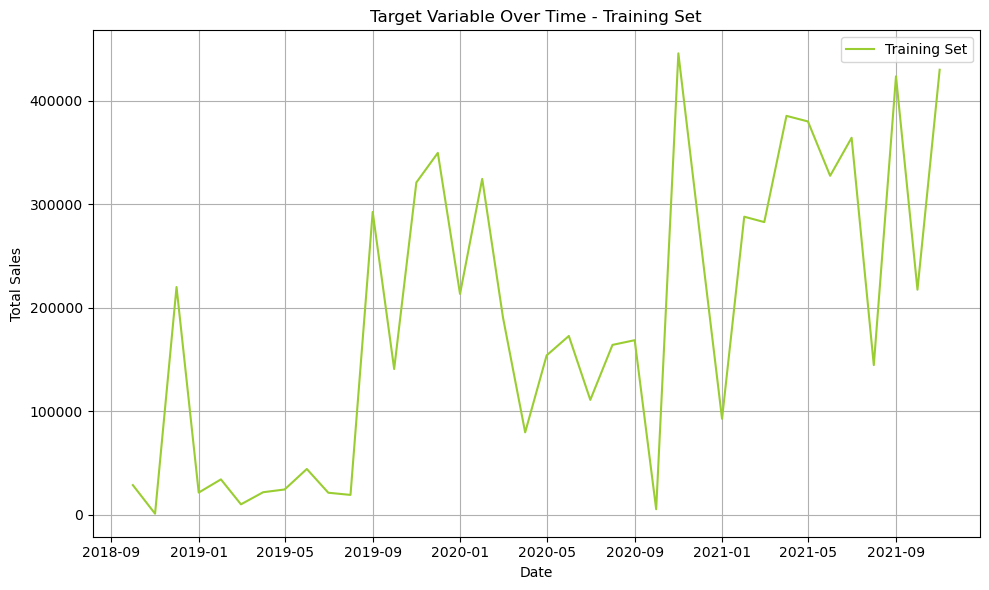

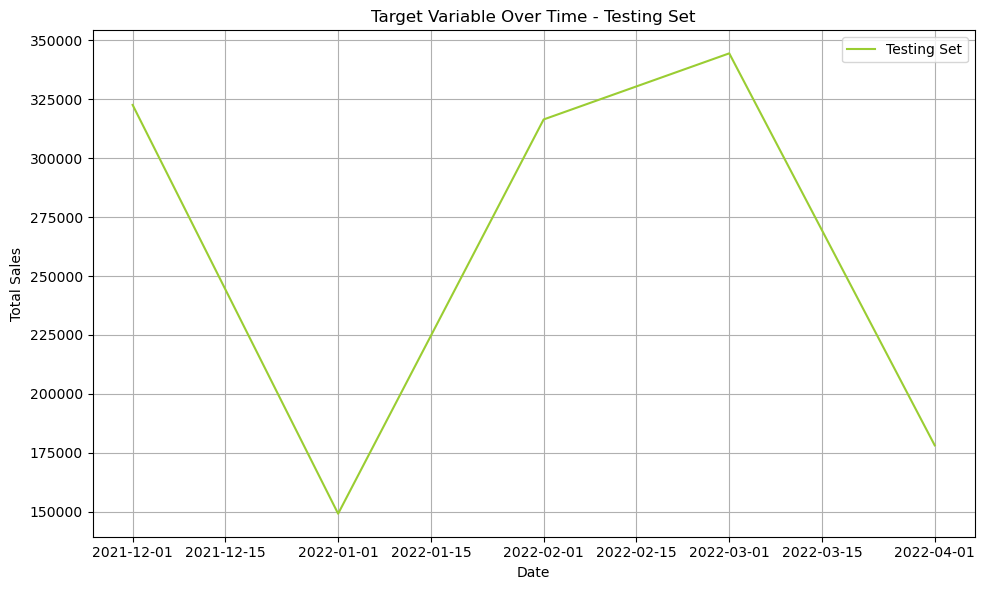

In [336]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_12.index, y_train_12, label='Training Set', color="yellowgreen")
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_12.index, y_test_12, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Feature Selection

('Germany Production Index ME_lag_10', 0.11865132892196262)
('Japan Shipments Index ME_lag_10', 0.10109091652126588)
('Japan Production Index ME_lag_10', 0.08491147348303801)
('Germany Machinery and Equipment NEC_lag_10', 0.05554971148768864)
('China Production Index ME_lag_6', 0.05469103484434005)
('France Shipments Index ME_lag_10', 0.04040235722184749)
('Switzerland Shipments Index ME_lag_8', 0.03762955740562203)
('US Shipments Index ME_lag_10', 0.03593770573158664)
('France Production Index ME_lag_10', 0.03422793649556341)
('Italy Production Index ME_lag_11', 0.033717271976730745)
('UK Production Index ME_lag_10', 0.028289057004012127)
('Italy Shipments Index ME', 0.025728315004389598)
('UK Shipments Index ME_lag_12', 0.025363502629605808)
('US Machinery and Equipment NEC_lag_12', 0.020505206987935048)
('UK Production Index EE', 0.018911431798593874)
('Japan Machinery and Equipment NEC_lag_10', 0.017759770659704733)
('US Production Index ME_lag_12', 0.017625334376362684)
('Italy Pr

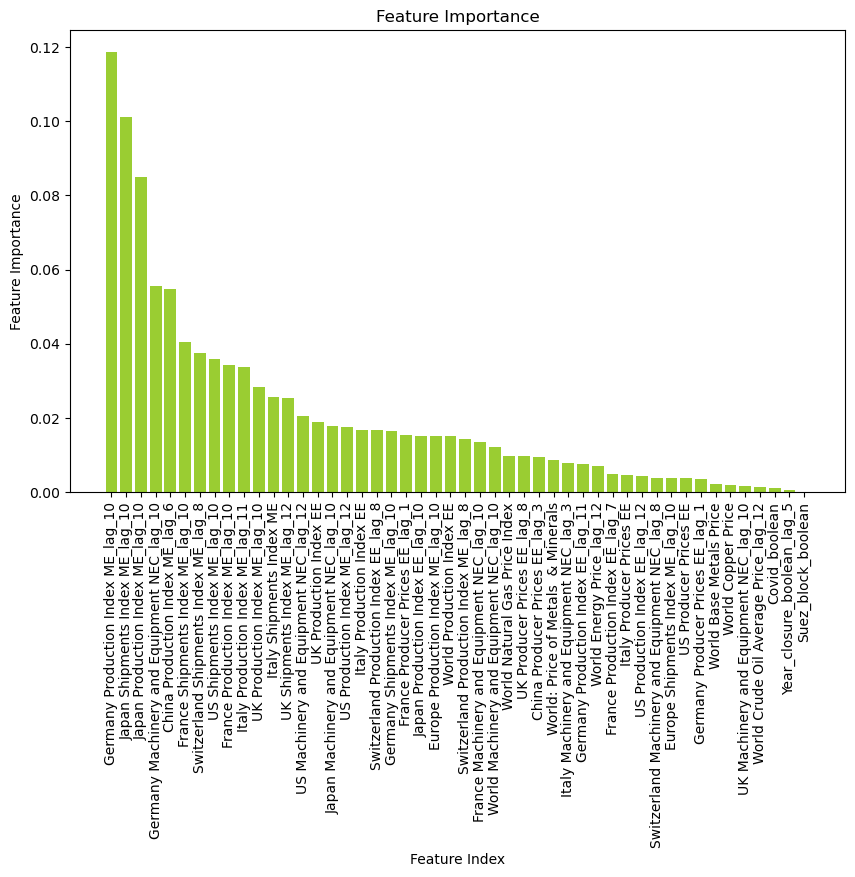

In [337]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_12, y_train_12)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_12, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [338]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_12, y_train_12)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [339]:
selected_feat_12= sel.get_feature_names_out()
selected_feat_12 = list(selected_feat_12)
len(selected_feat_12)

13

In [340]:
correlation_matrix = X_train_12[selected_feat_12].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Germany Production Index ME_lag_10, Germany Machinery and Equipment NEC_lag_10
Correlation: 0.964654889700376
Pair: Japan Production Index ME_lag_10, Japan Shipments Index ME_lag_10
Correlation: 0.9924548823149749


In [341]:
# comparing the pairs of features with correlation >0.95 and keeping the feature with the most importance
selected_feat_12.remove("Germany Machinery and Equipment NEC_lag_10")
selected_feat_12.remove("Japan Shipments Index ME_lag_10")

In [342]:
df_12_selected = lagged_data_12 [selected_feat_12 + ["GCK_12"]]

In [343]:
# Open the file in binary write mode
with open('df_12_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_12_selected, f)

print(f"Dataset stored in {'df_12_selected.pickle'}")

Dataset stored in df_12_selected.pickle


## Product Group 13

In [344]:
# Create a new dataframe displaying only the sales for GCK 13 
df_13 = extract_product_sales(monthly_sales, 'GCK_13')
df_13.head(10)

,Date,GCK_13
0,2018-10-01,27666.10
1,2018-11-01,68338.20
2,2018-12-01,15655.18
3,2019-01-01,27198.29
4,2019-02-01,32638.63
5,2019-03-01,11890.00
6,2019-04-01,7514.85
7,2019-05-01,2558.90
8,2019-06-01,34849.21
9,2019-07-01,43008.35


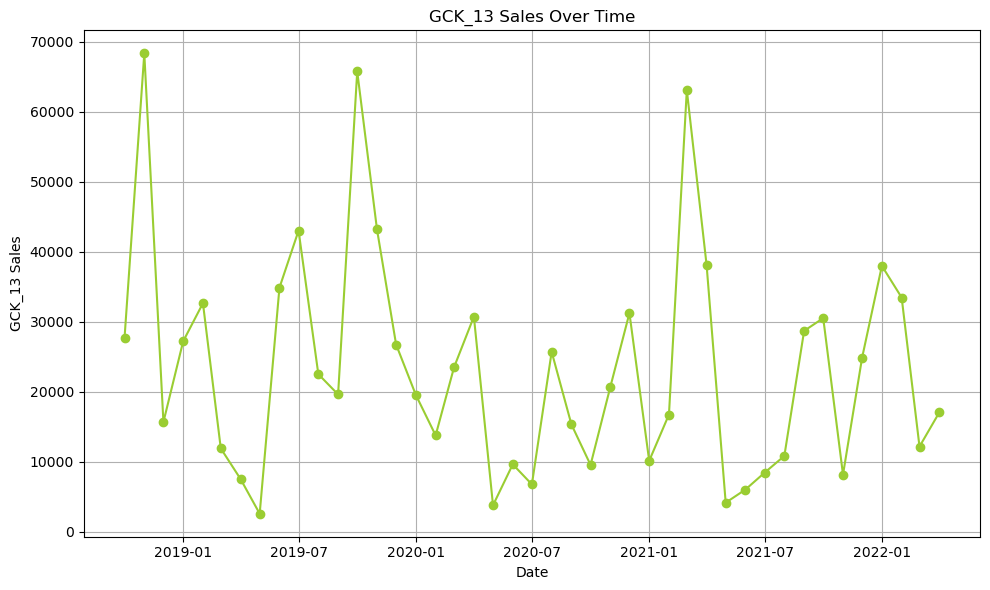

In [345]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_13['Date'], df_13['GCK_13'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_13 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_13 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

We can denote sales peak in tree main moments for product GCK_13: november 2018, october 2019 and march 2021 

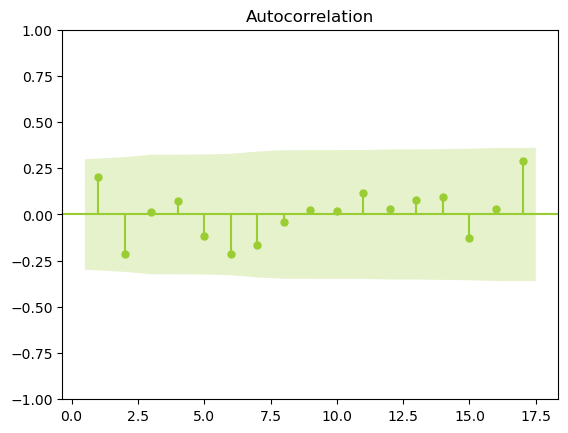

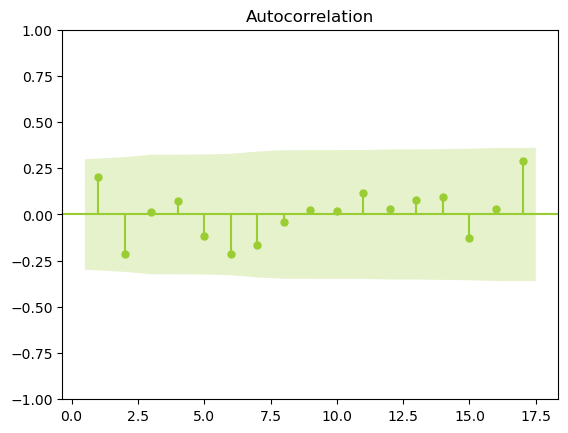

In [346]:
sm.graphics.tsa.plot_acf(df_13['GCK_13'],zero=False)

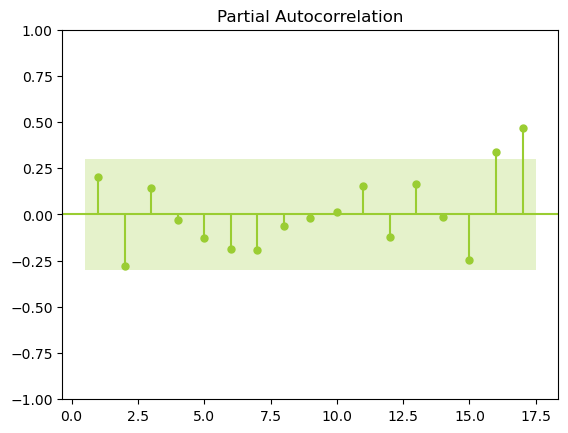

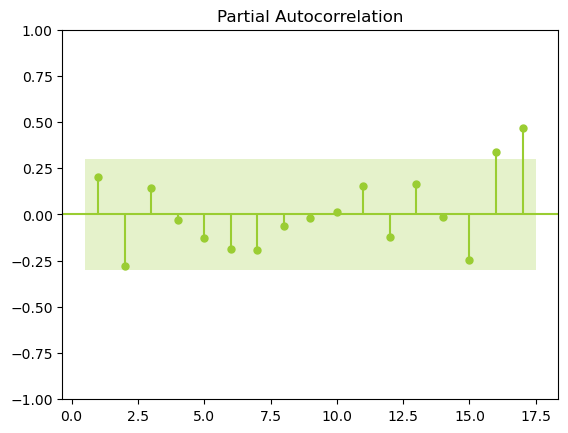

In [347]:
sm.graphics.tsa.plot_pacf(df_13['GCK_13'],zero=False)

In [348]:
# ADF test
result = adfuller(df_13['GCK_13'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.254543053886092
p-value: 0.01703677278620139
Critical values: {'1%': -3.6055648906249997, '5%': -2.937069375, '10%': -2.606985625}
The time series is stationary


Product Group 13 is stationary meaning it is not time dependent. it means that its behavior does not exhibit trends, seasonality, or other systematic patterns that would make forecasting difficult.

In [349]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_13_lag{i}"] = create_lagged_data(merged_data, i)

# Source: ChatGPT  

In [350]:
lagged_data_13 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_13.drop(columns="Total Sales")
lagged_data_13 = lagged_data_13.join(df_13.set_index('Date')[['GCK_13']], how='left')
lagged_data_13.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_13
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27666.10
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68338.20
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15655.18
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27198.29
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32638.63
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11890.00
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,7514.85
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,2558.90
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,34849.21


In [351]:
lagged_data_13.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_13'],
      dtype='object', length=628)

In [352]:
lagged_data_13.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_13
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27666.10
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68338.20
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15655.18
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27198.29
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32638.63


In [353]:
correlation = lagged_data_13.corr()["GCK_13"]
correlation

Month                         0.144390
Year                         -0.208041
China Production Index ME    -0.080703
France Production Index ME    0.176179
France Shipments Index ME     0.174165
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_13                        1.000000
Name: GCK_13, Length: 628, dtype: float64

In [354]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_2', 'France Production Index ME_lag_1', 'France Shipments Index ME_lag_11', 'Germany Production Index ME_lag_1', 'Germany Shipments Index ME_lag_1', 'Italy Production Index ME_lag_9', 'Italy Shipments Index ME_lag_3', 'Japan Production Index ME_lag_12', 'Japan Shipments Index ME_lag_12', 'Switzerland Production Index ME', 'Switzerland Shipments Index ME', 'UK Production Index ME_lag_1', 'UK Shipments Index ME_lag_1', 'US Production Index ME_lag_12', 'US Shipments Index ME_lag_11', 'Europe Production Index ME_lag_1', 'Europe Shipments Index ME_lag_1', 'World Base Metals Price_lag_1', 'World Energy Price_lag_3', 'World: Price of Metals  & Minerals_lag_1', 'World Natural Gas Price Index_lag_12', 'World Crude Oil Average Price_lag_3', 'World Copper Price_lag_1', 'US Producer Prices EE_lag_1', 'UK Producer Prices EE_lag_11', 'Italy Producer Prices EE', 'France Producer Prices EE_lag_11', 'Germany Producer Prices EE_lag_12', '

In [355]:
highest_corr_columns

['China Production Index ME_lag_2',
 'France Production Index ME_lag_1',
 'France Shipments Index ME_lag_11',
 'Germany Production Index ME_lag_1',
 'Germany Shipments Index ME_lag_1',
 'Italy Production Index ME_lag_9',
 'Italy Shipments Index ME_lag_3',
 'Japan Production Index ME_lag_12',
 'Japan Shipments Index ME_lag_12',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME_lag_1',
 'UK Shipments Index ME_lag_1',
 'US Production Index ME_lag_12',
 'US Shipments Index ME_lag_11',
 'Europe Production Index ME_lag_1',
 'Europe Shipments Index ME_lag_1',
 'World Base Metals Price_lag_1',
 'World Energy Price_lag_3',
 'World: Price of Metals  & Minerals_lag_1',
 'World Natural Gas Price Index_lag_12',
 'World Crude Oil Average Price_lag_3',
 'World Copper Price_lag_1',
 'US Producer Prices EE_lag_1',
 'UK Producer Prices EE_lag_11',
 'Italy Producer Prices EE',
 'France Producer Prices EE_lag_11',
 'Germany Producer Prices EE_lag_12',
 'China 

In [356]:
# keep only the best lags for each feature
best_lags_13= lagged_data_13[ highest_corr_columns + ["GCK_13"]]
best_lags_13.head()

,China Production Index ME_lag_2,France Production Index ME_lag_1,France Shipments Index ME_lag_11,Germany Production Index ME_lag_1,Germany Shipments Index ME_lag_1,Italy Production Index ME_lag_9,Italy Shipments Index ME_lag_3,Japan Production Index ME_lag_12,Japan Shipments Index ME_lag_12,Switzerland Production Index ME,...,Switzerland Production Index EE,UK Production Index EE_lag_11,Italy Production Index EE_lag_5,Japan Production Index EE_lag_12,France Production Index EE_lag_1,Germany Production Index EE_lag_1,Year_closure_boolean_lag_11,Covid_boolean,Suez_block_boolean,GCK_13
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.077781,...,112.970843,NaN,NaN,NaN,NaN,NaN,NaN,0,0,27666.10
2018-11-01,NaN,108.280608,NaN,124.227879,137.741953,NaN,NaN,NaN,NaN,112.241491,...,114.736013,NaN,NaN,NaN,97.849541,118.298233,NaN,0,0,68338.20
2018-12-01,211.955755,99.636911,NaN,127.404132,142.732193,NaN,NaN,NaN,NaN,115.405201,...,116.501182,NaN,NaN,NaN,91.155960,117.163727,NaN,0,0,15655.18
2019-01-01,220.519655,94.690312,NaN,120.518565,141.407661,NaN,122.456894,NaN,NaN,109.621788,...,110.354610,NaN,NaN,NaN,78.033028,89.626122,NaN,0,0,27198.29
2019-02-01,241.846854,90.143775,NaN,104.776326,118.703828,NaN,120.132032,NaN,NaN,103.838375,...,104.208038,NaN,NaN,NaN,81.908257,105.406097,NaN,0,0,32638.63


In [357]:
len(highest_corr_columns)

48

# Deal With Outliers

In [358]:
# Cap values in column Total Sales for month 10
best_lags_13.loc[best_lags_13.index.month == 10, 'GCK_13'] = best_lags_13.loc[best_lags_13.index.month == 10, 'GCK_13'].clip(upper=39000)

### Train/ Test Split

This allows you to evaluate your model's performance on multiple test sets across different time periods

In [359]:
X = best_lags_13.drop(columns=['GCK_13'])
y = best_lags_13['GCK_13']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_13, X_test_13, y_train_13, y_test_13 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_13, y_train_13)
    
    # Make predictions
    y_pred = model.predict(X_test_13)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_13, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.8
Best Test Size: 0.19999999999999996
Best RMSE: 14333.384806890943


In [360]:
train_size = len(X_train_13) - len(X_test_13)
print("Size of the sales train set:", train_size)
            
test_size = len(X_test_13)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


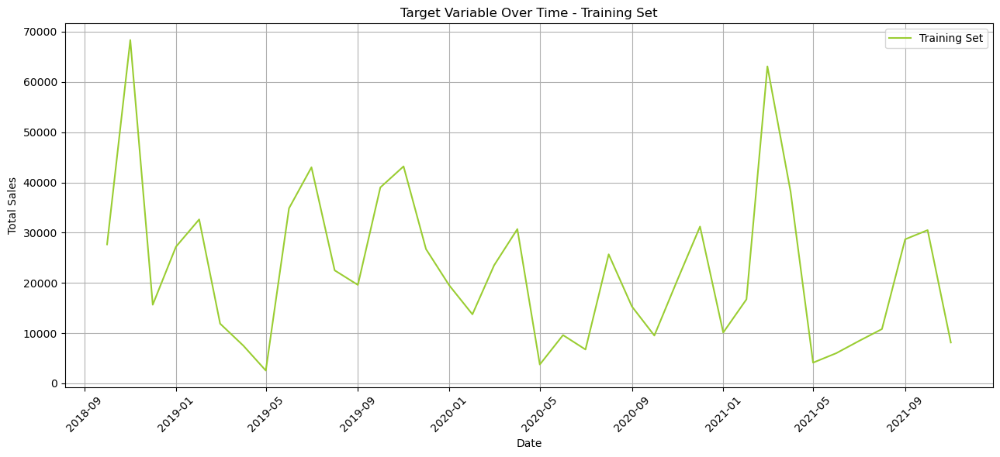

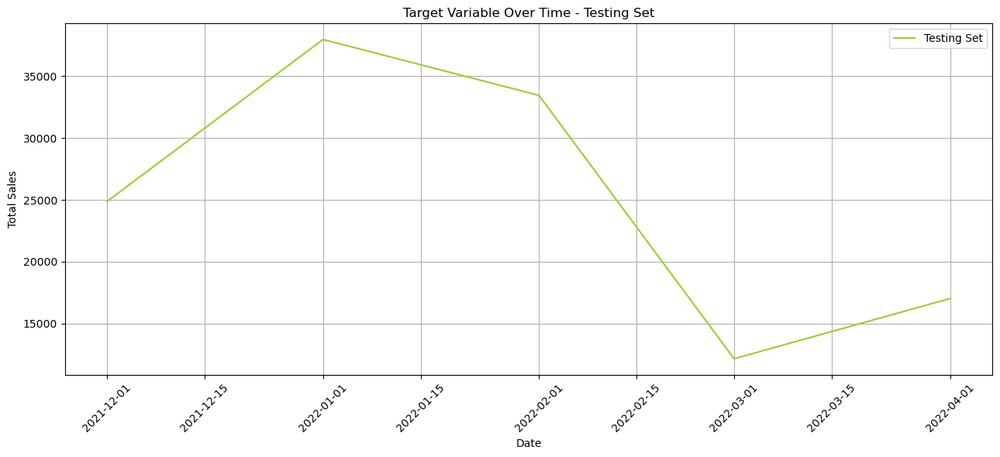

In [361]:
# Plot target variable over time for training set
plt.figure(figsize=(13, 6))
plt.plot(X_train_13.index, y_train_13, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(13, 6))
plt.plot(X_test_13.index, y_test_13, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Feature Selection

('China Production Index ME_lag_2', 0.10773322031852078)
('France Production Index EE_lag_1', 0.06718898108436745)
('Switzerland Production Index EE', 0.049563631647162494)
('Italy Production Index EE_lag_5', 0.049153360295912135)
('France Producer Prices EE_lag_11', 0.047281081619943384)
('Germany Machinery and Equipment NEC', 0.04567202597689782)
('France Shipments Index ME_lag_11', 0.04005528691327933)
('UK Production Index EE_lag_11', 0.03829886483267543)
('Japan Production Index ME_lag_12', 0.0366982876386108)
('France Production Index ME_lag_1', 0.03350782710726932)
('UK Shipments Index ME_lag_1', 0.03230130405928652)
('Switzerland Machinery and Equipment NEC', 0.028582697755279458)
('US Shipments Index ME_lag_11', 0.02782312548069995)
('World Production Index EE_lag_8', 0.02658656413223805)
('UK Production Index ME_lag_1', 0.022540218481701402)
('World: Price of Metals  & Minerals_lag_1', 0.02204389009431948)
('Italy Shipments Index ME_lag_3', 0.020767906974002593)
('Switzerland

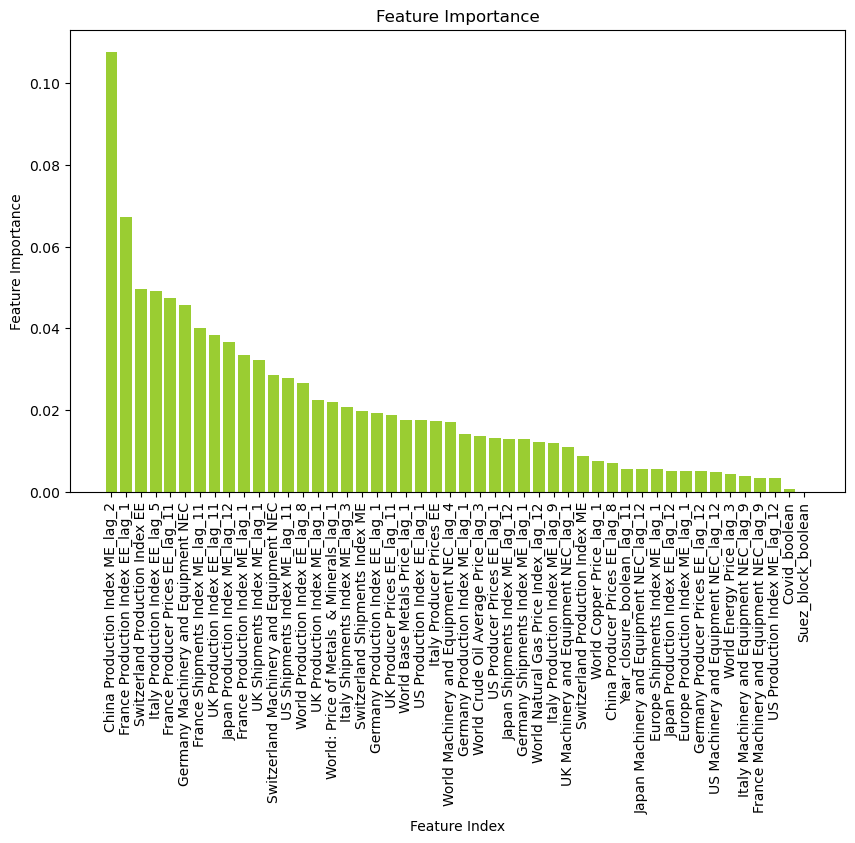

In [362]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_13, y_train_13)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_13, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [363]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_13,y_train_13)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [364]:
selected_feat_13= X.columns[(sel.get_support())]
selected_feat_13 = selected_feat_13.to_list()
len(selected_feat_13)

16

In [365]:
selected_feat_13

['China Production Index ME_lag_2',
 'France Production Index ME_lag_1',
 'France Shipments Index ME_lag_11',
 'Japan Production Index ME_lag_12',
 'UK Production Index ME_lag_1',
 'UK Shipments Index ME_lag_1',
 'US Shipments Index ME_lag_11',
 'World: Price of Metals  & Minerals_lag_1',
 'France Producer Prices EE_lag_11',
 'Switzerland Machinery and Equipment NEC',
 'Germany Machinery and Equipment NEC',
 'World Production Index EE_lag_8',
 'Switzerland Production Index EE',
 'UK Production Index EE_lag_11',
 'Italy Production Index EE_lag_5',
 'France Production Index EE_lag_1']

In [366]:
correlation_matrix = X_train_13[selected_feat_13].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: France Production Index ME_lag_1, France Production Index EE_lag_1
Correlation: 0.9707054055113006
Pair: UK Production Index ME_lag_1, UK Shipments Index ME_lag_1
Correlation: 0.9928045948739991


In [367]:
# comparing the pairs of features with correlation >0.95 and keeping the feature with the most importance
selected_feat_13.remove("France Production Index EE_lag_1")
selected_feat_13.remove("UK Shipments Index ME_lag_1")

In [368]:
selected_feat_13

['China Production Index ME_lag_2',
 'France Production Index ME_lag_1',
 'France Shipments Index ME_lag_11',
 'Japan Production Index ME_lag_12',
 'UK Production Index ME_lag_1',
 'US Shipments Index ME_lag_11',
 'World: Price of Metals  & Minerals_lag_1',
 'France Producer Prices EE_lag_11',
 'Switzerland Machinery and Equipment NEC',
 'Germany Machinery and Equipment NEC',
 'World Production Index EE_lag_8',
 'Switzerland Production Index EE',
 'UK Production Index EE_lag_11',
 'Italy Production Index EE_lag_5']

In [369]:
df_13_selected = lagged_data_13 [selected_feat_13 + ["GCK_13"]]

In [370]:
# Open the file in binary write mode
with open('df_13_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_13_selected, f)

print(f"Dataset stored in {'df_13_selected.pickle'}")

Dataset stored in df_13_selected.pickle


## Product Group 14

In [371]:
# Create a new dataframe displaying only the sales for GCK 14
df_14 = extract_product_sales(monthly_sales, 'GCK_14')
df_14.head(10)


,Date,GCK_14
0,2018-10-01,5770.00
1,2018-11-01,17130.00
2,2018-12-01,0.00
3,2019-01-01,1686.40
4,2019-02-01,19196.30
5,2019-03-01,7535.25
6,2019-04-01,0.00
7,2019-05-01,17820.00
8,2019-06-01,63017.71
9,2019-07-01,20719.30


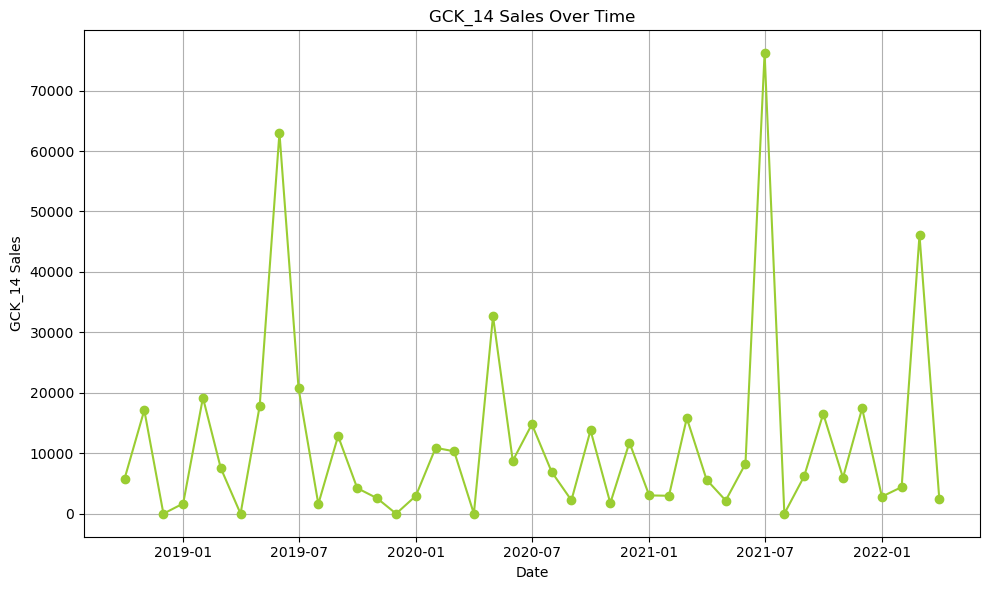

In [372]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_14['Date'], df_14['GCK_14'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_14 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_14 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()


We can denote a sales peak for product GCK_14: june 2019, july 2021 and februery 2022. However, we can also see a smaller peak also in may 2020.

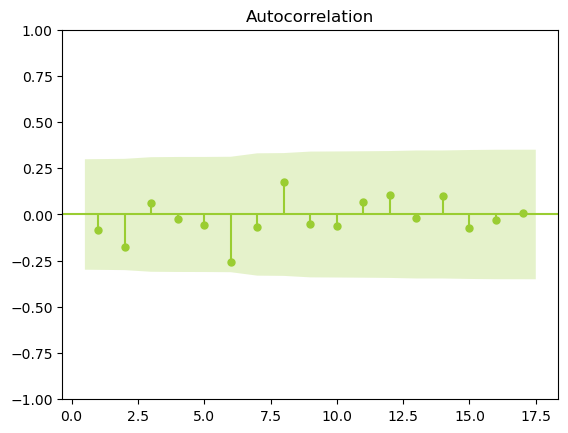

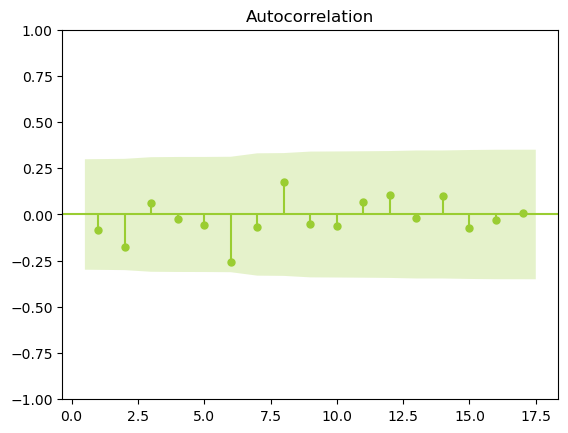

In [373]:
sm.graphics.tsa.plot_acf(df_14['GCK_14'],zero=False)

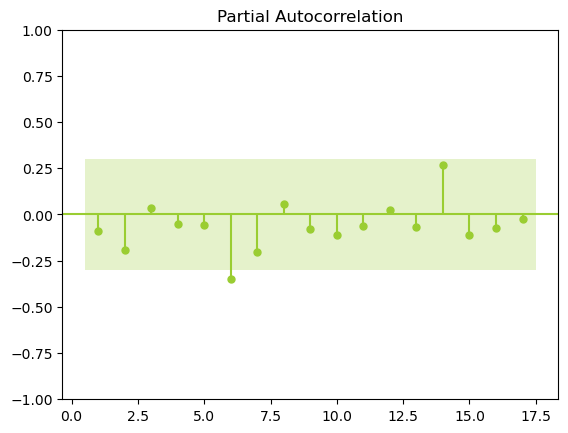

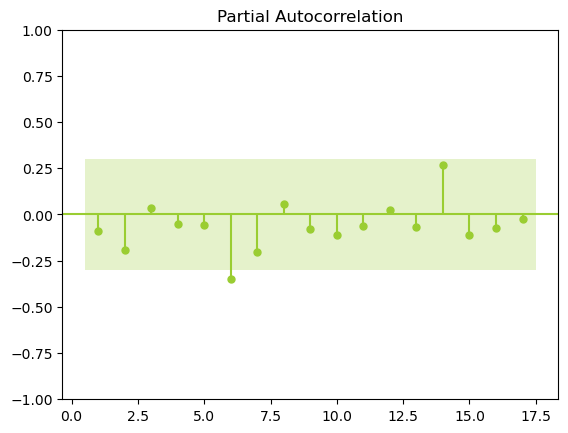

In [374]:
sm.graphics.tsa.plot_pacf(df_14['GCK_14'],zero=False)

In [375]:
# ADF test
result = adfuller(df_14['GCK_14'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -6.883472749470761
p-value: 1.4139251415308592e-09
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


Product Group 14 is stationary meaning it is not time dependent. it means that its behavior does not exhibit trends, seasonality, or other systematic patterns that would make forecasting difficult.

In [376]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_14_lag{i}"] = create_lagged_data(merged_data, i)

In [377]:
lagged_data_14 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_14.drop(columns="Total Sales")
lagged_data_14 = lagged_data_14.join(df_14.set_index('Date')[['GCK_14']], how='left')
lagged_data_14.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_14
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5770.00
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17130.00
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1686.40
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19196.30
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7535.25
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.00
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,17820.00
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,63017.71


In [378]:
lagged_data_14.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_14'],
      dtype='object', length=628)

In [379]:
correlations = {}

# Iterate over columns to find lagged variables
lagged_variables = set()
for column in lagged_data_14.columns:
    if 'lag' in column.lower():
        variable_name = column.split("_")[0]  # Extract variable name from column name
        lagged_variables.add(variable_name)

# Iterate over lagged variables to find lag with highest correlation
for variable_name in lagged_variables:
    max_corr_value = -1  # Initialize max correlation value
    max_corr_lag = None  # Initialize lag with max correlation
    for lag_column in lagged_data_14.columns:
        if 'lag' in lag_column.lower() and variable_name in lag_column:
            # Calculate correlation for each lag column of the variable
            corr = lagged_data_14["Total Sales"].corr(lagged_data_14[lag_column])
            if corr > max_corr_value:
                max_corr_value = corr
                max_corr_lag = lag_column
    correlations[variable_name] = {"lag": max_corr_lag, "correlation": max_corr_value}

# Print results
for variable_name, data in correlations.items():
    print(data['lag'])

Italy Production Index ME_lag_5
World: Price of Metals  & Minerals_lag_8
World Machinery and Equipment NEC_lag_6
Europe Shipments Index ME_lag_9
Italy Production Index EE_lag_5
World Crude Oil Average Price_lag_8
Japan Production Index ME_lag_6
Japan Machinery and Equipment NEC_lag_6
World Copper Price_lag_8
Germany Machinery and Equipment NEC_lag_9
China Production Index ME_lag_11
Covid_boolean_lag_12
Germany Producer Prices EE_lag_1
UK Machinery and Equipment NEC_lag_6
Italy Shipments Index ME_lag_9
Italy Machinery and Equipment NEC_lag_5
China Producer Prices EE_lag_8
France Shipments Index ME_lag_9
Japan Shipments Index ME_lag_6
US Machinery and Equipment NEC_lag_6
Year_closure_boolean_lag_2
Switzerland Production Index EE_lag_7
Germany Production Index ME_lag_9
Japan Production Index EE_lag_6
France Production Index ME_lag_9
Switzerland Shipments Index ME_lag_7
World Base Metals Price_lag_8
UK Production Index ME_lag_6
World Production Index EE_lag_11
US Producer Prices EE_lag_8
I

In [380]:
lagged_data_14.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_14
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5770.0
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17130.0
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1686.4
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19196.3


In [381]:
correlation = lagged_data_14.corr()["GCK_14"]
print(correlation)

Month                        -0.028065
Year                          0.068841
China Production Index ME     0.218293
France Production Index ME    0.215075
France Shipments Index ME     0.106079
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_14                        1.000000
Name: GCK_14, Length: 628, dtype: float64


In [382]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_12', 'France Production Index ME_lag_11', 'France Shipments Index ME_lag_11', 'Germany Production Index ME_lag_11', 'Germany Shipments Index ME_lag_11', 'Italy Production Index ME_lag_11', 'Italy Shipments Index ME_lag_11', 'Japan Production Index ME_lag_4', 'Japan Shipments Index ME_lag_4', 'Switzerland Production Index ME_lag_12', 'Switzerland Shipments Index ME_lag_12', 'UK Production Index ME_lag_4', 'UK Shipments Index ME_lag_8', 'US Production Index ME_lag_4', 'US Shipments Index ME_lag_9', 'Europe Production Index ME_lag_11', 'Europe Shipments Index ME_lag_11', 'World Base Metals Price_lag_10', 'World Energy Price_lag_5', 'World: Price of Metals  & Minerals_lag_10', 'World Natural Gas Price Index_lag_12', 'World Crude Oil Average Price_lag_4', 'World Copper Price_lag_10', 'US Producer Prices EE_lag_11', 'UK Producer Prices EE_lag_9', 'Italy Producer Prices EE_lag_11', 'France Producer Prices EE_lag_2', 'Germany Pr

In [383]:
highest_corr_columns

['China Production Index ME_lag_12',
 'France Production Index ME_lag_11',
 'France Shipments Index ME_lag_11',
 'Germany Production Index ME_lag_11',
 'Germany Shipments Index ME_lag_11',
 'Italy Production Index ME_lag_11',
 'Italy Shipments Index ME_lag_11',
 'Japan Production Index ME_lag_4',
 'Japan Shipments Index ME_lag_4',
 'Switzerland Production Index ME_lag_12',
 'Switzerland Shipments Index ME_lag_12',
 'UK Production Index ME_lag_4',
 'UK Shipments Index ME_lag_8',
 'US Production Index ME_lag_4',
 'US Shipments Index ME_lag_9',
 'Europe Production Index ME_lag_11',
 'Europe Shipments Index ME_lag_11',
 'World Base Metals Price_lag_10',
 'World Energy Price_lag_5',
 'World: Price of Metals  & Minerals_lag_10',
 'World Natural Gas Price Index_lag_12',
 'World Crude Oil Average Price_lag_4',
 'World Copper Price_lag_10',
 'US Producer Prices EE_lag_11',
 'UK Producer Prices EE_lag_9',
 'Italy Producer Prices EE_lag_11',
 'France Producer Prices EE_lag_2',
 'Germany Producer 

In [384]:
# keep only the best lags for each feature
best_lags_14= lagged_data_14[ highest_corr_columns + ["GCK_14"]]
best_lags_14.head()

,China Production Index ME_lag_12,France Production Index ME_lag_11,France Shipments Index ME_lag_11,Germany Production Index ME_lag_11,Germany Shipments Index ME_lag_11,Italy Production Index ME_lag_11,Italy Shipments Index ME_lag_11,Japan Production Index ME_lag_4,Japan Shipments Index ME_lag_4,Switzerland Production Index ME_lag_12,...,Switzerland Production Index EE_lag_7,UK Production Index EE_lag_4,Italy Production Index EE_lag_11,Japan Production Index EE_lag_3,France Production Index EE_lag_11,Germany Production Index EE_lag_4,Year_closure_boolean_lag_11,Covid_boolean_lag_12,Suez_block_boolean,GCK_14
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,5770.0
2018-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,17130.0
2018-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,112.376774,NaN,NaN,NaN,NaN,0,1686.4
2019-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125.209957,124.79325,NaN,...,NaN,118.670791,NaN,111.907535,NaN,118.298233,NaN,NaN,0,19196.3


In [385]:
len(highest_corr_columns)

48

### Deal With Outliers

In [386]:
# Cap values in column Total Sales for month 1
best_lags_14.loc[best_lags_14.index.month == 1, 'GCK_14'] = best_lags_14.loc[best_lags_14.index.month == 1, 'GCK_14'].clip(lower=2000)

# Cap values in column Total Sales for month 3
best_lags_14.loc[best_lags_14.index.month == 3, 'GCK_14'] = best_lags_14.loc[best_lags_14.index.month == 3, 'GCK_14'].clip(upper=22000)

### Train/ Test Split

This allows you to evaluate your model's performance on multiple test sets across different time periods

In [387]:
X = best_lags_14.drop(columns=['GCK_14'])
y = best_lags_14['GCK_14']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_14, X_test_14, y_train_14, y_test_14 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_14, y_train_14)
    
    # Make predictions
    y_pred = model.predict(X_test_14)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_14, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.85
Best Test Size: 0.15000000000000002
Best RMSE: 7051.657684632178


In [388]:
train_size = len(X_train_14) - len(X_test_14)
print("Size of the sales train set:", train_size)

test_size = len(X_test_14)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


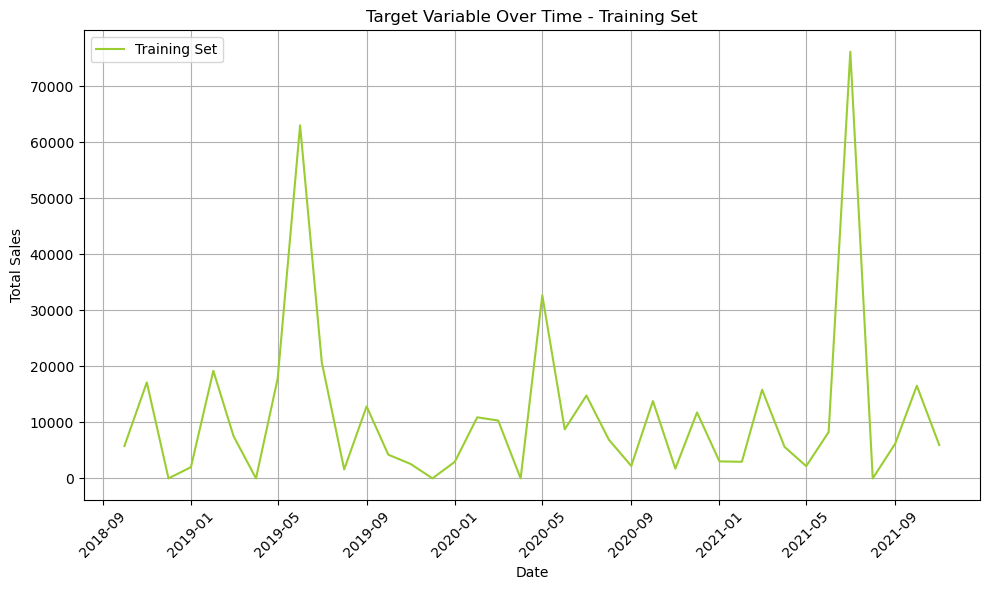

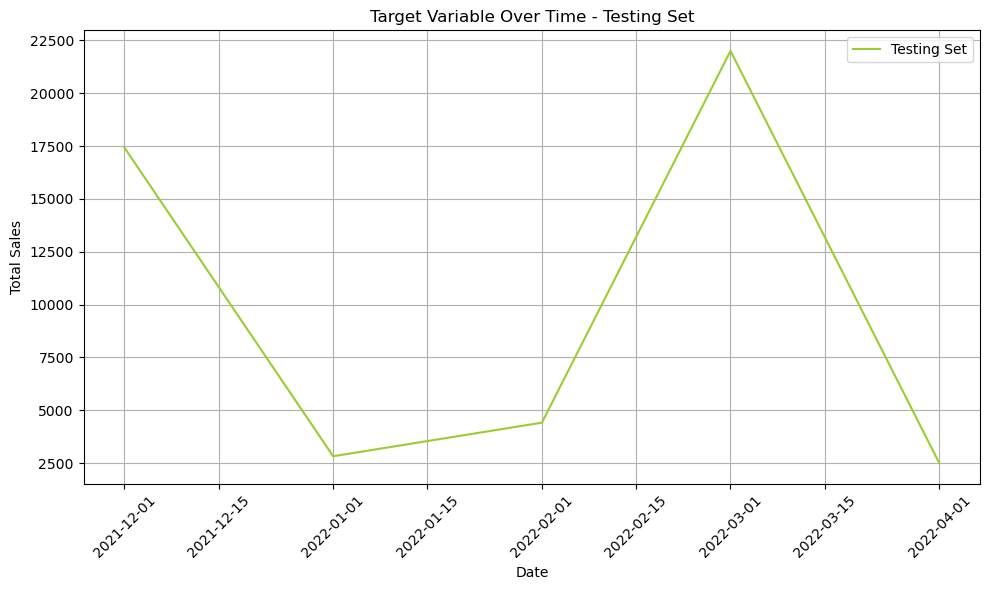

In [389]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_14.index, y_train_14, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_14.index, y_test_14, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Feature Selection

('Switzerland Production Index EE_lag_7', 0.14349887664443453)
('Japan Production Index EE_lag_3', 0.12132856467328351)
('UK Shipments Index ME_lag_8', 0.07316686353463574)
('Germany Production Index EE_lag_4', 0.05887613803825447)
('Japan Production Index ME_lag_4', 0.05617037027434635)
('UK Production Index EE_lag_4', 0.04982927115749785)
('UK Production Index ME_lag_4', 0.047268017951932334)
('Japan Shipments Index ME_lag_4', 0.03858886436058735)
('France Shipments Index ME_lag_11', 0.03677153731649919)
('Japan Machinery and Equipment NEC_lag_4', 0.032138296889152776)
('World Machinery and Equipment NEC_lag_3', 0.031071314005079505)
('France Producer Prices EE_lag_2', 0.018876002324041154)
('UK Machinery and Equipment NEC_lag_4', 0.018382809707397866)
('US Shipments Index ME_lag_9', 0.015635372359758728)
('Europe Production Index ME_lag_11', 0.014446127409179934)
('Switzerland Production Index ME_lag_12', 0.013678364695818708)
('US Production Index ME_lag_4', 0.012789325797339766)
(

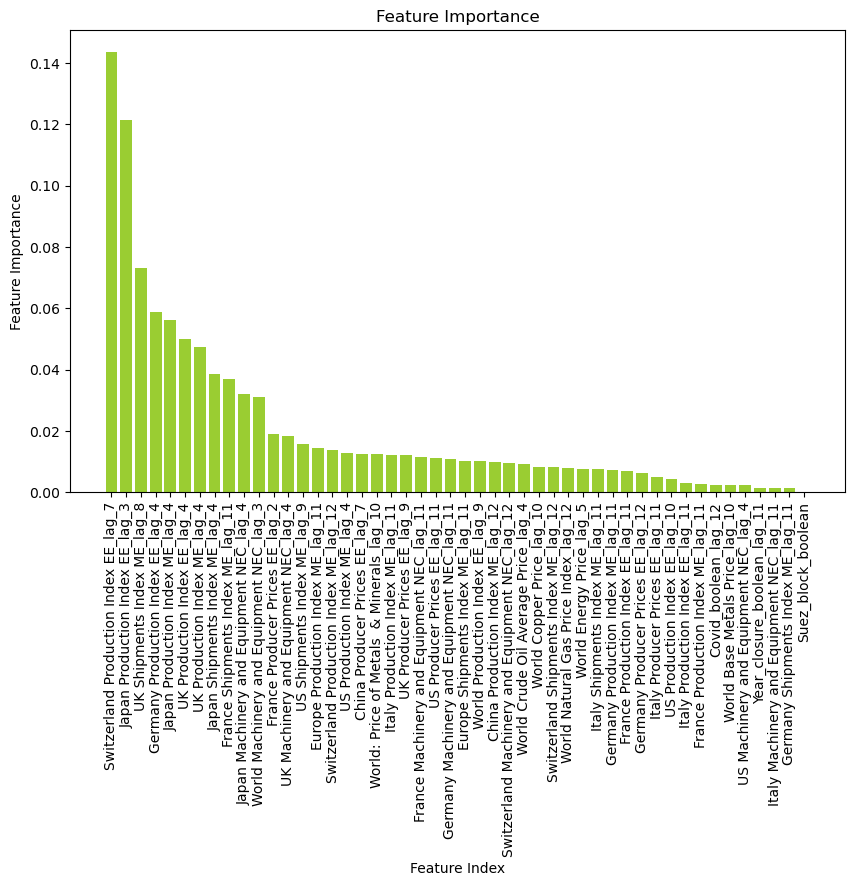

In [390]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_14, y_train_14)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_14, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [391]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_14,y_train_14)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [392]:
selected_feat_14= X_train_14.columns[(sel.get_support())]
selected_feat_14 = selected_feat_14.to_list()
len(selected_feat_14)

11

In [393]:
selected_feat_14

['France Shipments Index ME_lag_11',
 'Japan Production Index ME_lag_4',
 'Japan Shipments Index ME_lag_4',
 'UK Production Index ME_lag_4',
 'UK Shipments Index ME_lag_8',
 'World Machinery and Equipment NEC_lag_3',
 'Japan Machinery and Equipment NEC_lag_4',
 'Switzerland Production Index EE_lag_7',
 'UK Production Index EE_lag_4',
 'Japan Production Index EE_lag_3',
 'Germany Production Index EE_lag_4']

In [394]:
correlation_matrix = X_train_14[selected_feat_14].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Japan Production Index ME_lag_4, Japan Shipments Index ME_lag_4
Correlation: 0.9937516489461246
Pair: Japan Production Index ME_lag_4, Japan Machinery and Equipment NEC_lag_4
Correlation: 0.9963204224369508
Pair: Japan Shipments Index ME_lag_4, Japan Machinery and Equipment NEC_lag_4
Correlation: 0.9883248692275078


In [395]:
# comparing the pairs of features with correlation >0.95 and keeping the feature with the most importance
selected_feat_14.remove("Japan Shipments Index ME_lag_4")
selected_feat_14.remove("Japan Machinery and Equipment NEC_lag_4")

In [396]:
selected_feat_14

['France Shipments Index ME_lag_11',
 'Japan Production Index ME_lag_4',
 'UK Production Index ME_lag_4',
 'UK Shipments Index ME_lag_8',
 'World Machinery and Equipment NEC_lag_3',
 'Switzerland Production Index EE_lag_7',
 'UK Production Index EE_lag_4',
 'Japan Production Index EE_lag_3',
 'Germany Production Index EE_lag_4']

In [397]:
df_14_selected = lagged_data_14 [selected_feat_14 + ["GCK_14"]]

In [398]:
# Open the file in binary write mode
with open('df_14_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_14_selected, f)

print(f"Dataset stored in {'df_14_selected.pickle'}")

Dataset stored in df_14_selected.pickle


## Product Group 16

In [399]:
# Create a new dataframe displaying only the sales for GCK 16 
df_16 = extract_product_sales(monthly_sales, 'GCK_16')
df_16.head(10)


,Date,GCK_16
0,2018-10-01,333196.87
1,2018-11-01,1377694.32
2,2018-12-01,4762524.66
3,2019-01-01,942957.19
4,2019-02-01,257765.04
5,2019-03-01,2258352.22
6,2019-04-01,225864.00
7,2019-05-01,353451.54
8,2019-06-01,371512.38
9,2019-07-01,266225.86


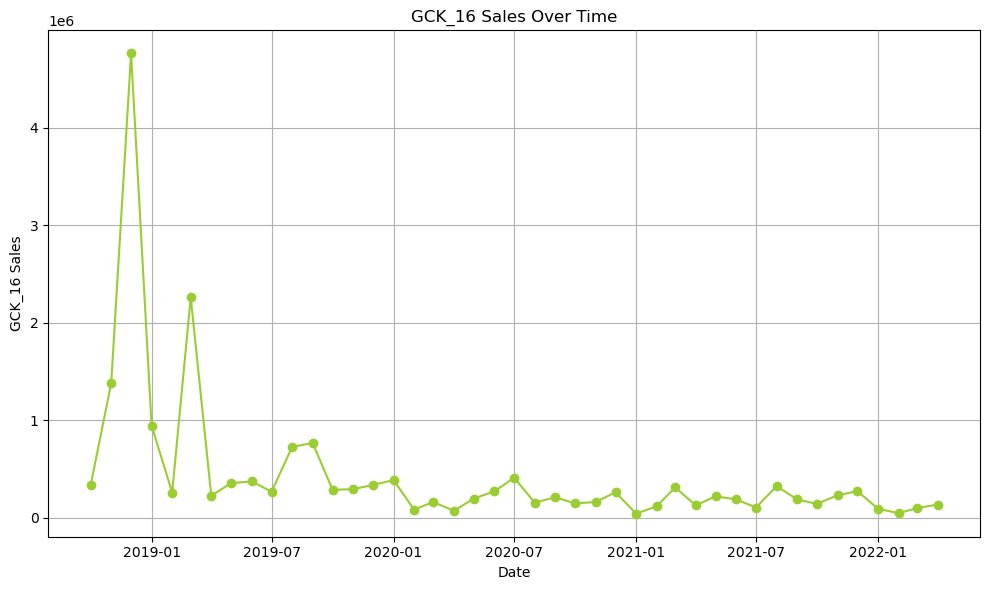

In [400]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_16['Date'], df_16['GCK_16'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_16 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_16 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()


We can denote that product GCL_16 one main sales peak in December 2018 and a smaller sales peak in March 2019. 

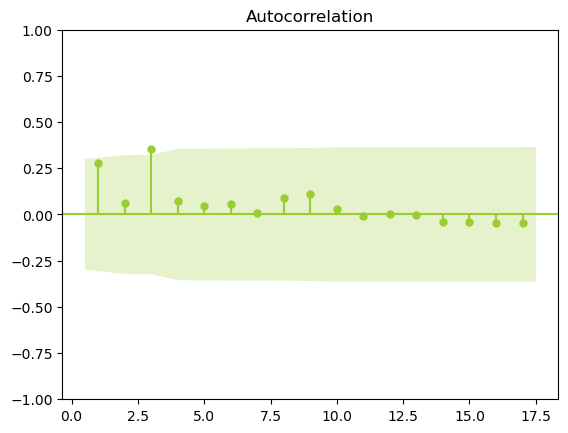

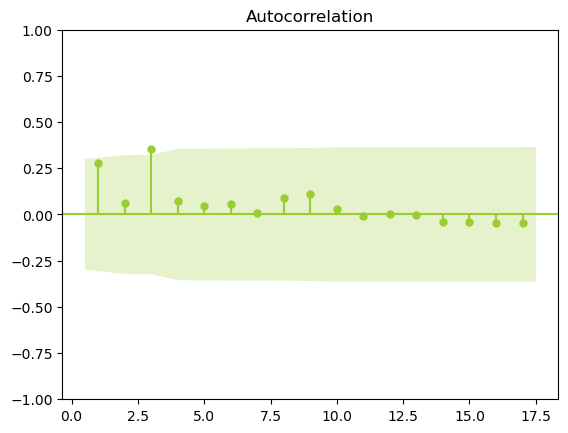

In [401]:
sm.graphics.tsa.plot_acf(df_16['GCK_16'],zero=False)

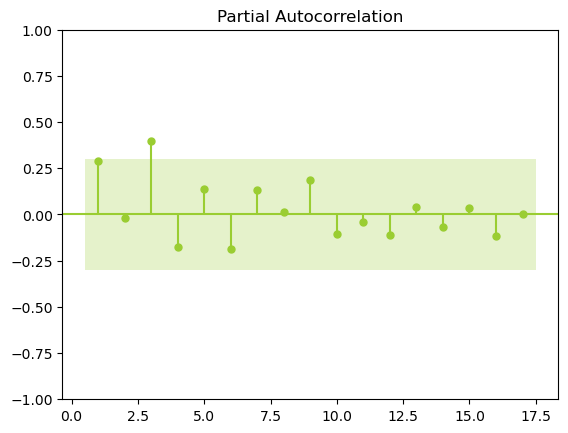

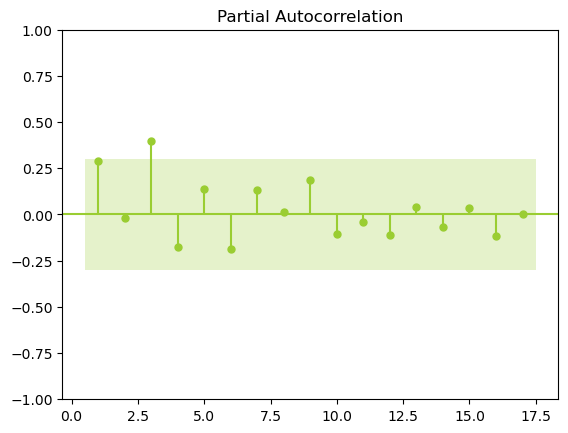

In [402]:
sm.graphics.tsa.plot_pacf(df_16['GCK_16'],zero=False)

In [403]:
# ADF test
result = adfuller(df_16['GCK_16'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')


ADF test statistic: -5.3888404644653765
p-value: 3.5748870654107697e-06
Critical values: {'1%': -3.6461350877925254, '5%': -2.954126991123355, '10%': -2.6159676124885216}
The time series is stationary


Product Group 16 is stationary meaning it is not time dependent. it means that its behavior does not exhibit trends, seasonality, or other systematic patterns that would make forecasting difficult.


In [404]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_16_lag{i}"] = create_lagged_data(merged_data, i)

In [405]:
lagged_data_16 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_16.drop(columns="Total Sales")
lagged_data_16 = lagged_data_16.join(df_16.set_index('Date')[['GCK_16']], how='left')
lagged_data_16.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_16
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,333196.87
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1377694.32
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4762524.66
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,942957.19
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,257765.04
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2258352.22
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,225864.00
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,353451.54
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,371512.38


In [406]:
lagged_data_16.columns

Index(['Month', 'Year', 'China Production Index ME',
       'France Production Index ME', 'France Shipments Index ME',
       'Germany Production Index ME', 'Germany Shipments Index ME',
       'Italy Production Index ME', 'Italy Shipments Index ME',
       'Japan Production Index ME',
       ...
       'Suez_block_boolean_lag_4', 'Suez_block_boolean_lag_5',
       'Suez_block_boolean_lag_6', 'Suez_block_boolean_lag_7',
       'Suez_block_boolean_lag_8', 'Suez_block_boolean_lag_9',
       'Suez_block_boolean_lag_10', 'Suez_block_boolean_lag_11',
       'Suez_block_boolean_lag_12', 'GCK_16'],
      dtype='object', length=628)

In [407]:
correlations = {}

# Iterate over columns to find lagged variables
lagged_variables = set()
for column in lagged_data_16.columns:
    if 'lag' in column.lower():
        variable_name = column.split("_")[0]  # Extract variable name from column name
        lagged_variables.add(variable_name)

# Iterate over lagged variables to find lag with highest correlation
for variable_name in lagged_variables:
    max_corr_value = -1  # Initialize max correlation value
    max_corr_lag = None  # Initialize lag with max correlation
    for lag_column in lagged_data_16.columns:
        if 'lag' in lag_column.lower() and variable_name in lag_column:
            # Calculate correlation for each lag column of the variable
            corr = lagged_data_16["Total Sales"].corr(lagged_data_16[lag_column])
            if corr > max_corr_value:
                max_corr_value = corr
                max_corr_lag = lag_column
    correlations[variable_name] = {"lag": max_corr_lag, "correlation": max_corr_value}

# Print results
for variable_name, data in correlations.items():
    print(data['lag'])

Italy Production Index ME_lag_5
World: Price of Metals  & Minerals_lag_8
World Machinery and Equipment NEC_lag_6
Europe Shipments Index ME_lag_9
Italy Production Index EE_lag_5
World Crude Oil Average Price_lag_8
Japan Production Index ME_lag_6
Japan Machinery and Equipment NEC_lag_6
World Copper Price_lag_8
Germany Machinery and Equipment NEC_lag_9
China Production Index ME_lag_11
Covid_boolean_lag_12
Germany Producer Prices EE_lag_1
UK Machinery and Equipment NEC_lag_6
Italy Shipments Index ME_lag_9
Italy Machinery and Equipment NEC_lag_5
China Producer Prices EE_lag_8
France Shipments Index ME_lag_9
Japan Shipments Index ME_lag_6
US Machinery and Equipment NEC_lag_6
Year_closure_boolean_lag_2
Switzerland Production Index EE_lag_7
Germany Production Index ME_lag_9
Japan Production Index EE_lag_6
France Production Index ME_lag_9
Switzerland Shipments Index ME_lag_7
World Base Metals Price_lag_8
UK Production Index ME_lag_6
World Production Index EE_lag_11
US Producer Prices EE_lag_8
I

In [408]:
lagged_data_16.head()

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_16
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,333196.87
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1377694.32
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4762524.66
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,942957.19
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,257765.04


In [409]:
correlation = lagged_data_16.corr()["GCK_16"]
print(correlation)

Month                         0.220752
Year                         -0.491114
China Production Index ME    -0.077779
France Production Index ME    0.137801
France Shipments Index ME     0.122281
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_16                        1.000000
Name: GCK_16, Length: 628, dtype: float64


In [410]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

Columns with highest correlation: ['China Production Index ME_lag_7', 'France Production Index ME_lag_6', 'France Shipments Index ME_lag_6', 'Germany Production Index ME_lag_9', 'Germany Shipments Index ME_lag_9', 'Italy Production Index ME_lag_6', 'Italy Shipments Index ME_lag_9', 'Japan Production Index ME_lag_6', 'Japan Shipments Index ME_lag_6', 'Switzerland Production Index ME_lag_9', 'Switzerland Shipments Index ME_lag_9', 'UK Production Index ME_lag_9', 'UK Shipments Index ME_lag_6', 'US Production Index ME_lag_5', 'US Shipments Index ME_lag_7', 'Europe Production Index ME_lag_9', 'Europe Shipments Index ME_lag_9', 'World Base Metals Price_lag_12', 'World Energy Price_lag_10', 'World: Price of Metals  & Minerals_lag_8', 'World Natural Gas Price Index_lag_10', 'World Crude Oil Average Price_lag_5', 'World Copper Price_lag_12', 'US Producer Prices EE_lag_6', 'UK Producer Prices EE_lag_6', 'Italy Producer Prices EE_lag_12', 'France Producer Prices EE_lag_11', 'Germany Producer Pric

In [411]:
highest_corr_columns

['China Production Index ME_lag_7',
 'France Production Index ME_lag_6',
 'France Shipments Index ME_lag_6',
 'Germany Production Index ME_lag_9',
 'Germany Shipments Index ME_lag_9',
 'Italy Production Index ME_lag_6',
 'Italy Shipments Index ME_lag_9',
 'Japan Production Index ME_lag_6',
 'Japan Shipments Index ME_lag_6',
 'Switzerland Production Index ME_lag_9',
 'Switzerland Shipments Index ME_lag_9',
 'UK Production Index ME_lag_9',
 'UK Shipments Index ME_lag_6',
 'US Production Index ME_lag_5',
 'US Shipments Index ME_lag_7',
 'Europe Production Index ME_lag_9',
 'Europe Shipments Index ME_lag_9',
 'World Base Metals Price_lag_12',
 'World Energy Price_lag_10',
 'World: Price of Metals  & Minerals_lag_8',
 'World Natural Gas Price Index_lag_10',
 'World Crude Oil Average Price_lag_5',
 'World Copper Price_lag_12',
 'US Producer Prices EE_lag_6',
 'UK Producer Prices EE_lag_6',
 'Italy Producer Prices EE_lag_12',
 'France Producer Prices EE_lag_11',
 'Germany Producer Prices EE_l

In [412]:
# keep only the best lags for each feature
best_lags_16= lagged_data_16[ highest_corr_columns + ["GCK_16"]]
best_lags_16.head()

,China Production Index ME_lag_7,France Production Index ME_lag_6,France Shipments Index ME_lag_6,Germany Production Index ME_lag_9,Germany Shipments Index ME_lag_9,Italy Production Index ME_lag_6,Italy Shipments Index ME_lag_9,Japan Production Index ME_lag_6,Japan Shipments Index ME_lag_6,Switzerland Production Index ME_lag_9,...,Switzerland Production Index EE_lag_9,UK Production Index EE_lag_7,Italy Production Index EE_lag_6,Japan Production Index EE_lag_6,France Production Index EE_lag_5,Germany Production Index EE_lag_10,Year_closure_boolean_lag_7,Covid_boolean_lag_7,Suez_block_boolean,GCK_16
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,333196.87
2018-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1377694.32
2018-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,4762524.66
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,942957.19
2019-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,257765.04


In [413]:
len(highest_corr_columns)

48

### Deal With Outliers

In [414]:
# Cap values in column Total Sales for month 3
best_lags_16.loc[best_lags_16.index.month == 3, 'GCK_16'] = best_lags_16.loc[best_lags_16.index.month == 3, 'GCK_16'].clip(upper=0.9*1e6)

# Cap values in column Total Sales for month 4
best_lags_16.loc[best_lags_16.index.month == 4, 'GCK_16'] = best_lags_16.loc[best_lags_16.index.month == 4, 'GCK_16'].clip(upper=0.1*1e6)

# Cap values in column Total Sales for month 11
best_lags_16.loc[best_lags_16.index.month == 11, 'GCK_16'] = best_lags_16.loc[best_lags_16.index.month == 11, 'GCK_16'].clip(upper=0.3*1e6)

# Cap values in column Total Sales for month 12
best_lags_16.loc[best_lags_16.index.month == 12, 'GCK_16'] = best_lags_16.loc[best_lags_16.index.month == 12, 'GCK_16'].clip(upper=1.3*1e6)

### Train/ Test Split

This allows you to evaluate your model's performance on multiple test sets across different time periods

In [415]:
X = best_lags_16.drop(columns=['GCK_16'])
y = best_lags_16['GCK_16']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_16, X_test_16, y_train_16, y_test_16 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_16, y_train_16)
    
    # Make predictions
    y_pred = model.predict(X_test_16)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_16, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 259410.86863813805


In [416]:
train_size = len(X_train_16) - len(X_test_16)
print("Size of the sales train set:", train_size)

test_size = len(X_test_16)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


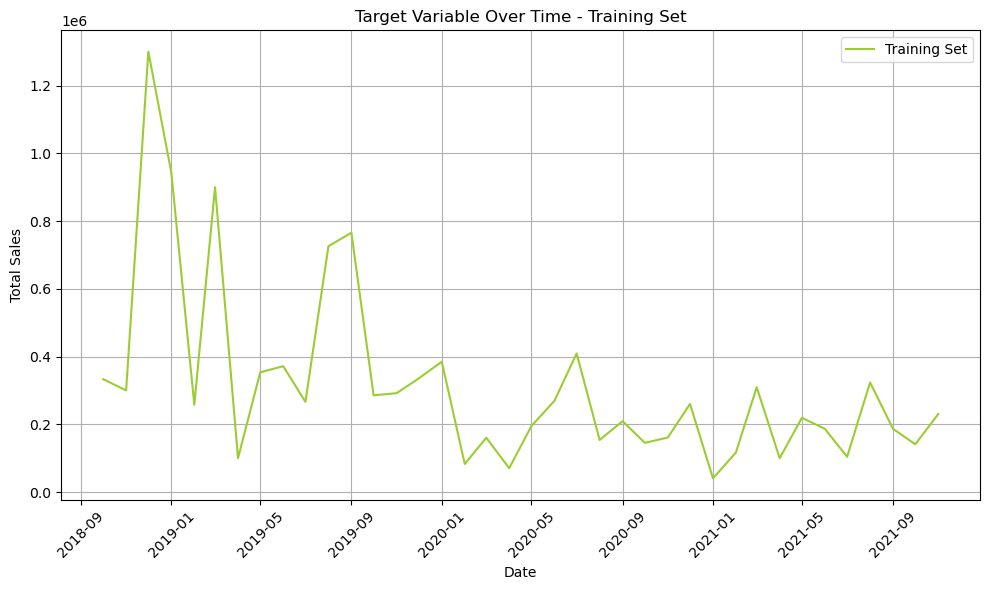

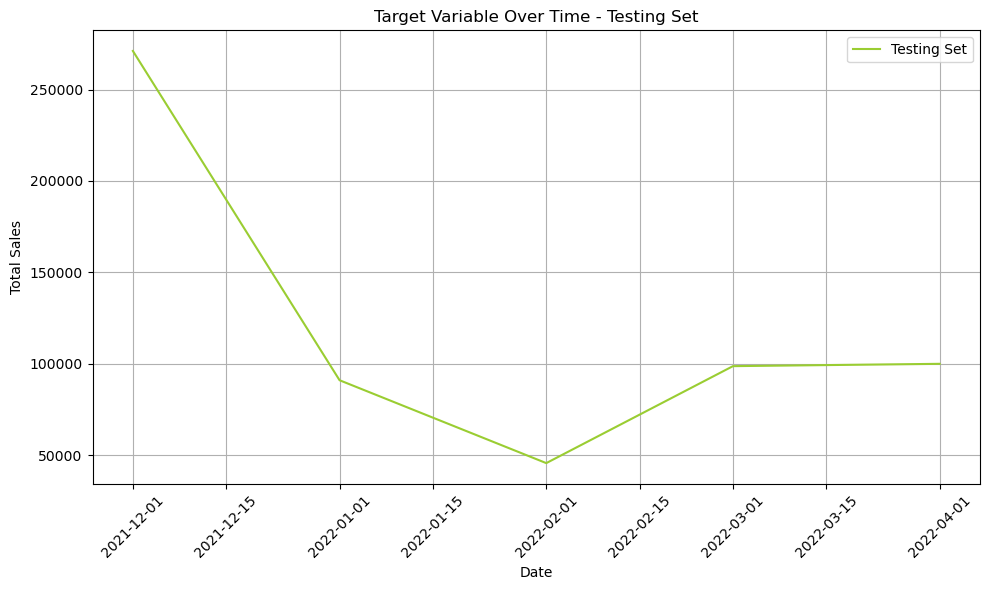

In [417]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_16.index, y_train_16, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_16.index, y_test_16, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Feature Selection

('France Shipments Index ME_lag_6', 0.09171332442161491)
('France Production Index ME_lag_6', 0.0841420507670103)
('China Production Index ME_lag_7', 0.04976198721622902)
('Switzerland Shipments Index ME_lag_9', 0.04268488702764058)
('Germany Shipments Index ME_lag_9', 0.0399691941806394)
('Switzerland Production Index ME_lag_9', 0.03144110029349136)
('Italy Production Index ME_lag_6', 0.029654846439377738)
('Germany Production Index EE_lag_10', 0.02788882484153101)
('Italy Machinery and Equipment NEC_lag_6', 0.026097019799590768)
('World Natural Gas Price Index_lag_10', 0.025882807369988825)
('World Crude Oil Average Price_lag_5', 0.025589332621218316)
('Germany Producer Prices EE_lag_10', 0.025357069190037572)
('France Production Index EE_lag_5', 0.025127944503483924)
('UK Production Index EE_lag_7', 0.02294976075970409)
('US Production Index EE_lag_7', 0.021286744906158114)
('Japan Machinery and Equipment NEC_lag_6', 0.02102417227802413)
('Switzerland Production Index EE_lag_9', 0.0

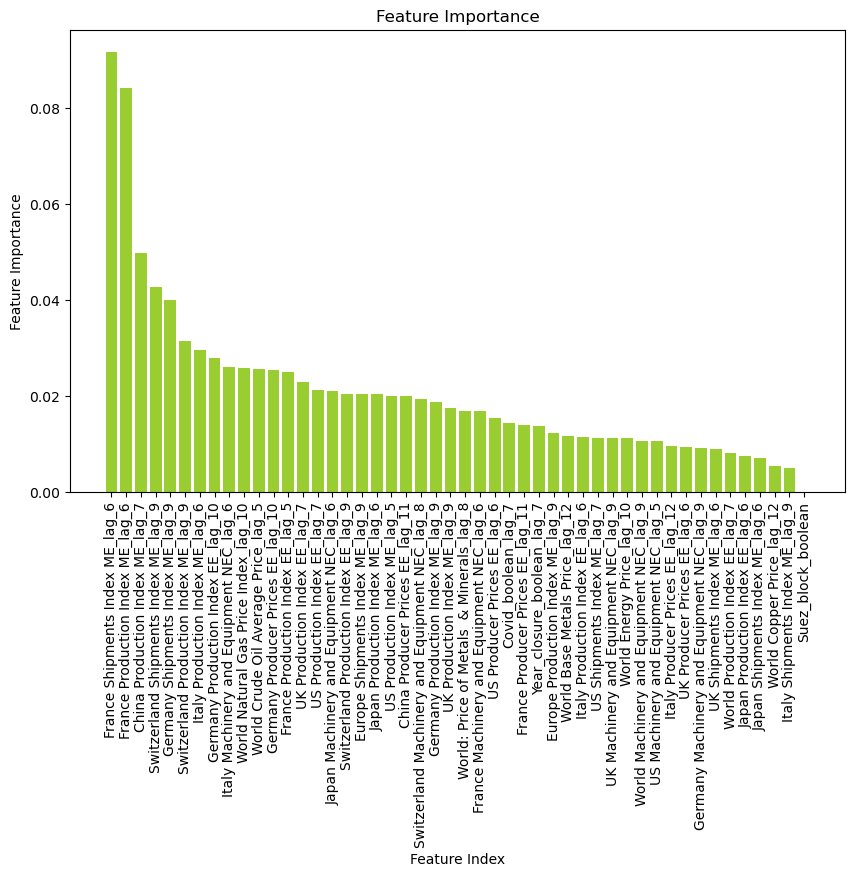

In [418]:
# Train Random Forest model
model = RandomForestRegressor(random_state=62)
model.fit(X_train_16, y_train_16)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_16, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [419]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_16,y_train_16)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [420]:
selected_feat_16= X_train_16.columns[(sel.get_support())]
selected_feat_16 = selected_feat_16.to_list()
len(selected_feat_16)

14

In [421]:
selected_feat_16

['China Production Index ME_lag_7',
 'France Production Index ME_lag_6',
 'France Shipments Index ME_lag_6',
 'Germany Shipments Index ME_lag_9',
 'Italy Production Index ME_lag_6',
 'Japan Production Index ME_lag_6',
 'Switzerland Production Index ME_lag_9',
 'Switzerland Shipments Index ME_lag_9',
 'World Natural Gas Price Index_lag_10',
 'Germany Producer Prices EE_lag_10',
 'Italy Machinery and Equipment NEC_lag_6',
 'US Production Index EE_lag_7',
 'France Production Index EE_lag_5',
 'Covid_boolean_lag_7']

In [422]:
correlation_matrix = X_train_16[selected_feat_16].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")

Pair: Italy Production Index ME_lag_6, Italy Machinery and Equipment NEC_lag_6
Correlation: 0.9961027306134976
Pair: Switzerland Production Index ME_lag_9, Switzerland Shipments Index ME_lag_9
Correlation: 0.9998141551590938


In [423]:
# comparing the pairs of features with correlation >0.95 and keeping the feature with the most importance
selected_feat_16.remove('Italy Machinery and Equipment NEC_lag_6')
selected_feat_16.remove('Switzerland Shipments Index ME_lag_9')

In [424]:
selected_feat_16

['China Production Index ME_lag_7',
 'France Production Index ME_lag_6',
 'France Shipments Index ME_lag_6',
 'Germany Shipments Index ME_lag_9',
 'Italy Production Index ME_lag_6',
 'Japan Production Index ME_lag_6',
 'Switzerland Production Index ME_lag_9',
 'World Natural Gas Price Index_lag_10',
 'Germany Producer Prices EE_lag_10',
 'US Production Index EE_lag_7',
 'France Production Index EE_lag_5',
 'Covid_boolean_lag_7']

In [425]:
df_16_selected = lagged_data_16 [selected_feat_16 + ["GCK_16"]]

In [426]:
# Open the file in binary write mode
with open('df_16_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_16_selected, f)

print(f"Dataset stored in {'df_16_selected.pickle'}")

Dataset stored in df_16_selected.pickle


## Product Group 20

In [427]:
# Create a new dataframe displaying only the sales for GCK 20 
df_20 = extract_product_sales(monthly_sales, 'GCK_20')
df_20.head(10)

,Date,GCK_20
0,2018-10-01,4563.14
1,2018-11-01,5798.14
2,2018-12-01,918.65
3,2019-01-01,2399.18
4,2019-02-01,620.66
5,2019-03-01,3369.55
6,2019-04-01,3635.26
7,2019-05-01,944.00
8,2019-06-01,772.94
9,2019-07-01,577.60


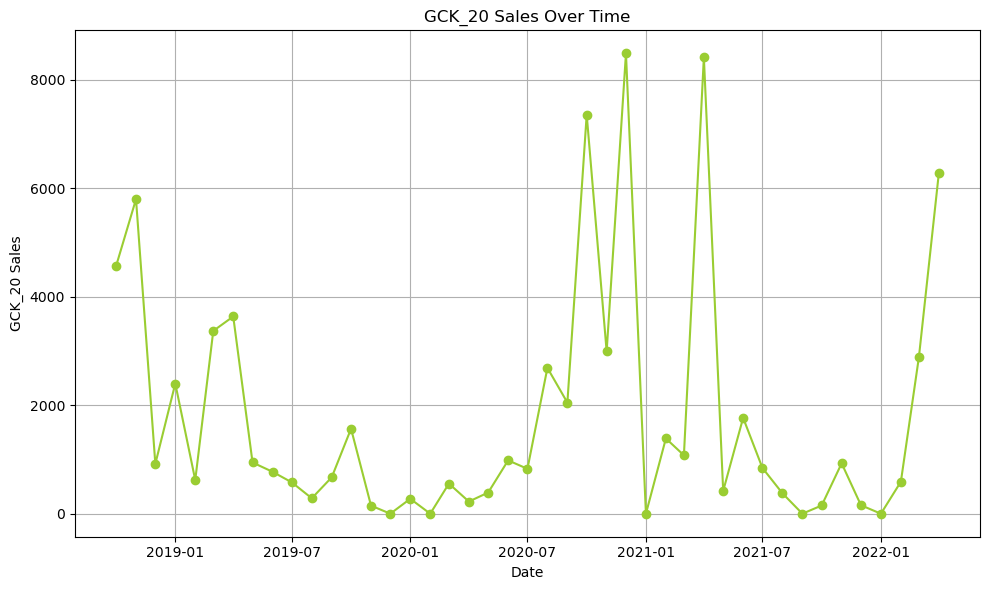

In [428]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_20['Date'], df_20['GCK_20'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_20 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_20 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

We can denote sales peak in november 2018, october and december 2020, as weel as april 2021 and 2022

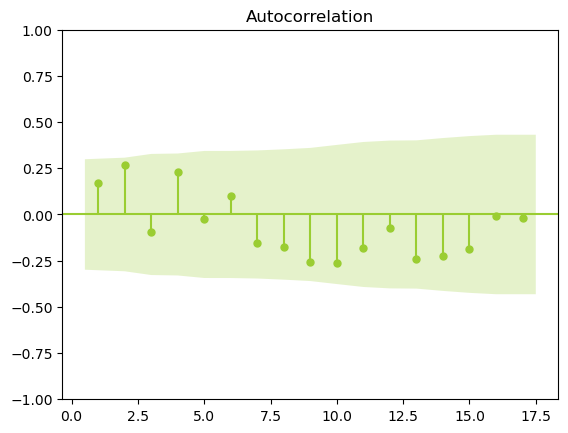

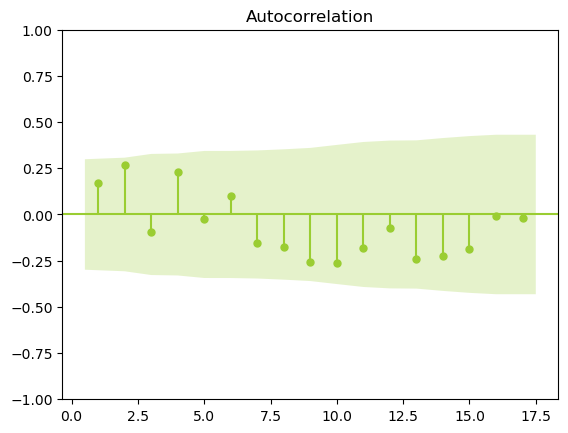

In [429]:
sm.graphics.tsa.plot_acf(df_20['GCK_20'],zero=False)

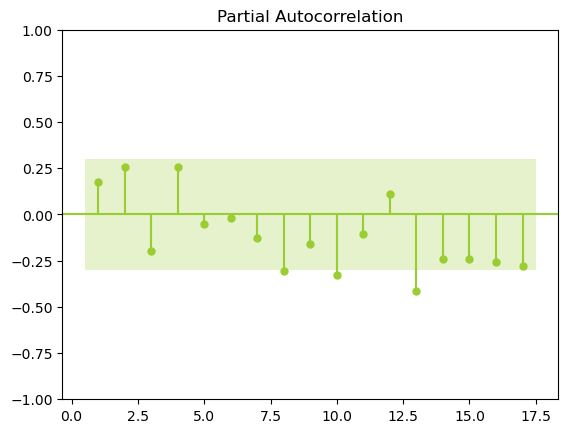

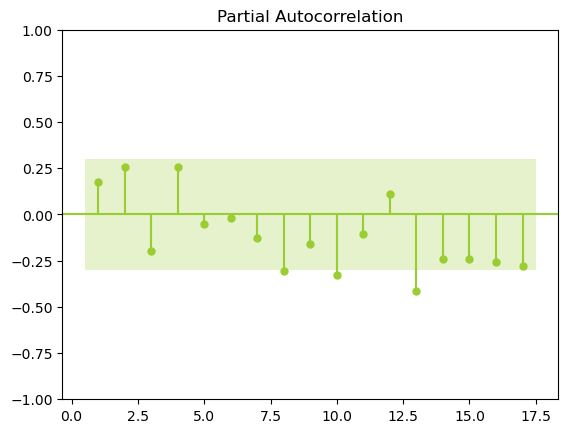

In [430]:
sm.graphics.tsa.plot_pacf(df_20['GCK_20'],zero=False)

In [431]:
# ADF test
result = adfuller(df_20['GCK_20'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -3.12545763838301
p-value: 0.024725679063600545
Critical values: {'1%': -3.60098336718852, '5%': -2.9351348158036012, '10%': -2.6059629803688282}
The time series is stationary


Product Group 20 is stationary meaning it is not time dependent. it means that its behavior does not exhibit trends, seasonality, or other systematic patterns that would make forecasting difficult.

In [432]:
# Create separate DataFrames for each monthly lag
for i in range(1, 13):  # for 12 months
    globals()[f"df_20_lag{i}"] = create_lagged_data(merged_data, i)

In [433]:
lagged_data_20 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_20.drop(columns="Total Sales")
lagged_data_20 = lagged_data_20.join(df_20.set_index('Date')[['GCK_20']], how='left')
lagged_data_20.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_20
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4563.14
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5798.14
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,918.65
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2399.18
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,620.66
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3369.55
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3635.26
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,944.00
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,772.94


In [434]:
lagged_data_20.columns.tolist()

['Month',
 'Year',
 'China Production Index ME',
 'France Production Index ME',
 'France Shipments Index ME',
 'Germany Production Index ME',
 'Germany Shipments Index ME',
 'Italy Production Index ME',
 'Italy Shipments Index ME',
 'Japan Production Index ME',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME',
 'UK Shipments Index ME',
 'US Production Index ME',
 'US Shipments Index ME',
 'Europe Production Index ME',
 'Europe Shipments Index ME',
 'World Base Metals Price',
 'World Energy Price',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price',
 'US Producer Prices EE',
 'UK Producer Prices EE',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE',
 'China Producer Prices EE',
 'US Machinery and Equipment NEC',
 'World Machinery and Equipment NEC',
 'Switzerland Machinery and Equipment NEC',
 '

In [435]:
correlation = lagged_data_20.corr()["GCK_20"]
print(correlation)

Month                         0.162170
Year                         -0.057197
China Production Index ME     0.207323
France Production Index ME    0.232792
France Shipments Index ME     0.266477
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_20                        1.000000
Name: GCK_20, Length: 628, dtype: float64


In [436]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

# Source: ChatGPT

Columns with highest correlation: ['China Production Index ME_lag_4', 'France Production Index ME_lag_8', 'France Shipments Index ME_lag_8', 'Germany Production Index ME_lag_8', 'Germany Shipments Index ME_lag_8', 'Italy Production Index ME_lag_8', 'Italy Shipments Index ME_lag_8', 'Japan Production Index ME_lag_8', 'Japan Shipments Index ME_lag_11', 'Switzerland Production Index ME_lag_6', 'Switzerland Shipments Index ME_lag_6', 'UK Production Index ME_lag_8', 'UK Shipments Index ME_lag_8', 'US Production Index ME_lag_4', 'US Shipments Index ME_lag_5', 'Europe Production Index ME_lag_8', 'Europe Shipments Index ME_lag_8', 'World Base Metals Price_lag_7', 'World Energy Price_lag_7', 'World: Price of Metals  & Minerals_lag_7', 'World Natural Gas Price Index_lag_12', 'World Crude Oil Average Price_lag_7', 'World Copper Price_lag_7', 'US Producer Prices EE_lag_12', 'UK Producer Prices EE_lag_2', 'Italy Producer Prices EE_lag_10', 'France Producer Prices EE_lag_9', 'Germany Producer Prices

In [437]:
highest_corr_columns

['China Production Index ME_lag_4',
 'France Production Index ME_lag_8',
 'France Shipments Index ME_lag_8',
 'Germany Production Index ME_lag_8',
 'Germany Shipments Index ME_lag_8',
 'Italy Production Index ME_lag_8',
 'Italy Shipments Index ME_lag_8',
 'Japan Production Index ME_lag_8',
 'Japan Shipments Index ME_lag_11',
 'Switzerland Production Index ME_lag_6',
 'Switzerland Shipments Index ME_lag_6',
 'UK Production Index ME_lag_8',
 'UK Shipments Index ME_lag_8',
 'US Production Index ME_lag_4',
 'US Shipments Index ME_lag_5',
 'Europe Production Index ME_lag_8',
 'Europe Shipments Index ME_lag_8',
 'World Base Metals Price_lag_7',
 'World Energy Price_lag_7',
 'World: Price of Metals  & Minerals_lag_7',
 'World Natural Gas Price Index_lag_12',
 'World Crude Oil Average Price_lag_7',
 'World Copper Price_lag_7',
 'US Producer Prices EE_lag_12',
 'UK Producer Prices EE_lag_2',
 'Italy Producer Prices EE_lag_10',
 'France Producer Prices EE_lag_9',
 'Germany Producer Prices EE_lag

In [438]:
# keep only the best lags for each feature
best_lags_20= lagged_data_20[ highest_corr_columns + ["GCK_20"]]
best_lags_20.head(10)

,China Production Index ME_lag_4,France Production Index ME_lag_8,France Shipments Index ME_lag_8,Germany Production Index ME_lag_8,Germany Shipments Index ME_lag_8,Italy Production Index ME_lag_8,Italy Shipments Index ME_lag_8,Japan Production Index ME_lag_8,Japan Shipments Index ME_lag_11,Switzerland Production Index ME_lag_6,...,Switzerland Production Index EE_lag_6,UK Production Index EE_lag_1,Italy Production Index EE_lag_8,Japan Production Index EE_lag_8,France Production Index EE_lag_8,Germany Production Index EE_lag_4,Year_closure_boolean,Covid_boolean_lag_7,Suez_block_boolean,GCK_20
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,4563.14
2018-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,118.670791,NaN,NaN,NaN,NaN,0,NaN,0,5798.14
2018-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,120.467019,NaN,NaN,NaN,NaN,0,NaN,0,918.65
2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,105.378705,NaN,NaN,NaN,NaN,0,NaN,0,2399.18
2019-02-01,211.955755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,107.174933,NaN,NaN,NaN,118.298233,0,NaN,0,620.66
2019-03-01,220.519655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,110.647640,NaN,NaN,NaN,117.163727,0,NaN,0,3369.55
2019-04-01,241.846854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.077781,...,112.970843,126.214949,NaN,NaN,NaN,89.626122,0,NaN,0,3635.26
2019-05-01,175.668147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.241491,...,114.736013,113.521605,NaN,NaN,NaN,105.406097,0,0.0,0,944.00
2019-06-01,175.668147,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,NaN,115.405201,...,116.501182,117.593055,93.001511,112.376774,97.849541,103.652771,1,0.0,0,772.94


In [439]:
len(highest_corr_columns)

48

### Deal with outliers

In [440]:
# Cap values in column GCK_20 for month 1
best_lags_20.loc[best_lags_20.index.month == 1, 'GCK_20'] = best_lags_20.loc[best_lags_20.index.month == 1, 'GCK_20'].clip(upper=2000)

# Cap values in column GCK_20 for month 2
best_lags_20.loc[best_lags_20.index.month == 2, 'GCK_20'] = best_lags_20.loc[best_lags_20.index.month == 2, 'GCK_20'].clip(upper=1500)

# Cap values in column GCK_20 for month 12
best_lags_20.loc[best_lags_20.index.month == 12, 'GCK_20'] = best_lags_20.loc[best_lags_20.index.month == 12, 'GCK_20'].clip(upper=8000)

### Train/ Test Split

This allows you to evaluate your model's performance on multiple test sets across different time periods

In [441]:
X = best_lags_20.drop(columns=['GCK_20'])
y = best_lags_20['GCK_20']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_20, X_test_20, y_train_20, y_test_20 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_20, y_train_20)
    
    # Make predictions
    y_pred = model.predict(X_test_20)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_20, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.8
Best Test Size: 0.19999999999999996
Best RMSE: 1327.3857849629546


In [442]:
train_size = len(X_train_20) - len(X_test_20)
print("Size of the sales train set:", train_size)

test_size = len(X_test_20)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


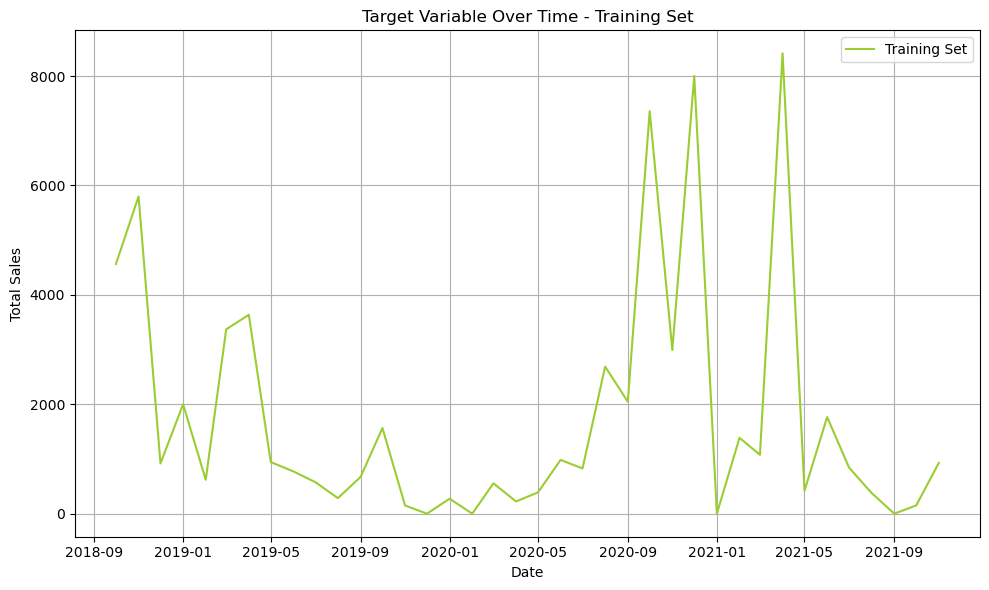

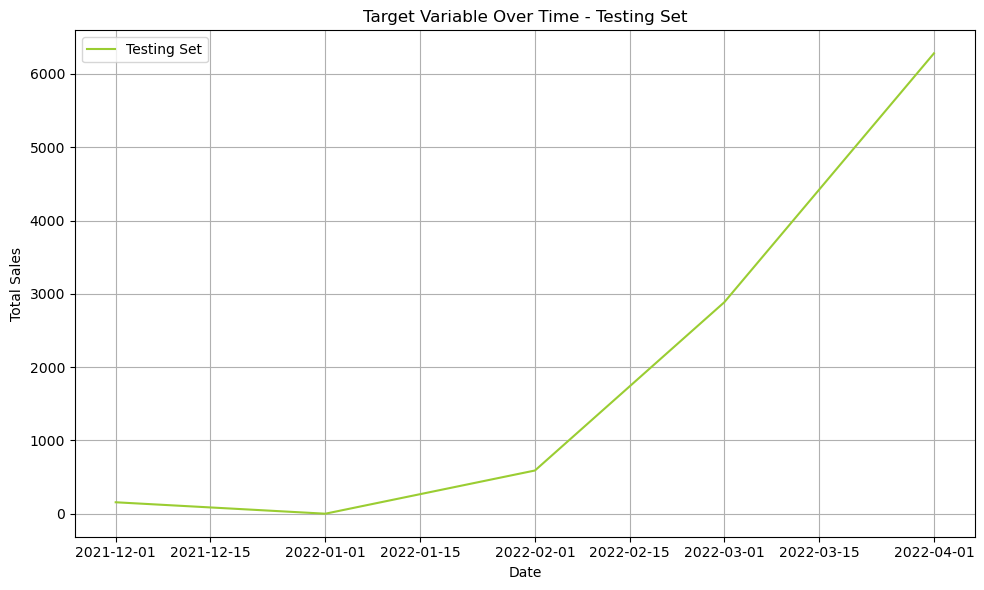

In [443]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_20.index, y_train_20, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_20.index, y_test_20, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Feature Selection

('UK Production Index EE_lag_1', 0.09267441260039483)
('US Machinery and Equipment NEC_lag_5', 0.08178716117165448)
('Germany Production Index EE_lag_4', 0.07145262252106614)
('China Production Index ME_lag_4', 0.06816395592786009)
('UK Producer Prices EE_lag_2', 0.05755404740224461)
('World Production Index EE_lag_1', 0.05736634000264393)
('Italy Shipments Index ME_lag_8', 0.04701368522547485)
('Italy Production Index ME_lag_8', 0.032648465390380826)
('World Energy Price_lag_7', 0.03164928306700681)
('World: Price of Metals  & Minerals_lag_7', 0.03102247381882853)
('Italy Production Index EE_lag_8', 0.026274609749203228)
('Germany Shipments Index ME_lag_8', 0.025630002777253854)
('Europe Production Index ME_lag_8', 0.025592402461465425)
('Japan Production Index ME_lag_8', 0.022207957769528486)
('World Machinery and Equipment NEC_lag_8', 0.02185307262695854)
('World Base Metals Price_lag_7', 0.020898713498198412)
('US Production Index ME_lag_4', 0.019967534916293727)
('World Copper Pri

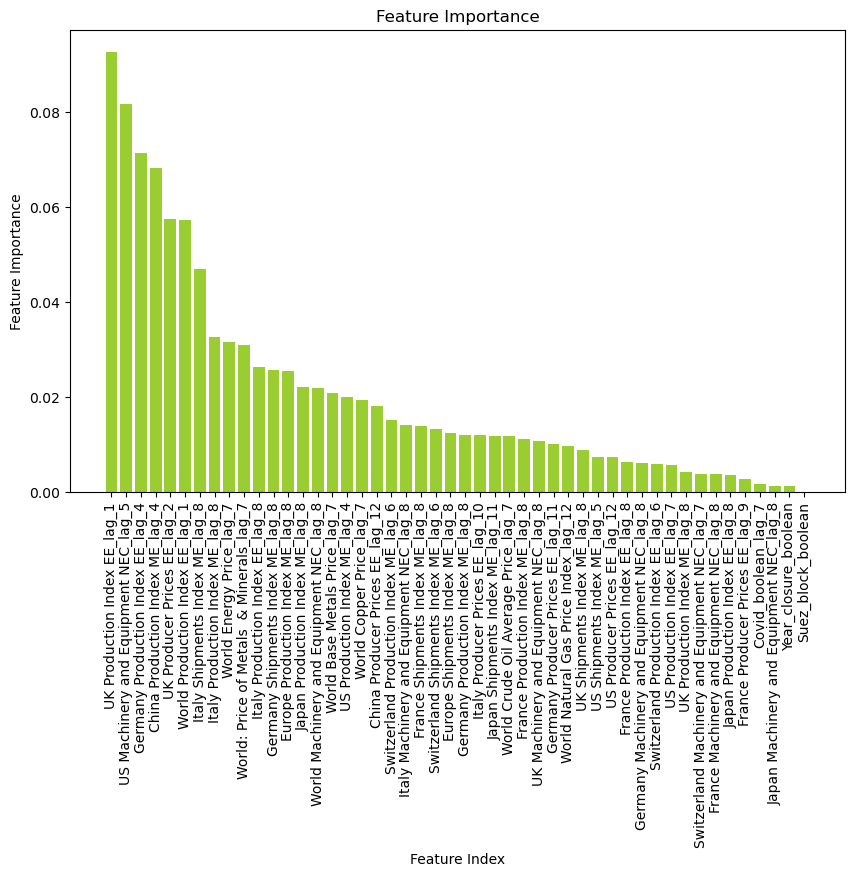

In [444]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_20, y_train_20)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_20, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [445]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_20,y_train_20)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [446]:
selected_feat_20= X.columns[(sel.get_support())]
selected_feat_20 = selected_feat_20.to_list()
len(selected_feat_20)

16

In [447]:
selected_feat_20

['China Production Index ME_lag_4',
 'Germany Shipments Index ME_lag_8',
 'Italy Production Index ME_lag_8',
 'Italy Shipments Index ME_lag_8',
 'Japan Production Index ME_lag_8',
 'Europe Production Index ME_lag_8',
 'World Base Metals Price_lag_7',
 'World Energy Price_lag_7',
 'World: Price of Metals  & Minerals_lag_7',
 'UK Producer Prices EE_lag_2',
 'US Machinery and Equipment NEC_lag_5',
 'World Machinery and Equipment NEC_lag_8',
 'World Production Index EE_lag_1',
 'UK Production Index EE_lag_1',
 'Italy Production Index EE_lag_8',
 'Germany Production Index EE_lag_4']

In [448]:
correlation_matrix = X_train_20[selected_feat_20].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")  

Pair: Italy Production Index ME_lag_8, Italy Production Index EE_lag_8
Correlation: 0.967609430076162
Pair: World Base Metals Price_lag_7, World: Price of Metals  & Minerals_lag_7
Correlation: 0.9886824734679297


In [449]:
# comparing the pairs of features with correlation >0.95 and keeping the feature with the most importance
selected_feat_20.remove('Italy Production Index EE_lag_8')
selected_feat_20.remove('World: Price of Metals  & Minerals_lag_7')

In [450]:
selected_feat_20

['China Production Index ME_lag_4',
 'Germany Shipments Index ME_lag_8',
 'Italy Production Index ME_lag_8',
 'Italy Shipments Index ME_lag_8',
 'Japan Production Index ME_lag_8',
 'Europe Production Index ME_lag_8',
 'World Base Metals Price_lag_7',
 'World Energy Price_lag_7',
 'UK Producer Prices EE_lag_2',
 'US Machinery and Equipment NEC_lag_5',
 'World Machinery and Equipment NEC_lag_8',
 'World Production Index EE_lag_1',
 'UK Production Index EE_lag_1',
 'Germany Production Index EE_lag_4']

In [451]:
df_20_selected = lagged_data_20 [selected_feat_20 + ["GCK_20"]]

In [452]:
# Open the file in binary write mode
with open('df_20_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_20_selected, f)

print(f"Dataset stored in {'df_20_selected.pickle'}")

Dataset stored in df_20_selected.pickle


## Product Group 36

In [453]:
# Create a new dataframe displaying only the sales for GCK 36 
df_36 = extract_product_sales(monthly_sales, 'GCK_36')
df_36.head(10)

,Date,GCK_36
0,2018-10-01,6474.60
1,2018-11-01,21986.89
2,2018-12-01,13924.52
3,2019-01-01,15444.39
4,2019-02-01,8051.15
5,2019-03-01,7373.42
6,2019-04-01,4526.60
7,2019-05-01,16905.32
8,2019-06-01,17296.03
9,2019-07-01,33334.41


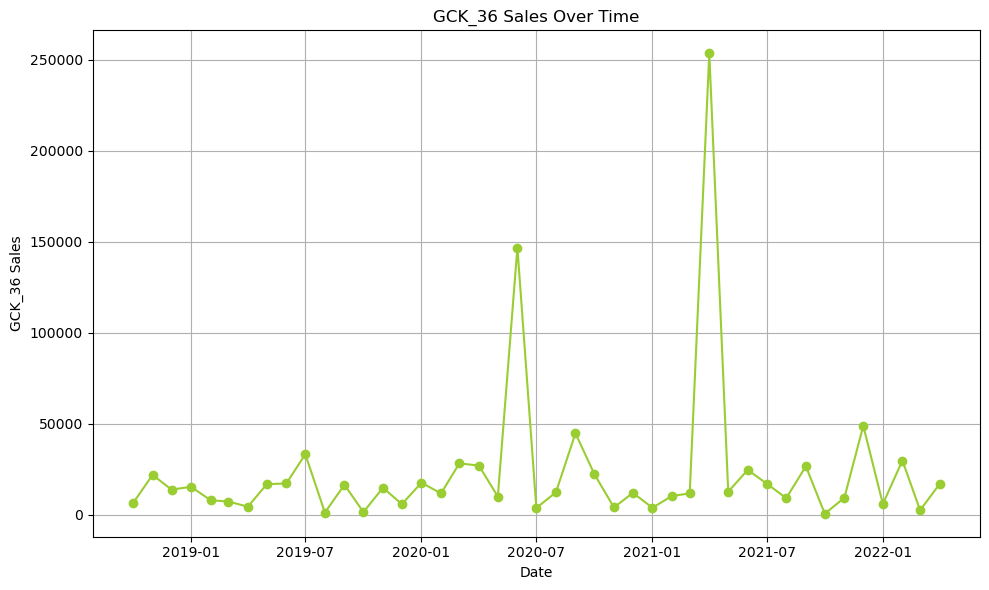

In [454]:
# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_36['Date'], df_36['GCK_36'], marker='o', linestyle='-', color='yellowgreen')

# Adding labels and title
plt.title('GCK_36 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('GCK_36 Sales')

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

We can denote a sales peak in june 2020 and april 2021.

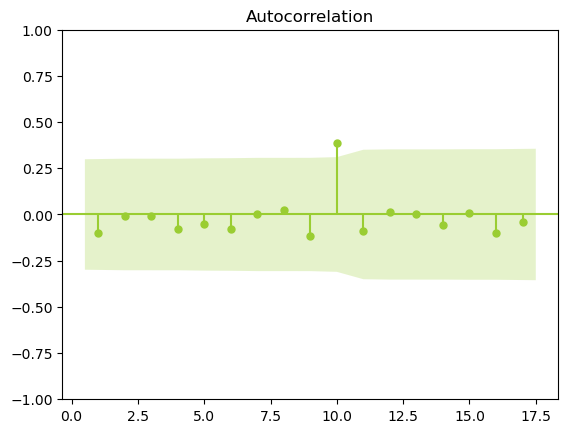

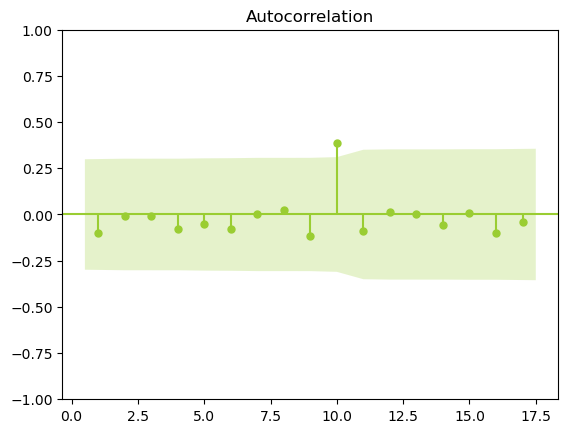

In [455]:
sm.graphics.tsa.plot_acf(df_36['GCK_36'],zero=False)

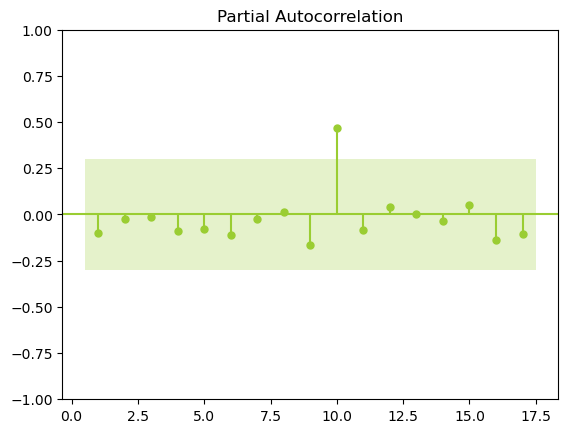

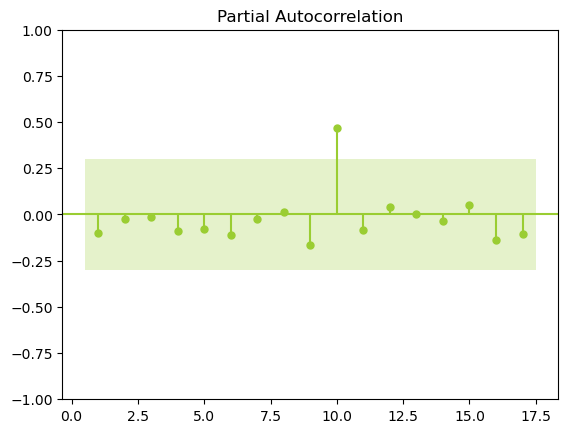

In [456]:
sm.graphics.tsa.plot_pacf(df_36['GCK_36'],zero=False)

In [457]:
# ADF test
result = adfuller(df_36['GCK_36'])
print('ADF test statistic:', result[0])
print('p-value:', result[1])
print('Critical values:', result[4])
if result[1] < 0.05:
    print('The time series is stationary')
else:
    print('The time series is non-stationary')

ADF test statistic: -7.007142159329742
p-value: 7.074123428812795e-10
Critical values: {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895}
The time series is stationary


Product Group 36 is stationary meaning it is not time dependent. it means that its behavior does not exhibit trends, seasonality, or other systematic patterns that would make forecasting difficult.

In [458]:
lagged_data_36 = create_lag_features(merged_data, lag_months=12, exclude_vars=["Year", "Month", "Total Sales"])
lagged_data_36.drop(columns="Total Sales")
lagged_data_36 = lagged_data_36.join(df_36.set_index('Date')[['GCK_36']], how='left')
lagged_data_36.head(10)

,Month,Year,China Production Index ME,France Production Index ME,France Shipments Index ME,Germany Production Index ME,Germany Shipments Index ME,Italy Production Index ME,Italy Shipments Index ME,Japan Production Index ME,...,Suez_block_boolean_lag_4,Suez_block_boolean_lag_5,Suez_block_boolean_lag_6,Suez_block_boolean_lag_7,Suez_block_boolean_lag_8,Suez_block_boolean_lag_9,Suez_block_boolean_lag_10,Suez_block_boolean_lag_11,Suez_block_boolean_lag_12,GCK_36
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,10,2018,211.955755,108.280608,122.451734,124.227879,137.741953,118.350514,122.456894,125.209957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6474.60
2018-11-01,11,2018,220.519655,99.636911,115.958210,127.404132,142.732193,107.719260,120.132032,122.624695,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21986.89
2018-12-01,12,2018,241.846854,94.690312,115.128469,120.518565,141.407661,88.783181,131.936099,122.991956,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13924.52
2019-01-01,1,2019,175.668147,90.143775,108.325154,104.776326,118.703828,99.275113,92.418842,105.514024,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15444.39
2019-02-01,2,2019,175.668147,92.551521,108.944656,109.597012,122.686997,104.586684,103.214212,114.466647,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8051.15
2019-03-01,3,2019,261.642802,107.861788,126.966216,122.534648,140.116214,114.299549,122.454318,141.637717,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7373.42
2019-04-01,4,2019,219.595813,98.677844,114.917432,110.612414,127.512006,99.732969,106.279804,107.150653,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,4526.60
2019-05-01,5,2019,234.169196,94.779550,110.814496,115.712333,131.993634,118.006286,123.261639,108.940926,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,16905.32
2019-06-01,6,2019,261.126350,98.978105,122.045555,108.917455,126.769557,108.231888,121.312004,117.747574,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,17296.03


In [459]:
lagged_data_36.columns.tolist()

['Month',
 'Year',
 'China Production Index ME',
 'France Production Index ME',
 'France Shipments Index ME',
 'Germany Production Index ME',
 'Germany Shipments Index ME',
 'Italy Production Index ME',
 'Italy Shipments Index ME',
 'Japan Production Index ME',
 'Japan Shipments Index ME',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME',
 'UK Shipments Index ME',
 'US Production Index ME',
 'US Shipments Index ME',
 'Europe Production Index ME',
 'Europe Shipments Index ME',
 'World Base Metals Price',
 'World Energy Price',
 'World: Price of Metals  & Minerals',
 'World Natural Gas Price Index',
 'World Crude Oil Average Price',
 'World Copper Price',
 'US Producer Prices EE',
 'UK Producer Prices EE',
 'Italy Producer Prices EE',
 'France Producer Prices EE',
 'Germany Producer Prices EE',
 'China Producer Prices EE',
 'US Machinery and Equipment NEC',
 'World Machinery and Equipment NEC',
 'Switzerland Machinery and Equipment NEC',
 '

In [460]:
correlation = lagged_data_36.corr()["GCK_36"]
print(correlation)

Month                        -0.072134
Year                          0.133490
China Production Index ME     0.203388
France Production Index ME    0.045030
France Shipments Index ME     0.100398
                                ...   
Suez_block_boolean_lag_9           NaN
Suez_block_boolean_lag_10          NaN
Suez_block_boolean_lag_11          NaN
Suez_block_boolean_lag_12          NaN
GCK_36                        1.000000
Name: GCK_36, Length: 628, dtype: float64


In [461]:
highest_corr_columns = []

for name in original_names:
    max_corr = None
    max_corr_col = None
    
    # Search for all the strings that contain the name
    for column in correlation.index:
        if name in column:
            # Check if the correlation is the highest seen so far
            if max_corr is None or abs(correlation[column]) > abs(max_corr):
                max_corr = correlation[column]
                max_corr_col = column
    
    # If a column with the specified name was found
    if max_corr_col:
        highest_corr_columns.append((max_corr_col))

# Print or use the list as needed
print("Columns with highest correlation:", highest_corr_columns)

# Source: ChatGPT

Columns with highest correlation: ['China Production Index ME_lag_1', 'France Production Index ME_lag_12', 'France Shipments Index ME_lag_12', 'Germany Production Index ME_lag_12', 'Germany Shipments Index ME_lag_12', 'Italy Production Index ME_lag_12', 'Italy Shipments Index ME_lag_12', 'Japan Production Index ME_lag_8', 'Japan Shipments Index ME_lag_11', 'Switzerland Production Index ME', 'Switzerland Shipments Index ME', 'UK Production Index ME_lag_12', 'UK Shipments Index ME_lag_2', 'US Production Index ME_lag_11', 'US Shipments Index ME_lag_5', 'Europe Production Index ME_lag_12', 'Europe Shipments Index ME_lag_12', 'World Base Metals Price_lag_12', 'World Energy Price_lag_12', 'World: Price of Metals  & Minerals_lag_12', 'World Natural Gas Price Index_lag_11', 'World Crude Oil Average Price_lag_12', 'World Copper Price_lag_12', 'US Producer Prices EE_lag_12', 'UK Producer Prices EE_lag_4', 'Italy Producer Prices EE_lag_11', 'France Producer Prices EE_lag_12', 'Germany Producer Pr

In [462]:
highest_corr_columns

['China Production Index ME_lag_1',
 'France Production Index ME_lag_12',
 'France Shipments Index ME_lag_12',
 'Germany Production Index ME_lag_12',
 'Germany Shipments Index ME_lag_12',
 'Italy Production Index ME_lag_12',
 'Italy Shipments Index ME_lag_12',
 'Japan Production Index ME_lag_8',
 'Japan Shipments Index ME_lag_11',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Production Index ME_lag_12',
 'UK Shipments Index ME_lag_2',
 'US Production Index ME_lag_11',
 'US Shipments Index ME_lag_5',
 'Europe Production Index ME_lag_12',
 'Europe Shipments Index ME_lag_12',
 'World Base Metals Price_lag_12',
 'World Energy Price_lag_12',
 'World: Price of Metals  & Minerals_lag_12',
 'World Natural Gas Price Index_lag_11',
 'World Crude Oil Average Price_lag_12',
 'World Copper Price_lag_12',
 'US Producer Prices EE_lag_12',
 'UK Producer Prices EE_lag_4',
 'Italy Producer Prices EE_lag_11',
 'France Producer Prices EE_lag_12',
 'Germany Producer Prices EE

In [463]:
# keep only the best lags for each feature
best_lags_36= lagged_data_36[ highest_corr_columns + ["GCK_36"]]
best_lags_36.head(10)

,China Production Index ME_lag_1,France Production Index ME_lag_12,France Shipments Index ME_lag_12,Germany Production Index ME_lag_12,Germany Shipments Index ME_lag_12,Italy Production Index ME_lag_12,Italy Shipments Index ME_lag_12,Japan Production Index ME_lag_8,Japan Shipments Index ME_lag_11,Switzerland Production Index ME,...,Switzerland Production Index EE_lag_10,UK Production Index EE_lag_12,Italy Production Index EE_lag_12,Japan Production Index EE_lag_8,France Production Index EE_lag_12,Germany Production Index EE_lag_12,Year_closure_boolean_lag_10,Covid_boolean_lag_2,Suez_block_boolean,GCK_36
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.077781,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,6474.60
2018-11-01,211.955755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.241491,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,21986.89
2018-12-01,220.519655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,115.405201,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,13924.52
2019-01-01,241.846854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.621788,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,15444.39
2019-02-01,175.668147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,103.838375,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,8051.15
2019-03-01,175.668147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.054962,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,7373.42
2019-04-01,261.642802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.088932,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,4526.60
2019-05-01,219.595813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.122902,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,16905.32
2019-06-01,234.169196,NaN,NaN,NaN,NaN,NaN,NaN,125.209957,NaN,95.156872,...,NaN,NaN,NaN,112.376774,NaN,NaN,NaN,0.0,0,17296.03


In [464]:
len(highest_corr_columns)

48

### Deal with Outliers

In [465]:
# Cap values in column GCK_36 for month 1
best_lags_36.loc[best_lags_36.index.month == 2, 'GCK_36'] = best_lags_36.loc[best_lags_36.index.month == 2, 'GCK_36'].clip(upper=25000)

# Cap values in column GCK_36 for month 2
best_lags_36.loc[best_lags_36.index.month == 4, 'GCK_36'] = best_lags_36.loc[best_lags_36.index.month == 4, 'GCK_36'].clip(upper=200000)

# Cap values in column GCK_36 for month 12
best_lags_36.loc[best_lags_36.index.month == 12, 'GCK_36'] = best_lags_36.loc[best_lags_36.index.month == 12, 'GCK_36'].clip(upper=40000)

# Source: ChatGPT

### Train/ Test Split

This allows you to evaluate your model's performance on multiple test sets across different time periods

In [466]:
X = best_lags_36.drop(columns=['GCK_36'])
y = best_lags_36['GCK_36']

# Define a range of train sizes to try
train_sizes = [0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9] 

best_rmse = np.inf
best_train_size = None
best_test_size = None

# Iterate over different train sizes
for train_size in train_sizes:
    # Calculate corresponding test size
    test_size = 1 - train_size
    
    # Split the data into train and test sets
    X_train_36, X_test_36, y_train_36, y_test_36 = train_test_split(X, y, test_size=test_size, shuffle=False)
    
    # Initialize XGBoost model
    model = XGBRegressor(random_state = 42)
    
    # Train the model
    model.fit(X_train_36, y_train_36)
    
    # Make predictions
    y_pred = model.predict(X_test_36)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_36, y_pred))
    
    # Check if current RMSE is better than the best RMSE found so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_train_size = train_size
        best_test_size = test_size

print("Best Train Size:", best_train_size)
print("Best Test Size:", best_test_size)
print("Best RMSE:", best_rmse)

Best Train Size: 0.9
Best Test Size: 0.09999999999999998
Best RMSE: 16784.294618570253


In [467]:
train_size = len(X_train_36) - len(X_test_36)
print("Size of the sales train set:", train_size)

test_size = len(X_test_36)
print("Size of the market test set:", test_size)

#Source: ChatGPT

Size of the sales train set: 33
Size of the market test set: 5


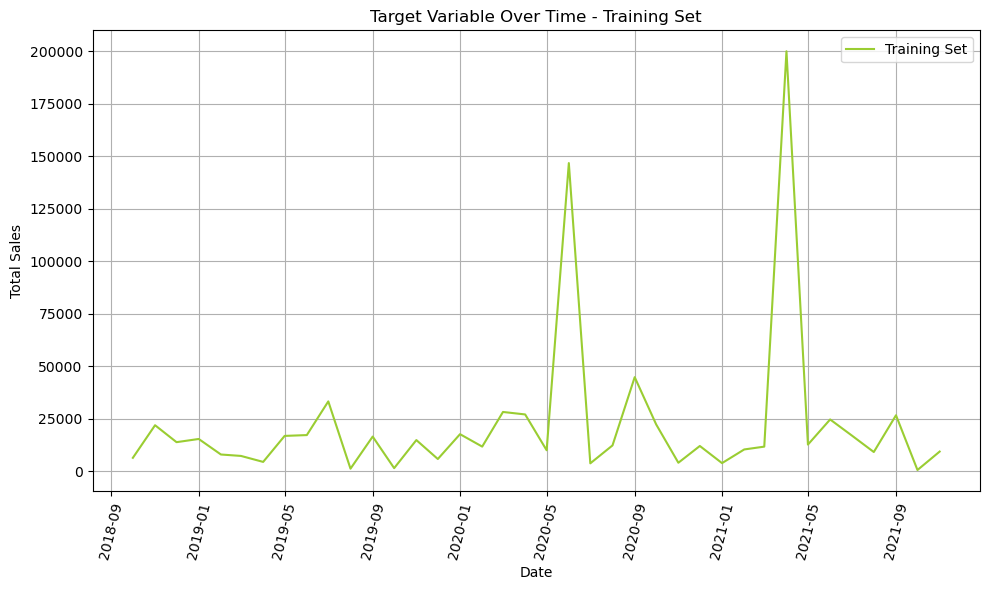

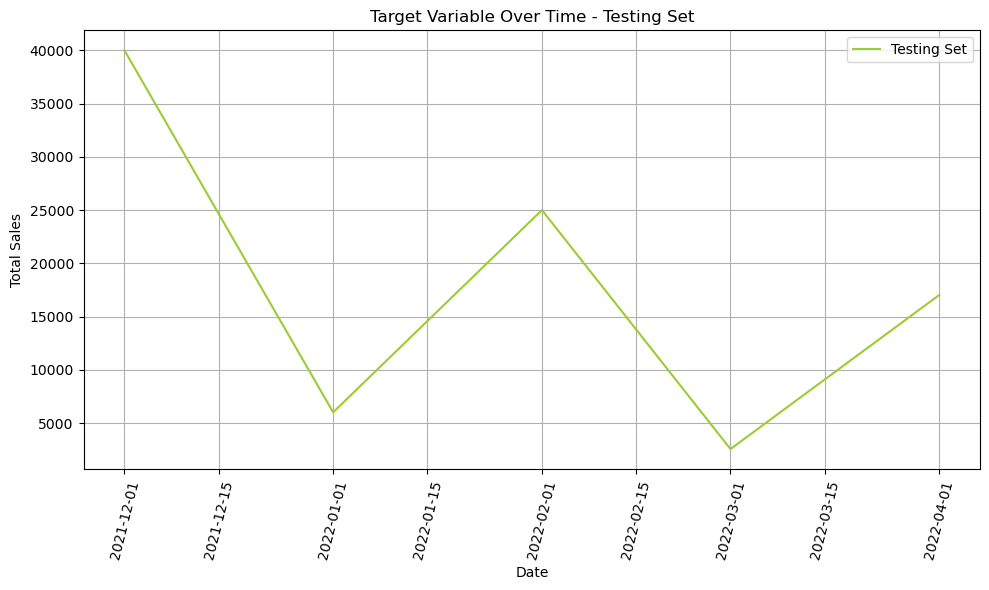

In [468]:
# Plot target variable over time for training set
plt.figure(figsize=(10, 6))
plt.plot(X_train_36.index, y_train_36, label='Training Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Training Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=436)
plt.tight_layout()
plt.show()

# Plot target variable over time for testing set
plt.figure(figsize=(10, 6))
plt.plot(X_test_36.index, y_test_36, label='Testing Set')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Target Variable Over Time - Testing Set')
plt.legend()
plt.grid(True)
plt.xticks(rotation=436)
plt.tight_layout()
plt.show()

### Feature Selection

('US Shipments Index ME_lag_5', 0.08440109666285078)
('UK Producer Prices EE_lag_4', 0.07905194269775037)
('Switzerland Production Index ME', 0.07381252967243357)
('Switzerland Machinery and Equipment NEC_lag_1', 0.05896873084897432)
('UK Shipments Index ME_lag_2', 0.05546393874826706)
('China Production Index ME_lag_1', 0.048343449301246164)
('Switzerland Shipments Index ME', 0.04463290065629827)
('US Production Index EE_lag_12', 0.04049355507106386)
('Japan Shipments Index ME_lag_11', 0.035219237599105)
('World Crude Oil Average Price_lag_12', 0.03285140080862793)
('France Shipments Index ME_lag_12', 0.03178836582567301)
('Italy Shipments Index ME_lag_12', 0.027829982825976395)
('World Base Metals Price_lag_12', 0.02500666637904711)
('Europe Shipments Index ME_lag_12', 0.024692558285543252)
('Japan Production Index EE_lag_8', 0.020919165959776075)
('Germany Production Index EE_lag_12', 0.020321681482252593)
('UK Production Index EE_lag_12', 0.01975358328499103)
('Italy Production Ind

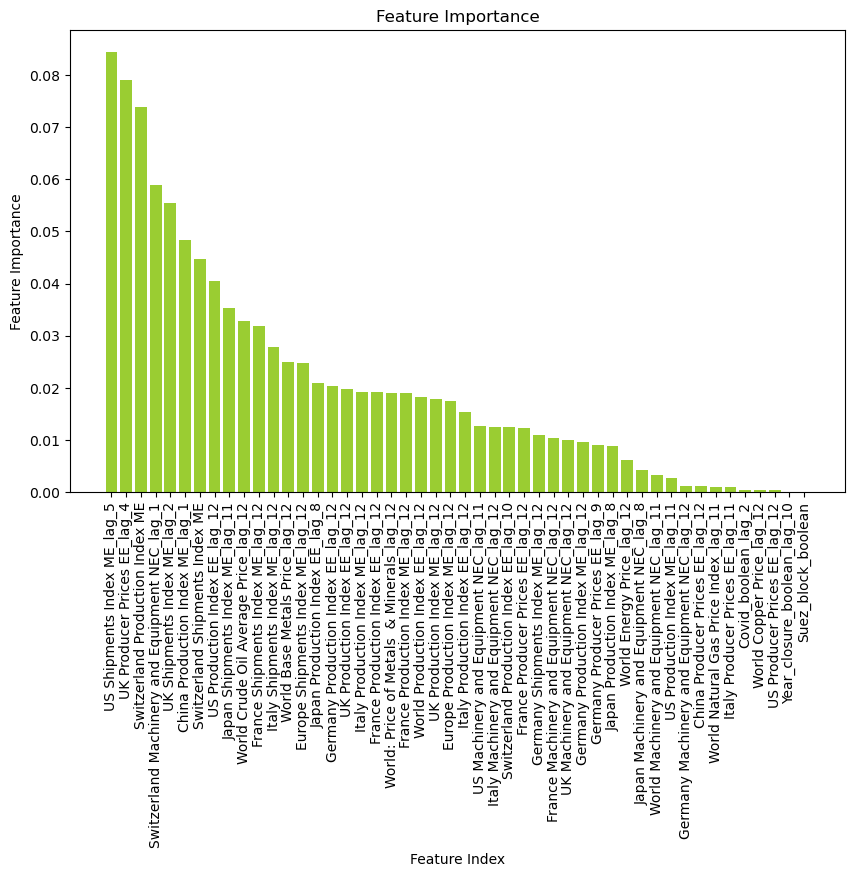

In [469]:
# Train Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_36, y_train_36)
   
feature_importance = model.feature_importances_

feature_importance_pairs = list(zip(X_train_36, feature_importance))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
for pair in feature_importance_pairs:
    print(pair)

#getting feature indices and importance scores
feature_indices, importance_scores = zip(*feature_importance_pairs)

plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_indices)), importance_scores, tick_label=feature_indices, color='yellowgreen')

plt.xticks(range(len(feature_indices)), feature_indices, rotation='vertical')
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

In [470]:
sel = SelectFromModel(RandomForestRegressor(n_estimators = 100, random_state=42))
sel.fit(X_train_36, y_train_36)

SelectFromModel(estimator=RandomForestRegressor(random_state=42))

In [471]:
selected_feat_36= X_train_36.columns[(sel.get_support())]
selected_feat_36 = selected_feat_36.to_list()
len(selected_feat_36)

15

In [472]:
selected_feat_36

['China Production Index ME_lag_1',
 'France Shipments Index ME_lag_12',
 'Italy Shipments Index ME_lag_12',
 'Japan Shipments Index ME_lag_11',
 'Switzerland Production Index ME',
 'Switzerland Shipments Index ME',
 'UK Shipments Index ME_lag_2',
 'US Shipments Index ME_lag_5',
 'Europe Shipments Index ME_lag_12',
 'World Base Metals Price_lag_12',
 'World Crude Oil Average Price_lag_12',
 'UK Producer Prices EE_lag_4',
 'Switzerland Machinery and Equipment NEC_lag_1',
 'US Production Index EE_lag_12',
 'Japan Production Index EE_lag_8']

In [473]:
correlation_matrix = X_train_36[selected_feat_36].corr()

# Iterate through the upper triangular of the correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        # Check if absolute correlation value is above 0.95
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            # Print the pair and their correlation value
            print(f"Pair: {correlation_matrix.columns[i]}, {correlation_matrix.columns[j]}")
            print(f"Correlation: {correlation_matrix.iloc[i, j]}")  

Pair: Switzerland Production Index ME, Switzerland Shipments Index ME
Correlation: 0.9968480636471947


In [474]:
# comparing the pairs of features with correlation >0.95 and keeping the feature with the most importance
selected_feat_36.remove('Switzerland Shipments Index ME')

In [475]:
selected_feat_36

['China Production Index ME_lag_1',
 'France Shipments Index ME_lag_12',
 'Italy Shipments Index ME_lag_12',
 'Japan Shipments Index ME_lag_11',
 'Switzerland Production Index ME',
 'UK Shipments Index ME_lag_2',
 'US Shipments Index ME_lag_5',
 'Europe Shipments Index ME_lag_12',
 'World Base Metals Price_lag_12',
 'World Crude Oil Average Price_lag_12',
 'UK Producer Prices EE_lag_4',
 'Switzerland Machinery and Equipment NEC_lag_1',
 'US Production Index EE_lag_12',
 'Japan Production Index EE_lag_8']

In [476]:
df_36_selected = lagged_data_36 [selected_feat_36 + ["GCK_36"]]

In [477]:
# Open the file in binary write mode
with open('df_36_selected.pickle', 'wb') as f:
    # Use pickle.dump() to serialize and store the dataset
    pickle.dump(df_36_selected, f)

print(f"Dataset stored in {'df_36_selected.pickle'}")

Dataset stored in df_36_selected.pickle


-------